# **DATA 6250**
# **Machine Learning for Data Science**
## **Final Project**
## **Pre-Processing of Data**
## **Normalization of Data**
### ***REFERENCE: EPOCH AI***
### ***Links to Dataset:***
- *Notable AI Models* : https://epoch.ai/data/notable_ai_models.csv
- *Large-Scale AI Models* : https://epoch.ai/data/large_scale_ai_models.csv
- *ML Hardware* : https://epoch.ai/data/ml_hardware.csv

#### Done By: Rohan Pratap Reddy Ravula
#### School of Computing and Data Science
#### Wentworth Institute of Technology

### Mount Google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Import Libraries

In [ ]:
!pip install -U scikit-learn
!pip install -U matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 48.4 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.10.0
    Uninstalling matplotlib-3.10.0:
      Successfully uninstalled matplotlib-3.10.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
from contextlib import redirect_stdout
from tqdm import tqdm
tqdm.pandas()
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    median_absolute_error,
    r2_score,
    explained_variance_score,
    mean_absolute_percentage_error,
    mean_squared_log_error,
    log_loss,
    brier_score_loss,
    roc_auc_score,
)
from typing import Optional

### Import File

In [ ]:
input_path = "/content/drive/MyDrive/DATA 6250/Datasets/Updated/Final/AI_models.csv"
df = pd.read_csv(input_path)
df.head()

,Model,Domain,Country,Organization,Date,Category,Task,Confidence,accessibility,Training dataset,...,Hardware unit Compute OPS,Hardware unit Memory Size (bytes),Epochs,Batch size,Hardware utilization,Parameters,Training compute (FLOP),Finetune compute (FLOP),Power draw (W),Training compute cost
0,AFM-on-device,Language,USA,Apple,2024-07-29,Industry,Language modeling/generation,Confident,Hosted access (no API),Not-defined,...,9.180000e+14,9.500000e+10,1,18949752,0.5200,2.730000e+09,4.512600e+23,1877.162158,7.883066e+05,2.839663e+07
1,AFM-server,Language,USA,Apple,2024-07-29,Industry,Language modeling/generation,Likely,Hosted access (no API),Not-defined,...,2.750000e+14,3.200000e+10,1,18949752,0.5200,2.730000e+09,4.300000e+24,1877.162158,3.466814e+06,5.567758e+07
2,AlexaTM 20B,Language,USA,Amazon,2022-08-02,Industry,Language modeling,Confident,API access,"mC4,Wikipedia",...,6.240000e+14,4.000000e+10,2,2000000,0.4935,1.975000e+10,2.043740e+23,1877.162158,1.136431e+05,1.293528e+06
3,AlexaTM 20B,Language,USA,Amazon,2022-08-02,Industry,Question answering,Confident,API access,"mC4,Wikipedia",...,6.240000e+14,4.000000e+10,2,2000000,0.4935,1.975000e+10,2.043740e+23,1877.162158,1.136431e+05,1.293528e+06
4,AlexaTM 20B,Language,USA,Amazon,2022-08-02,Industry,Translation,Confident,API access,"mC4,Wikipedia",...,6.240000e+14,4.000000e+10,2,2000000,0.4935,1.975000e+10,2.043740e+23,1877.162158,1.136431e+05,1.293528e+06


### PreProcessing
#### Removing Dependent Values

In [ ]:
out_cols=df.columns.tolist()[-5:]

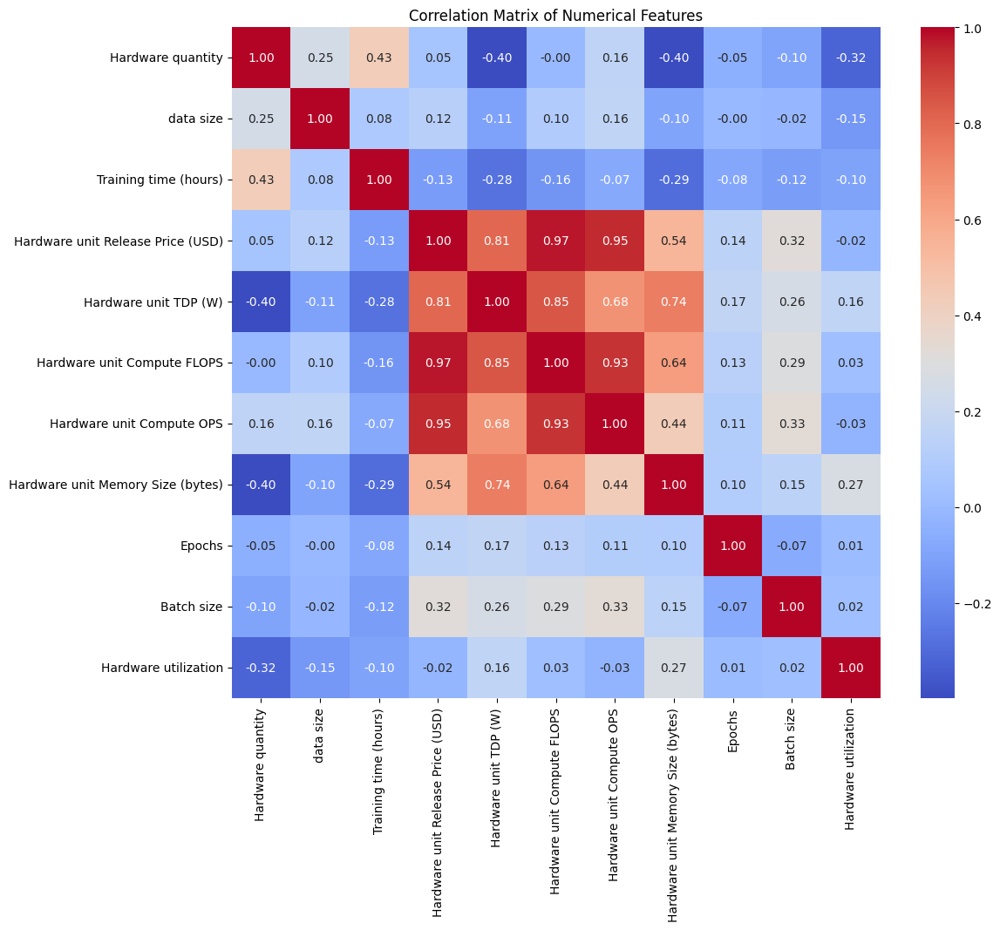

In [ ]:
numerical_features = df.select_dtypes(include=[np.number]).columns
numerical_cols = [col for col in numerical_features if col not in out_cols]
correlation_matrix = df[numerical_cols].corr()

# Display the correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()


In [ ]:
# prompt: give me function to find columns with highest correration. output should be list of column names

def get_highest_correlation_columns(correlation_matrix, threshold=0.8):
  """
  Finds columns with the highest correlation above a specified threshold.

  Args:
    correlation_matrix: A pandas DataFrame representing the correlation matrix.
    threshold: The minimum correlation coefficient for columns to be considered.

  Returns:
    A list of column names that exceed the correlation threshold.
  """

  # Create a copy to avoid modifying the original DataFrame
  corr_matrix = correlation_matrix.copy()

  # Set diagonal values to 0 to avoid self-correlation
  np.fill_diagonal(corr_matrix.values, 0)

  # Find the columns with the highest absolute correlation above the threshold
  correlated_pairs = []
  for col in corr_matrix.columns:
    correlated_cols = corr_matrix[col][corr_matrix[col].abs() > threshold].index.tolist()
    if correlated_cols:
      correlated_pairs.extend([(col, c) for c in correlated_cols if col < c])

  # Extract unique column names from the pairs
  highest_correlation_columns = sorted(list(set([col for pair in correlated_pairs for col in pair])))
  return highest_correlation_columns




In [ ]:
high_corr_cols = get_highest_correlation_columns(df[numerical_cols].corr())
print(high_corr_cols)

['Hardware unit Compute FLOPS', 'Hardware unit Compute OPS', 'Hardware unit Release Price (USD)', 'Hardware unit TDP (W)']


In [ ]:
df_new = df.copy()
df_new = df_new.drop(columns=high_corr_cols)
num_cols = [col for col in df_new.select_dtypes(include=[np.number]).columns if col not in out_cols]

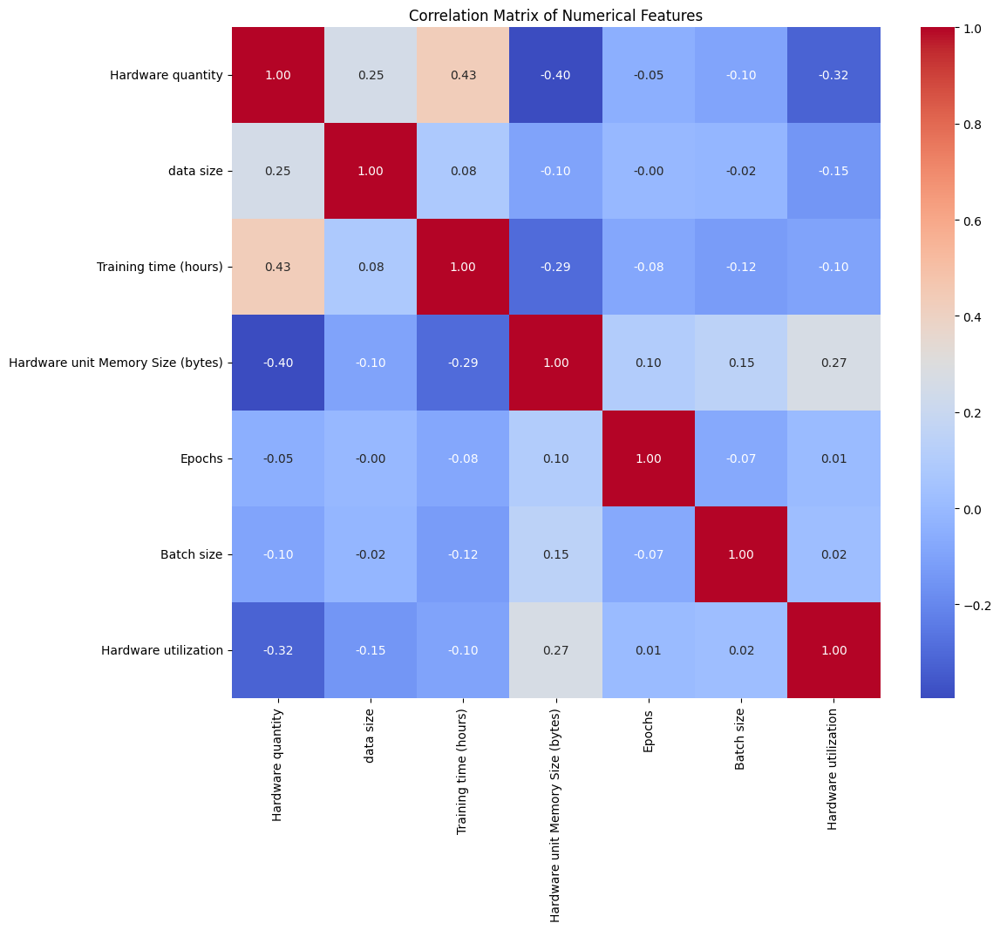

In [ ]:
correlation_matrix = df_new[num_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

### PreProcessing
#### Removing Outliers

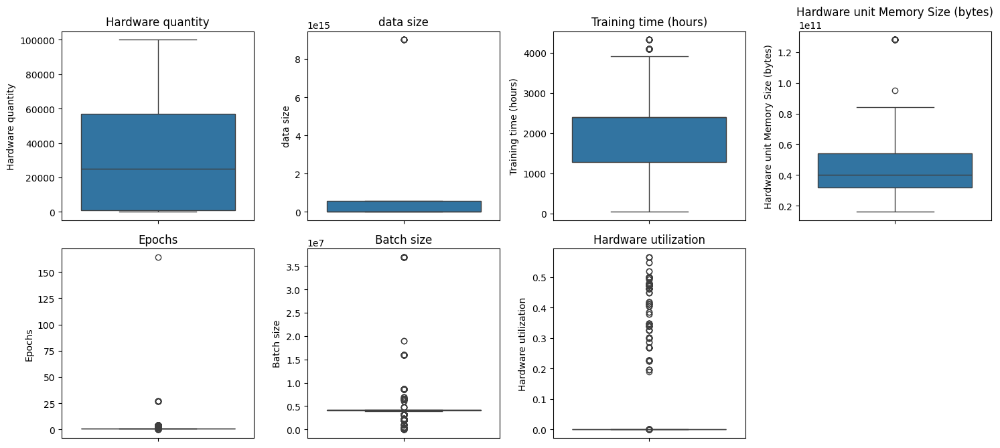

In [ ]:
# prompt: give me code to plot box plot to find any outliers in the features

# Create box plots for each numerical feature to identify outliers
plt.figure(figsize=(15, 10))
for i, col in enumerate(num_cols):
    plt.subplot(3, 4, i + 1)  # Adjust the subplot grid as needed
    sns.boxplot(y=df_new[col])
    plt.title(col)
plt.tight_layout()
plt.show()


In [ ]:
df_new.loc[df_new['Epochs']>=10,'Epochs'] = 3
print(df_new['Epochs'].unique())

[1 2 4 0 3]


In [ ]:
def clean_df(df_new):
  df_new.loc[df_new['Epochs']>=10,'Epochs'] = 3
  df_new['data size'] = pd.to_numeric(df_new['data size'], errors='coerce')
  mean_data_size = df_new['data size'].dropna().mean()
  df_new['data size'] = df_new['data size'].fillna(mean_data_size)
  df_new['data size'] = df_new['data size'].astype(int)
  df_new.loc[df_new['data size'] > 2e+11,'data size'] = np.nan
  mean_data_size = df_new['data size'].dropna().mean()
  df_new['data size'] = df_new['data size'].fillna(mean_data_size)
  df_new['data size'] = df_new['data size'].astype(int)
  df_new['Epochs'] = df_new['Epochs'].astype(int)
  df_new['Batch size'] = pd.to_numeric(df_new['Batch size'], errors='coerce')
  mean_batch_size = df_new['Batch size'].dropna().mean()
  df_new['Batch size'] = df_new['Batch size'].fillna(mean_batch_size)
  df_new['Batch size'] = df_new['Batch size'].astype(int)
  df_new.loc[df_new['Batch size'] >= 15000000,'Batch size'] = np.nan
  mean_batch_size = df_new['Batch size'].dropna().mean()
  df_new['Batch size'] = df_new['Batch size'].fillna(mean_batch_size)
  df_new['Batch size'] = df_new['Batch size'].astype(int)
  df_new['Hardware unit Memory Size (bytes)'] = pd.to_numeric(df_new['Hardware unit Memory Size (bytes)'], errors='coerce')
  mean_memory_size = df_new['Hardware unit Memory Size (bytes)'].dropna().mean()
  df_new['Hardware unit Memory Size (bytes)'] = df_new['Hardware unit Memory Size (bytes)'].fillna(mean_memory_size)
  df_new.loc[df_new['Hardware unit Memory Size (bytes)'] >=0.8e+11,'Hardware unit Memory Size (bytes)'] = np.nan
  mean_memory_size = df_new['Hardware unit Memory Size (bytes)'].dropna().mean()
  df_new['Hardware unit Memory Size (bytes)'] = df_new['Hardware unit Memory Size (bytes)'].fillna(mean_memory_size)
  df_new['Hardware unit Memory Size (bytes)'] = df_new['Hardware unit Memory Size (bytes)'].astype(int)
  df_new['Training time (hours)'] = pd.to_numeric(df_new['Training time (hours)'], errors='coerce')
  df_new.loc[df_new['Training time (hours)'] >= 3000,'Training time (hours)'] = np.nan
  mean_training_time = df_new['Training time (hours)'].dropna().mean()
  df_new['Training time (hours)'] = df_new['Training time (hours)'].fillna(mean_training_time)
  return df_new

In [ ]:
df_new = clean_df(df_new)

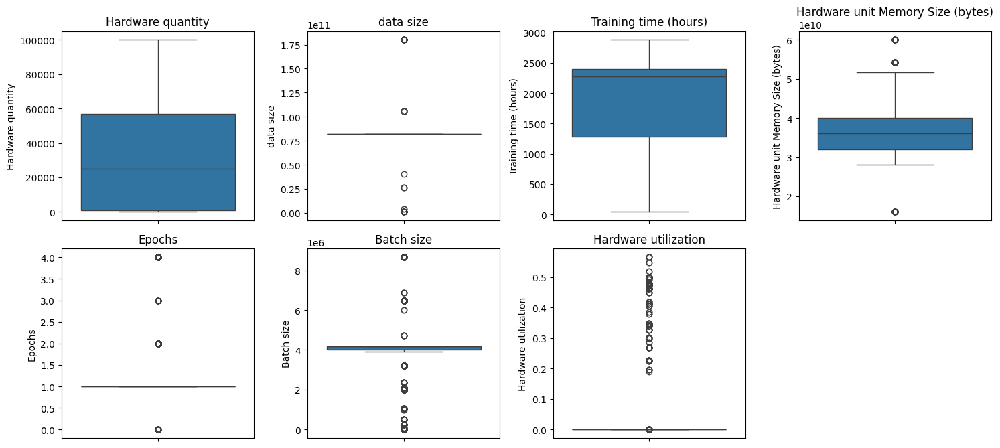

In [ ]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(num_cols):
    plt.subplot(3, 4, i + 1)  # Adjust the subplot grid as needed
    sns.boxplot(y=df_new[col])
    plt.title(col)
plt.tight_layout()
plt.show()


### PreProcessing
#### Encoding Categorical Values

In [ ]:
def encode_df_column(df, column,le):
    """
    Encodes a categorical DataFrame column using LabelEncoder and
    adds a new column with the encoded labels.

    Parameters:
        df (pd.DataFrame): The input DataFrame.
        column (str): The name of the categorical column to encode.

    Returns:
        le (LabelEncoder): The fitted LabelEncoder instance.
        df (pd.DataFrame): The DataFrame with an additional column
                           containing encoded labels (column name: '<column>_encoded').
    """
    df[column + '_encoded'] = le.fit_transform(df[column])
    return df

def decode_df_column(df, column, le, encoded_column=None):
    """
    Decodes an encoded DataFrame column back to the original categories using
    the provided LabelEncoder.

    Parameters:
        df (pd.DataFrame): The input DataFrame.
        column (str): The original categorical column name.
        le (LabelEncoder): A LabelEncoder fitted on the original column.
        encoded_column (str, optional): The name of the encoded column.
                                        If None, defaults to '<column>_encoded'.

    Returns:
        df (pd.DataFrame): The DataFrame with an additional column
                           containing the decoded labels (column name: '<column>_decoded').
    """
    if encoded_column is None:
        encoded_column = column + '_encoded'
    df[column + '_decoded'] = le.inverse_transform(df[encoded_column])
    return df

In [ ]:
obj_col = [col for col in df_new.select_dtypes(include=['object']).columns if col not in (out_cols + ['Model','text'])]
print(obj_col)

['Domain', 'Country', 'Organization', 'Date', 'Category', 'Task', 'Confidence', 'accessibility', 'Training dataset', 'Training code accessibility', 'Training hardware', 'Notability']


In [ ]:
df_new1 = df_new.copy()
le = LabelEncoder()
for col in obj_col:
    df_new1 = encode_df_column(df_new1, col,le)
df_new1.columns

Index(['Model', 'Domain', 'Country', 'Organization', 'Date', 'Category',
       'Task', 'Confidence', 'accessibility', 'Training dataset',
       'Training code accessibility', 'Training hardware', 'Notability',
       'text', 'Hardware quantity', 'data size', 'Training time (hours)',
       'Hardware unit Memory Size (bytes)', 'Epochs', 'Batch size',
       'Hardware utilization', 'Parameters', 'Training compute (FLOP)',
       'Finetune compute (FLOP)', 'Power draw (W)', 'Training compute cost',
       'Model_encoded', 'Domain_encoded', 'Country_encoded',
       'Organization_encoded', 'Date_encoded', 'Category_encoded',
       'Task_encoded', 'Confidence_encoded', 'accessibility_encoded',
       'Training dataset_encoded', 'Training code accessibility_encoded',
       'Training hardware_encoded', 'Notability_encoded', 'text_encoded'],
      dtype='object')

In [ ]:
num_cols = [col for col in df_new1.select_dtypes(include=[np.number]).columns if col not in out_cols]
obj_col = [col for col in df_new1.select_dtypes(include=['object']).columns if col not in (out_cols)]
print(obj_col)
print(num_cols)
print(out_cols)

['Model', 'Domain', 'Country', 'Organization', 'Date', 'Category', 'Task', 'Confidence', 'accessibility', 'Training dataset', 'Training code accessibility', 'Training hardware', 'Notability', 'text']
['Hardware quantity', 'data size', 'Training time (hours)', 'Hardware unit Memory Size (bytes)', 'Epochs', 'Batch size', 'Hardware utilization', 'Model_encoded', 'Domain_encoded', 'Country_encoded', 'Organization_encoded', 'Date_encoded', 'Category_encoded', 'Task_encoded', 'Confidence_encoded', 'accessibility_encoded', 'Training dataset_encoded', 'Training code accessibility_encoded', 'Training hardware_encoded', 'Notability_encoded', 'text_encoded']
['Parameters', 'Training compute (FLOP)', 'Finetune compute (FLOP)', 'Power draw (W)', 'Training compute cost']


In [ ]:
df_org = df_new1.copy()
df_org.columns
org_num_cols = num_cols

In [ ]:
df_new = df_new1[obj_col + num_cols + out_cols]
df_new.columns

Index(['Model', 'Domain', 'Country', 'Organization', 'Date', 'Category',
       'Task', 'Confidence', 'accessibility', 'Training dataset',
       'Training code accessibility', 'Training hardware', 'Notability',
       'text', 'Hardware quantity', 'data size', 'Training time (hours)',
       'Hardware unit Memory Size (bytes)', 'Epochs', 'Batch size',
       'Hardware utilization', 'Model_encoded', 'Domain_encoded',
       'Country_encoded', 'Organization_encoded', 'Date_encoded',
       'Category_encoded', 'Task_encoded', 'Confidence_encoded',
       'accessibility_encoded', 'Training dataset_encoded',
       'Training code accessibility_encoded', 'Training hardware_encoded',
       'Notability_encoded', 'text_encoded', 'Parameters',
       'Training compute (FLOP)', 'Finetune compute (FLOP)', 'Power draw (W)',
       'Training compute cost'],
      dtype='object')

In [ ]:
num_cols = df_new.select_dtypes(include=[np.number]).columns
scaler = StandardScaler()
df_new[num_cols] = scaler.fit_transform(df_new[num_cols])

In [ ]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1705 entries, 0 to 1704
Data columns (total 38 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Model                                1705 non-null   object 
 1   Domain                               1705 non-null   object 
 2   Country                              1705 non-null   object 
 3   Organization                         1705 non-null   object 
 4   Date                                 1705 non-null   object 
 5   Category                             1705 non-null   object 
 6   Task                                 1705 non-null   object 
 7   Confidence                           1705 non-null   object 
 8   accessibility                        1705 non-null   object 
 9   Training dataset                     1705 non-null   object 
 10  Training code accessibility          1705 non-null   object 
 11  Training hardware             

In [ ]:
df_new.columns
out_cols

['Parameters',
 'Training compute (FLOP)',
 'Finetune compute (FLOP)',
 'Power draw (W)',
 'Training compute cost']

In [ ]:
num_cols = [col for col in df_new.select_dtypes(include= np.number) if col not in out_cols]
num_cols

['Hardware quantity',
 'data size',
 'Training time (hours)',
 'Hardware unit Memory Size (bytes)',
 'Epochs',
 'Batch size',
 'Hardware utilization',
 'Domain_encoded',
 'Country_encoded',
 'Organization_encoded',
 'Date_encoded',
 'Category_encoded',
 'Task_encoded',
 'Confidence_encoded',
 'accessibility_encoded',
 'Training dataset_encoded',
 'Training code accessibility_encoded',
 'Training hardware_encoded',
 'Notability_encoded']

### Creating Functions for error metrics and ML models

### Models Used - Linear Regression along with ridge, lasso, SVR, Gradient Boosting, Random Forest Regressor, Decision Tree Regressor

In [ ]:
def get_error_metrics(y_test, y_predict, p=1):
  n = len(y_test)
  y_test_clipped = np.clip(y_test, a_min=1e-6, a_max=None)
  y_predict_clipped = np.clip(y_predict, a_min=1e-6, a_max=None)
  out_dict = dict(
      Mean_Absolute_Error = mean_absolute_error(y_test, y_predict),
      Mean_Squared_Error = mean_squared_error(y_test, y_predict),
      Root_Mean_Squared_Error = np.sqrt(mean_squared_error(y_test, y_predict)),
      Median_Absolute_Error = median_absolute_error(y_test, y_predict),
      Mean_Absolute_Percentage_Error = mean_absolute_percentage_error(y_test, y_predict),
      Mean_Squared_Log_Error = mean_squared_log_error(y_test_clipped, y_predict_clipped),
      R2 = r2_score(y_test, y_predict),
      Explained_Variance = explained_variance_score(y_test, y_predict),
      Log_Cosh_Error = np.mean(np.log(np.cosh(y_predict - y_test))),
      Relative_Absolute_Error = np.sum(np.abs(y_test - y_predict)) / np.sum(np.abs(y_test - np.mean(y_test))),
      Root_Relative_Squared_Error = np.sqrt(np.sum((y_test - y_predict) ** 2) / np.sum((y_test - np.mean(y_test)) ** 2)),
      Adjusted_R2 = 1 - (1 - r2_score(y_test, y_predict)) * ((n - 1) / (n - p - 1))
  )
  return out_dict


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
import matplotlib.pyplot as plt

def Apply_Linear_Regression(data,
                            _in_cols,
                            _out_cols,
                            split_percent,
                            error_vals:Optional[dict]=None,
                            if_error_store=False,
                            display_error=True,
                            _type='linear',
                            alpha=1.0,
                            title="Normal features",
                            if_sequential=False,
                            show_max_feature_graph=True,
                            select_data_type='all',
                            verbose=True):
  stream = sys.stdout if verbose else open(os.devnull, 'w')
  with redirect_stdout(stream):
    try:
      for col in _in_cols:
        data[col] = data[col].astype(float)
    except Exception as e:
      print(f"for the given columns {[_in_cols]} error is {e}")
      print(f"Couldn't apply regression")
      return
    try:
      for col in _out_cols:
        data[col] = data[col].astype(float)
    except Exception as e:
      print(f"for the given columns {[_out_cols]} error is {e}")
      print(f"Couldn't apply regression")
      return
    X = data[_in_cols]
    for col in _out_cols:
      y = data[col]
      X_train,X_test,y_train,y_test = train_test_split(X,
                                                       y,
                                                       test_size=split_percent,
                                                       train_size=1-split_percent,
                                                       shuffle=True,
                                                       random_state=123)

      if _type == 'linear':
        model = LinearRegression()
      elif _type == 'ridge':
        model = Ridge(alpha=alpha)
      elif _type == 'lasso':
        model = Lasso(alpha=alpha)
      model.fit(X_train,y_train)
      y_pred = model.predict(X_test)
      # Calculating error metrics
      print(title)
      err_dict = get_error_metrics(y_test,y_pred,len(X.columns))
      if display_error:
        print(f"Showing Errors for {col}")
        errs = ''.join([f"The {key} Error is: {value}\n" for key, value in err_dict.items()])
        print(errs)
        print("-"*50)
      if if_error_store:
        if error_vals is None:
          error_vals = {}
        error_vals[col] = err_dict
      # Plotting for max feature graph
      if show_max_feature_graph:
        coefficients = model.coef_
        print("Regression Coefficients for each feature:")
        for feat, coef in zip(_in_cols, coefficients):
          print(f"{feat}: {coef}")
        coefficients = np.abs(coefficients)
        main_feature = _in_cols[np.argmax(coefficients)]
        print(f"The main feature is {main_feature}")
        if select_data_type == 'all':
          x_feature = data[main_feature]
          y_feature = data[col]
        elif select_data_type == 'train':
          x_feature = X_train[main_feature]
          y_feature = y_train
        elif select_data_type == 'test':
          x_feature = X_test[main_feature]
          y_feature = y_test
        else:
          print("Invalid data type")
          return
        plt.figure(figsize=(8,6))
        plt.scatter(x_feature,y_feature,color='blue',label=f"Actual Values for {col}")
        main_model = LinearRegression()
        main_model.fit(x_feature.values.reshape(-1,1),y_feature)
        x_range = np.linspace(x_feature.min(),x_feature.max(),100).reshape(-1,1)
        y_line = main_model.predict(x_range)
        plt.plot(x_range, y_line, color='red', label='Regression line')
        plt.xlabel(main_feature)
        plt.ylabel(col)
        plt.title(f'Scatter Plot: {main_feature} vs {col} with Regression Line for the model of type {_type} and for feature {col}')
        plt.legend()
        plt.show()
        print("-"*50)
      if if_sequential:
        X = pd.concat([X,data[col]],axis=1)
    if not verbose:
      stream.close()


In [ ]:
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance

def Apply_SVR(data,
              _in_cols,
              _out_cols,
              split_percent,
              error_vals:Optional[dict]=None,
              if_error_store=False,
              display_error=True,
              kernel='linear',
              C = 1,
              gamma='scale',
              max_iter = 10000,
              title='Generalized SVR',
              if_sequential=False,
              show_max_feature_graph=True,
              select_data_type='all',
              verbose=True):
  stream = sys.stdout if verbose else open(os.devnull, 'w')
  with redirect_stdout(stream):
      try:
          for col in _in_cols:
              data[col] = data[col].astype(float)
      except Exception as e:
          print(f"for the given columns {[_in_cols]} error is {e}")
          print(f"Couldn't apply regression")
          return
      try:
          for col in _out_cols:
              data[col] = data[col].astype(float)
      except Exception as e:
          print(f"for the given columns {[_out_cols]} error is {e}")
          print(f"Couldn't apply regression")
          return
      X = data[_in_cols]
      for col in _out_cols:
          y = data[col]
          X_train, X_test, y_train, y_test = train_test_split(X,
                                                              y,
                                                              test_size=split_percent,
                                                              train_size=1 - split_percent,
                                                              shuffle=True,
                                                              random_state=123)
          # Create a pipeline with StandardScaler and SVR
          pipeline = Pipeline([
              ('scaler', StandardScaler()),  # Scale the features
              ('svr', SVR(kernel=kernel, C=C, gamma=gamma, max_iter=max_iter))  # Use the specified kernel
          ])
          pipeline.fit(X_train, y_train)
          y_pred = pipeline.predict(X_test)
          # Calculating Errors
          print(title + f"on kernel {kernel}, C:{C}, gamma = {gamma}\n")
          err_dict = get_error_metrics(y_test, y_pred, len(X.columns))
          if display_error:
              print(f"Showing Errors for {col}")
              errs = ''.join([f"The {key} Error is: {value}\n" for key, value in err_dict.items()])
              print(errs)
              print("-" * 50)
          if if_error_store:
              if error_vals is None:
                  error_vals = {}
              error_vals[col] = err_dict

          # Plotting for max feature graph
          if show_max_feature_graph:
              result = permutation_importance(pipeline,
                                              X_test,
                                              y_test,
                                              scoring='neg_mean_squared_error',
                                              n_repeats=10,
                                              random_state=42, n_jobs=-1)
              importances = result.importances_mean
              features = X_test.columns
              for feat, imp in zip(features, importances):
                  print(f"{feat}: {imp}")
              best_idx = np.argmax(importances)
              best_feature = features[best_idx]
              print(f"\nMost influential feature according to permutation importance: {best_feature}")
              if select_data_type == 'all':
                  x_feature = data[best_feature]
                  y_feature = data[col]
              elif select_data_type == 'train':
                  x_feature = X_train[best_feature]
                  y_feature = y_train
              elif select_data_type == 'test':
                  x_feature = X_test[best_feature]
                  y_feature = y_test
              else:
                  print("Invalid data type")
                  return
              svr_uni_pipeline = Pipeline([
                  ('scaler', StandardScaler()),
                  ('svr', SVR(kernel=kernel, C=C, gamma=gamma, max_iter=max_iter))
              ])
              svr_uni_pipeline.fit(x_feature.values.reshape(-1, 1), y_feature)
              x_range = np.linspace(x_feature.min(), x_feature.max(), 100)
              x_range_reshaped = x_range.reshape(-1, 1)
              y_line = svr_uni_pipeline.predict(x_range_reshaped)
              plt.figure(figsize=(8, 6))
              plt.scatter(x_feature, y_feature, color='blue', label='Data points')
              plt.plot(x_range, y_line, color='red', label='SVR Prediction curve')
              plt.xlabel(best_feature)
              plt.ylabel(col)
              plt.title(f'Scatter Plot: {best_feature} vs. {col} with SVR Prediction Curve')
              plt.legend()
              plt.show()
          if if_sequential:
              X = pd.concat([X, data[col]], axis=1)
  if not verbose:
      stream.close()

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor


def Apply_Gradient_Boosting_Regressor(data,
                                      _in_cols,
                                      _out_cols,
                                      split_percent,
                                      error_vals:Optional[dict]=None,
                                      if_error_store=False,
                                      display_error=True,
                                      n_estimators=100,
                                      learning_rate=0.3,
                                      max_depth=1,
                                      title='Generalized Gradient Boosting',
                                      if_sequential=False,
                                      show_max_feature_graph=True,
                                      select_data_type='all',
                                      verbose=False):
  stream = sys.stdout if verbose else open(os.devnull, 'w')
  with redirect_stdout(stream):
      try:
          for col in _in_cols:
              data[col] = data[col].astype(float)
      except Exception as e:
          print(f"for the given columns {[_in_cols]} error is {e}")
          print(f"Couldn't apply regression")
          return
      try:
          for col in _out_cols:
              data[col] = data[col].astype(float)
      except Exception as e:
          print(f"for the given columns {[_out_cols]} error is {e}")
          print(f"Couldn't apply regression")
          return
      X = data[_in_cols]
      for col in _out_cols:
          y = data[col]
          X_train, X_test, y_train, y_test = train_test_split(X,
                                                              y,
                                                              test_size=split_percent,
                                                              train_size=1 - split_percent,
                                                              shuffle=True,
                                                              random_state=123)
          model = GradientBoostingRegressor(n_estimators=n_estimators,
                                            learning_rate=learning_rate,
                                            max_depth=max_depth,
                                            random_state=42)
          model.fit(X_train, y_train)
          y_pred = model.predict(X_test)
          # Calculating Errors
          print(
              title + f"on n_estimators {n_estimators}, with learning rate:{learning_rate}, and max depth of {max_depth}\n")
          err_dict = get_error_metrics(y_test, y_pred, len(X.columns))
          if display_error:
              print(f"Showing Errors for {col}")
              errs = ''.join([f"The {key} Error is: {value}\n" for key, value in err_dict.items()])
              print(errs)
              print("-" * 50)
          if if_error_store:
              if error_vals is None:
                  error_vals = {}
              error_vals[col] = err_dict

          # Plotting for max feature graph
          if show_max_feature_graph:
              importances = model.feature_importances_
              features = X_test.columns
              for feat, imp in zip(features, importances):
                  print(f"{feat}: {imp}")
              festures_dict = dict(zip(features, importances))
              best_feature = max(festures_dict, key=festures_dict.get)
              print(f"\nMost influential feature according to permutation importance: {best_feature}")
              if select_data_type == 'all':
                  x_feature = data[best_feature]
                  y_feature = data[col]
              elif select_data_type == 'train':
                  x_feature = X_train[best_feature]
                  y_feature = y_train
              elif select_data_type == 'test':
                  x_feature = X_test[best_feature]
                  y_feature = y_test
              else:
                  print("Invalid data type")
                  return
              gbr = GradientBoostingRegressor(n_estimators=n_estimators,
                                              learning_rate=learning_rate,
                                              max_depth=max_depth,
                                              random_state=42)
              gbr.fit(x_feature.values.reshape(-1, 1), y_feature)
              x_range = np.linspace(x_feature.min(), x_feature.max(), 100)
              x_range = x_range.reshape(-1, 1)
              y_line = gbr.predict(x_range)
              plt.figure(figsize=(8, 6))
              plt.scatter(x_feature, y_feature, color='blue', label='Actual Values')
              plt.plot(x_range, y_line, color='red', label='Gradient Boosting Prediction curve')
              plt.xlabel(best_feature)
              plt.ylabel(col)
              plt.title(f'Scatter Plot: {best_feature} vs. {col} with Gradient Boosting Prediction Curve')
              plt.legend()
              plt.show()
          if if_sequential:
              X = pd.concat([X, data[col]], axis=1)
  if not verbose:
      stream.close()


In [ ]:
from sklearn.ensemble import RandomForestRegressor

def Apply_Random_Forest_Regressor(data,
                                  _in_cols,
                                  _out_cols,
                                  split_percent,
                                  error_vals:Optional[dict]=None,
                                  if_error_store=False,
                                  display_error=True,
                                  n_estimators=100,
                                  max_depth=5,
                                  min_samples_split=5,
                                  title='Generalized Gradient Boosting',
                                  if_sequential=False,
                                  show_max_feature_graph=True,
                                  select_data_type='all',
                                  verbose=True):
  stream = sys.stdout if verbose else open(os.devnull, 'w')
  with redirect_stdout(stream):
      try:
          for col in _in_cols:
              data[col] = data[col].astype(float)
      except Exception as e:
          print(f"for the given columns {[_in_cols]} error is {e}")
          print(f"Couldn't apply regression")
          return
      try:
          for col in _out_cols:
              data[col] = data[col].astype(float)
      except Exception as e:
          print(f"for the given columns {[_out_cols]} error is {e}")
          print(f"Couldn't apply regression")
          return
      X = data[_in_cols]
      for col in _out_cols:
          y = data[col]
          X_train, X_test, y_train, y_test = train_test_split(X,
                                                              y,
                                                              test_size=split_percent,
                                                              train_size=1 - split_percent,
                                                              shuffle=True,
                                                              random_state=123)
          model = RandomForestRegressor(n_estimators=n_estimators,
                                        max_depth=max_depth,
                                        min_samples_split=min_samples_split,
                                        random_state=42)
          model.fit(X_train, y_train)
          y_pred = model.predict(X_test)
          # Calculating Errors
          print(
              title + f"on n_estimators {n_estimators}, with max depth:{max_depth}, and min sample split of {min_samples_split}\n")
          err_dict = get_error_metrics(y_test, y_pred, len(X.columns))
          if display_error:
              print(f"Showing Errors for {col}")
              errs = ''.join([f"The {key} Error is: {value}\n" for key, value in err_dict.items()])
              print(errs)
              print("-" * 50)
          if if_error_store:
              if error_vals is None:
                  error_vals = {}
              error_vals[col] = err_dict

          # Plotting for max feature graph
          if show_max_feature_graph:
              importances = model.feature_importances_
              features = X_test.columns
              for feat, imp in zip(features, importances):
                  print(f"{feat}: {imp}")
              festures_dict = dict(zip(features, importances))
              best_feature = max(festures_dict, key=festures_dict.get)
              print(f"\nMost influential feature according to permutation importance: {best_feature}")
              if select_data_type == 'all':
                  x_feature = data[best_feature]
                  y_feature = data[col]
              elif select_data_type == 'train':
                  x_feature = X_train[best_feature]
                  y_feature = y_train
              elif select_data_type == 'test':
                  x_feature = X_test[best_feature]
                  y_feature = y_test
              else:
                  print("Invalid data type")
                  return
              gbr = RandomForestRegressor(n_estimators=n_estimators,
                                          max_depth=max_depth,
                                          min_samples_split=min_samples_split,
                                          random_state=42)
              gbr.fit(x_feature.values.reshape(-1, 1), y_feature)
              x_range = np.linspace(x_feature.min(), x_feature.max(), 100)
              x_range = x_range.reshape(-1, 1)
              y_line = gbr.predict(x_range)
              plt.figure(figsize=(8, 6))
              plt.scatter(x_feature, y_feature, color='blue', label='Actual Values')
              plt.plot(x_range, y_line, color='red', label='Gradient Boosting Prediction curve')
              plt.xlabel(best_feature)
              plt.ylabel(col)
              plt.title(f'Scatter Plot: {best_feature} vs. {col} with Gradient Boosting Prediction Curve')
              plt.legend()
              plt.show()
          if if_sequential:
              X = pd.concat([X, data[col]], axis=1)
  if not verbose:
      stream.close()

In [ ]:
from sklearn.tree import DecisionTreeRegressor

def Apply_Decision_Tree_Regressor(data,
                                  _in_cols,
                                  _out_cols,
                                  split_percent,
                                  error_vals:Optional[dict] = None,
                                  if_error_store=False,
                                  display_error=True,
                                  max_depth=5,
                                  min_samples_split=5,
                                  min_samples_leaf=10,
                                  title='Generalized Gradient Boosting',
                                  if_sequential=False,
                                  show_max_feature_graph=True,
                                  select_data_type='all',
                                  verbose=True):
  stream = sys.stdout if verbose else open(os.devnull, 'w')
  with redirect_stdout(stream):
      try:
          for col in _in_cols:
              data[col] = data[col].astype(float)
      except Exception as e:
          print(f"for the given columns {[_in_cols]} error is {e}")
          print(f"Couldn't apply regression")
          return
      try:
          for col in _out_cols:
              data[col] = data[col].astype(float)
      except Exception as e:
          print(f"for the given columns {[_out_cols]} error is {e}")
          print(f"Couldn't apply regression")
          return
      X = data[_in_cols]
      for col in _out_cols:
          y = data[col]
          X_train, X_test, y_train, y_test = train_test_split(X,
                                                              y,
                                                              test_size=split_percent,
                                                              train_size=1 - split_percent,
                                                              shuffle=True,
                                                              random_state=123)
          model = DecisionTreeRegressor(max_depth=max_depth,
                                        min_samples_split=min_samples_split,
                                        min_samples_leaf=min_samples_leaf,
                                        random_state=42)
          model.fit(X_train, y_train)
          y_pred = model.predict(X_test)
          # Calculating Errors
          print(
              title + f"on max depth {max_depth}, with min sample split:{min_samples_split}, and min data in leaf node of {min_samples_leaf}\n")
          err_dict = get_error_metrics(y_test, y_pred, len(X.columns))
          if display_error:
              print(f"Showing Errors for {col}")
              errs = ''.join([f"The {key} Error is: {value}\n" for key, value in err_dict.items()])
              print(errs)
              print("-" * 50)
          if if_error_store:
              if error_vals is None:
                  error_vals = {}
              error_vals[col] = err_dict
          # Plotting for max feature graph
          if show_max_feature_graph:
              importances = model.feature_importances_
              features = X_test.columns
              for feat, imp in zip(features, importances):
                  print(f"{feat}: {imp}")
              features_dict = dict(zip(features, importances))
              best_feature = max(features_dict, key=features_dict.get)
              print(f"\nMost influential feature according to permutation importance: {best_feature}")
              if select_data_type == 'all':
                  x_feature = data[best_feature]
                  y_feature = data[col]
              elif select_data_type == 'train':
                  x_feature = X_train[best_feature]
                  y_feature = y_train
              elif select_data_type == 'test':
                  x_feature = X_test[best_feature]
                  y_feature = y_test
              else:
                  print("Invalid data type")
                  return
              dt = DecisionTreeRegressor(max_depth=max_depth,
                                         min_samples_split=min_samples_split,
                                         min_samples_leaf=min_samples_leaf,
                                         random_state=42)
              dt.fit(x_feature.values.reshape(-1, 1), y_feature)
              x_range = np.linspace(x_feature.min(), x_feature.max(), 100)
              x_range = x_range.reshape(-1, 1)
              y_line = dt.predict(x_range)
              plt.figure(figsize=(8, 6))
              plt.scatter(x_feature, y_feature, color='blue', label='Actual Values')
              plt.plot(x_range, y_line, color='red', label='Decision Tree Prediction curve')
              plt.xlabel(best_feature)
              plt.ylabel(col)
              plt.title(f'Scatter Plot: {best_feature} vs. {col} with Decision Tree Prediction Curve')
              plt.legend()
              plt.show()
              print("-" * 50)
          if if_sequential:
              X = pd.concat([X, data[col]], axis=1)
  if not verbose:
      stream.close()

### Doing Grid Search on original Data

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from tqdm import tqdm

# Define the parameter grids for each model
def Apply_Grid_Search(data,_num_cols,_out_cols,results={}):
  param_grids = {
    'SVR': {
        'svr__C': [0.001, 0.002, 0.003, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
        'svr__gamma': ['scale', 'auto'],
        'svr__kernel': ['linear', 'rbf', 'poly']
    },
    'Gradient Boosting': {
        'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200],
        'learning_rate': [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
        'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
    },
    'Random Forest': {
        'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200],
        'max_depth': [None, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
        'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10]
    },
    'Decision Tree': {
        'max_depth': [None, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
        'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10],
        'min_samples_leaf': [1, 2, 3, 4]
    },
    'Ridge': {
        'ridge__alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000]
    },
    'Lasso': {
        'lasso__alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000]
    },
    'Linear Regression': {}  # No hyperparameters to tune
  }

  X = data[_num_cols]
  y = data[_out_cols]
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42,shuffle=True)

  # Models to tune
  models = {
      'SVR': Pipeline([('scaler', StandardScaler()), ('svr', SVR())]),
      'Gradient Boosting': GradientBoostingRegressor(),
      'Random Forest': RandomForestRegressor(),
      'Decision Tree': DecisionTreeRegressor(),
      'Linear Regression': Pipeline([('scaler', StandardScaler()), ('linear', LinearRegression())]),
      'Ridge': Pipeline([('scaler', StandardScaler()), ('ridge', Ridge())]),
      'Lasso': Pipeline([('scaler', StandardScaler()), ('lasso', Lasso())])
  }

  # Results
  results = {}

  # Iterate through models with tqdm
  for model_name, model in tqdm(models.items(), desc="Hyperparameter Tuning"):
      if param_grids[model_name]:  # Check if there are hyperparameters to tune
          grid_search = GridSearchCV(model, param_grids[model_name], cv=5, scoring='r2', n_jobs=-1)
          grid_search.fit(X_train, y_train.iloc[:, 0])  # Assuming you want to predict the first output column
          results[model_name] = {
              'best_params': grid_search.best_params_,
              'best_score': grid_search.best_score_
          }
      else:  # For models like Linear Regression with no hyperparameters
          model.fit(X_train, y_train.iloc[:, 0])
          from sklearn.model_selection import cross_val_score
          scores = cross_val_score(model, X_train, y_train.iloc[:, 0], cv=5, scoring='r2')
          results[model_name] = {
              'best_params': 'None (default parameters)',
              'best_score': scores.mean()
          }

  # Print results
  for model_name, result in results.items():
      print(f"Model: {model_name}")
      print(f"Best parameters: {result['best_params']}")
      print(f"Best R-squared score: {result['best_score']}")
      print("-" * 20)
results = {}
Apply_Grid_Search(df_new,num_cols,out_cols,results)

Hyperparameter Tuning: 100%|██████████| 7/7 [05:01<00:00, 43.04s/it]

Model: SVR
Best parameters: {'svr__C': 10, 'svr__gamma': 'scale', 'svr__kernel': 'rbf'}
Best R-squared score: 0.8359585160309967
--------------------
Model: Gradient Boosting
Best parameters: {'learning_rate': 0.3, 'max_depth': 4, 'n_estimators': 150}
Best R-squared score: 0.944032803078606
--------------------
Model: Random Forest
Best parameters: {'max_depth': 12, 'min_samples_split': 3, 'n_estimators': 30}
Best R-squared score: 0.9030948364506498
--------------------
Model: Decision Tree
Best parameters: {'max_depth': 13, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best R-squared score: 0.9219911201246103
--------------------
Model: Linear Regression
Best parameters: None (default parameters)
Best R-squared score: 0.20740406534913544
--------------------
Model: Ridge
Best parameters: {'ridge__alpha': 100}
Best R-squared score: 0.23113494724042266
--------------------
Model: Lasso
Best parameters: {'lasso__alpha': 0.01}
Best R-squared score: 0.22007776567291595
-------------------

In [ ]:
def get_model_config(data,num_cols,out_cols,results):
    model_configs = {
        'Linear Regression': {
            'function': Apply_Linear_Regression,
            'params': [
                {'_type': 'linear'},
                {'_type': 'ridge', 'alpha': results.get('Ridge', {}).get('best_params', {}).get('ridge__alpha', 1.0)},
                {'_type': 'lasso', 'alpha': results.get('Lasso', {}).get('best_params', {}).get('lasso__alpha', 1.0)}
            ]
        },
        'SVR': {
            'function': Apply_SVR,
            'params': [{
                'kernel': results.get('SVR', {}).get('best_params', {}).get('svr__kernel', 'rbf'),
                'C': results.get('SVR', {}).get('best_params', {}).get('svr__C', 1.0),
                'gamma': results.get('SVR', {}).get('best_params', {}).get('svr__gamma', 'scale'),
                'max_iter': 10000
            }]
        },
        'Gradient Boosting': {
            'function': Apply_Gradient_Boosting_Regressor,
            'params': [{
                'n_estimators': results.get('Gradient Boosting', {}).get('best_params', {}).get('n_estimators', 100),
                'learning_rate': results.get('Gradient Boosting', {}).get('best_params', {}).get('learning_rate', 0.1),
                'max_depth': results.get('Gradient Boosting', {}).get('best_params', {}).get('max_depth', 3)
            }]
        },
        'Random Forest': {
            'function': Apply_Random_Forest_Regressor,
            'params': [{
                'n_estimators': results.get('Random Forest', {}).get('best_params', {}).get('n_estimators', 100),
                'max_depth': results.get('Random Forest', {}).get('best_params', {}).get('max_depth', None),
                'min_samples_split': results.get('Random Forest', {}).get('best_params', {}).get('min_samples_split', 2)
            }]
        },
        'Decision Tree': {
            'function': Apply_Decision_Tree_Regressor,
            'params': [{
                'max_depth': results.get('Decision Tree', {}).get('best_params', {}).get('max_depth', None),
                'min_samples_split': results.get('Decision Tree', {}).get('best_params', {}).get('min_samples_split',
                                                                                                 2),
                'min_samples_leaf': results.get('Decision Tree', {}).get('best_params', {}).get('min_samples_leaf', 1)
            }]
        }
    }

    # Common parameters
    common_params = {
        'data': data,
        '_in_cols': num_cols,
        '_out_cols': out_cols,
        'split_percent': 0.2,
        'error_vals': {},
        'if_error_store': True,
        'display_error': False,
        'title': None,
        'if_sequential': False,
        'show_max_feature_graph': False,
        'select_data_type': 'all',
        'verbose': True
    }
    return model_configs,common_params

model_configs,common_params = get_model_config(df_new,num_cols,out_cols,results)


In [ ]:
common_params['show_max_feature_graph'] = False
common_params['display_error'] = True
common_params['verbose'] = True
def run_models(model_configs,common_params,store_errors={}):
  for model_name, config in tqdm(model_configs.items(), desc="Running Models with Best Parameters"):
    model_function = config['function']
    param_list = config['params']

    for params in param_list:
        if model_name == 'Linear Regression':
            title = f"{model_name} ({params['_type'].capitalize()})"
        else:
            title = f"{model_name} with Best Params"
        run_params = common_params.copy()
        run_params['title'] = title
        run_params.update(params)
        try:
            model_function(**run_params)
            store_errors[model_name] = run_params['error_vals']
        except Exception as e:
            print(f"Error running {title}: {e}")
store_err = {}
run_models(model_configs,common_params,store_err)

Running Models with Best Parameters:  20%|██        | 1/5 [00:00<00:00,  5.66it/s]

Linear Regression (Linear)
Showing Errors for Parameters
The Mean_Absolute_Error Error is: 0.3409221667878209
The Mean_Squared_Error Error is: 0.6388937922428244
The Root_Mean_Squared_Error Error is: 0.7993083211394865
The Median_Absolute_Error Error is: 0.19152756039249952
The Mean_Absolute_Percentage_Error Error is: 0.9694798774293717
The Mean_Squared_Log_Error Error is: 0.05610673939887816
The R2 Error is: 0.31851683777114725
The Explained_Variance Error is: 0.31874954645413
The Log_Cosh_Error Error is: 0.1300808137727485
The Relative_Absolute_Error Error is: 0.6403591145634409
The Root_Relative_Squared_Error Error is: 0.8255199344830219
The Adjusted_R2 Error is: 0.2781798281688165

--------------------------------------------------
Linear Regression (Linear)
Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 0.385788596250036
The Mean_Squared_Error Error is: 0.5904900048703169
The Root_Mean_Squared_Error Error is: 0.7684334745899067
The Median_Absolute_Err

Running Models with Best Parameters:  40%|████      | 2/5 [00:00<00:00,  4.39it/s]

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 0.1249396808485931
The Mean_Squared_Error Error is: 0.3401729533438861
The Root_Mean_Squared_Error Error is: 0.5832434768978442
The Median_Absolute_Error Error is: 0.06541055412407426
The Mean_Absolute_Percentage_Error Error is: 0.38178142484661803
The Mean_Squared_Log_Error Error is: 0.012450359177173607
The R2 Error is: 0.6371507396625152
The Explained_Variance Error is: 0.6376078720910697
The Log_Cosh_Error Error is: 0.044535431439556676
The Relative_Absolute_Error Error is: 0.23467603809944487
The Root_Relative_Squared_Error Error is: 0.602369704033565
The Adjusted_R2 Error is: 0.6156736806394243

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 0.14752856514358387
The Mean_Squared_Error Error is: 0.522106758889245
The Root_Mean_

Running Models with Best Parameters:  60%|██████    | 3/5 [00:01<00:01,  1.78it/s]

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 0.005014790829322548
The Mean_Squared_Error Error is: 9.027852215092447e-05
The Root_Mean_Squared_Error Error is: 0.009501501047251665
The Median_Absolute_Error Error is: 0.0012765072127411958
The Mean_Absolute_Percentage_Error Error is: 0.020631700583013328
The Mean_Squared_Log_Error Error is: 1.1611806165523053e-05
The R2 Error is: 0.9999281976507258
The Explained_Variance Error is: 0.9999290156929409
The Log_Cosh_Error Error is: 4.5130958480039684e-05
The Relative_Absolute_Error Error is: 0.008665763913822648
The Root_Relative_Squared_Error Error is: 0.008473626689572047
The Adjusted_R2 Error is: 0.9999239476674354

--------------------------------------------------
Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Parameters
The Mean_Absolute_E

Running Models with Best Parameters: 100%|██████████| 5/5 [00:03<00:00,  1.57it/s]

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 0.0010187664788986967
The Mean_Squared_Error Error is: 7.54817697317857e-05
The Root_Mean_Squared_Error Error is: 0.008688024501104131
The Median_Absolute_Error Error is: 6.106226635438361e-16
The Mean_Absolute_Percentage_Error Error is: 0.0023938649803256925
The Mean_Squared_Log_Error Error is: 7.251877410494242e-08
The R2 Error is: 0.9999399661374047
The Explained_Variance Error is: 0.9999403604526763
The Log_Cosh_Error Error is: 3.7640732767398475e-05
The Relative_Absolute_Error Error is: 0.0017604701950540026
The Root_Relative_Squared_Error Error is: 0.007748152205225127
The Adjusted_R2 Error is: 0.9999364127312074

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Showing Errors for Parameters
The Mean_Ab

Running Models with Best Parameters:   0%|          | 0/5 [00:00<?, ?it/s]

Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 0.1861893525987105
data size: 0.0030860432065382415
Training time (hours): 0.019953141154301933
Hardware unit Memory Size (bytes): 0.0006938432977964228
Epochs: 0.3520631566795166
Batch size: -0.2037362173469254
Hardware utilization: 0.2695436898503254
Domain_encoded: -0.015815154004650445
Country_encoded: -0.1250566500152621
Organization_encoded: 0.004393958250344627
Date_encoded: 0.07040617782546989
Category_encoded: 0.013977040032554924
Task_encoded: -0.010692854864453876
Confidence_encoded: -0.13788544944388845
accessibility_encoded: 0.13928835117248622
Training dataset_encoded: -0.027776772515994315
Training code accessibility_encoded: -0.019189751605171793
Training hardware_encoded: 0.058782088616829514
Notability_encoded: -0.06873600321331061
The main feature is Epochs


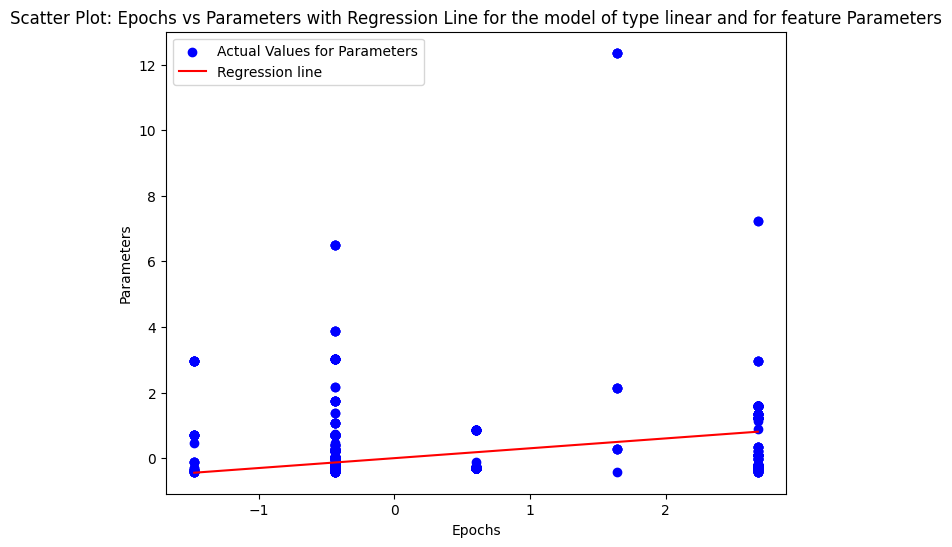

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 0.5750643532727114
data size: 0.0091242167228833
Training time (hours): 0.11199091035060497
Hardware unit Memory Size (bytes): 0.09049110333133577
Epochs: 0.15006096710619538
Batch size: 0.0016664330501358162
Hardware utilization: -0.01653246544580189
Domain_encoded: -0.0037604173568221936
Country_encoded: 0.04026971943363784
Organization_encoded: 0.18366761756510486
Date_encoded: 0.07724972303704754
Category_encoded: -0.021202789690080437
Task_encoded: -0.0017791275153085518
Confidence_encoded: -0.529303531427506
accessibility_encoded: -0.08866595246423208
Training dataset_encoded: -0.03200395286051842
Training code accessibility_encoded: -0.11786685555718075
Training hardware_encoded: 0.06213707997225533
Notability_encoded: 0.011654433032056726
The main feature is Hardware quantity


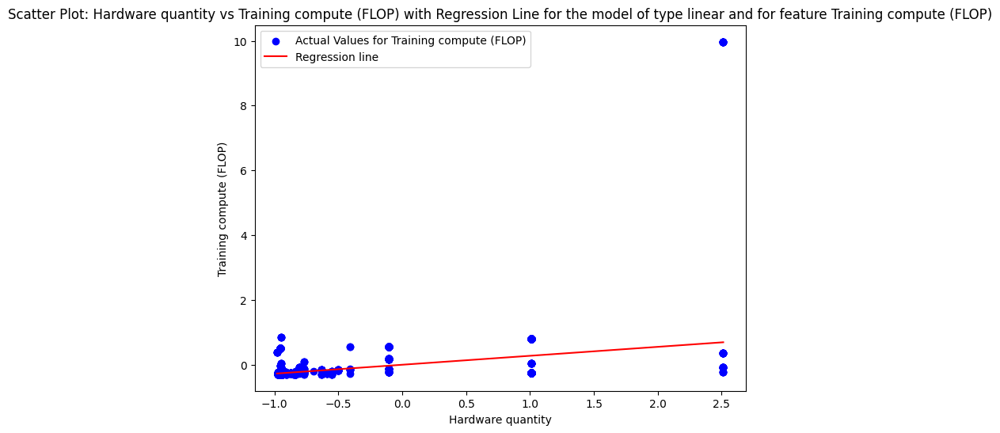

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 0.39905218412411464
data size: -0.04026780967751997
Training time (hours): -0.3932993698706781
Hardware unit Memory Size (bytes): 0.1160196534601431
Epochs: -0.1067428115268558
Batch size: -0.06670129214780977
Hardware utilization: 0.4369225888797327
Domain_encoded: -0.02381966574488921
Country_encoded: -0.16358461445891984
Organization_encoded: 0.07479906889911339
Date_encoded: 0.13827039876752617
Category_encoded: -0.14128802210108846
Task_encoded: -0.01720554817879945
Confidence_encoded: 0.2808873832039215
accessibility_encoded: 0.19403804702619012
Training dataset_encoded: -0.05773568018074811
Training code accessibility_encoded: 0.07729946817406341
Training hardware_encoded: -0.07082847716510339
Notability_encoded: 0.03516735639945458
The main feature is Hardware utilization


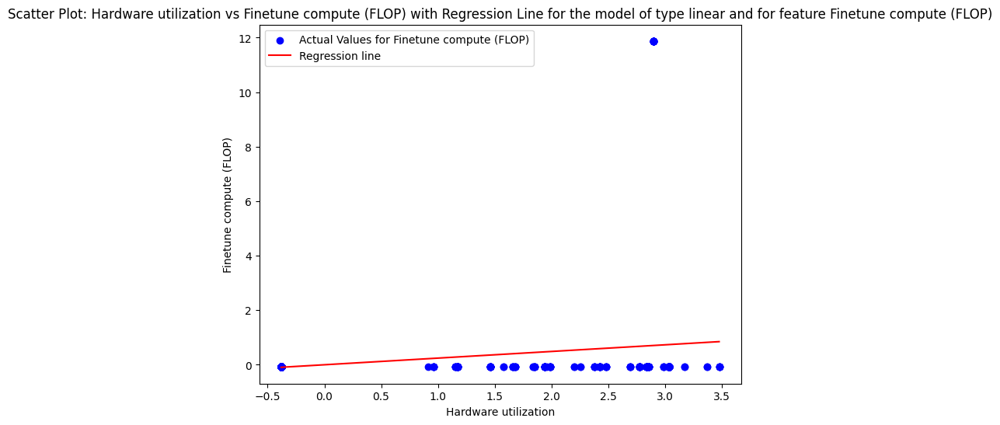

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 0.7053848902364065
data size: 0.011167841269671366
Training time (hours): -0.07062340183131367
Hardware unit Memory Size (bytes): -0.039784709878213906
Epochs: 0.05023004205143982
Batch size: 0.054602129188101284
Hardware utilization: 0.07923136037443276
Domain_encoded: -0.0006944815301353646
Country_encoded: -0.11031751358179945
Organization_encoded: -0.08299190721776932
Date_encoded: 0.22038367066349646
Category_encoded: -0.03363830810884347
Task_encoded: 0.031870259342204554
Confidence_encoded: 0.1797659189899294
accessibility_encoded: 0.0021918659510093853
Training dataset_encoded: -0.10450241503510758
Training code accessibility_encoded: 0.13493580872804592
Training hardware_encoded: -0.085694464922796
Notability_encoded: 0.020668660096079334
The main feature is Hardware quantity


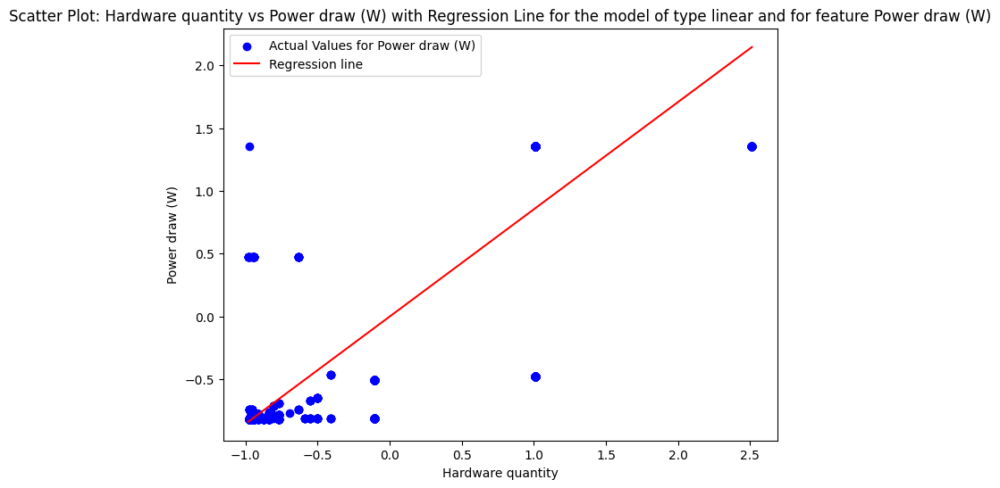

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 1.075854652614685
data size: -0.004298078217438522
Training time (hours): -0.029015784807909683
Hardware unit Memory Size (bytes): 0.14859052230873773
Epochs: 0.20097021124137454
Batch size: 0.019236825806014952
Hardware utilization: 0.04157785006059584
Domain_encoded: -0.012008583957170459
Country_encoded: -0.021938160559569368
Organization_encoded: 0.18552883309470541
Date_encoded: 0.11856601076416685
Category_encoded: 0.006253199560852722
Task_encoded: -0.013056568044736046
Confidence_encoded: -0.27859648570272366
accessibility_encoded: 0.09683350365360985
Training dataset_encoded: -0.027621825482697523
Training code accessibility_encoded: 0.04323186831805968
Training hardware_encoded: 0.19633360633774916
Notability_encoded: -0.08352968485311064
The main feature is Hardware quantity


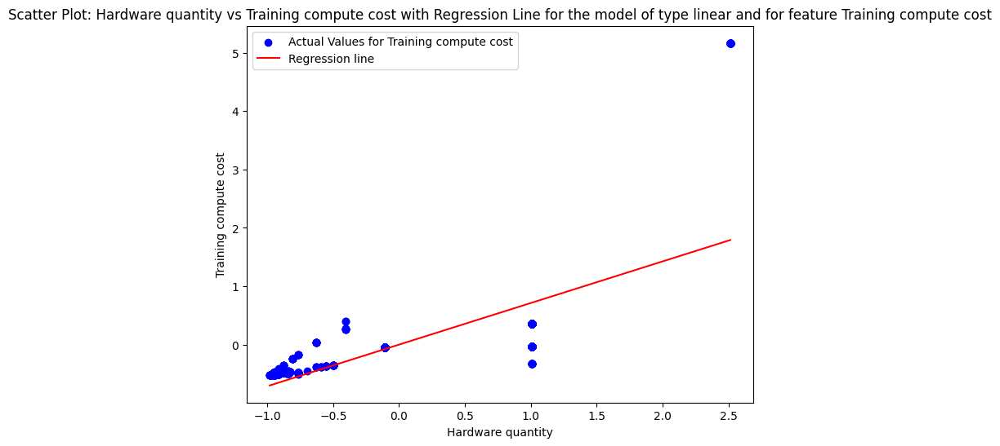

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 0.18564047266044867
data size: 0.003111918584766446
Training time (hours): 0.02002077230935343
Hardware unit Memory Size (bytes): 0.0006047061655783889
Epochs: 0.3515061245405054
Batch size: -0.2033495385183634
Hardware utilization: 0.26901491313126896
Domain_encoded: -0.015816232456327413
Country_encoded: -0.12466336714970705
Organization_encoded: 0.004379347988322065
Date_encoded: 0.06991853804559658
Category_encoded: 0.013993814756680678
Task_encoded: -0.01073566690008948
Confidence_encoded: -0.13753274304654692
accessibility_encoded: 0.1392136104122694
Training dataset_encoded: -0.027776793684693754
Training code accessibility_encoded: -0.019172946433084617
Training hardware_encoded: 0.05909047654017898
Notability_encoded: -0.06868175374594435
The main feature is Epochs


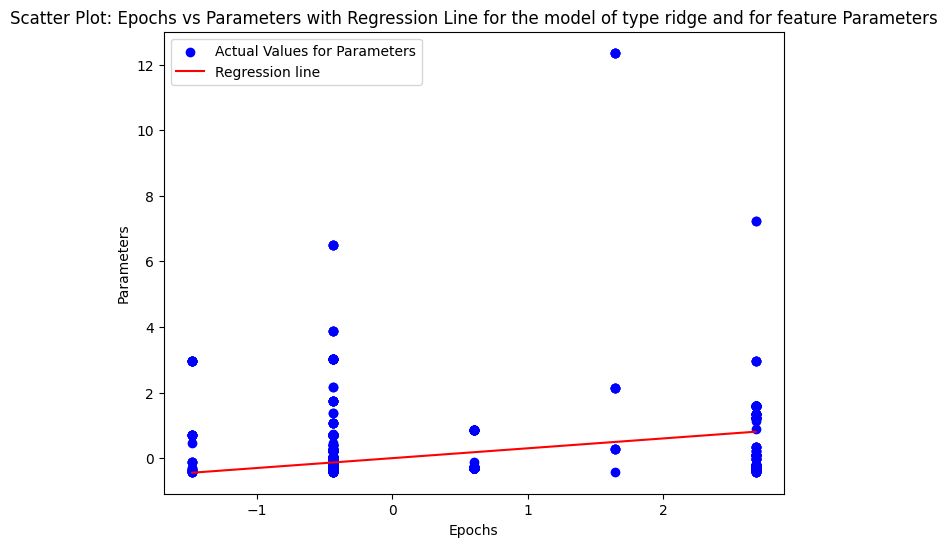

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 0.573238758061842
data size: 0.009143360106546762
Training time (hours): 0.11217452079126589
Hardware unit Memory Size (bytes): 0.08977707075180695
Epochs: 0.15015617840631723
Batch size: 0.0021561529457479554
Hardware utilization: -0.016558537374940178
Domain_encoded: -0.0037104138107040656
Country_encoded: 0.04021049802173533
Organization_encoded: 0.18358699788460697
Date_encoded: 0.07701832188730186
Category_encoded: -0.021086946779182443
Task_encoded: -0.001856212983688239
Confidence_encoded: -0.527693375803371
accessibility_encoded: -0.08817837572816593
Training dataset_encoded: -0.031614700498671475
Training code accessibility_encoded: -0.11742370566637725
Training hardware_encoded: 0.06243051088886907
Notability_encoded: 0.011704187991028446
The main feature is Hardware quantity


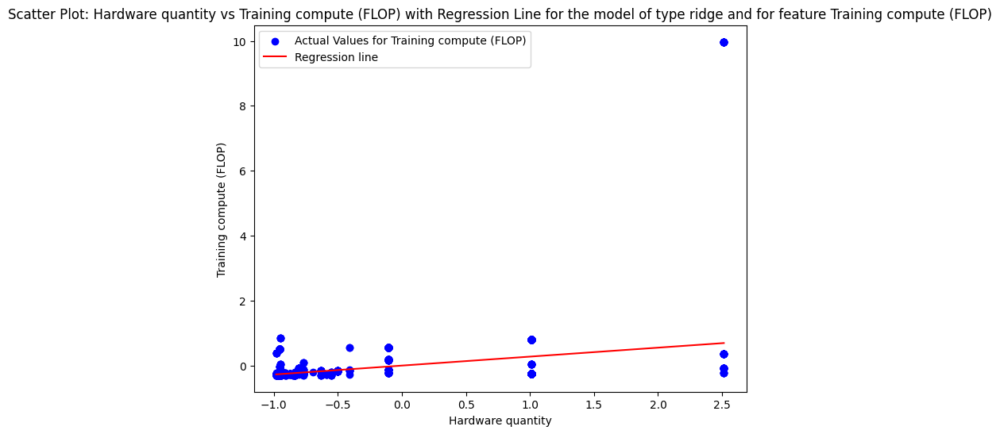

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 0.3971221673109669
data size: -0.040141891951165236
Training time (hours): -0.39211248436174134
Hardware unit Memory Size (bytes): 0.11536032495067147
Epochs: -0.10643074813102368
Batch size: -0.06641102323303258
Hardware utilization: 0.43607226078063493
Domain_encoded: -0.023697219080998214
Country_encoded: -0.16328027638618306
Organization_encoded: 0.07445061220915371
Date_encoded: 0.13824457847377736
Category_encoded: -0.14131900507950673
Task_encoded: -0.017209524467697086
Confidence_encoded: 0.27989904422217254
accessibility_encoded: 0.19322906123686198
Training dataset_encoded: -0.05744217772188052
Training code accessibility_encoded: 0.07739830354041534
Training hardware_encoded: -0.07063468652994943
Notability_encoded: 0.03502047278905302
The main feature is Hardware utilization


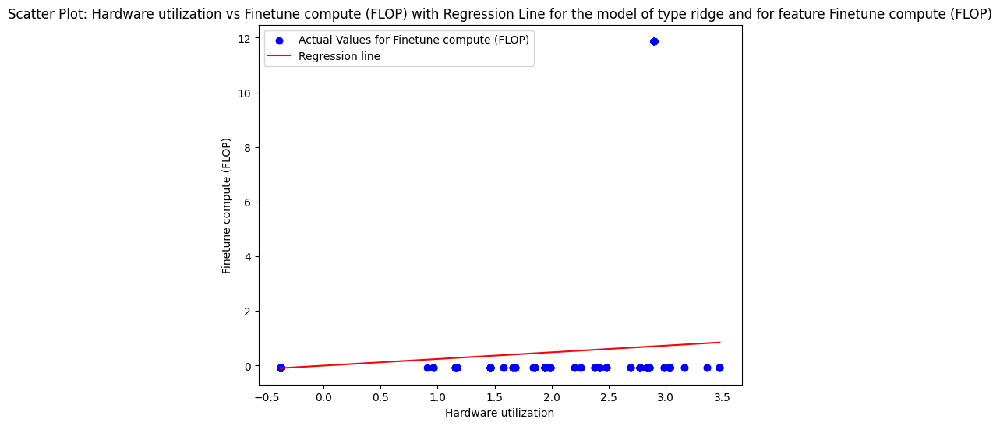

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 0.7032631996601981
data size: 0.011174956128801974
Training time (hours): -0.06976794564960966
Hardware unit Memory Size (bytes): -0.040390606493372866
Epochs: 0.050343197158839934
Batch size: 0.05481416311957359
Hardware utilization: 0.07897225141428231
Domain_encoded: -0.000550089131824656
Country_encoded: -0.11003608576594892
Organization_encoded: -0.08304434996788677
Date_encoded: 0.22030426555728427
Category_encoded: -0.033630232196374725
Task_encoded: 0.031858198732598854
Confidence_encoded: 0.17953305102883532
accessibility_encoded: 0.0016192077978139342
Training dataset_encoded: -0.10390737881656584
Training code accessibility_encoded: 0.13499801913646692
Training hardware_encoded: -0.08547757564542244
Notability_encoded: 0.02068299973566176
The main feature is Hardware quantity


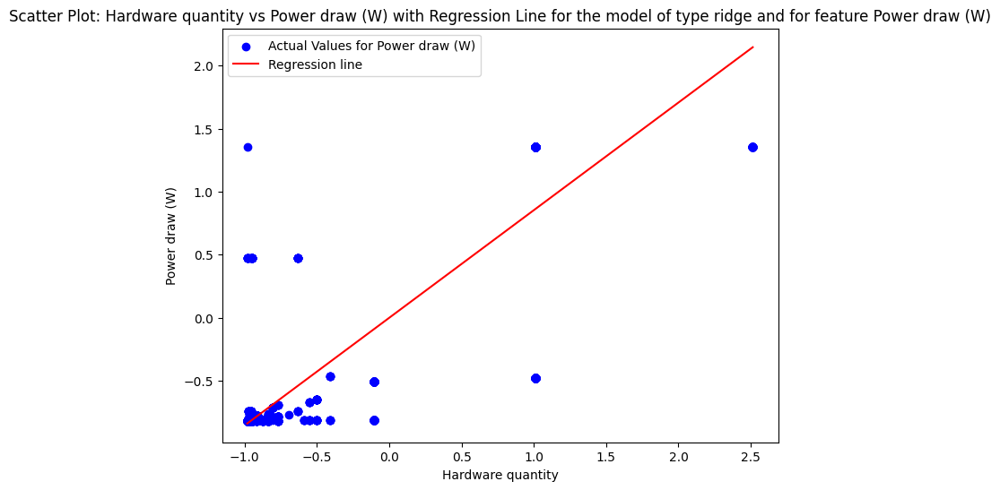

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 1.0722530464000548
data size: -0.004254540147848743
Training time (hours): -0.02805451840499776
Hardware unit Memory Size (bytes): 0.1473489888047427
Epochs: 0.20137190577161326
Batch size: 0.019740713363217276
Hardware utilization: 0.04148743037126978
Domain_encoded: -0.011859902604078655
Country_encoded: -0.021825390604211417
Organization_encoded: 0.1853165357343655
Date_encoded: 0.11871045843875062
Category_encoded: 0.0062686812964417304
Task_encoded: -0.013142857922575432
Confidence_encoded: -0.2778868937182554
accessibility_encoded: 0.09627841989542145
Training dataset_encoded: -0.026981227727849253
Training code accessibility_encoded: 0.043665006357137603
Training hardware_encoded: 0.1964230170906659
Notability_encoded: -0.08338798948796551
The main feature is Hardware quantity


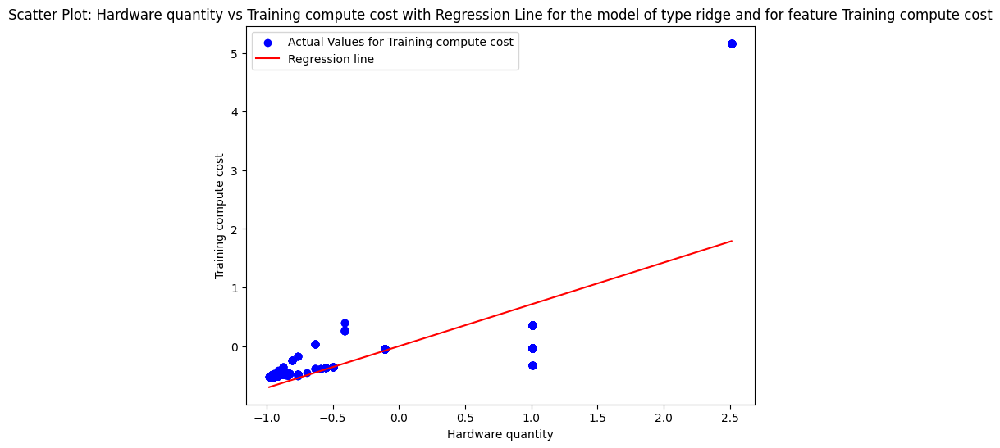

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: -0.0
data size: 0.0
Training time (hours): -0.0
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.0
Batch size: -0.0
Hardware utilization: 0.0
Domain_encoded: -0.0
Country_encoded: -0.0
Organization_encoded: 0.0
Date_encoded: -0.0
Category_encoded: 0.0
Task_encoded: -0.0
Confidence_encoded: -0.0
accessibility_encoded: 0.0
Training dataset_encoded: -0.0
Training code accessibility_encoded: -0.0
Training hardware_encoded: 0.0
Notability_encoded: -0.0
The main feature is Hardware quantity


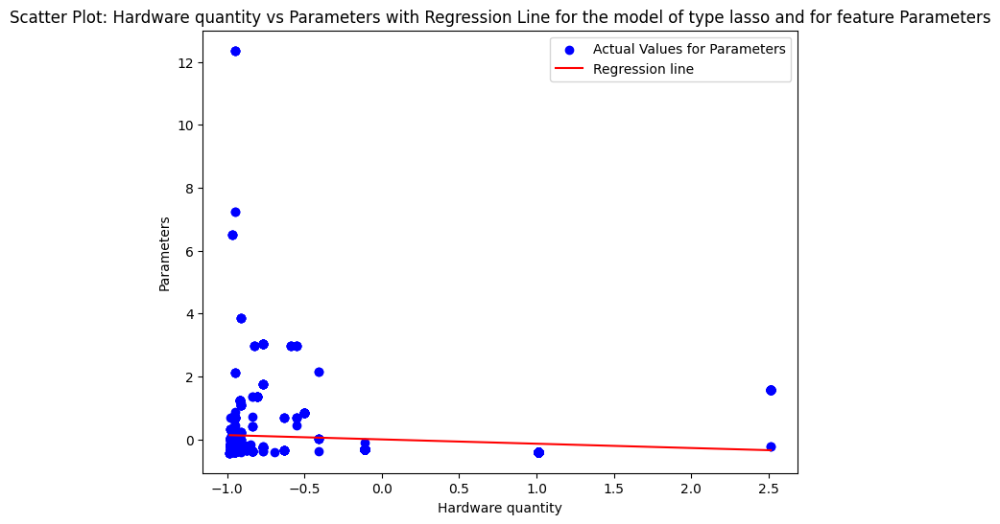

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.0
Hardware unit Memory Size (bytes): -0.0
Epochs: 0.0
Batch size: 0.0
Hardware utilization: -0.0
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.0
Category_encoded: -0.0
Task_encoded: -0.0
Confidence_encoded: -0.0
accessibility_encoded: -0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: -0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
The main feature is Hardware quantity


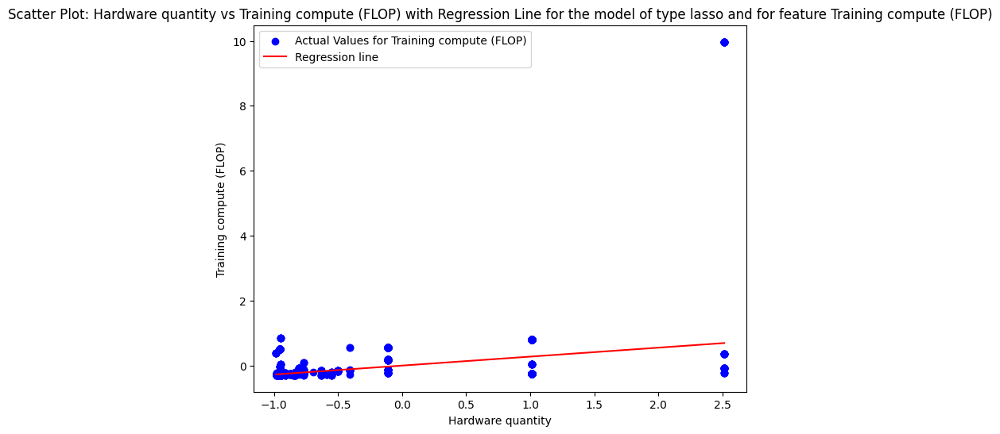

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: -0.0
data size: 0.0
Training time (hours): -0.0
Hardware unit Memory Size (bytes): 0.0
Epochs: -0.0
Batch size: -0.0
Hardware utilization: 0.0
Domain_encoded: -0.0
Country_encoded: -0.0
Organization_encoded: -0.0
Date_encoded: -0.0
Category_encoded: -0.0
Task_encoded: -0.0
Confidence_encoded: -0.0
accessibility_encoded: 0.0
Training dataset_encoded: -0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
The main feature is Hardware quantity


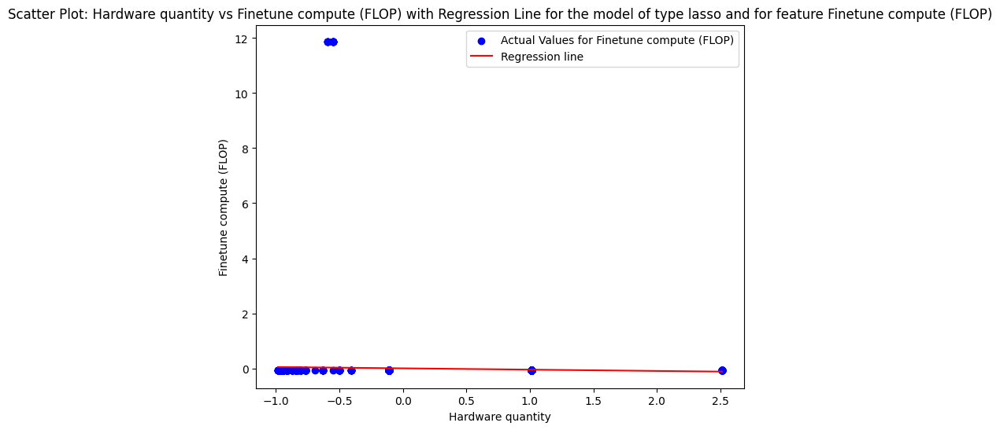

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.0
Hardware unit Memory Size (bytes): -0.0
Epochs: -0.0
Batch size: 0.0
Hardware utilization: -0.0
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: -0.0
Date_encoded: 0.0
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: -0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: -0.0
Notability_encoded: 0.0
The main feature is Hardware quantity


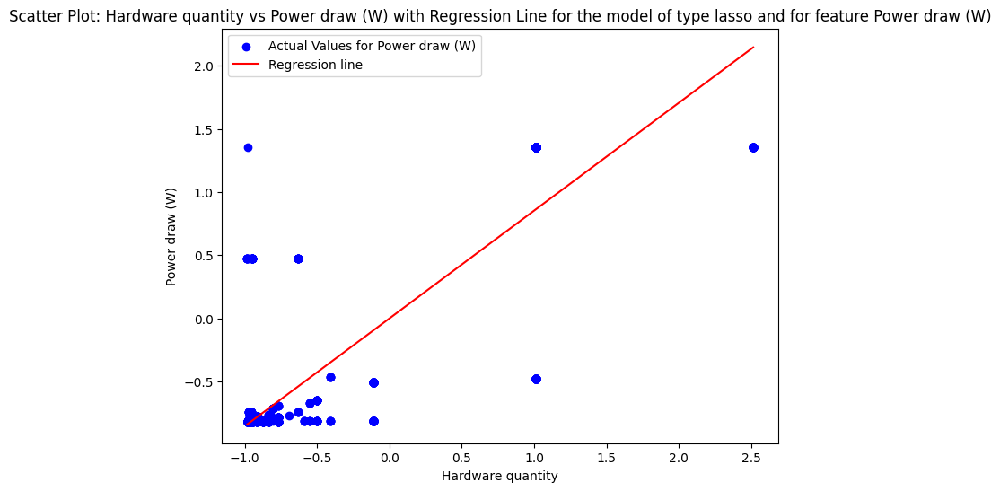

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.0
Hardware unit Memory Size (bytes): -0.0
Epochs: 0.0
Batch size: 0.0
Hardware utilization: -0.0
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.0
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: -0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
The main feature is Hardware quantity


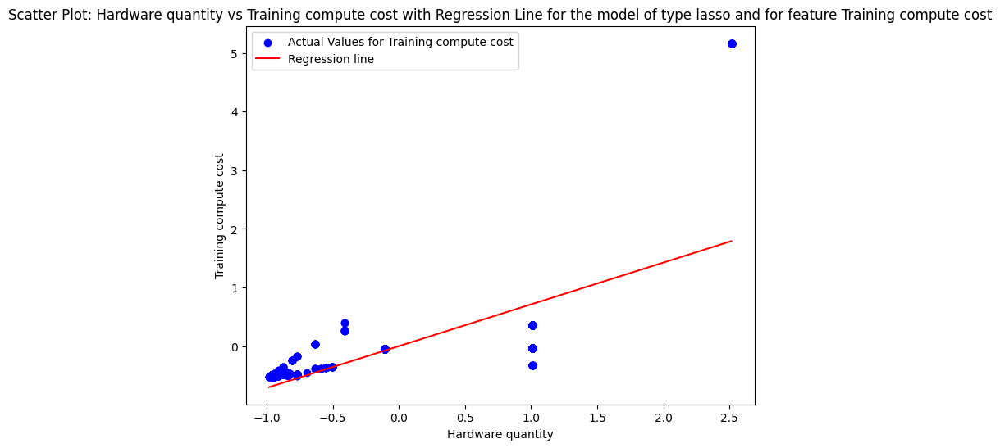

Running Models with Best Parameters:  20%|██        | 1/5 [00:02<00:10,  2.63s/it]

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.03617608646914378
data size: 0.01509222594893223
Training time (hours): 0.04578468825047706
Hardware unit Memory Size (bytes): 0.033043302567590596
Epochs: 0.16805907762100927
Batch size: 0.08885205202670102
Hardware utilization: 0.11464479726463303
Domain_encoded: 0.012213133082614135
Country_encoded: 0.046605298661650495
Organization_encoded: 0.021019160728779657
Date_encoded: 0.08294786253427856
Category_encoded: 0.010460504853491592
Task_encoded: 0.015109791056039023
Confidence_encoded: 0.039339746068236106
accessibility_encoded: 0.06242897760461345
Training dataset_encoded: 0.04597893162619207
Training code accessibility_encoded: 0.08621489788424914
Training hardware_encoded: 0.10469589058198343
Notability_encoded: 0.030724009582521795

Most influential feature according to permutation importance: Epochs


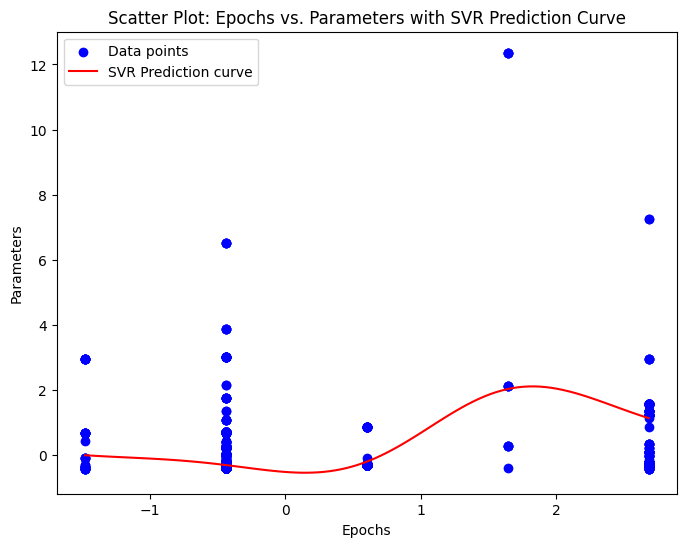

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.07011633775423652
data size: 0.0012447621844311253
Training time (hours): 0.02022782830538796
Hardware unit Memory Size (bytes): 0.009257787048881605
Epochs: 0.027874587003853667
Batch size: 0.007204183232013117
Hardware utilization: 0.003407122770826343
Domain_encoded: -0.01970453479262607
Country_encoded: 0.012078285027550605
Organization_encoded: 0.02821093120343212
Date_encoded: 0.10287274912924513
Category_encoded: 0.0024057172857690824
Task_encoded: 0.0009362706440047552
Confidence_encoded: 0.12370950241113018
accessibility_encoded: 0.012751162582548058
Training dataset_encoded: 0.008692837835492828
Training code accessibility_encoded: 0.007388200657860544
Training hardware_encoded: 0.012301475853217659
Notability_encoded: 0.04696869723393306

Most influential feature according to permutation importance: Confidence_encoded


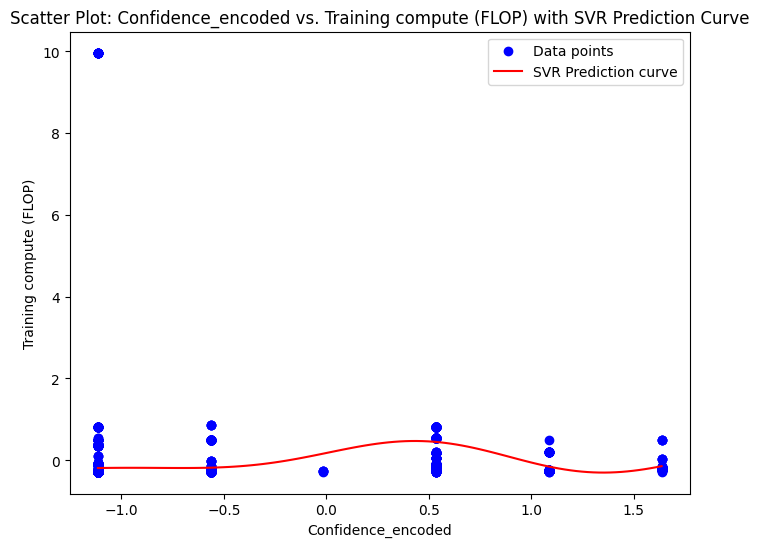

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.020024018770677145
data size: 0.01314770469483446
Training time (hours): 0.16448069854656236
Hardware unit Memory Size (bytes): 0.028377472294308103
Epochs: 0.10539288264775686
Batch size: 0.025744136511765735
Hardware utilization: 0.2807052456647402
Domain_encoded: 0.020607899116909356
Country_encoded: 0.16891736302114943
Organization_encoded: -0.00013400771815882395
Date_encoded: 0.0126519355262392
Category_encoded: -0.006291154122735653
Task_encoded: 0.014777492612195176
Confidence_encoded: -0.008964315826634406
accessibility_encoded: 0.11099781729474176
Training dataset_encoded: 0.06141630711532823
Training code accessibility_encoded: 0.01778937643924876
Training hardware_encoded: 0.033379910675406674
Notability_encoded: 0.01484612434857483

Most influential feature according to permutation importance: Hardware utilization


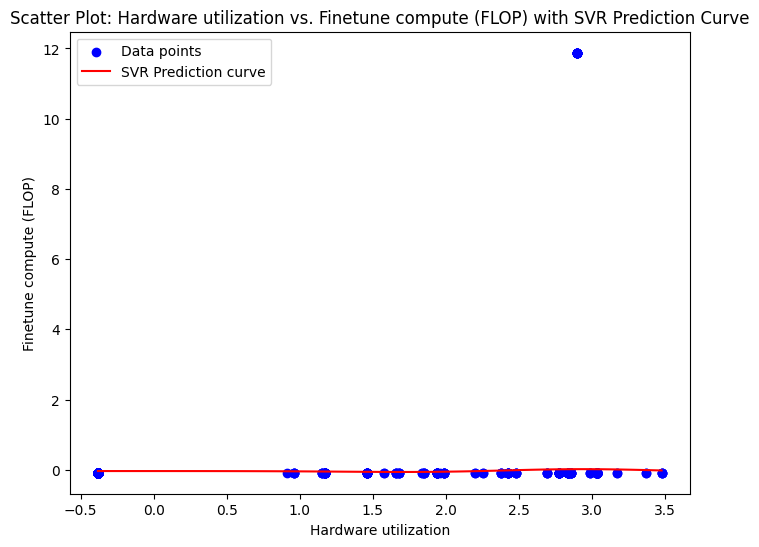

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.25079094210241787
data size: 0.020341868145084978
Training time (hours): 0.03924540855000171
Hardware unit Memory Size (bytes): 0.049450024385848876
Epochs: 0.05387762194204252
Batch size: 0.02495585117804816
Hardware utilization: 0.01897496618728871
Domain_encoded: 0.0022671491909578264
Country_encoded: 0.008497491868233856
Organization_encoded: 0.036155701117313255
Date_encoded: 0.10416691886350807
Category_encoded: 0.01651822486391634
Task_encoded: 0.0005750733111760164
Confidence_encoded: 0.10017543421720132
accessibility_encoded: 0.020177167758279834
Training dataset_encoded: 0.019855172759204204
Training code accessibility_encoded: 0.024602816121909156
Training hardware_encoded: 0.043688911673146064
Notability_encoded: 0.08259720184947746

Most influential feature according to permutation importance: Hardware quantity


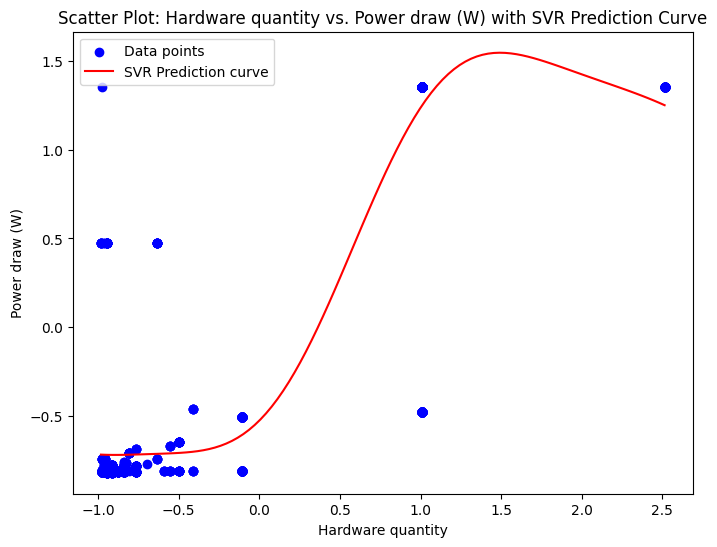

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.5593597545427482
data size: 0.016611623797571213
Training time (hours): 0.03572600225676685
Hardware unit Memory Size (bytes): 0.013152270823199577
Epochs: 0.20956186749899416
Batch size: 0.05316985660684877
Hardware utilization: 0.02040411553837444
Domain_encoded: 0.0025221365321589965
Country_encoded: 0.02858893767106001
Organization_encoded: 0.13490854020289356
Date_encoded: 0.012722245955035415
Category_encoded: 0.0177241822830446
Task_encoded: 0.0008941059457649416
Confidence_encoded: 0.0056922576398600435
accessibility_encoded: 0.005637605597685827
Training dataset_encoded: 0.02048447721818747
Training code accessibility_encoded: 0.029597681029110486
Training hardware_encoded: 0.10923043039425817
Notability_encoded: 0.009528136256379025

Most influential feature according to permutation importance: Hardware quantity


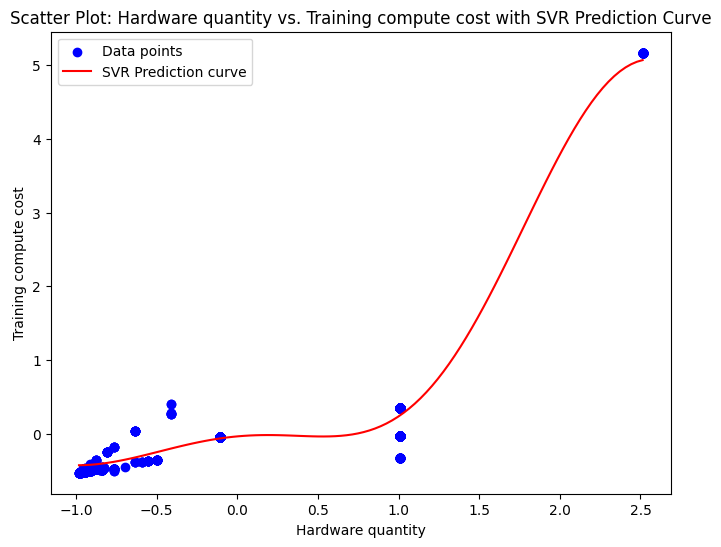

Running Models with Best Parameters:  40%|████      | 2/5 [00:04<00:06,  2.33s/it]

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.049401604772647045
data size: 0.0001215011241203679
Training time (hours): 0.023079171520515043
Hardware unit Memory Size (bytes): 0.010227008683545665
Epochs: 0.03277203843495419
Batch size: 0.09310944152027753
Hardware utilization: 0.10148750228131985
Domain_encoded: 3.0464208511230927e-15
Country_encoded: 0.0030439818064783666
Organization_encoded: 0.045070541744469075
Date_encoded: 0.44091361983389454
Category_encoded: 0.00017847996885265695
Task_encoded: 0.00020897948146789995
Confidence_encoded: 0.0061434211885888585
accessibility_encoded: 0.07502585341744741
Training dataset_encoded: 0.04068644491300508
Training code accessibility_encoded: 0.007608355020189013
Training hardware_encoded: 0.062196903745627
Notability_encoded: 0.008725150542597418

Most influential feature according to permutation importance: Date_encoded


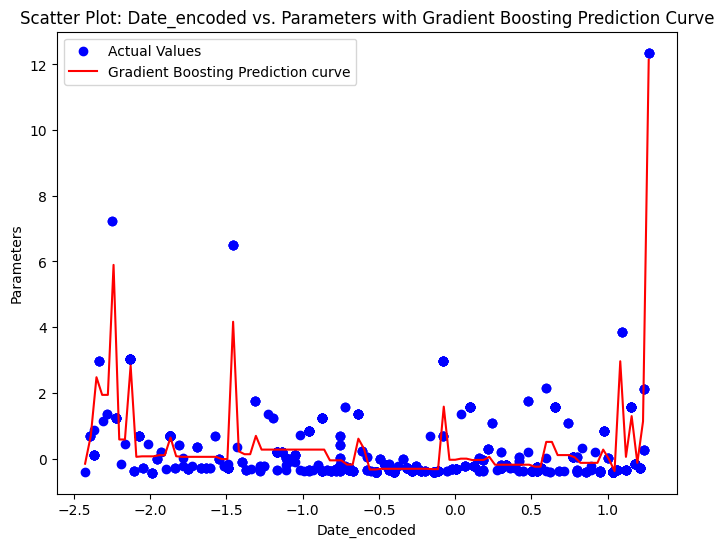

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.18124061198653904
data size: 0.0
Training time (hours): 0.000441834509075339
Hardware unit Memory Size (bytes): 0.010285948554084193
Epochs: 0.0007136654527002045
Batch size: 0.009809538245753672
Hardware utilization: 0.010839366036671867
Domain_encoded: 1.704519753481614e-05
Country_encoded: 7.581801944501082e-06
Organization_encoded: 0.14924737520678466
Date_encoded: 0.6056702443376292
Category_encoded: 0.0
Task_encoded: 2.4857572960334105e-05
Confidence_encoded: 0.020757359108951916
accessibility_encoded: 0.00023572116022664233
Training dataset_encoded: 7.61650439926192e-05
Training code accessibility_encoded: 1.0225365349312711e-06
Training hardware_encoded: 0.0028660790664503657
Notability_encoded: 0.007765584182165648

Most influential feature according to permutation importance: Date_encoded


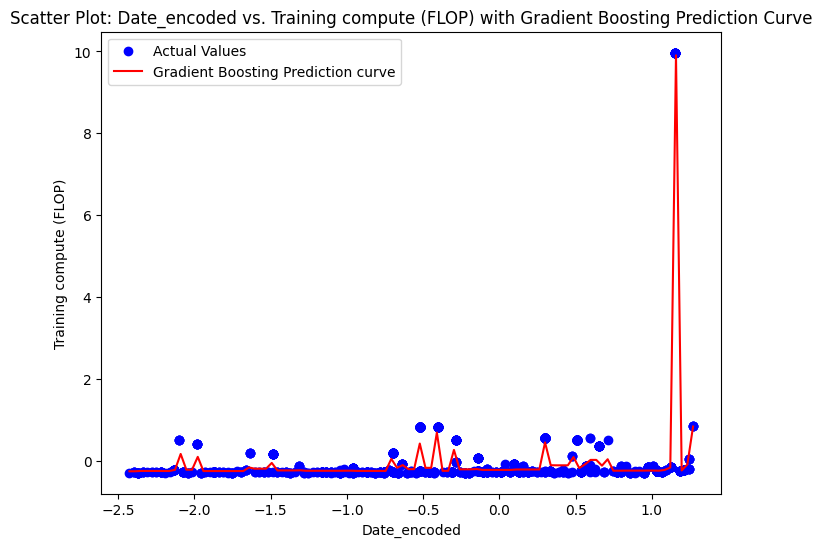

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.009796795631530394
data size: 0.0
Training time (hours): 0.46071373723064174
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.08816148485491504
Batch size: 0.007975836360666944
Hardware utilization: 0.21070053642979178
Domain_encoded: 0.0
Country_encoded: 0.06601387372173545
Organization_encoded: 5.683666956121321e-16
Date_encoded: 0.02842923265142772
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.1263546676818097
accessibility_encoded: 0.0
Training dataset_encoded: 0.0018538354374805779
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0

Most influential feature according to permutation importance: Training time (hours)


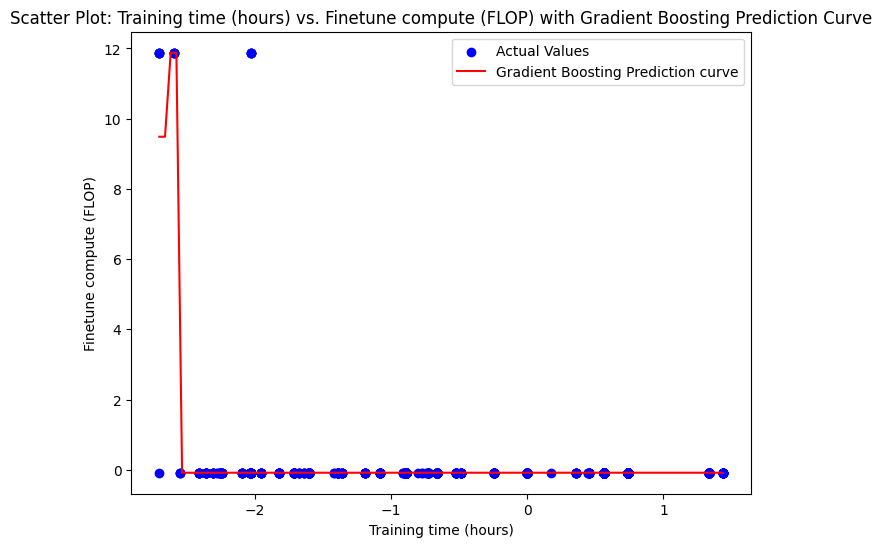

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.8034042896227263
data size: 0.0
Training time (hours): 0.0002602787466701758
Hardware unit Memory Size (bytes): 0.0037488811103197524
Epochs: 0.0010472084582825224
Batch size: 0.0005963334473173078
Hardware utilization: 0.0016535790485870915
Domain_encoded: 0.00010160524855555725
Country_encoded: 0.00080142917550031
Organization_encoded: 0.019361708534072635
Date_encoded: 0.11623248135194865
Category_encoded: 0.0
Task_encoded: 9.414611353532322e-05
Confidence_encoded: 0.0025548389105490114
accessibility_encoded: 0.005217332614565377
Training dataset_encoded: 5.260310374459224e-06
Training code accessibility_encoded: 0.006152335728029995
Training hardware_encoded: 0.00472478307244036
Notability_encoded: 0.03404350850652519

Most influential feature according to permutation importance: Hardware quantity


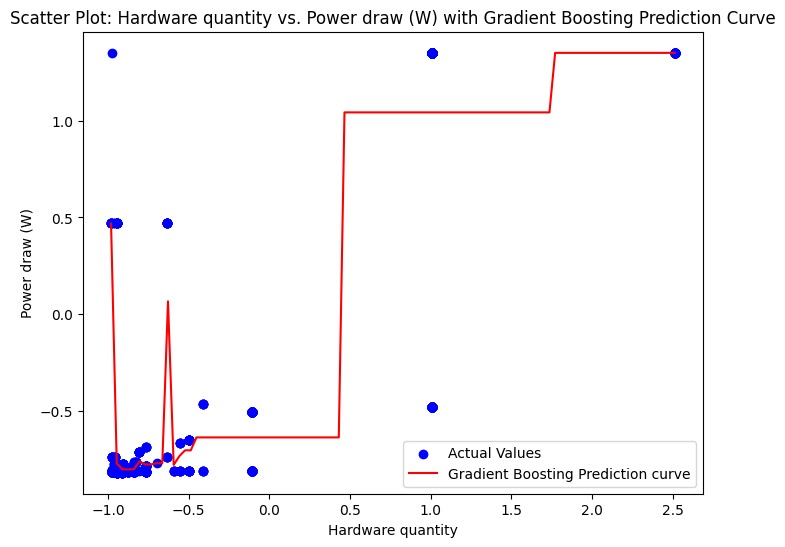

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.6564624991507344
data size: 7.569091615721904e-07
Training time (hours): 2.0800506578126233e-05
Hardware unit Memory Size (bytes): 0.001408243331011892
Epochs: 1.7465351239522018e-05
Batch size: 0.00023554333349893352
Hardware utilization: 5.428208855475342e-05
Domain_encoded: 3.3766236017619417e-16
Country_encoded: 1.0565950267227666e-06
Organization_encoded: 0.31074464937866225
Date_encoded: 0.022579002299316215
Category_encoded: 0.0
Task_encoded: 5.214606227502147e-09
Confidence_encoded: 0.00727679807821068
accessibility_encoded: 0.0005876147242034478
Training dataset_encoded: 7.404658609132002e-06
Training code accessibility_encoded: 1.0446159244517408e-05
Training hardware_encoded: 0.0005700771892608134
Notability_encoded: 2.3355032080506243e-05

Most influential feature according to permutation importance: Hardware quantity


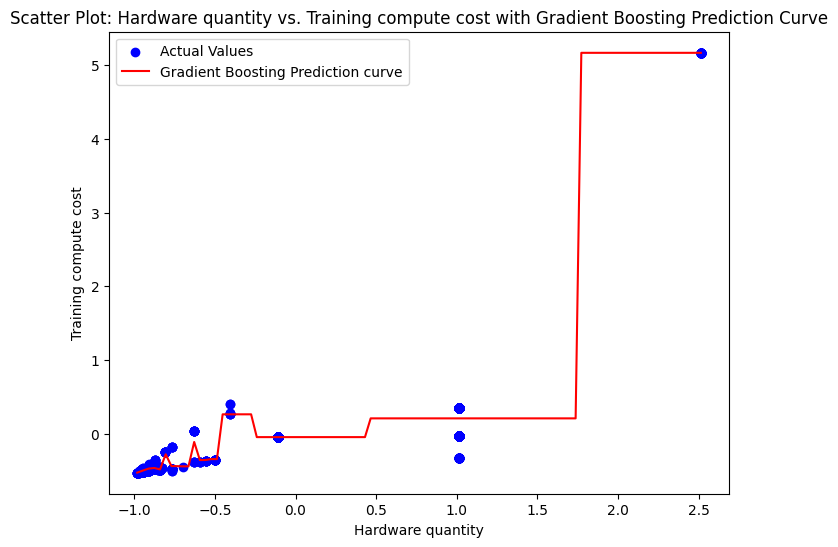

Running Models with Best Parameters:  60%|██████    | 3/5 [00:06<00:04,  2.21s/it]

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.046722553469931934
data size: 0.0008120332207371499
Training time (hours): 0.04829106658535782
Hardware unit Memory Size (bytes): 0.01853170207756245
Epochs: 0.04686279823390857
Batch size: 0.03348424239341907
Hardware utilization: 0.08155094292800133
Domain_encoded: 0.0005609964696256677
Country_encoded: 0.012175822231121276
Organization_encoded: 0.0611683049855166
Date_encoded: 0.4724325901036566
Category_encoded: 6.041430507550809e-05
Task_encoded: 0.0011163973334630966
Confidence_encoded: 0.008329056981677723
accessibility_encoded: 0.04276142074010269
Training dataset_encoded: 0.050180018313535156
Training code accessibility_encoded: 0.0030655543450751406
Training hardware_encoded: 0.05572870608138187
Notability_encoded: 0.016165379200850358

Most influential feature according to permutation importance: Date_encoded


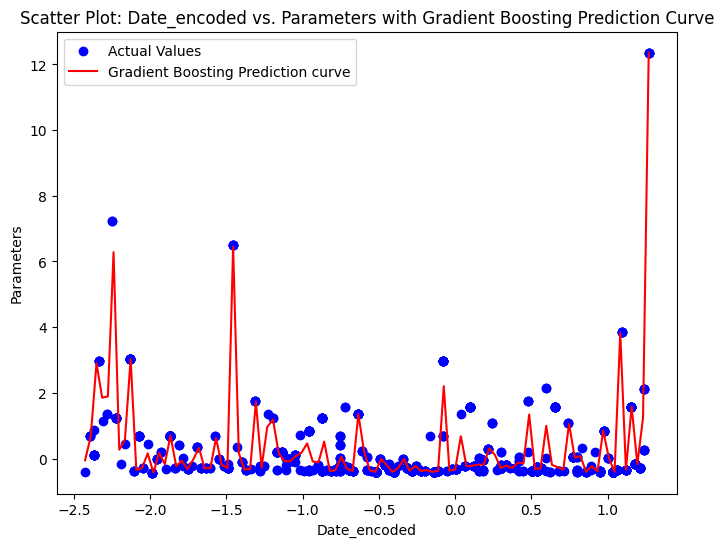

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.17250559762192058
data size: 1.2788169368331642e-06
Training time (hours): 0.005645417239489915
Hardware unit Memory Size (bytes): 0.01257905247438238
Epochs: 0.0018528661739507304
Batch size: 0.010070612801520912
Hardware utilization: 0.009242554960395569
Domain_encoded: 4.397143530487643e-06
Country_encoded: 8.115775627673299e-05
Organization_encoded: 0.13669908538976083
Date_encoded: 0.6007535897618307
Category_encoded: 4.5448982610549814e-05
Task_encoded: 3.747271521334232e-05
Confidence_encoded: 0.028821609454452165
accessibility_encoded: 0.001904055833327213
Training dataset_encoded: 0.0006918092498549909
Training code accessibility_encoded: 0.00033214264940382055
Training hardware_encoded: 0.004978854973117449
Notability_encoded: 0.01375299600202475

Most influential feature according to permutation importance: Date_encoded


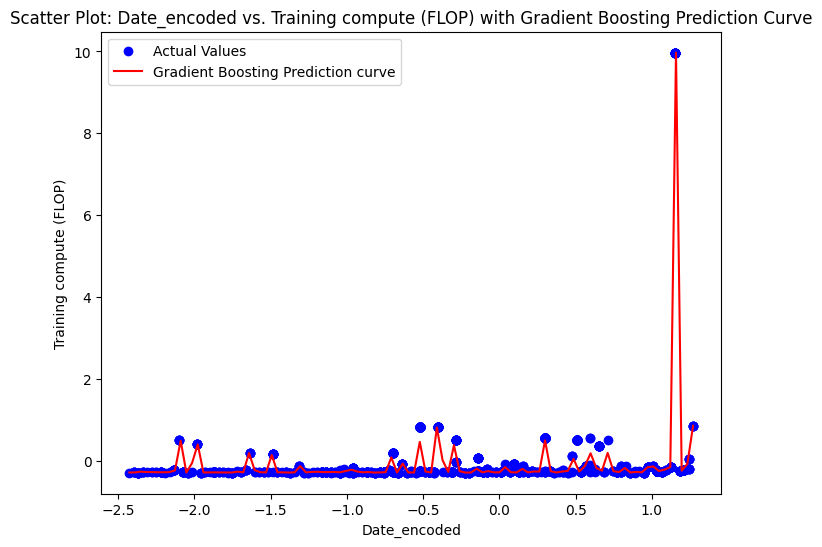

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.07415578816042187
data size: 1.4105491004917527e-16
Training time (hours): 0.4178126462866541
Hardware unit Memory Size (bytes): 7.854874495093983e-17
Epochs: 0.15207858658918494
Batch size: 0.0076192825570224965
Hardware utilization: 0.16450244297345573
Domain_encoded: 4.888296594826225e-17
Country_encoded: 0.12983407883138007
Organization_encoded: 0.005957271181669007
Date_encoded: 0.009267354721441188
Category_encoded: 0.0013054846317598564
Task_encoded: 1.0322933837398296e-16
Confidence_encoded: 0.025487815465130834
accessibility_encoded: 3.866059292180179e-17
Training dataset_encoded: 0.011979248601878996
Training code accessibility_encoded: 9.418813278801308e-17
Training hardware_encoded: 3.0491471042387754e-16
Notability_encoded: 8.61273052665586e-17

Most influential feature according to permutation importance: Training time (hours)


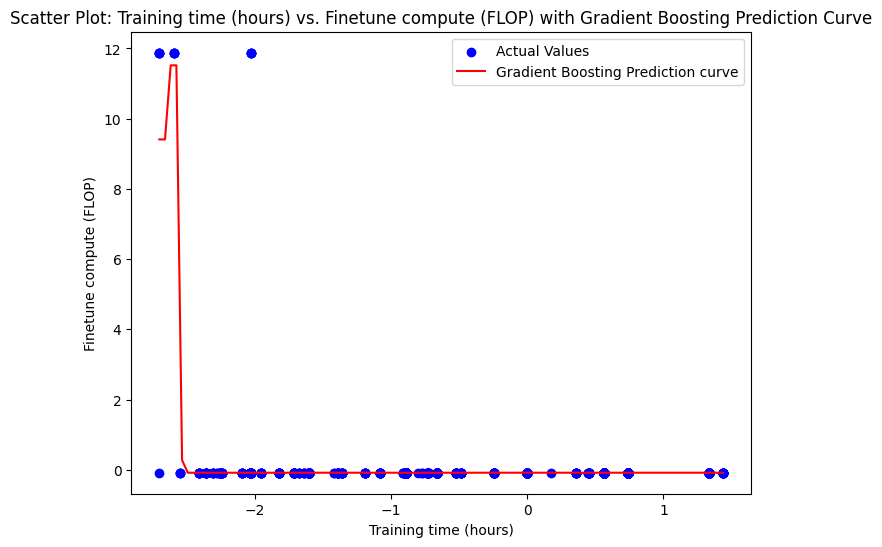

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.7964805145196139
data size: 2.0722770203111362e-07
Training time (hours): 0.0007482571815654942
Hardware unit Memory Size (bytes): 0.003059092520624704
Epochs: 0.0021349219388742077
Batch size: 0.0008288273274692522
Hardware utilization: 0.0012431230222365156
Domain_encoded: 2.5012715482937234e-05
Country_encoded: 0.0008275111666130048
Organization_encoded: 0.011736221307123075
Date_encoded: 0.11952248133156038
Category_encoded: 7.167732898981567e-07
Task_encoded: 1.9187532364552738e-05
Confidence_encoded: 0.006876969266212562
accessibility_encoded: 0.002949461693821834
Training dataset_encoded: 0.0008009318572257097
Training code accessibility_encoded: 0.003197541548796479
Training hardware_encoded: 0.0038349680193555885
Notability_encoded: 0.04571405305006773

Most influential feature according to permutation importance: Hardware quantity


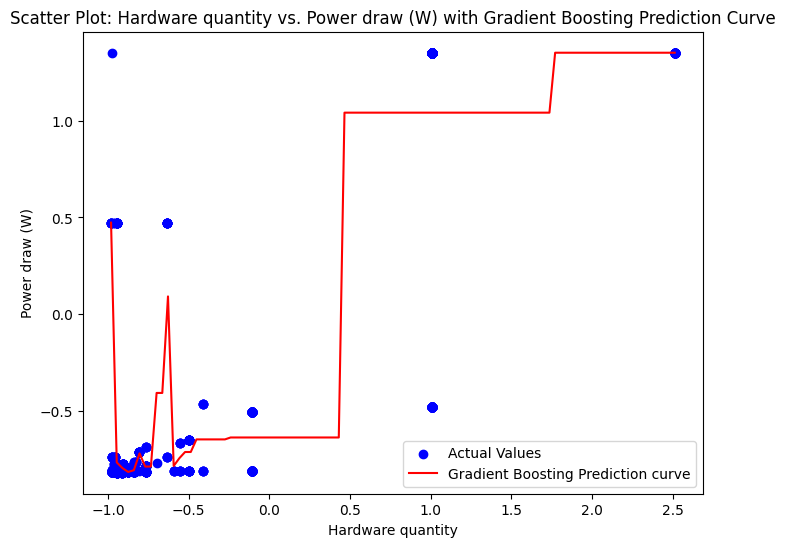

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.682003554109491
data size: 4.2964770050422697e-07
Training time (hours): 5.574458386372274e-05
Hardware unit Memory Size (bytes): 0.0005004339096375218
Epochs: 7.252885174084077e-05
Batch size: 0.002362442918623056
Hardware utilization: 9.29046407131686e-06
Domain_encoded: 3.091135489424246e-05
Country_encoded: 3.1512967018992856e-06
Organization_encoded: 0.29185031124416544
Date_encoded: 0.02124554733623811
Category_encoded: 4.043492184807181e-07
Task_encoded: 2.8620820697560165e-06
Confidence_encoded: 0.000929857423683075
accessibility_encoded: 3.674721431680698e-05
Training dataset_encoded: 4.737244387625777e-06
Training code accessibility_encoded: 0.0005465296951062072
Training hardware_encoded: 0.00029513048594968425
Notability_encoded: 4.938578814084002e-05

Most influential feature according to permutation importance: Hardware quantity


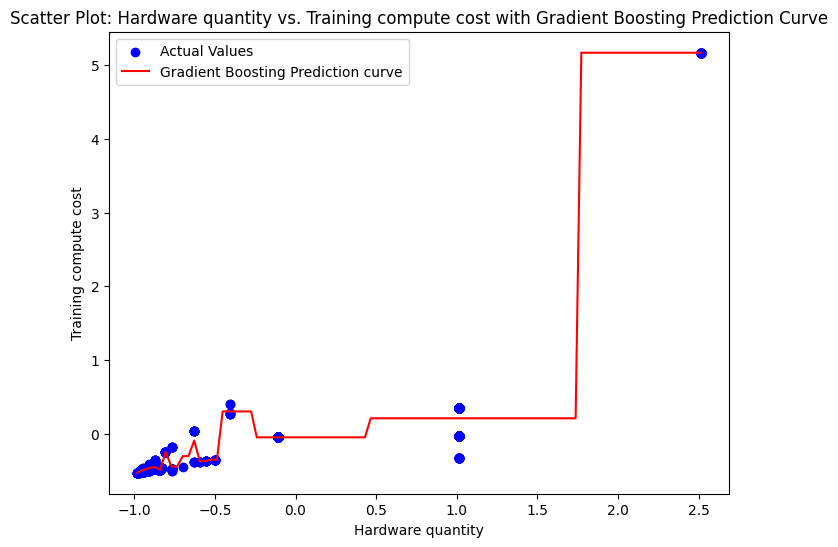

Running Models with Best Parameters:  80%|████████  | 4/5 [00:10<00:02,  2.63s/it]

Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.020176426641715886
data size: 0.0033082456293963306
Training time (hours): 0.06478890738670195
Hardware unit Memory Size (bytes): 0.04046519169458017
Epochs: 0.05564216334328308
Batch size: 0.012416427554300311
Hardware utilization: 0.04541707785996062
Domain_encoded: 6.728159302729459e-17
Country_encoded: 0.0014550318680958338
Organization_encoded: 0.09773398965264385
Date_encoded: 0.4804258716845473
Category_encoded: 1.04760601223707e-17
Task_encoded: 9.98548908224611e-06
Confidence_encoded: 0.0015818048593841225
accessibility_encoded: 0.025104041299168673
Training dataset_encoded: 0.04850103452075371
Training code accessibility_encoded: 0.0006712190333671618
Training hardware_encoded: 0.09332762181789012
Notability_encoded: 0.0089749596651284

Most influential feature according to permutation importance: Date_encoded


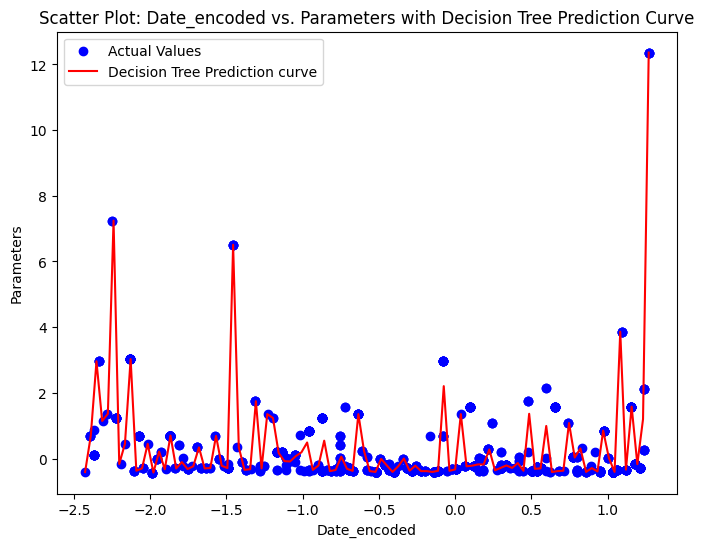

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.003383845182205948
data size: 9.985748315497225e-10
Training time (hours): 0.010780009323633377
Hardware unit Memory Size (bytes): 0.0009103460697243215
Epochs: 1.1390265747608982e-06
Batch size: 0.006643087052645313
Hardware utilization: 0.0156223764515673
Domain_encoded: 5.0447611078538656e-08
Country_encoded: 1.5363316504103743e-05
Organization_encoded: 0.3060096390251976
Date_encoded: 0.5985876030742456
Category_encoded: 1.8274810778187445e-08
Task_encoded: 4.1684794431078333e-08
Confidence_encoded: 0.04125810783641648
accessibility_encoded: 0.007281004394092406
Training dataset_encoded: 0.00022583478457033175
Training code accessibility_encoded: 3.8636649370266245e-07
Training hardware_encoded: 6.914067365802374e-05
Notability_encoded: 0.00921200601667968

Most influential feature according to permutation 

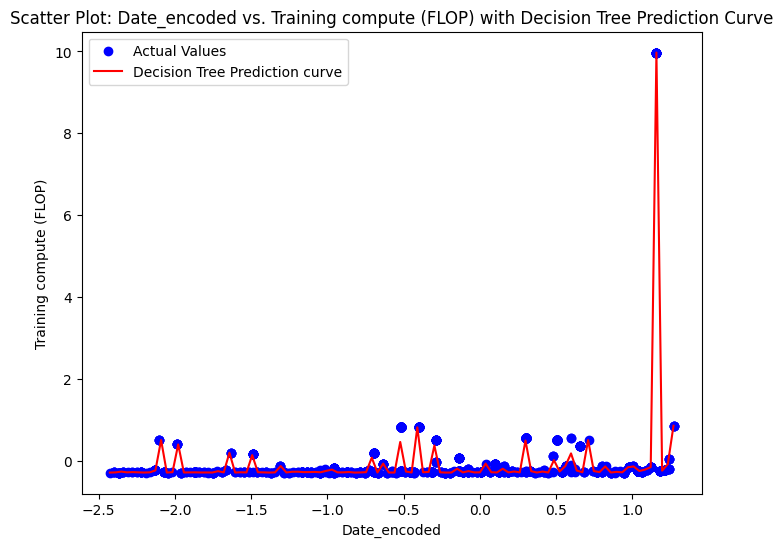

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.4607137372306583
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.08816148485488483
Batch size: 0.0
Hardware utilization: 0.35791717917180055
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 3.114678709133426e-18
Date_encoded: 0.09320759874265643
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: 0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0

Most influential feature according to permutation importance: Training time (hours)


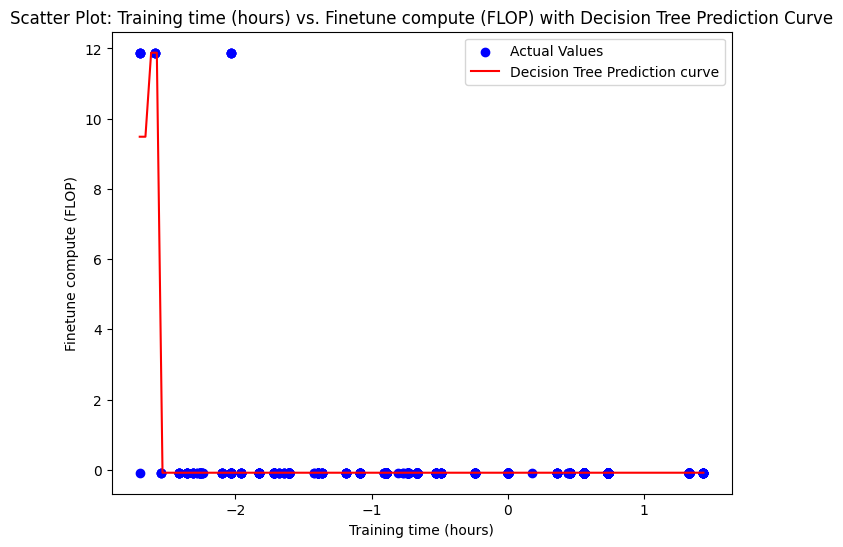

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.7927373596999514
data size: 0.0
Training time (hours): 1.7013114739980312e-05
Hardware unit Memory Size (bytes): 1.2182085706442983e-07
Epochs: 9.050395752024518e-05
Batch size: 9.139892775211032e-07
Hardware utilization: 6.132017394754526e-06
Domain_encoded: 1.2498525357673901e-17
Country_encoded: 0.002290243448185057
Organization_encoded: 0.01604670367357889
Date_encoded: 0.12490057796319344
Category_encoded: 5.212689154481966e-08
Task_encoded: 4.523659823003264e-17
Confidence_encoded: 0.0010292249519269893
accessibility_encoded: 1.546945670020919e-06
Training dataset_encoded: 0.002914212388077219
Training code accessibility_encoded: 0.007858386206163375
Training hardware_encoded: 3.3828743612013e-05
Notability_encoded: 0.052073178952960354

Most influential feature according to permutation importance: Hardwa

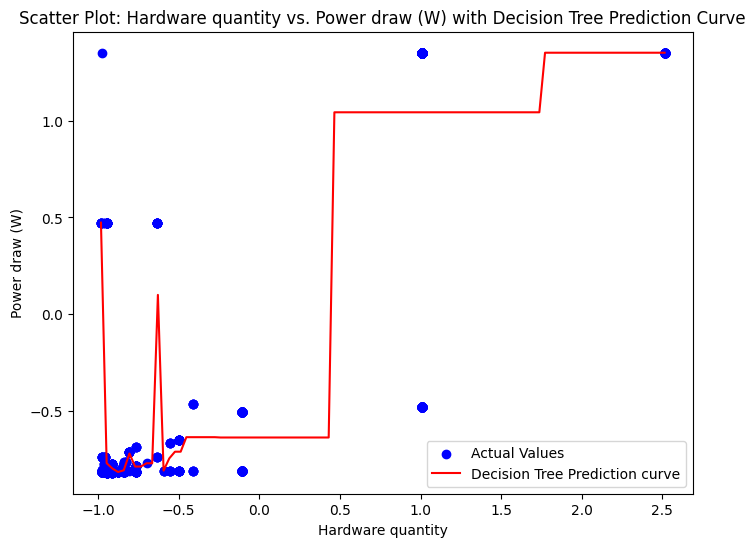

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.11059341042929213
data size: 5.1759375271755874e-08
Training time (hours): 1.2837141043362439e-05
Hardware unit Memory Size (bytes): 0.0017235503244937777
Epochs: 1.672517441477535e-05
Batch size: 0.002779654264655258
Hardware utilization: 1.2296563863843306e-07
Domain_encoded: 2.0789364852593668e-16
Country_encoded: 4.902923346574032e-08
Organization_encoded: 0.8637928792009055
Date_encoded: 0.020619211074894728
Category_encoded: 0.0
Task_encoded: 2.576158582487125e-16
Confidence_encoded: 0.00027412394492254747
accessibility_encoded: 9.95923138597104e-06
Training dataset_encoded: 7.467735104182371e-07
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.00017436022885970447
Notability_encoded: 2.318457373766021e-06

Most influential feature according to permutation importance: Organization_enc

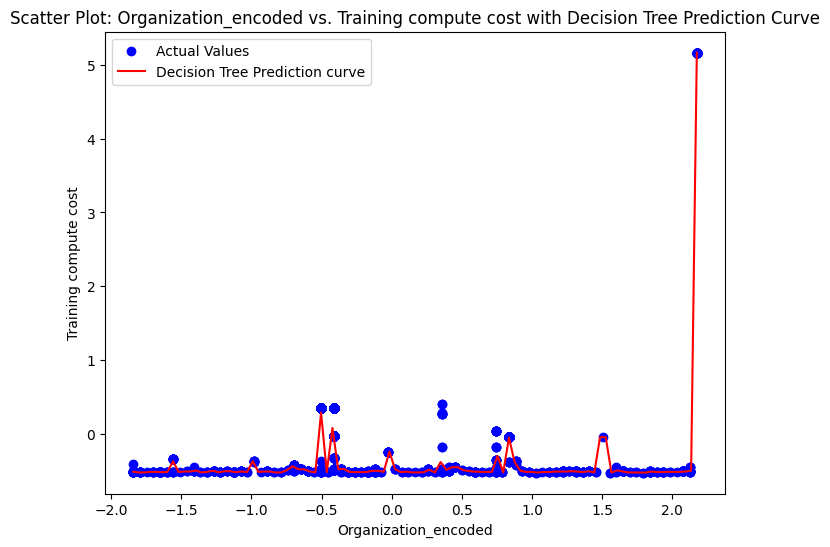

Running Models with Best Parameters: 100%|██████████| 5/5 [00:10<00:00,  2.18s/it]

--------------------------------------------------


In [ ]:
common_params['show_max_feature_graph'] = True
common_params['display_error'] = False
common_params['verbose'] = True
run_models(model_configs,common_params,store_err)


## Experiment 1

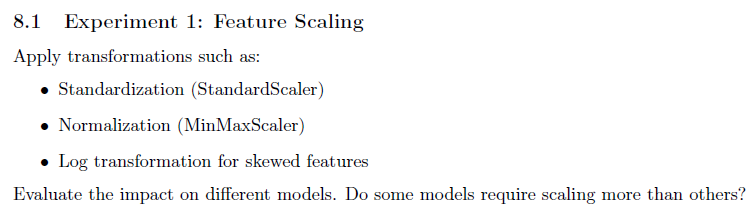

### Scaling Used - MinMax Scaler

In [ ]:
from sklearn.preprocessing import MinMaxScaler

num_cols_to_normalize = num_cols + out_cols

scaler = MinMaxScaler()
df_new = df.copy()
df_new = df_new.drop(columns = high_corr_cols)
df_new = clean_df(df_new)
for col in obj_col:
    df_new = encode_df_column(df_new, col,le)
df_new[num_cols_to_normalize] = scaler.fit_transform(df_new[num_cols_to_normalize])

num_cols = [col for col in num_cols if col not in out_cols]



In [ ]:
df_exp1 = df_new.copy()
exp1_cols = num_cols

### Apply Grid Search

In [ ]:
Apply_Grid_Search(df_new,num_cols,out_cols,results)

Hyperparameter Tuning: 100%|██████████| 7/7 [04:50<00:00, 41.49s/it]

Model: SVR
Best parameters: {'svr__C': 2, 'svr__gamma': 'scale', 'svr__kernel': 'rbf'}
Best R-squared score: 0.011783184441247286
--------------------
Model: Gradient Boosting
Best parameters: {'learning_rate': 0.5, 'max_depth': 5, 'n_estimators': 40}
Best R-squared score: 0.9480224729438241
--------------------
Model: Random Forest
Best parameters: {'max_depth': 13, 'min_samples_split': 2, 'n_estimators': 10}
Best R-squared score: 0.9164376654935232
--------------------
Model: Decision Tree
Best parameters: {'max_depth': 19, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best R-squared score: 0.9238412192806649
--------------------
Model: Linear Regression
Best parameters: None (default parameters)
Best R-squared score: 0.20740406534913536
--------------------
Model: Ridge
Best parameters: {'ridge__alpha': 100}
Best R-squared score: 0.23113494724042266
--------------------
Model: Lasso
Best parameters: {'lasso__alpha': 0.001}
Best R-squared score: 0.22277931454544725
-----------------

In [ ]:
model_configs,common_params = get_model_config(df_new,num_cols,out_cols,results)

In [ ]:
common_params['show_max_feature_graph'] = False
common_params['display_error'] = True
common_params['verbose'] = True
store_err1={}
run_models(model_configs,common_params,store_err1)

Running Models with Best Parameters:  20%|██        | 1/5 [00:00<00:00,  6.02it/s]

Linear Regression (Linear)
Showing Errors for Parameters
The Mean_Absolute_Error Error is: 0.02665947253102967
The Mean_Squared_Error Error is: 0.00390680102753096
The Root_Mean_Squared_Error Error is: 0.0625044080647994
The Median_Absolute_Error Error is: 0.014977095163180847
The Mean_Absolute_Percentage_Error Error is: 3.9217186891616773
The Mean_Squared_Log_Error Error is: 0.0022561085753220766
The R2 Error is: 0.31851683777114725
The Explained_Variance Error is: 0.31874954645413023
The Log_Cosh_Error Error is: 0.0018268427885483143
The Relative_Absolute_Error Error is: 0.6403591145634416
The Root_Relative_Squared_Error Error is: 0.8255199344830219
The Adjusted_R2 Error is: 0.2781798281688165

--------------------------------------------------
Linear Regression (Linear)
Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 0.03759201857428655
The Mean_Squared_Error Error is: 0.0056066709962366195
The Root_Mean_Squared_Error Error is: 0.07487770693762343
The Me

Running Models with Best Parameters:  40%|████      | 2/5 [00:00<00:00,  7.06it/s]

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error is: 0.04814779178197852
The Mean_Squared_Error Error is: 0.0030681245457146195
The Root_Mean_Squared_Error Error is: 0.05539065395637264
The Median_Absolute_Error Error is: 0.04687772575768514
The Mean_Absolute_Percentage_Error Error is: 211814726417036.62
The Mean_Squared_Log_Error Error is: 0.0025652072028375435
The R2 Error is: 0.6481611535500575
The Explained_Variance Error is: 0.8084125016875976
The Log_Cosh_Error Error is: 0.001532471002766223
The Relative_Absolute_Error Error is: 2.7606870691322705
The Root_Relative_Squared_Error Error is: 0.5931600512930236
The Adjusted_R2 Error is: 0.6273358012679737

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Power draw (W)
The Mean_Absolute_Error Error is: 0.07547161070389995
The Mean_Squared_Error Error is: 0.011197317269685623
Th

Running Models with Best Parameters:  60%|██████    | 3/5 [00:01<00:01,  1.96it/s]

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 0.0009961032677645967
The Mean_Squared_Error Error is: 3.4718148155983424e-06
The Root_Mean_Squared_Error Error is: 0.0018632806593743044
The Median_Absolute_Error Error is: 0.0004341436328955421
The Mean_Absolute_Percentage_Error Error is: 0.2820618397612225
The Mean_Squared_Log_Error Error is: 3.1299985664064862e-06
The R2 Error is: 0.9999105047392387
The Explained_Variance Error is: 0.9999110172206538
The Log_Cosh_Error Error is: 1.7358962291681777e-06
The Relative_Absolute_Error Error is: 0.009799480010683152
The Root_Relative_Squared_Error Error is: 0.009460193484348067
The Adjusted_R2 Error is: 0.9999052075119662

--------------------------------------------------
Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Parameters
The Mean_Absolute_

Running Models with Best Parameters: 100%|██████████| 5/5 [00:02<00:00,  1.67it/s]

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 0.00019274543921982338
The Mean_Squared_Error Error is: 2.083426105760334e-06
The Root_Mean_Squared_Error Error is: 0.001443407809927719
The Median_Absolute_Error Error is: 1.5265566588595902e-16
The Mean_Absolute_Percentage_Error Error is: 0.03225541957110932
The Mean_Squared_Log_Error Error is: 2.020646407112677e-06
The R2 Error is: 0.9999462941508936
The Explained_Variance Error is: 0.9999466537493603
The Log_Cosh_Error Error is: 1.0416513402125212e-06
The Relative_Absolute_Error Error is: 0.0018961940392222204
The Root_Relative_Squared_Error Error is: 0.0073284274647710266
The Adjusted_R2 Error is: 0.999943115300012

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Showing Errors for Parameters
The Mean_A

Running Models with Best Parameters:   0%|          | 0/5 [00:00<?, ?it/s]

Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 0.05088612712998435
data size: 0.003554923773016777
Training time (hours): 0.006458089487922638
Hardware unit Memory Size (bytes): 0.0003861495576164944
Epochs: 0.11441469281019204
Batch size: -0.08325661977375655
Hardware utilization: 0.08132566526341513
Domain_encoded: -0.004364134237273493
Country_encoded: -0.02495768437720065
Organization_encoded: 0.001380745109948982
Date_encoded: 0.020350903837087406
Category_encoded: 0.005993886510826241
Task_encoded: -0.002626915059693641
Confidence_encoded: -0.029645254497621176
accessibility_encoded: 0.029256887151999394
Training dataset_encoded: -0.009977639106209371
Training code accessibility_encoded: -0.004022770127695783
Training hardware_encoded: 0.022018603171402747
Notability_encoded: -0.025224716683040764
The main feature is Epochs


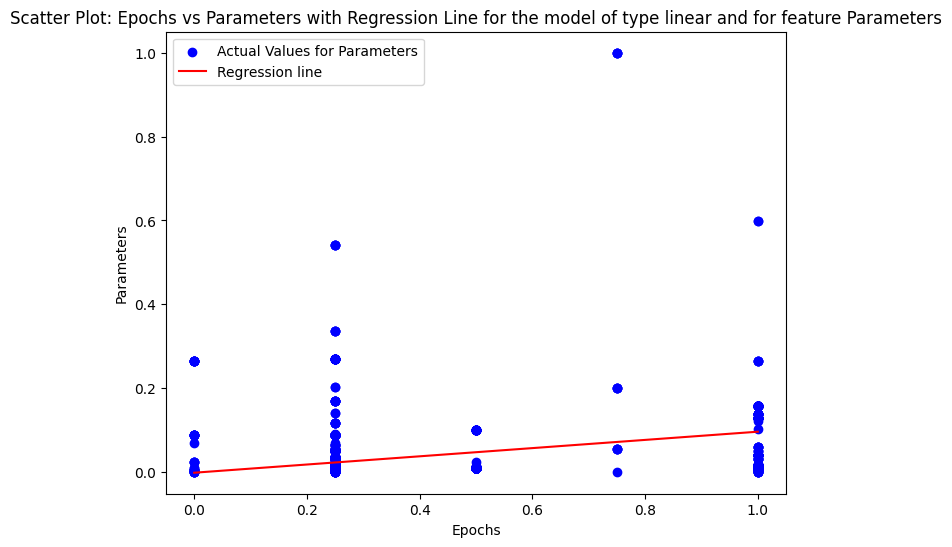

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 0.1958443074843844
data size: 0.013097060422039973
Training time (hours): 0.045167443179881944
Hardware unit Memory Size (bytes): 0.06275523724479701
Epochs: 0.06076855500429036
Batch size: 0.0008485713298748318
Hardware utilization: -0.006215642495599993
Domain_encoded: -0.0012930361657814212
Country_encoded: 0.010014425717051497
Organization_encoded: 0.07191841848287893
Date_encoded: 0.02782401592254536
Category_encoded: -0.011330165677293736
Task_encoded: -0.0005446398101938318
Confidence_encoded: -0.14180498024906432
accessibility_encoded: -0.023207061386164848
Training dataset_encoded: -0.014325163237806015
Training code accessibility_encoded: -0.03078913650592664
Training hardware_encoded: 0.02900317479678315
Notability_encoded: 0.005329458936590113
The main feature is Hardware quantity


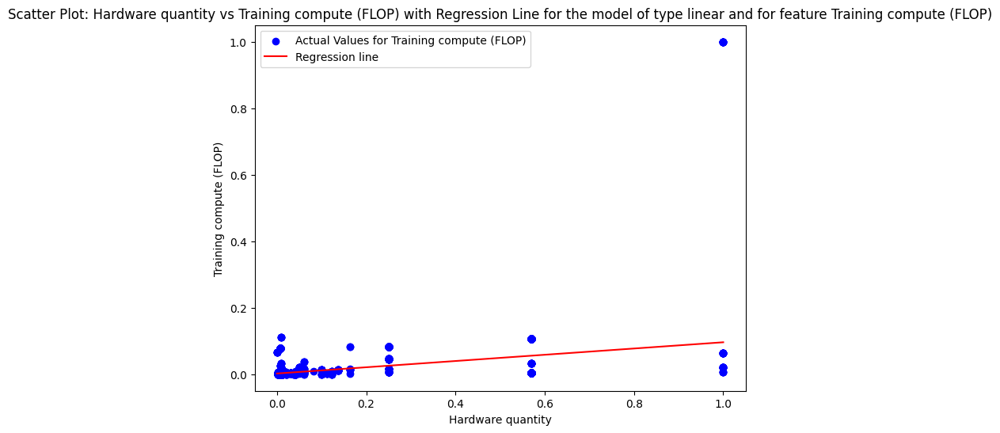

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 0.11659304782666834
data size: -0.049588926199309616
Training time (hours): -0.13608631073605096
Hardware unit Memory Size (bytes): 0.06902781306358172
Epochs: -0.037084998362833396
Batch size: -0.029139573397929504
Hardware utilization: 0.14092932115044582
Domain_encoded: -0.0070268186367931675
Country_encoded: -0.0349010391992121
Organization_encoded: 0.0251276680275355
Date_encoded: 0.04272681847531237
Category_encoded: -0.06477345433671397
Task_encoded: -0.004518760028690718
Confidence_encoded: 0.064560573914613
accessibility_encoded: 0.04357110962661219
Training dataset_encoded: -0.022171174602970845
Training code accessibility_encoded: 0.01732330594693971
Training hardware_encoded: -0.02836292797164966
Notability_encoded: 0.013796856602099275
The main feature is Hardware utilization


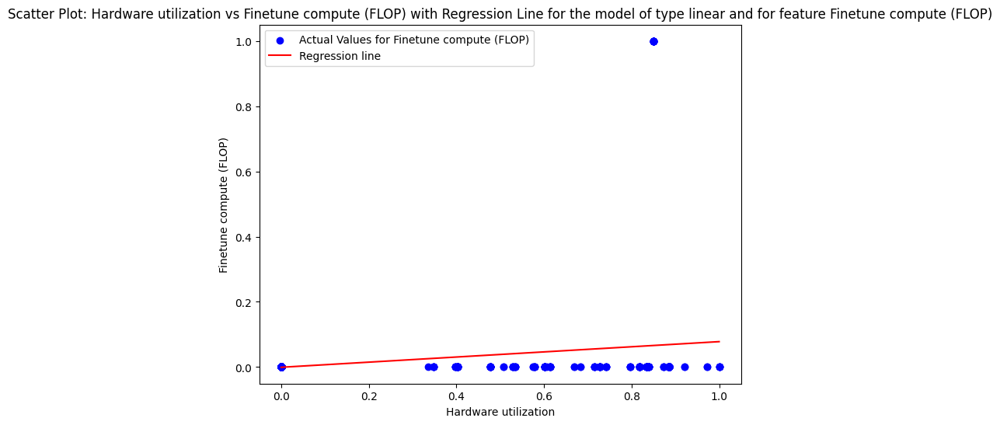

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 1.1346478895403311
data size: 0.07571604549939745
Training time (hours): -0.1345339263390054
Hardware unit Memory Size (bytes): -0.1303168998365556
Epochs: 0.09607605505238301
Batch size: 0.131325938897813
Hardware utilization: 0.14069736642115824
Domain_encoded: -0.0011279134506255277
Country_encoded: -0.1295783252666204
Organization_encoded: -0.15349128896106404
Date_encoded: 0.3749235724898956
Category_encoded: -0.08490198636700848
Task_encoded: 0.046081685541244075
Confidence_encoded: 0.22747543466245032
accessibility_encoded: 0.0027096781524542078
Training dataset_encoded: -0.22093409214336127
Training code accessibility_encoded: 0.16648437494398904
Training hardware_encoded: -0.18892434406918204
Notability_encoded: 0.04464211325571529
The main feature is Hardware quantity


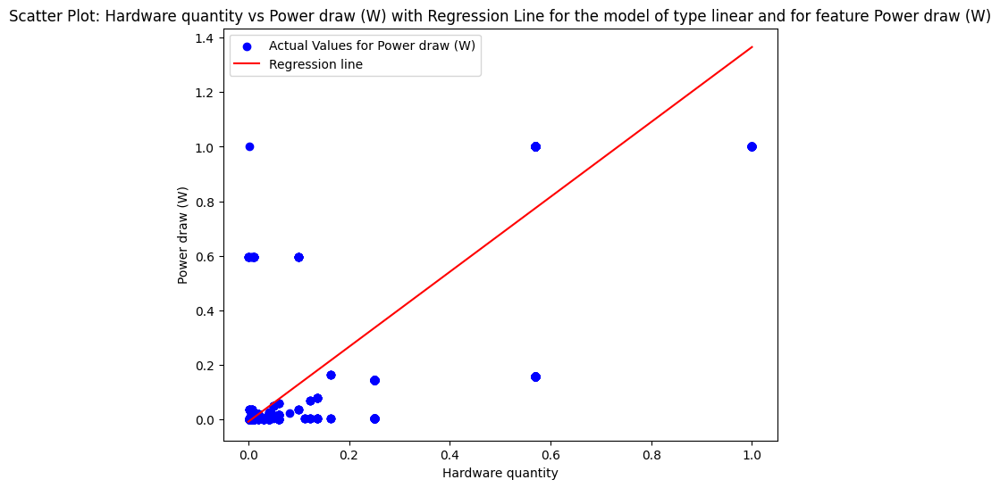

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 0.6604762572773233
data size: -0.011121456214626901
Training time (hours): -0.021095321889502194
Hardware unit Memory Size (bytes): 0.1857566218888253
Epochs: 0.14670737972713505
Batch size: 0.01765806045847293
Hardware utilization: 0.02817860798431381
Domain_encoded: -0.007443471421097293
Country_encoded: -0.009834601326755243
Organization_encoded: 0.13095679927042628
Date_encoded: 0.07698253233569222
Category_encoded: 0.006023579498830092
Task_encoded: -0.007205107182613941
Confidence_encoded: -0.13454619766738912
accessibility_encoded: 0.04568756542068
Training dataset_encoded: -0.022287298896089467
Training code accessibility_encoded: 0.020357241040707068
Training hardware_encoded: 0.1651955888920956
Notability_encoded: -0.06885601989610526
The main feature is Hardware quantity


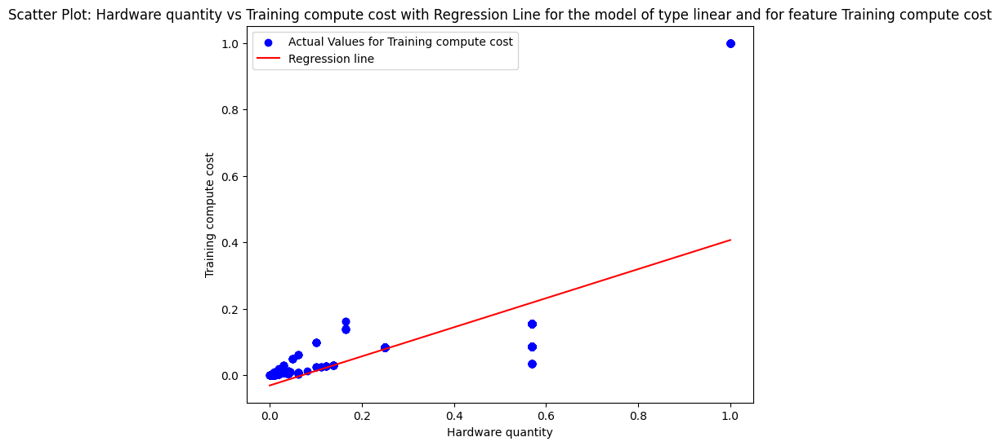

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 0.049250288202959396
data size: 0.0036468414617717845
Training time (hours): 0.006778542577506791
Hardware unit Memory Size (bytes): 0.00021307644909008316
Epochs: 0.11153900820495313
Batch size: -0.08018576131976002
Hardware utilization: 0.07898013884412464
Domain_encoded: -0.004395557272430497
Country_encoded: -0.023877410829602708
Organization_encoded: 0.0011736839440540947
Date_encoded: 0.018236903201334267
Category_encoded: 0.006151775679187141
Task_encoded: -0.0028267774295839963
Confidence_encoded: -0.028637642532783766
accessibility_encoded: 0.02934375096991867
Training dataset_encoded: -0.009937277510773333
Training code accessibility_encoded: -0.003949356000812196
Training hardware_encoded: 0.023569922989850747
Notability_encoded: -0.02500898833603049
The main feature is Epochs


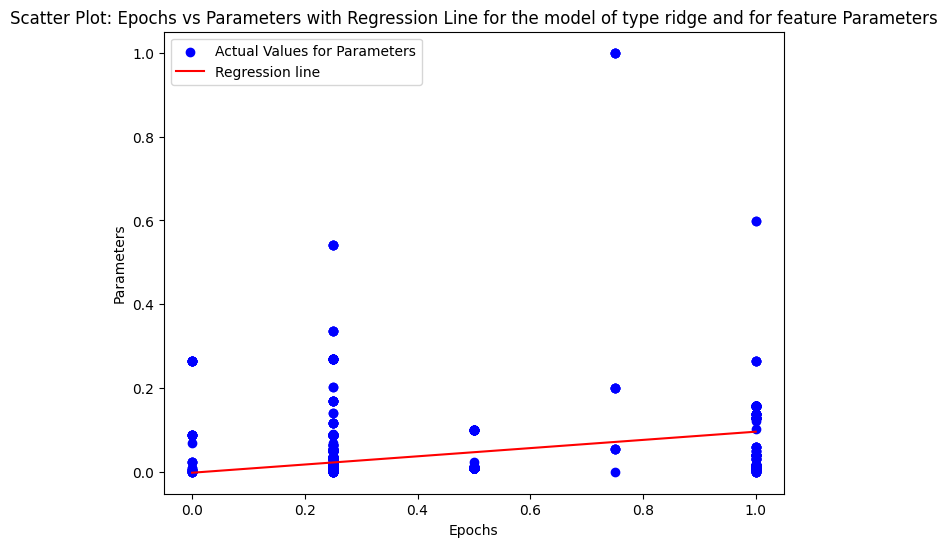

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 0.18790026701662846
data size: 0.011700221639426219
Training time (hours): 0.04568233681682922
Hardware unit Memory Size (bytes): 0.054372982919106506
Epochs: 0.06144225984012361
Batch size: 0.0034067007461713616
Hardware utilization: -0.006326909649584278
Domain_encoded: -0.0010343800563585419
Country_encoded: 0.0098800787974617
Organization_encoded: 0.07119935960926539
Date_encoded: 0.027572359727613502
Category_encoded: -0.010636369891336164
Task_encoded: -0.0007969345780946472
Confidence_encoded: -0.13843633854469228
accessibility_encoded: -0.023026006724267745
Training dataset_encoded: -0.012128979688676843
Training code accessibility_encoded: -0.029579961914535515
Training hardware_encoded: 0.030489227730301736
Notability_encoded: 0.005229907576122001
The main feature is Hardware quantity


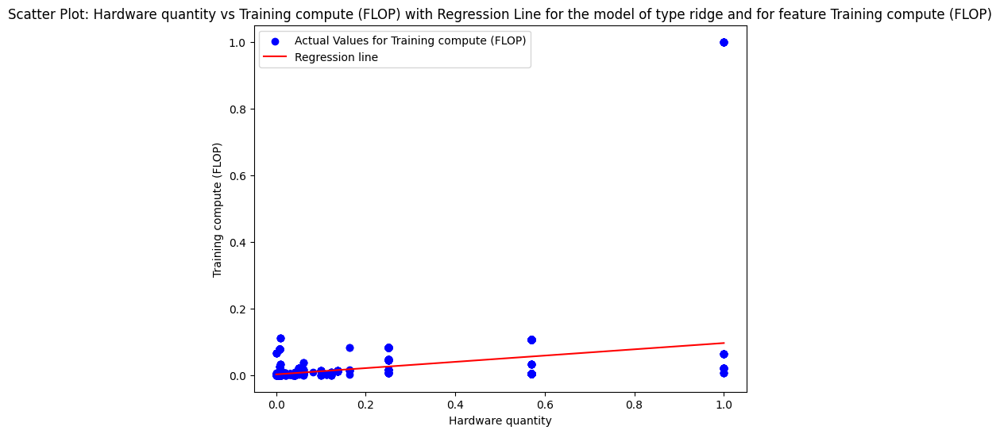

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 0.10813685391809517
data size: -0.04074883372331219
Training time (hours): -0.1303315350800079
Hardware unit Memory Size (bytes): 0.060518255459457757
Epochs: -0.03508391678102777
Batch size: -0.026311068840619203
Hardware utilization: 0.13648497487226552
Domain_encoded: -0.006509904420603111
Country_encoded: -0.034675861561544355
Organization_encoded: 0.023574592794929034
Date_encoded: 0.04224367784676435
Category_encoded: -0.06383307843310347
Task_encoded: -0.004600723711470577
Confidence_encoded: 0.06296670580766092
accessibility_encoded: 0.04234514628329541
Training dataset_encoded: -0.020396816941708144
Training code accessibility_encoded: 0.018086751743375144
Training hardware_encoded: -0.026241709721982264
Notability_encoded: 0.012556567287498035
The main feature is Hardware utilization


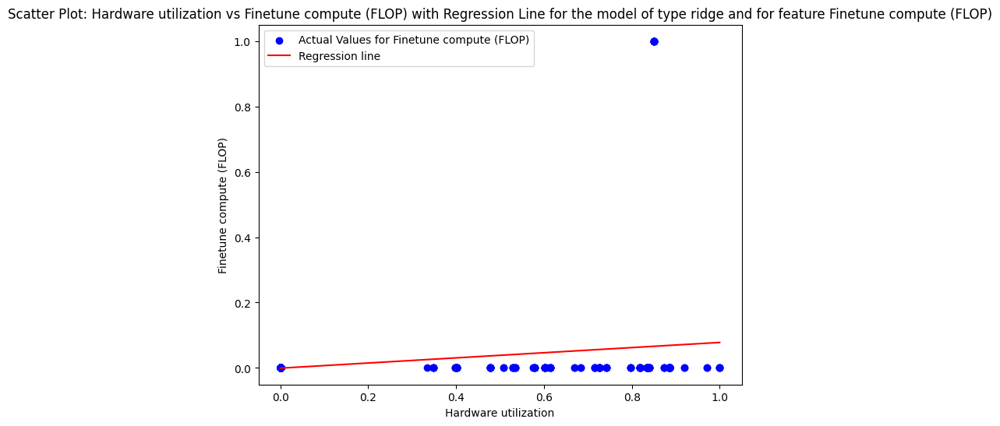

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 1.097110057172163
data size: 0.06453715893846382
Training time (hours): -0.11463177181446811
Hardware unit Memory Size (bytes): -0.14625960025272386
Epochs: 0.09553987269282428
Batch size: 0.13563047209892123
Hardware utilization: 0.1357929123630079
Domain_encoded: 0.0015110894181345426
Country_encoded: -0.12633859646290144
Organization_encoded: -0.15288556671042738
Date_encoded: 0.369575322413852
Category_encoded: -0.08260836961778543
Task_encoded: 0.04605283307317731
Confidence_encoded: 0.22728538670602724
accessibility_encoded: -0.003481419563806095
Training dataset_encoded: -0.20330860874838358
Training code accessibility_encoded: 0.16738785966034803
Training hardware_encoded: -0.1803509064896919
Notability_encoded: 0.046541010274120664
The main feature is Hardware quantity


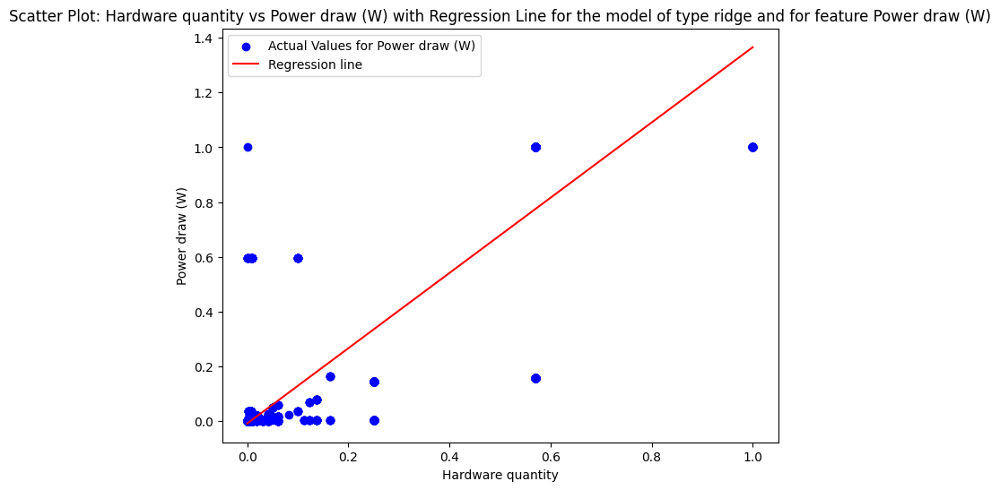

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 0.632118606493002
data size: -0.008158608309149095
Training time (hours): -0.012734777045649239
Hardware unit Memory Size (bytes): 0.1602963019743445
Epochs: 0.15118315912959213
Batch size: 0.022567980247151148
Hardware utilization: 0.027160360643199183
Domain_encoded: -0.006208663451514524
Country_encoded: -0.009568227354505476
Organization_encoded: 0.12889267857741427
Date_encoded: 0.0791326280888823
Category_encoded: 0.0060652449498808225
Task_encoded: -0.0078005276803801045
Confidence_encoded: -0.13188506284669388
accessibility_encoded: 0.04170783420012797
Training dataset_encoded: -0.01656397621548621
Training code accessibility_encoded: 0.023262001174392376
Training hardware_encoded: 0.16533492813453687
Notability_encoded: -0.06713609227354334
The main feature is Hardware quantity


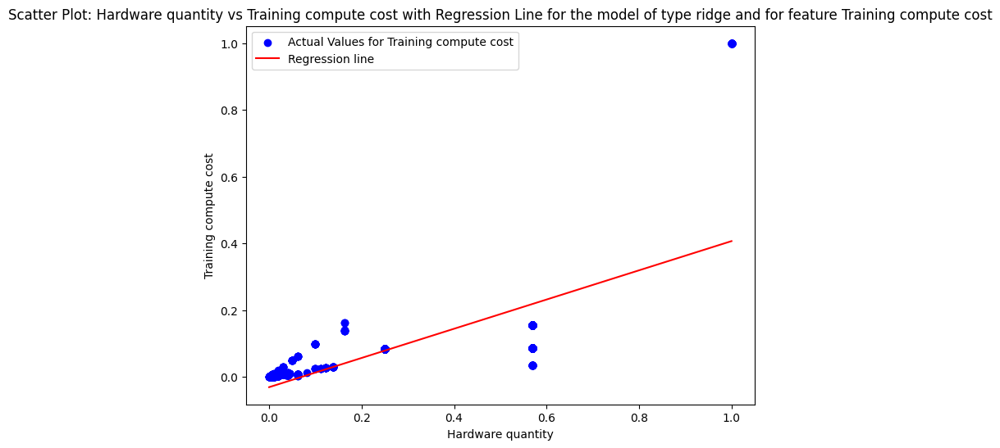

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: -0.0
data size: 0.0
Training time (hours): -0.0
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.0
Batch size: -0.0
Hardware utilization: 0.0
Domain_encoded: -0.0
Country_encoded: -0.0
Organization_encoded: 0.0
Date_encoded: -0.0
Category_encoded: 0.0
Task_encoded: -0.0
Confidence_encoded: -0.0
accessibility_encoded: 0.0
Training dataset_encoded: -0.0
Training code accessibility_encoded: -0.0
Training hardware_encoded: 0.0
Notability_encoded: -0.0
The main feature is Hardware quantity


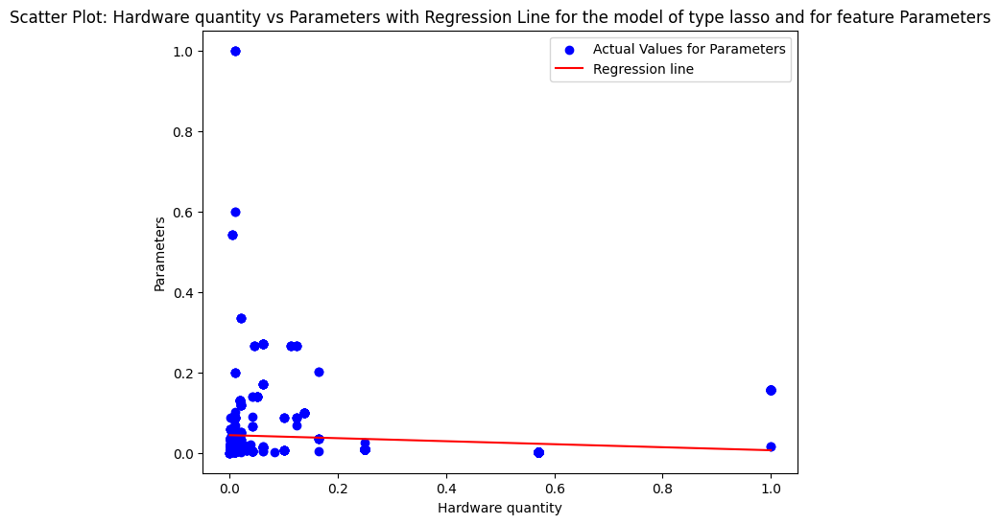

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.0
Hardware unit Memory Size (bytes): -0.0
Epochs: 0.0
Batch size: 0.0
Hardware utilization: -0.0
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.0
Category_encoded: -0.0
Task_encoded: -0.0
Confidence_encoded: -0.0
accessibility_encoded: -0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: -0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
The main feature is Hardware quantity


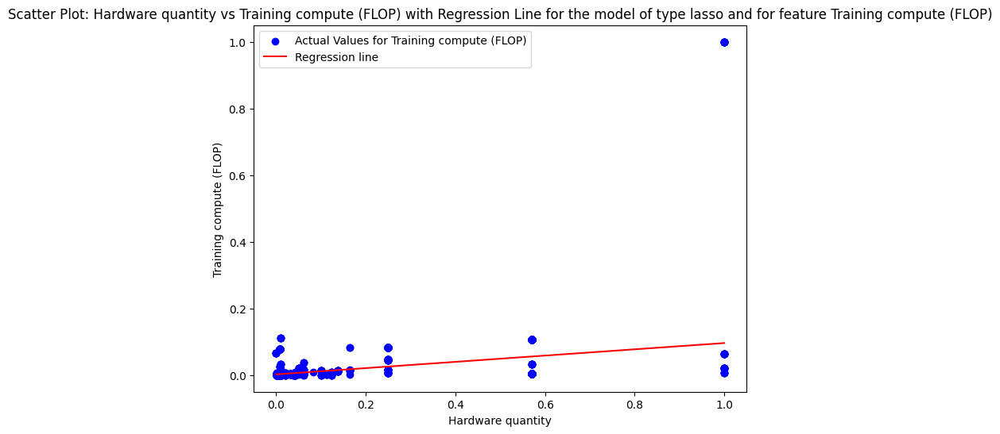

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: -0.0
data size: 0.0
Training time (hours): -0.0
Hardware unit Memory Size (bytes): 0.0
Epochs: -0.0
Batch size: -0.0
Hardware utilization: 0.0
Domain_encoded: -0.0
Country_encoded: -0.0
Organization_encoded: -0.0
Date_encoded: -0.0
Category_encoded: -0.0
Task_encoded: -0.0
Confidence_encoded: -0.0
accessibility_encoded: 0.0
Training dataset_encoded: -0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
The main feature is Hardware quantity


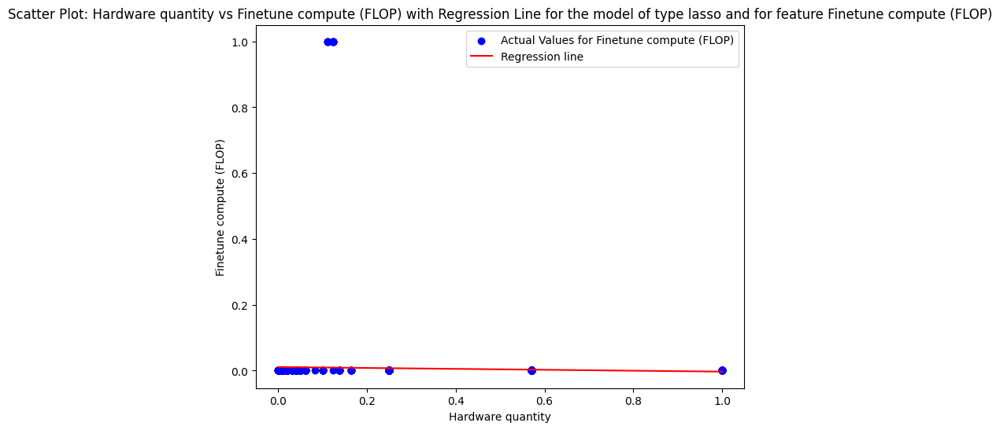

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.0
Hardware unit Memory Size (bytes): -0.0
Epochs: -0.0
Batch size: 0.0
Hardware utilization: -0.0
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: -0.0
Date_encoded: 0.0
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: -0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: -0.0
Notability_encoded: 0.0
The main feature is Hardware quantity


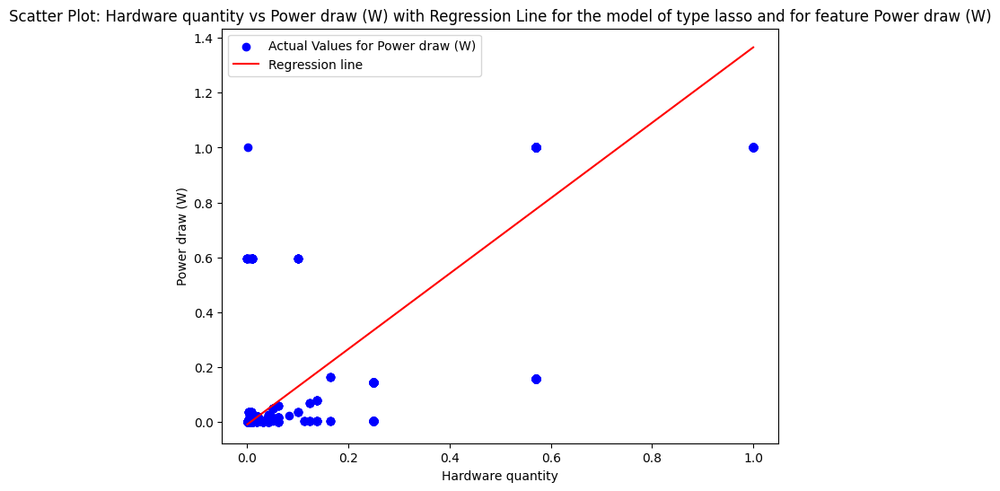

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.0
Hardware unit Memory Size (bytes): -0.0
Epochs: 0.0
Batch size: 0.0
Hardware utilization: -0.0
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.0
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: -0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
The main feature is Hardware quantity


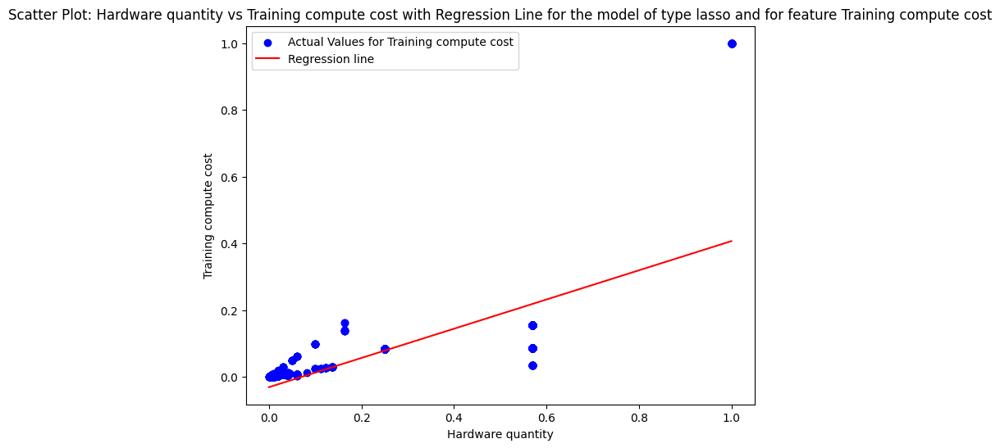

Running Models with Best Parameters:  20%|██        | 1/5 [00:02<00:11,  2.78s/it]

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.0001705405265491033
data size: 0.00014969426317016496
Training time (hours): 0.0004757742435964391
Hardware unit Memory Size (bytes): 0.0003469600063692611
Epochs: 0.0018503140436655862
Batch size: 0.0010736783336766217
Hardware utilization: 0.0006963425739290359
Domain_encoded: 7.105151880378927e-05
Country_encoded: 0.0004542867141538046
Organization_encoded: 0.00021527242059712166
Date_encoded: 0.0011473769463488436
Category_encoded: 7.11273703006999e-05
Task_encoded: 4.384202851821281e-05
Confidence_encoded: 0.0022891453759830605
accessibility_encoded: 0.0005073832959509126
Training dataset_encoded: 0.00027621697302702655
Training code accessibility_encoded: 0.0016641924104378006
Training hardware_encoded: 0.0009260924742374926
Notability_encoded: 0.00031650882293411735

Most influential feature according to permutation importance: Confidence_encoded


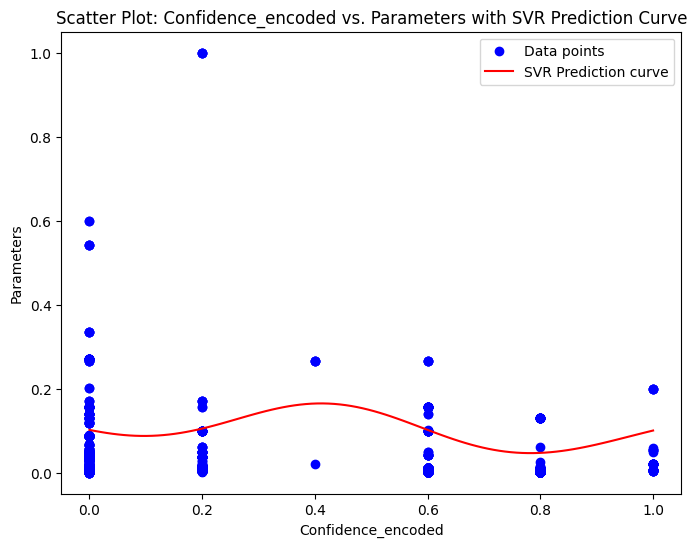

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: -0.0001376807565913062
data size: 1.9804371297494316e-05
Training time (hours): 0.00016360718877542186
Hardware unit Memory Size (bytes): 4.5023622286804144e-05
Epochs: 0.0002897463718175815
Batch size: 6.939078056701873e-05
Hardware utilization: -3.118312522596544e-05
Domain_encoded: -0.0008328053206363232
Country_encoded: -0.00018059478727120194
Organization_encoded: 5.862519879725764e-05
Date_encoded: 0.006940638777683089
Category_encoded: -0.0001363411907390444
Task_encoded: -0.00013242057025352142
Confidence_encoded: 0.001667705746003622
accessibility_encoded: 9.683569587417441e-05
Training dataset_encoded: -0.00017663705127472575
Training code accessibility_encoded: -0.00014039716931929288
Training hardware_encoded: 0.0002495365957464085
Notability_encoded: 0.00035414175512898884

Most influential feature according to permutation importance: Date_encoded


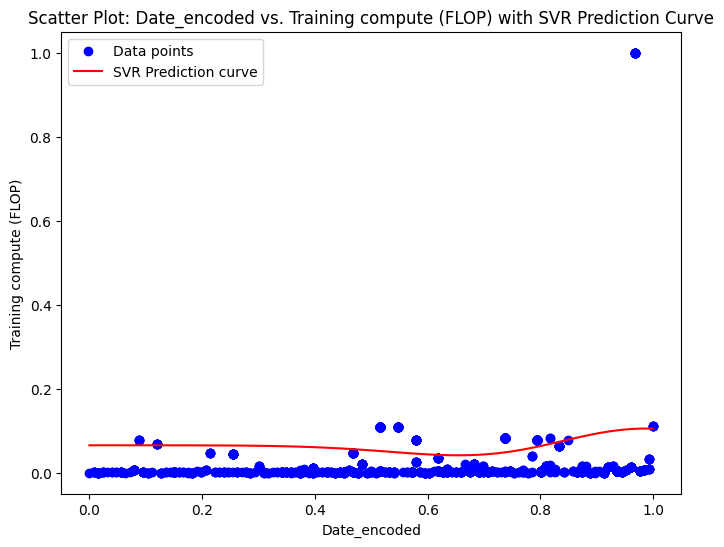

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.0003607212300591059
data size: 0.0001879201480931627
Training time (hours): 0.0021332418390159194
Hardware unit Memory Size (bytes): 0.000294262950697235
Epochs: 0.0010932040256078578
Batch size: 0.00025503684223199724
Hardware utilization: 0.00546557798944739
Domain_encoded: 7.794289267066736e-05
Country_encoded: 0.002851964066661483
Organization_encoded: 0.000175308544716759
Date_encoded: 0.0009510095868514364
Category_encoded: 1.7546035123800235e-05
Task_encoded: 0.00011298400354011716
Confidence_encoded: 0.0008384311926417356
accessibility_encoded: 0.0009820617959930826
Training dataset_encoded: 0.0004902455042973889
Training code accessibility_encoded: 0.00036359326866259494
Training hardware_encoded: 0.0006772510005044067
Notability_encoded: 0.00027229490548266743

Most influential feature according to permutation importance: Hardware utilization


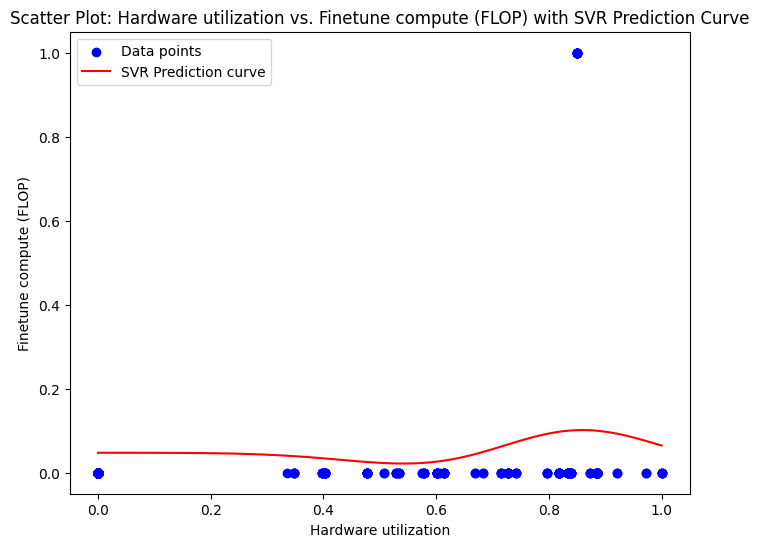

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.034730065946417345
data size: 0.004254849206741347
Training time (hours): 0.007353699705879259
Hardware unit Memory Size (bytes): 0.008996486452074062
Epochs: 0.01524243014576257
Batch size: 0.006457892173400009
Hardware utilization: 0.004453411574845833
Domain_encoded: 0.00025869110818549525
Country_encoded: 0.001662139133421193
Organization_encoded: 0.009161176289346375
Date_encoded: 0.03543964289359365
Category_encoded: 0.003486660098248827
Task_encoded: -6.58574158984163e-05
Confidence_encoded: 0.04996005491882506
accessibility_encoded: 0.003257474599736479
Training dataset_encoded: 0.0040168715811527145
Training code accessibility_encoded: 0.005289867140454339
Training hardware_encoded: 0.019103959894759385
Notability_encoded: 0.03436041509516112

Most influential feature according to permutation importance: Confidence_encoded


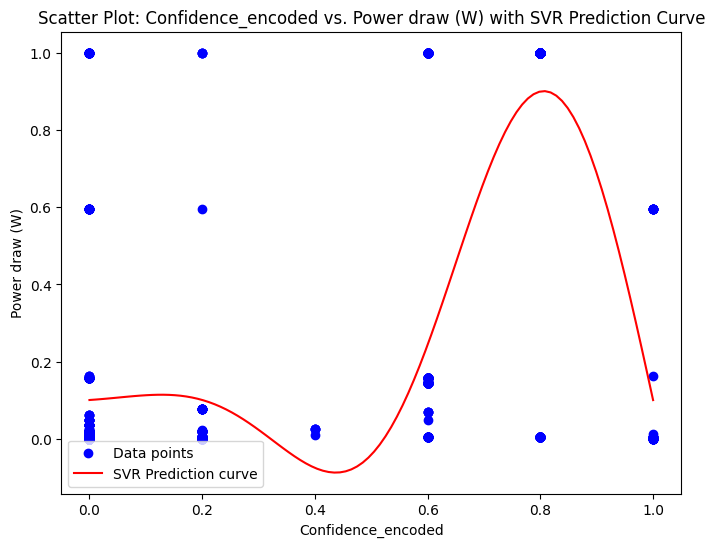

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.01433211672279544
data size: 0.0004195734321804401
Training time (hours): 0.0015218647125213934
Hardware unit Memory Size (bytes): 0.00037031244703146125
Epochs: 0.007326234579080706
Batch size: 0.0017868014770854117
Hardware utilization: 0.0007231868386073309
Domain_encoded: 0.00030314707310463446
Country_encoded: 0.0009285379090440835
Organization_encoded: 0.004785068604684679
Date_encoded: 0.0005098023279276952
Category_encoded: 0.000380667417576811
Task_encoded: 1.4638272015027495e-05
Confidence_encoded: 0.0006005405513772647
accessibility_encoded: 0.0004568359931415186
Training dataset_encoded: 0.000750337520408115
Training code accessibility_encoded: 0.001040469412997809
Training hardware_encoded: 0.0034055686660947166
Notability_encoded: 0.0003928482255383347

Most influential feature according to permutation importance: Hardware quantity


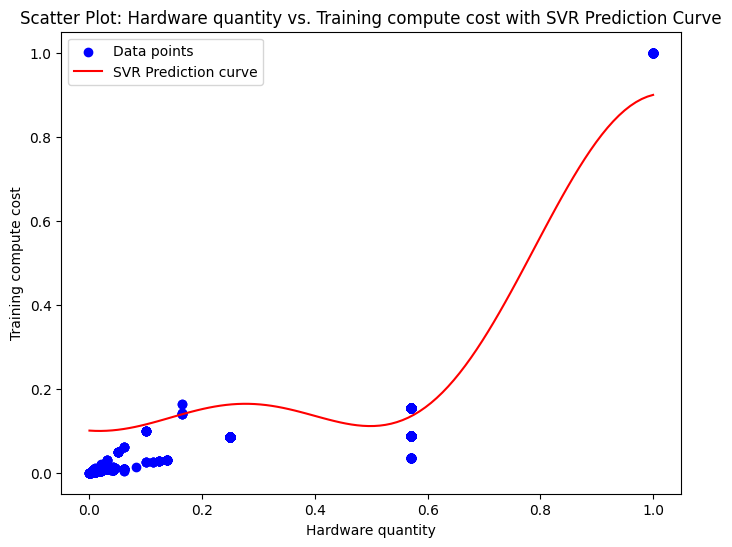

Running Models with Best Parameters:  40%|████      | 2/5 [00:04<00:06,  2.01s/it]

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.0571122453744102
data size: 0.0002477447951829869
Training time (hours): 0.025969157050998514
Hardware unit Memory Size (bytes): 0.004067229940784178
Epochs: 0.030636445573802757
Batch size: 0.10247552852284056
Hardware utilization: 0.11511373928363748
Domain_encoded: 2.4465601521672944e-15
Country_encoded: 0.0027240279637711774
Organization_encoded: 0.03928408756035707
Date_encoded: 0.43427125607911576
Category_encoded: 2.488449724936695e-05
Task_encoded: 4.5527903239397006e-05
Confidence_encoded: 0.007223260727024508
accessibility_encoded: 0.0789088787652619
Training dataset_encoded: 0.03839866826067177
Training code accessibility_encoded: 0.000328933825330629
Training hardware_encoded: 0.06015289890818076
Notability_encoded: 0.0030154849681385118

Most influential feature according to permutation importance: Date_encoded


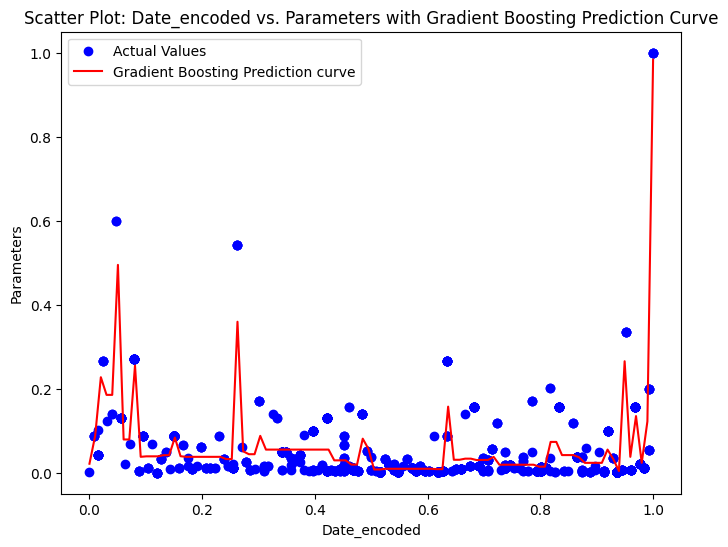

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.09917488966335344
data size: 0.0
Training time (hours): 0.0008304476230793993
Hardware unit Memory Size (bytes): 0.027873767894702504
Epochs: 0.008554339990565476
Batch size: 0.09034700168479902
Hardware utilization: 0.4832218069790104
Domain_encoded: 8.786182268103739e-08
Country_encoded: 2.473501313162039e-05
Organization_encoded: 0.08559055803798278
Date_encoded: 0.01029479029201709
Category_encoded: 0.0
Task_encoded: 6.320750753917569e-09
Confidence_encoded: 0.00013710167338307512
accessibility_encoded: 0.10964045487353434
Training dataset_encoded: 7.803395992486622e-09
Training code accessibility_encoded: 0.0388326543488421
Training hardware_encoded: 0.04213959640758965
Notability_encoded: 0.003337753532039805

Most influential feature according to permutation importance: Hardware utilization


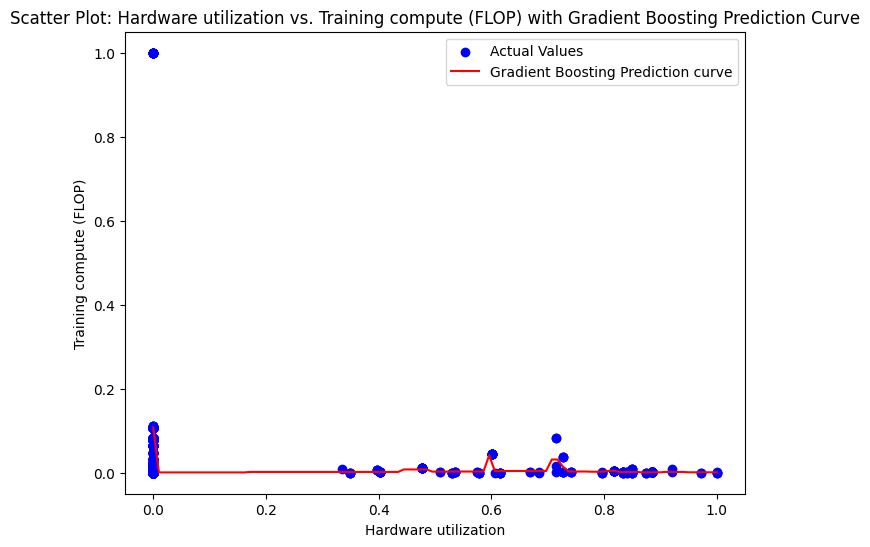

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.10323015287813327
data size: 0.0
Training time (hours): 0.4607137372306453
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.08816148485491056
Batch size: 0.007975241795111701
Hardware utilization: 0.07073858978264293
Domain_encoded: 0.0
Country_encoded: 0.1344759168004606
Organization_encoded: 0.0
Date_encoded: 0.01565489803794714
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.11883011983428331
accessibility_encoded: 0.0
Training dataset_encoded: 0.0002198587858652512
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0

Most influential feature according to permutation importance: Training time (hours)


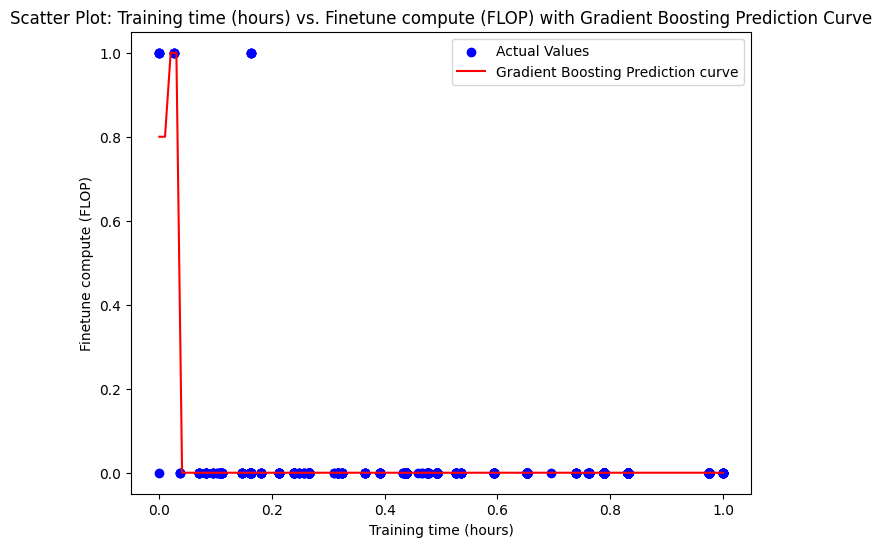

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.793721023754486
data size: 0.0
Training time (hours): 0.0009210171393165158
Hardware unit Memory Size (bytes): 0.005013570627234791
Epochs: 0.0053215812044800255
Batch size: 0.006083749683417912
Hardware utilization: 0.15340954163506684
Domain_encoded: -3.0818964529860895e-16
Country_encoded: 0.0006151171175744176
Organization_encoded: 0.016288703167528517
Date_encoded: 0.008372382824557285
Category_encoded: 7.573861053905997e-09
Task_encoded: 1.6029145841749914e-06
Confidence_encoded: 0.00015286405583764089
accessibility_encoded: 0.0004537515302425984
Training dataset_encoded: 0.0001196354046598047
Training code accessibility_encoded: 9.364029738749282e-06
Training hardware_encoded: 0.002422373802266588
Notability_encoded: 0.0070937135351471755

Most influential feature according to permutation importance: Hardware quantity


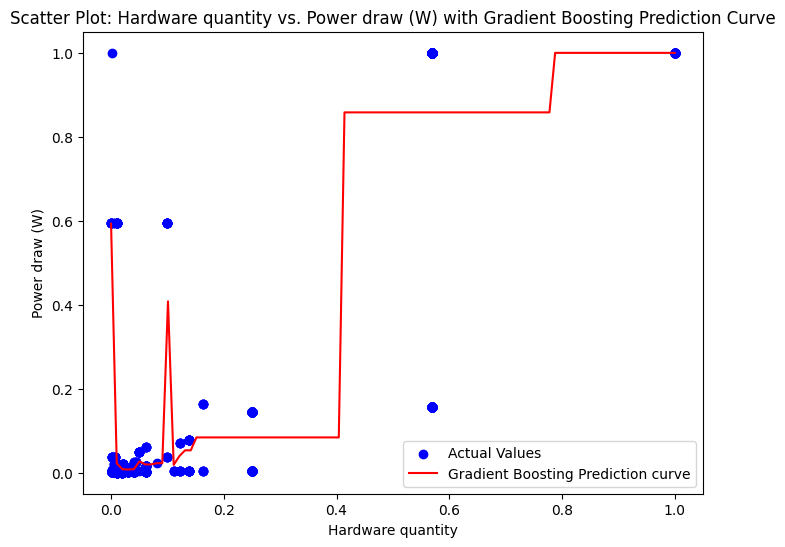

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.5185668207849498
data size: 1.0135725197017736e-06
Training time (hours): 1.7296365799402598e-05
Hardware unit Memory Size (bytes): 0.0011066114459631392
Epochs: 7.237128010222163e-06
Batch size: 0.000347344004286368
Hardware utilization: 0.013974978392881282
Domain_encoded: 1.9604350893623857e-06
Country_encoded: 1.4623317322461114e-06
Organization_encoded: 0.4477427447823681
Date_encoded: 0.009127441484353694
Category_encoded: 0.0
Task_encoded: 1.7562097154303134e-15
Confidence_encoded: 0.007867815094589807
accessibility_encoded: 0.00046100188699590554
Training dataset_encoded: 0.0003115071102222577
Training code accessibility_encoded: 5.002501812438249e-06
Training hardware_encoded: 0.0004317144587406249
Notability_encoded: 2.8048219683960083e-05

Most influential feature according to permutation importance: Hardware quantity


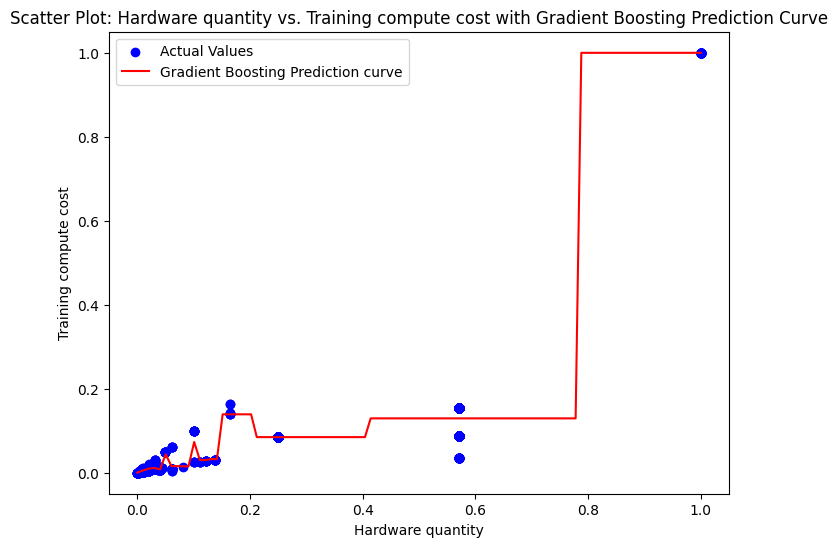

Running Models with Best Parameters:  60%|██████    | 3/5 [00:06<00:04,  2.05s/it]

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.04796515872389176
data size: 0.0006644020683458227
Training time (hours): 0.042261312922285466
Hardware unit Memory Size (bytes): 0.01856095320503947
Epochs: 0.046463174969267385
Batch size: 0.03343121609802932
Hardware utilization: 0.10390171590723385
Domain_encoded: 5.300916980177108e-05
Country_encoded: 0.011175191674870268
Organization_encoded: 0.0581225610762623
Date_encoded: 0.471736106060013
Category_encoded: 0.0002691131300649615
Task_encoded: 0.0015536629047480388
Confidence_encoded: 0.00806548379192474
accessibility_encoded: 0.042142883309754936
Training dataset_encoded: 0.05046309427862323
Training code accessibility_encoded: 0.0017719073169022066
Training hardware_encoded: 0.05486555514060965
Notability_encoded: 0.006533498252331854

Most influential feature according to permutation importance: Date_encoded


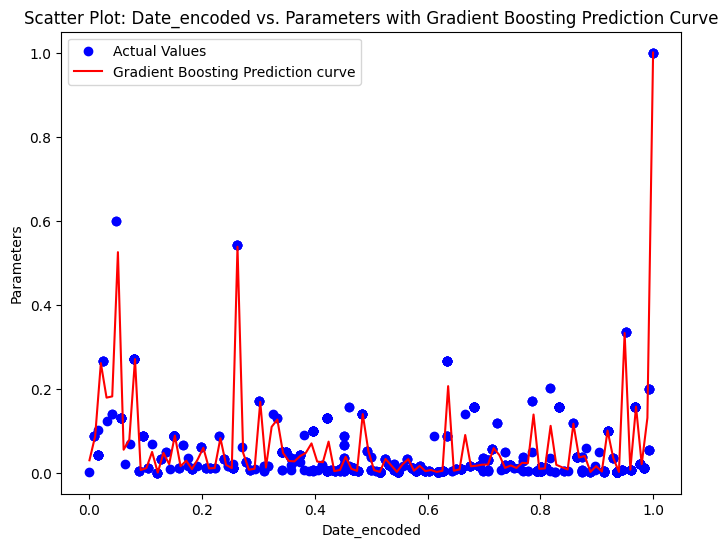

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.056892619446860894
data size: 3.1327723324963456e-07
Training time (hours): 0.00021212359875260003
Hardware unit Memory Size (bytes): 0.03554184522949671
Epochs: 0.054741415180776895
Batch size: 0.04608009743915227
Hardware utilization: 0.5298566722986873
Domain_encoded: 3.7915868085807036e-07
Country_encoded: 1.5218035741033812e-05
Organization_encoded: 0.03974298243977941
Date_encoded: 0.053125253342162976
Category_encoded: 4.786206927565694e-06
Task_encoded: 5.145777356393449e-06
Confidence_encoded: 0.0002627053058307513
accessibility_encoded: 0.06436215846341774
Training dataset_encoded: 9.105587980641242e-05
Training code accessibility_encoded: 0.03559989755167854
Training hardware_encoded: 0.04164576411937658
Notability_encoded: 0.04181956724828173

Most influential feature according to permutation importance: Hardware utilization


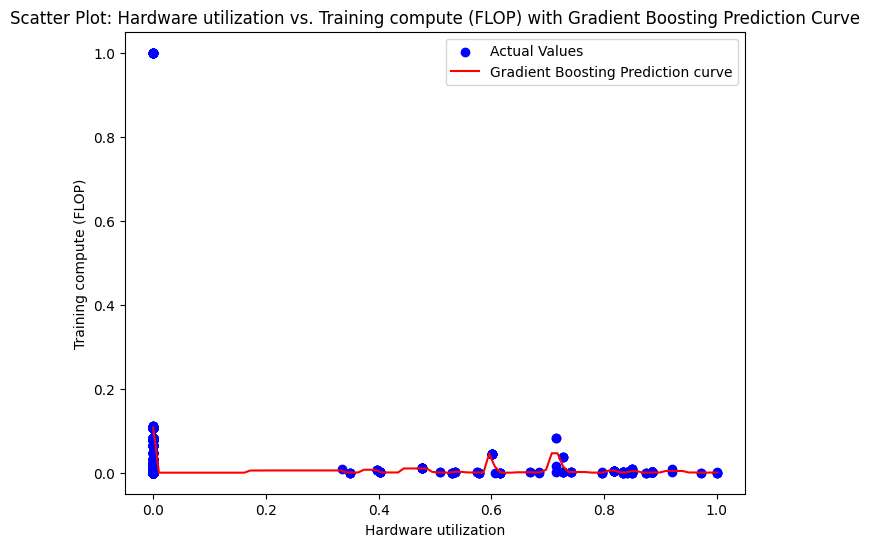

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.04776036871780106
data size: 0.0
Training time (hours): 0.42361342432470206
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.15207858658919074
Batch size: 0.007619282557022318
Hardware utilization: 0.12658272756238098
Domain_encoded: 0.0
Country_encoded: 0.17494994160230196
Organization_encoded: 0.008832983315281415
Date_encoded: 0.009267354721441103
Category_encoded: 0.0013054846317597077
Task_encoded: 0.0
Confidence_encoded: 0.03601059737623977
accessibility_encoded: 0.0
Training dataset_encoded: 0.011979248601878873
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0

Most influential feature according to permutation importance: Training time (hours)


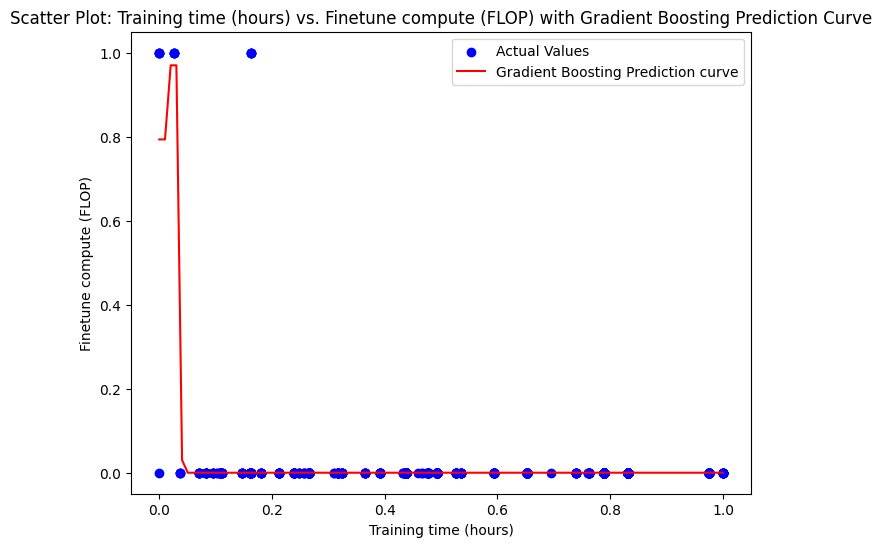

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.7971958976942989
data size: 7.579555655233079e-08
Training time (hours): 0.0006170247614218514
Hardware unit Memory Size (bytes): 0.003901752794510506
Epochs: 0.005209293615000809
Batch size: 0.006064751093802525
Hardware utilization: 0.15312082411628883
Domain_encoded: 0.00018998039037198302
Country_encoded: 0.00048405176181804733
Organization_encoded: 0.015249748540296053
Date_encoded: 0.006135405094444693
Category_encoded: 1.9541103614033454e-07
Task_encoded: 7.175384486064859e-05
Confidence_encoded: 0.000376871181245863
accessibility_encoded: 0.0003973324934197411
Training dataset_encoded: 0.0005773310543314248
Training code accessibility_encoded: 0.00011948505508576878
Training hardware_encoded: 0.004285931062169207
Notability_encoded: 0.006002294240040352

Most influential feature according to permutation importance: Hardware quantity


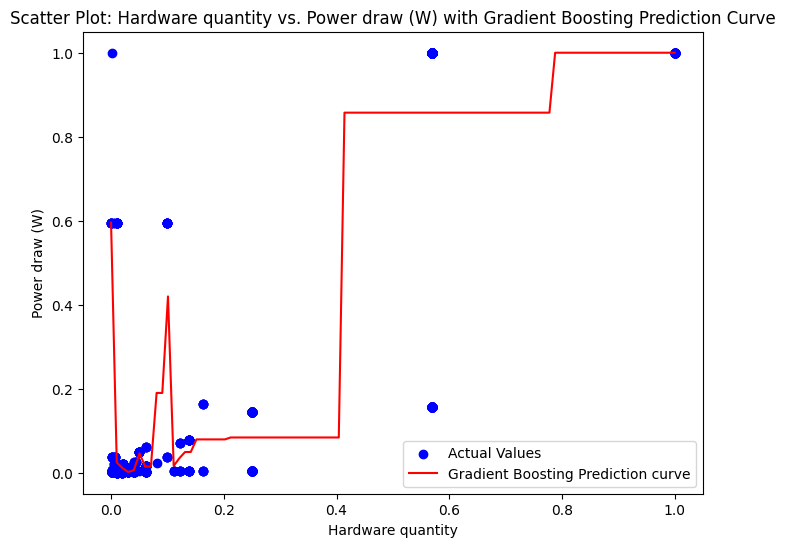

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.8964058990530137
data size: 8.130544101224702e-07
Training time (hours): 5.6646624926173824e-05
Hardware unit Memory Size (bytes): 0.00037303301988902905
Epochs: 0.0003442163056781437
Batch size: 0.00045389192509152394
Hardware utilization: 0.019925062684204266
Domain_encoded: 5.091787242241972e-05
Country_encoded: 3.6930921920038154e-06
Organization_encoded: 0.07783780202103252
Date_encoded: 0.0023680424267337693
Category_encoded: 3.6532695192480524e-07
Task_encoded: 1.3942588840469437e-06
Confidence_encoded: 9.748780814157701e-05
accessibility_encoded: 0.001744195488998585
Training dataset_encoded: 3.754447623373025e-06
Training code accessibility_encoded: 7.206541779604411e-07
Training hardware_encoded: 0.00028072846667601776
Notability_encoded: 5.133546895266714e-05

Most influential feature according to permutation importance: Hardware quantity


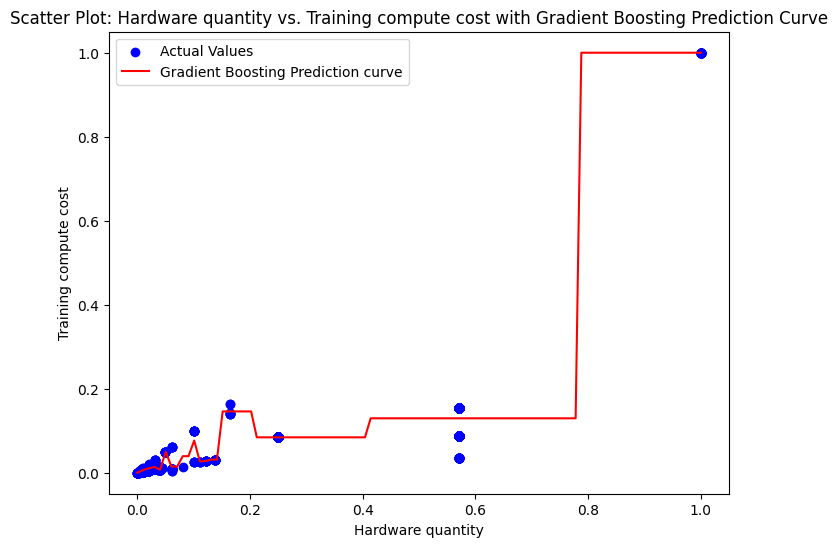

Running Models with Best Parameters:  80%|████████  | 4/5 [00:09<00:02,  2.45s/it]

Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.012639022033083992
data size: 0.00025933323189393444
Training time (hours): 0.03898411108652345
Hardware unit Memory Size (bytes): 0.040340091228278495
Epochs: 0.050328553492480055
Batch size: 0.011721211974586622
Hardware utilization: 0.08784782281301338
Domain_encoded: 5.321293359883716e-07
Country_encoded: 0.017818936903742817
Organization_encoded: 0.09756226780504258
Date_encoded: 0.48039325573605285
Category_encoded: 6.670093412909807e-05
Task_encoded: 0.0
Confidence_encoded: 0.001570253248947785
accessibility_encoded: 0.004817239816138675
Training dataset_encoded: 0.0713718855254715
Training code accessibility_encoded: 0.0006859427431791108
Training hardware_encoded: 0.07935313525345215
Notability_encoded: 0.0042397040446474675

Most influential feature according to permutation importance: Date_encoded


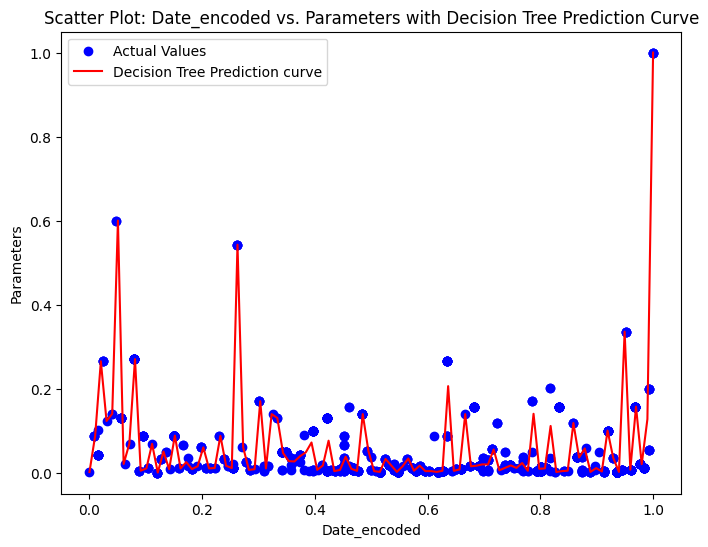

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.509907938987017
data size: 2.9348890615473774e-07
Training time (hours): 5.553191626686132e-05
Hardware unit Memory Size (bytes): 3.969163734181977e-06
Epochs: 0.0016136861995328469
Batch size: 1.8148366538084043e-06
Hardware utilization: 0.4842719416024805
Domain_encoded: 0.0
Country_encoded: 9.60315813728775e-06
Organization_encoded: 7.258826199388583e-05
Date_encoded: 0.0002645933009172148
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0001328161804038559
accessibility_encoded: 2.8376101744083845e-05
Training dataset_encoded: 1.9029500604824307e-07
Training code accessibility_encoded: 2.0175646466635162e-07
Training hardware_encoded: 0.00357876561125542
Notability_encoded: 5.768913948622962e-05

Most influential feature according to permutation importance: Hardware quantity


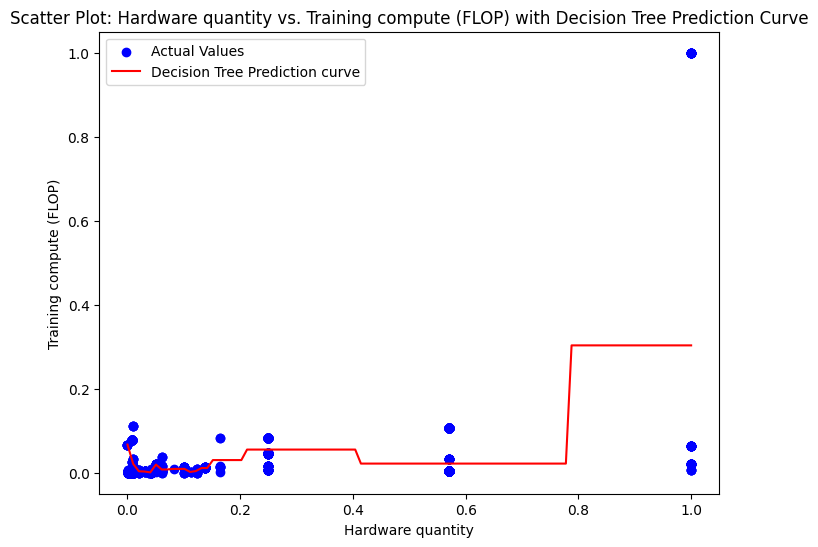

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.46071373723064685
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.08816148485490738
Batch size: 0.0
Hardware utilization: 0.35791717917179167
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.09320759874265404
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: 0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0

Most influential feature according to permutation importance: Training time (hours)


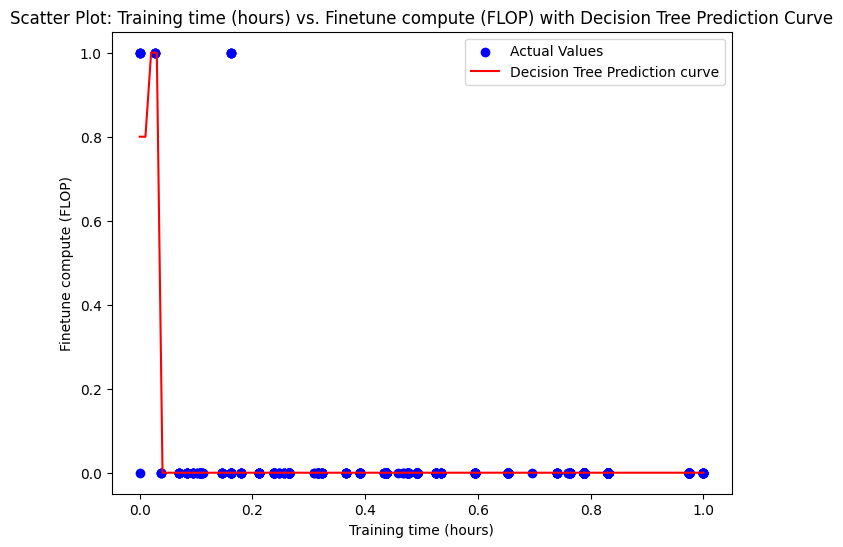

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.7914025328240626
data size: 4.6135833004084155e-08
Training time (hours): 3.451871876275381e-06
Hardware unit Memory Size (bytes): 4.5910289209358524e-06
Epochs: 6.556329003967405e-05
Batch size: 2.7953858646660905e-06
Hardware utilization: 0.15218264436552456
Domain_encoded: 0.0
Country_encoded: 0.002286610128006966
Organization_encoded: 0.043524823359305104
Date_encoded: 0.0010752237537993428
Category_encoded: 1.3065561834951976e-06
Task_encoded: 6.80453022059504e-07
Confidence_encoded: 0.00022984374891239998
accessibility_encoded: 1.929746948503748e-06
Training dataset_encoded: 0.002286159099230015
Training code accessibility_encoded: 0.0
Training hardware_encoded: 1.829575867199618e-05
Notability_encoded: 0.006913502493798547

Most influential feature according to permutation importance: Hardware quantity


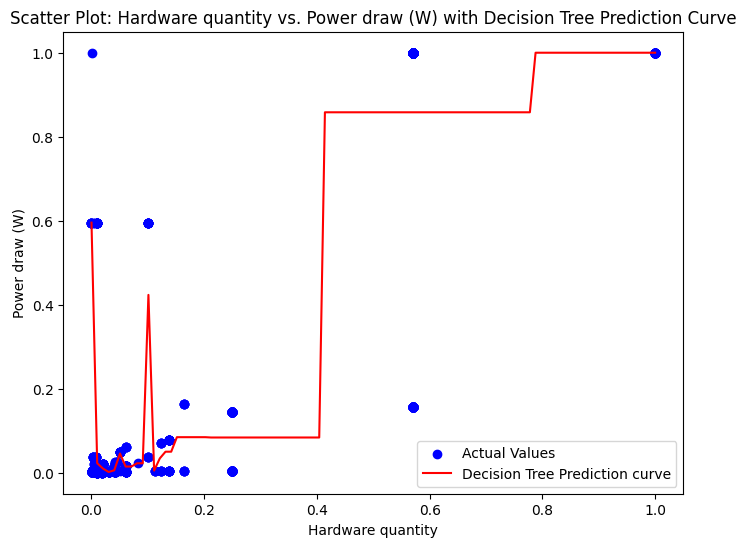

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.9743175667118161
data size: 5.175937540338891e-08
Training time (hours): 0.00014458440128247116
Hardware unit Memory Size (bytes): 2.7132951643378473e-05
Epochs: 0.0012119268307707127
Batch size: 0.000770051773169521
Hardware utilization: 0.021437860345924677
Domain_encoded: 3.683407453104587e-17
Country_encoded: 3.9435857520643666e-07
Organization_encoded: 1.5638584643898987e-06
Date_encoded: 9.2498161618174e-06
Category_encoded: 0.0
Task_encoded: 7.446309367112325e-10
Confidence_encoded: 0.0002737400457056426
accessibility_encoded: 0.0017079409483364324
Training dataset_encoded: 7.451542809369324e-07
Training code accessibility_encoded: 0.0
Training hardware_encoded: 9.493398426720502e-05
Notability_encoded: 2.2563155948605447e-06

Most influential feature according to permutation importance: Hardware quantit

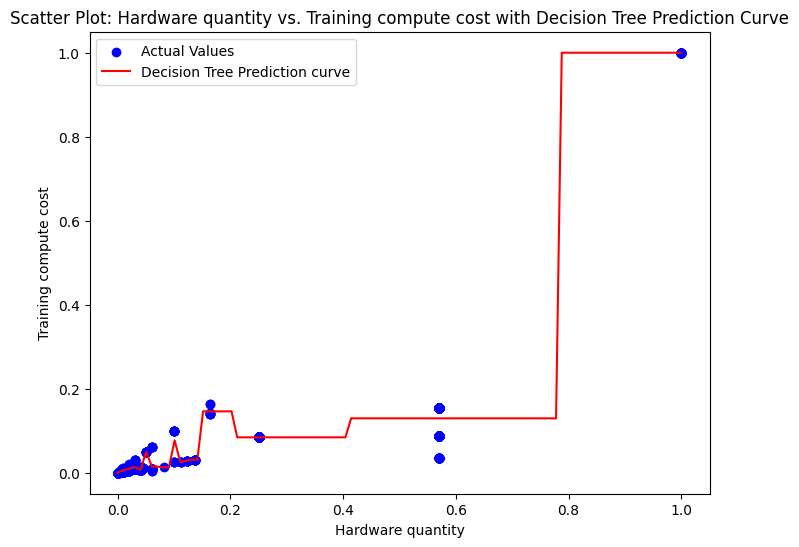

Running Models with Best Parameters: 100%|██████████| 5/5 [00:10<00:00,  2.08s/it]

--------------------------------------------------


In [ ]:
common_params['show_max_feature_graph'] = True
common_params['display_error'] = False
common_params['verbose'] = True
run_models(model_configs,common_params,store_err1)

## Experiment 2

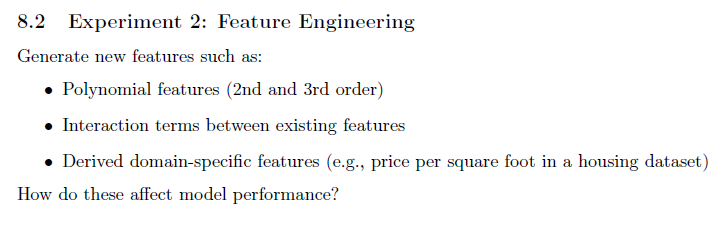

### Encoding Categorical Values using clustering using Umap, hdbscan

### Converting text column into features using sentence transformers

In [ ]:
df_new = df.copy()
obj_cols = df_new.select_dtypes(include=['object']).columns

df_new.columns

Index(['Model', 'Domain', 'Country', 'Organization', 'Date', 'Category',
       'Task', 'Confidence', 'accessibility', 'Training dataset',
       'Training code accessibility', 'Training hardware', 'Notability',
       'text', 'Hardware quantity', 'data size', 'Training time (hours)',
       'Hardware unit Release Price (USD)', 'Hardware unit TDP (W)',
       'Hardware unit Compute FLOPS', 'Hardware unit Compute OPS',
       'Hardware unit Memory Size (bytes)', 'Epochs', 'Batch size',
       'Hardware utilization', 'Parameters', 'Training compute (FLOP)',
       'Finetune compute (FLOP)', 'Power draw (W)', 'Training compute cost'],
      dtype='object')

### New Features

### Using Sentence Transformer
### "'all-MiniLM-L6-v2'"

In [ ]:
!pip install -U sentence-transformers torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 340.6/340.6 kB 6.1 MB/s eta 0:00:00


In [ ]:
from sentence_transformers import SentenceTransformer, util
import torch

In [ ]:
model = SentenceTransformer('thenlper/gte-small')

In [ ]:
!pip install umap-learn umap
!pip install hdbscan

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.5 MB/s eta 0:00:00
  Created wheel for umap: filename=umap-0.1.1-py3-none-any.whl size=3578 sha256=c2a57c67eab4fd88c6edbd0b5dd1051e71cbdf7fa623962d1d6eb4e1aa281b82
  Stored in directory: /root/.cache/pip/wheels/82/d8/73/e9eb3334baaad795ff0278363ff1aca7568bdf2793e452a527
Successfully built umap
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 44.7 MB/s eta 0:00:00


In [ ]:
from umap import UMAP
from hdbscan import HDBSCAN

### Create Clustering Function


In [ ]:

def generate_feature_encoding(data,feature,comp=100,n_cluster=50):
  data[feature] = data[feature].astype(str)
  embeddings = model.encode(data[feature].tolist(),
                            convert_to_tensor=True,
                            show_progress_bar=True)
  umap_model = UMAP(n_components=comp,
                    min_dist=0.0,
                    metric='cosine',
                    random_state=42)
  red_embeddings = umap_model.fit_transform(embeddings)
  cluster = HDBSCAN(min_cluster_size=n_cluster,
                    metric='euclidean',
                    cluster_selection_method='eom')
  cluster.fit(red_embeddings)
  data[f'{feature}_encoded'] = cluster.labels_
  return data



In [ ]:
obj_col = [col for col in obj_cols if col not in ['Model','text']]
obj_col

['Domain',
 'Country',
 'Organization',
 'Date',
 'Category',
 'Task',
 'Confidence',
 'accessibility',
 'Training dataset',
 'Training code accessibility',
 'Training hardware',
 'Notability']

In [ ]:
for col in tqdm(obj_col):
  df_new = generate_feature_encoding(df_new,col,n_cluster=20)


  0%|          | 0/12 [00:00<?, ?it/s]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
  8%|▊         | 1/12 [01:20<14:40, 80.02s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
 17%|█▋        | 2/12 [02:45<13:53, 83.34s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
 25%|██▌       | 3/12 [04:18<13:10, 87.84s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
 33%|███▎      | 4/12 [05:47<11:46, 88.33s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
 42%|████▏     | 5/12 [07:07<09:54, 84.99s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
 50%|█████     | 6/12 [08:32<08:31, 85.22s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
 58%|█████▊    | 7/12 [09:51<06:55, 83.12s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
 67%|██████▋   | 8/12 [11:22<05:42, 85.59s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
 75%|███████▌  | 9/12 [12:53<04:22, 87.44s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
 83%|████████▎ | 10/12 [14:16<02:51, 85.81s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
 92%|█████████▏| 11/12 [15:47<01:27, 87.41s/it]

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
100%|██████████| 12/12 [17:17<00:00, 86.45s/it]


In [ ]:
def calc_cos(row):
  row['Expected power (W)'] = row['Hardware quantity'] * row['Hardware unit TDP (W)']
  row['Training Energy'] = row['Training time (hours)'] * row['Power draw (W)']
  row['Expected Energy'] = row['Hardware quantity'] * row['Hardware unit TDP (W)'] * row['Training time (hours)']
  row['Expected compute flops'] = row['Hardware quantity'] * row['Hardware unit Compute FLOPS']
  return row

In [ ]:
df_new = df_new.progress_apply(calc_cos,axis=1)

100%|██████████| 1705/1705 [00:00<00:00, 2018.89it/s]


In [ ]:
df_new.columns

Index(['Model', 'Domain', 'Country', 'Organization', 'Date', 'Category',
       'Task', 'Confidence', 'accessibility', 'Training dataset',
       'Training code accessibility', 'Training hardware', 'Notability',
       'text', 'Hardware quantity', 'data size', 'Training time (hours)',
       'Hardware unit Release Price (USD)', 'Hardware unit TDP (W)',
       'Hardware unit Compute FLOPS', 'Hardware unit Compute OPS',
       'Hardware unit Memory Size (bytes)', 'Epochs', 'Batch size',
       'Hardware utilization', 'Parameters', 'Training compute (FLOP)',
       'Finetune compute (FLOP)', 'Power draw (W)', 'Training compute cost',
       'Domain_encoded', 'Country_encoded', 'Organization_encoded',
       'Date_encoded', 'Category_encoded', 'Task_encoded',
       'Confidence_encoded', 'accessibility_encoded',
       'Training dataset_encoded', 'Training code accessibility_encoded',
       'Training hardware_encoded', 'Notability_encoded', 'Expected power (W)',
       'Training Energy', 

In [ ]:
temp_path = "/content/drive/MyDrive/DATA 6250/Datasets/ML_Project/Experiment-2.csv"
df_new = pd.read_csv(temp_path)

In [ ]:
df_new.columns

Index(['Model', 'Domain', 'Country', 'Organization', 'Date', 'Category',
       'Task', 'Confidence', 'accessibility', 'Training dataset',
       'Training code accessibility', 'Training hardware', 'Notability',
       'text', 'Hardware quantity', 'data size', 'Training time (hours)',
       'Hardware unit Release Price (USD)', 'Hardware unit TDP (W)',
       'Hardware unit Compute FLOPS', 'Hardware unit Compute OPS',
       'Hardware unit Memory Size (bytes)', 'Epochs', 'Batch size',
       'Hardware utilization', 'Parameters', 'Training compute (FLOP)',
       'Finetune compute (FLOP)', 'Power draw (W)', 'Training compute cost',
       'Domain_encoded', 'Country_encoded', 'Organization_encoded',
       'Date_encoded', 'Category_encoded', 'Task_encoded',
       'Confidence_encoded', 'accessibility_encoded',
       'Training dataset_encoded', 'Training code accessibility_encoded',
       'Training hardware_encoded', 'Notability_encoded', 'Expected power (W)',
       'Training Energy', 

In [ ]:
sentence_model = SentenceTransformer('all-MiniLM-L6-v2')

In [ ]:
def gen_features(data,feature,n_features=30):
  data[feature] = data[feature].astype(str)
  embeddings = sentence_model.encode(data[feature].tolist(),
                            convert_to_tensor=True,
                            show_progress_bar=True)
  umap_model = UMAP(n_components=n_features,
                    min_dist=0.0,
                    metric='cosine',
                    random_state=42)
  red_embeddings = umap_model.fit_transform(embeddings)
  for i in range(n_features):
    data[f'feature_{feature} {i}'] = red_embeddings[:,i]
  return data

In [ ]:
df_new = gen_features(df_new,'text')

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [ ]:
for col in df_new.columns:
  print(col)

Model
Domain
Country
Organization
Date
Category
Task
Confidence
accessibility
Training dataset
Training code accessibility
Training hardware
Notability
text
Hardware quantity
data size
Training time (hours)
Hardware unit Release Price (USD)
Hardware unit TDP (W)
Hardware unit Compute FLOPS
Hardware unit Compute OPS
Hardware unit Memory Size (bytes)
Epochs
Batch size
Hardware utilization
Parameters
Training compute (FLOP)
Finetune compute (FLOP)
Power draw (W)
Training compute cost
Domain_encoded
Country_encoded
Organization_encoded
Date_encoded
Category_encoded
Task_encoded
Confidence_encoded
accessibility_encoded
Training dataset_encoded
Training code accessibility_encoded
Training hardware_encoded
Notability_encoded
Expected power (W)
Training Energy
Expected Energy
Expected compute flops
feature_text 0
feature_text 1
feature_text 2
feature_text 3
feature_text 4
feature_text 5
feature_text 6
feature_text 7
feature_text 8
feature_text 9
feature_text 10
feature_text 11
feature_text 12


In [ ]:
df_new['Scaled_Hardware_quantity'] = df_new['Hardware quantity'] / 10000
df_new['Scaled_data_size'] = df_new['data size'] / 1e+11
df_new['Scaled_time'] = df_new['Training time (hours)'] / 1000
df_new['Hardware unit Memory Size (bytes)'] = df_new['Hardware unit Memory Size (bytes)'] / 1e+10
df_new['Scaled_batch_size'] = df_new['Batch size'] / 1e+6

In [ ]:
for col in df_new.columns:
  print(repr(col))

'Model'
'Domain'
'Country'
'Organization'
'Date'
'Category'
'Task'
'Confidence'
'accessibility'
'Training dataset'
'Training code accessibility'
'Training hardware'
'Notability'
'text'
'Hardware quantity'
'data size'
'Training time (hours)'
'Hardware unit Release Price (USD)'
'Hardware unit TDP (W)'
'Hardware unit Compute FLOPS'
'Hardware unit Compute OPS'
'Hardware unit Memory Size (bytes)'
'Epochs'
'Batch size'
'Hardware utilization'
'Parameters'
'Training compute (FLOP)'
'Finetune compute (FLOP)'
'Power draw (W)'
'Training compute cost'
'Domain_encoded'
'Country_encoded'
'Organization_encoded'
'Date_encoded'
'Category_encoded'
'Task_encoded'
'Confidence_encoded'
'accessibility_encoded'
'Training dataset_encoded'
'Training code accessibility_encoded'
'Training hardware_encoded'
'Notability_encoded'
'Expected power (W)'
'Training Energy'
'Expected Energy'
'Expected compute flops'
'feature_text 0'
'feature_text 1'
'feature_text 2'
'feature_text 3'
'feature_text 4'
'feature_text 5'
'fea

In [ ]:
num_cols = [col for col in df_new.select_dtypes(include=np.number).columns if col not in out_cols]
obj_cols = [col for col in df_new.select_dtypes(include=['object']).columns]
print(num_cols)
print(obj_cols)
print(out_cols)

['Hardware quantity', 'data size', 'Training time (hours)', 'Hardware unit Release Price (USD)', 'Hardware unit TDP (W)', 'Hardware unit Compute FLOPS', 'Hardware unit Compute OPS', 'Hardware unit Memory Size (bytes)', 'Epochs', 'Batch size', 'Hardware utilization', 'Domain_encoded', 'Country_encoded', 'Organization_encoded', 'Date_encoded', 'Category_encoded', 'Task_encoded', 'Confidence_encoded', 'accessibility_encoded', 'Training dataset_encoded', 'Training code accessibility_encoded', 'Training hardware_encoded', 'Notability_encoded', 'Expected power (W)', 'Training Energy', 'Expected Energy', 'Expected compute flops', 'feature_text 0', 'feature_text 1', 'feature_text 2', 'feature_text 3', 'feature_text 4', 'feature_text 5', 'feature_text 6', 'feature_text 7', 'feature_text 8', 'feature_text 9', 'feature_text 10', 'feature_text 11', 'feature_text 12', 'feature_text 13', 'feature_text 14', 'feature_text 15', 'feature_text 16', 'feature_text 17', 'feature_text 18', 'feature_text 19',

In [ ]:
df_exp2 = df_new.copy()
exp2_cols = num_cols

### Apply Grid Search

In [ ]:
Apply_Grid_Search(df_new,num_cols,out_cols,results)

Hyperparameter Tuning:  86%|████████▌ | 6/7 [41:52<03:53, 233.40s/it]/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.008e+25, tolerance: 3.639e+21
  model = cd_fast.enet_coordinate_descent(
Hyperparameter Tuning: 100%|██████████| 7/7 [41:52<00:00, 358.92s/it]

Model: SVR
Best parameters: {'svr__C': 10, 'svr__gamma': 'scale', 'svr__kernel': 'linear'}
Best R-squared score: -0.15355695177387588
--------------------
Model: Gradient Boosting
Best parameters: {'learning_rate': 0.5, 'max_depth': 2, 'n_estimators': 160}
Best R-squared score: 0.9222552144477781
--------------------
Model: Random Forest
Best parameters: {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 10}
Best R-squared score: 0.8226238316160608
--------------------
Model: Decision Tree
Best parameters: {'max_depth': 11, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best R-squared score: 0.8395725370337773
--------------------
Model: Linear Regression
Best parameters: None (default parameters)
Best R-squared score: -0.7851752416935309
--------------------
Model: Ridge
Best parameters: {'ridge__alpha': 1000}
Best R-squared score: 0.0933682556355464
--------------------
Model: Lasso
Best parameters: {'lasso__alpha': 0.001}
Best R-squared score: -0.8155622690678268
------------

In [ ]:
model_configs,common_params = get_model_config(df_new,num_cols,out_cols,results)

In [ ]:
common_params['show_max_feature_graph'] = False
common_params['display_error'] = True
common_params['verbose'] = True
store_err2={}
run_models(model_configs,common_params,store_err2)

Running Models with Best Parameters:   0%|          | 0/5 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Linear Regression (Linear)
Showing Errors for Parameters
The Mean_Absolute_Error Error is: 67534761040.590385
The Mean_Squared_Error Error is: 1.8811747127211483e+22
The Root_Mean_Squared_Error Error is: 137155922683.67955
The Median_Absolute_Error Error is: 45486321503.00786
The Mean_Absolute_Percentage_Error Error is: 5.804718768844188
The Mean_Squared_Log_Error Error is: 22.525158441445416
The R2 Error is: 0.17959770974177358
The Explained_Variance Error is: 0.18280554463943
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.8111129926392769
The Root_Relative_Squared_Error Error is: 0.9057606142122909
The Adjusted_R2 Error is: 0.00022659968531546504

--------------------------------------------------
Linear Regression (Linear)
Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 1.3574051400720688e+25
The Mean_Squared_Error Error is: 1.4169682595153828e+51
The Root_Mean_Squared_Error Error is: 3.764263884898856e+25
The Median_Absolute_Er

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=7.44493e-43): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=7.44493e-43): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/

Linear Regression (Linear)
Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error is: 6.187704077461231
The Mean_Squared_Error Error is: 699.9441816527703
The Root_Mean_Squared_Error Error is: 26.456458222006404
The Median_Absolute_Error Error is: 4.362707263254151
The Mean_Absolute_Percentage_Error Error is: 0.0031223369914807155
The Mean_Squared_Log_Error Error is: 0.00017143927298506845
The R2 Error is: 0.039882600414186675
The Explained_Variance Error is: 0.03993399311164769
The Log_Cosh_Error Error is: 5.5351244381045905
The Relative_Absolute_Error Error is: 1.2270588942491583
The Root_Relative_Squared_Error Error is: 0.9798558055070212
The Adjusted_R2 Error is: -0.17003554071389426

--------------------------------------------------
Linear Regression (Linear)
Showing Errors for Power draw (W)
The Mean_Absolute_Error Error is: 1748280.7116518838
The Mean_Squared_Error Error is: 15064745784531.549
The Root_Mean_Squared_Error Error is: 3881332.9906787886
The Median

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.993e+24, tolerance: 3.388e+21
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.967e+53, tolerance: 2.987e+50
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(

Linear Regression (Lasso)
Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 1.186447279788749e+25
The Mean_Squared_Error Error is: 1.2958536219599496e+51
The Root_Mean_Squared_Error Error is: 3.599796691425711e+25
The Median_Absolute_Error Error is: 3.5558326894091514e+24
The Mean_Absolute_Percentage_Error Error is: 6.912425309352753
The Mean_Squared_Log_Error Error is: 763.8506215635856
The R2 Error is: 0.10828180242827679
The Explained_Variance Error is: 0.11529672153157211
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.7344595552337578
The Root_Relative_Squared_Error Error is: 0.9443083170086575
The Adjusted_R2 Error is: -0.08668167446016439

--------------------------------------------------
Linear Regression (Lasso)
Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error is: 6.4123085266056075
The Mean_Squared_Error Error is: 310.59701730650613
The Root_Mean_Squared_Error Error is: 17.623762858893276
The Median_

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  40%|████      | 2/5 [00:01<00:01,  1.63it/s]

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Power draw (W)
The Mean_Absolute_Error Error is: 53420683.06554807
The Mean_Squared_Error Error is: 6696763646547738.0
The Root_Mean_Squared_Error Error is: 81833756.15568271
The Median_Absolute_Error Error is: 10053422.399893226
The Mean_Absolute_Percentage_Error Error is: 59.086744478508635
The Mean_Squared_Log_Error Error is: 8.457563383572717
The R2 Error is: -0.3926820610212287
The Explained_Variance Error is: 2.1277737334290947e-06
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.8274520062724079
The Root_Relative_Squared_Error Error is: 1.1801195113297758
The Adjusted_R2 Error is: -0.697175271495404

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 431902616.36416996
The Mean_Squared_Error Error is: 7.705606367932219e+17
The Root_Mean_Squared_Error 

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 3.043152538089384e+23
The Mean_Squared_Error Error is: 3.4356151283736124e+47
The Root_Mean_Squared_Error Error is: 5.8614120554467186e+23
The Median_Absolute_Error Error is: 1.1785553440698888e+23
The Mean_Absolute_Percentage_Error Error is: 0.4268807387364689
The Mean_Squared_Log_Error Error is: 33.34995791920591
The R2 Error is: 0.9997635843680253
The Explained_Variance Error is: 0.9997637900126766
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.018838363049992177
The Root_Relative_Squared_Error Error is: 0.015375813213442896
The Adjusted_R2 Error is: 0.9997118949287763

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error is: 0.5216617713623234
The Mean_Squared_Error Error is: 46.38542242367304
The Root_Mean_Squared_Error Error is: 6.810684431367602
The Median_Absolute_Error Error is: 5.067386382506811e-05
The Mean_Absolute_Percentage_Error Error is: 0.0002408112948117119
The Mean_Squared_Log_Error Error is: 1.0296183795394226e-05
The R2 Error is: 0.9363728532596051
The Explained_Variance Error is: 0.936745993146984
The Log_Cosh_Error Error is: 0.5175238774546613
The Relative_Absolute_Error Error is: 0.10344866340190947
The Root_Relative_Squared_Error Error is: 0.2522442204301119
The Adjusted_R2 Error is: 0.9224615416066871

--------------------------------------------------
Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Power draw (W)
The Mean_Absolute_Error Error

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  60%|██████    | 3/5 [00:09<00:07,  3.99s/it]

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 408849.97228885285
The Mean_Squared_Error Error is: 653695340243.8359
The Root_Mean_Squared_Error Error is: 808514.2795546879
The Median_Absolute_Error Error is: 170958.50255417824
The Mean_Absolute_Percentage_Error Error is: 0.02932231512342407
The Mean_Squared_Log_Error Error is: 0.004210613254372475
The R2 Error is: 0.9999991486691349
The Explained_Variance Error is: 0.9999991487314381
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.0009040706935077218
The Root_Relative_Squared_Error Error is: 0.0009226759263860983
The Adjusted_R2 Error is: 0.9999989625358633

--------------------------------------------------
Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 8440471996.024065

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 1.7193926463279506e+23
The Mean_Squared_Error Error is: 3.2873896602944926e+48
The Root_Mean_Squared_Error Error is: 1.81311600850428e+24
The Median_Absolute_Error Error is: 51539607552.0
The Mean_Absolute_Percentage_Error Error is: 0.07406683662766346
The Mean_Squared_Log_Error Error is: 0.029546675436035574
The R2 Error is: 0.9977378423512372
The Explained_Variance Error is: 0.9977424535545668
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.010643746079632551
The Root_Relative_Squared_Error Error is: 0.047562145123646773
The Adjusted_R2 Error is: 0.9972432487434432

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error is: 0.3730810864376721
The Mean_Squared_Error Error is: 22.702123308501363
The Root_Mean_Squared_Error Error is: 4.764674522829588
The Median_Absolute_Error Error is: 1.1141310096718371e-11
The Mean_Absolute_Percentage_Error Error is: 0.0001722204156577451
The Mean_Squared_Log_Error Error is: 4.975513686544536e-06
The R2 Error is: 0.9688593688362885
The Explained_Variance Error is: 0.9690502958579961
The Log_Cosh_Error Error is: 0.36699203638624117
The Relative_Absolute_Error Error is: 0.07398422090949659
The Root_Relative_Squared_Error Error is: 0.1764670823800051
The Adjusted_R2 Error is: 0.9620508437431473

--------------------------------------------------
Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Power draw (W)
The Mean_Absolute_Error Er

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  80%|████████  | 4/5 [00:22<00:07,  7.57s/it]

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 204372.09363271302
The Mean_Squared_Error Error is: 1180909484307.184
The Root_Mean_Squared_Error Error is: 1086696.5925718108
The Median_Absolute_Error Error is: 2.2351741790771484e-08
The Mean_Absolute_Percentage_Error Error is: 0.005301229491395448
The Mean_Squared_Log_Error Error is: 0.0008104044597824475
The R2 Error is: 0.9999984620592637
The Explained_Variance Error is: 0.9999984823379539
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.00045191838803309
The Root_Relative_Squared_Error Error is: 0.0012401373860756796
The Adjusted_R2 Error is: 0.999998125806988

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 108914

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters: 100%|██████████| 5/5 [00:22<00:00,  4.50s/it]

Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Showing Errors for Power draw (W)
The Mean_Absolute_Error Error is: 11390.583383861498
The Mean_Squared_Error Error is: 15044665585.636555
The Root_Mean_Squared_Error Error is: 122656.69808712672
The Median_Absolute_Error Error is: 1.862645149230957e-09
The Mean_Absolute_Percentage_Error Error is: 0.005711820785231954
The Mean_Squared_Log_Error Error is: 0.011266585210160942
The R2 Error is: 0.9999968712594649
The Explained_Variance Error is: 0.9999968982417635
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.0001764328071586902
The Root_Relative_Squared_Error Error is: 0.0017688246196658553
The Adjusted_R2 Error is: 0.9999961871979142

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Showing Errors for Training compute cost
The Mean_Absolute_Error Err

Running Models with Best Parameters:   0%|          | 0/5 [00:00<?, ?it/s]

Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: -1.068107236575767e-05
data size: -1.606148979552506e-05
Training time (hours): -2.945602859573534e-07
Hardware unit Release Price (USD): -1.0884973236422834e-06
Hardware unit TDP (W): -1.7229279316178375e-09
Hardware unit Compute FLOPS: 1.6793815980076232e-05
Hardware unit Compute OPS: -7.624985931542483e-07
Hardware unit Memory Size (bytes): 7.741848458424523e-10
Epochs: 9.799170753395953e-12
Batch size: -0.0004522789120908503
Hardware utilization: 4.101424550592295e-11
Domain_encoded: -1.7457085108024105e-10
Country_encoded: -3.2238571881449304e-10
Organization_encoded: 2.391177632615134e-09
Date_encoded: -1.09473278963901e-10
Category_encoded: -4.319654076431414e-11
Task_encoded: -1.3192346956523824e-09
Confidence_encoded: 7.527904288012986e-10
accessibility_encoded: 6.397395657508143e-11
Training dataset_encoded: -7.989754923331688e-10
Training code accessibility_encoded: -2.995345952156577e-10

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


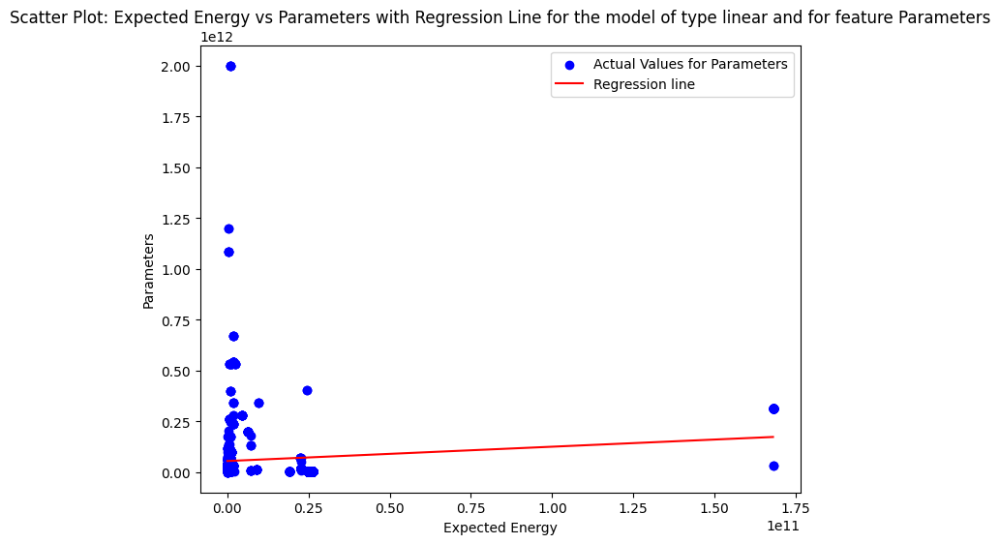

--------------------------------------------------
Linear Regression (Linear)


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Regression Coefficients for each feature:
Hardware quantity: 2845652212.615526
data size: 1798228890.0507197
Training time (hours): 78724980.05647278
Hardware unit Release Price (USD): 292292960.52373505
Hardware unit TDP (W): 525187.8966217041
Hardware unit Compute FLOPS: -6200466425.625
Hardware unit Compute OPS: 2595160663.75
Hardware unit Memory Size (bytes): -207331.25730895996
Epochs: -2184.6805931917843
Batch size: 121567922836.95697
Hardware utilization: -10949.689867388379
Domain_encoded: 46736.45875481827
Country_encoded: 86235.3973153191
Organization_encoded: -639957.9243333145
Date_encoded: 27147.47849341931
Category_encoded: 11562.05136387179
Task_encoded: 353702.22037786397
Confidence_encoded: -202581.9855114996
accessibility_encoded: -17154.174208772725
Training dataset_encoded: 213613.12332020458
Training code accessibility_encoded: 80074.23796435677
Training hardware_encoded: -254763.17118166963
Notability_encoded: -85245.06238372471
Expected power (W): 621965901687.02

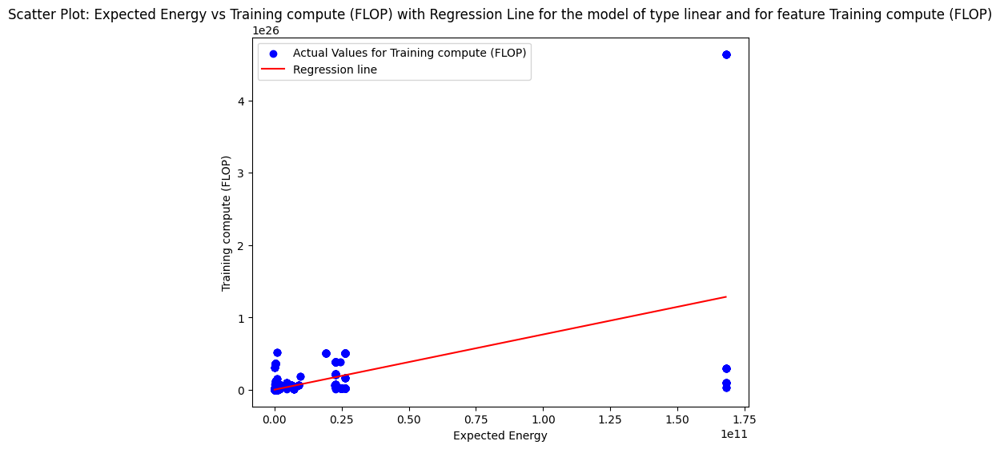

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: -1.665386548696739e-15
data size: -6.798080963301833e-17
Training time (hours): -4.598250668265328e-17
Hardware unit Release Price (USD): -1.7022502543763214e-16
Hardware unit TDP (W): -2.8325682279908396e-19
Hardware unit Compute FLOPS: 6.197978760713805e-15
Hardware unit Compute OPS: -1.3023425965886681e-14
Hardware unit Memory Size (bytes): 1.2094749222884936e-19
Epochs: 1.433754906910334e-21
Batch size: -7.075585830780362e-14
Hardware utilization: 6.399926208210667e-21
Domain_encoded: -2.726920079464859e-20
Country_encoded: -5.03424995687683e-20
Organization_encoded: 3.734717962299873e-19
Date_encoded: -1.662305343549322e-20
Category_encoded: -6.747027593605023e-21
Task_encoded: -2.0618736264871945e-19
Confidence_encoded: 1.1782172444498245e-19
accessibility_encoded: 9.999136021056593e-21
Training dataset_encoded: -1.247415008101843e-19
Training

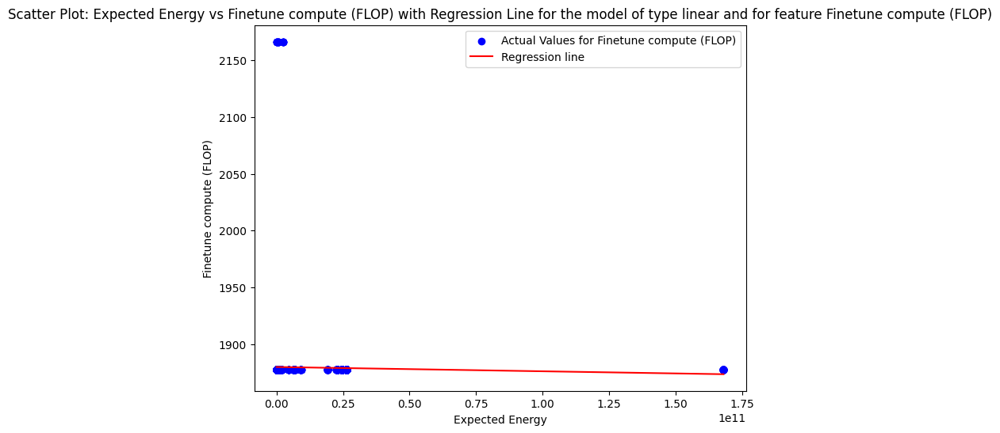

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: -4.256076013193443e-10
data size: 4.200830639823569e-09
Training time (hours): -1.2355536446510393e-11
Hardware unit Release Price (USD): -4.9090626730409394e-11
Hardware unit TDP (W): -2.334568655353622e-13
Hardware unit Compute FLOPS: 1.620191665611904e-08
Hardware unit Compute OPS: -1.524109462589093e-08
Hardware unit Memory Size (bytes): 3.3521144558661235e-14
Epochs: -6.706479742453515e-16
Batch size: -2.069138177820246e-08
Hardware utilization: 1.6907593342654798e-15
Domain_encoded: -7.5222078075987e-15
Country_encoded: -1.3706306256046687e-14
Organization_encoded: 1.0250473740452602e-13
Date_encoded: 6.652436241854716e-16
Category_encoded: -1.8548174519407695e-15
Task_encoded: -5.812585657015168e-14
Confidence_encoded: 3.503646412657532e-14
accessibility_encoded: 2.8237165553330297e-15
Training dataset_encoded: -3.370479807736226e-14
Training

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


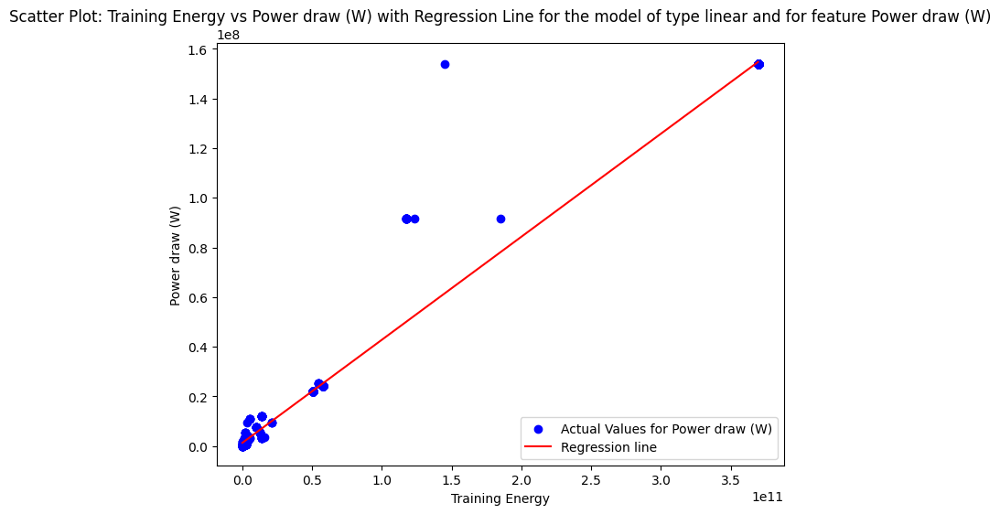

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 1.267434408948801e-09
data size: 7.429695137187708e-11
Training time (hours): 3.4929556744357426e-11
Hardware unit Release Price (USD): 1.2894588147227427e-10
Hardware unit TDP (W): 1.981882446057575e-13
Hardware unit Compute FLOPS: 5.604917968483436e-09
Hardware unit Compute OPS: 3.0292024663387124e-09
Hardware unit Memory Size (bytes): -9.176464138996007e-14
Epochs: -1.203075699927206e-15
Batch size: 5.356683662541048e-08
Hardware utilization: -4.864676824220367e-15
Domain_encoded: 2.0693383118963208e-14
Country_encoded: 3.822218150965703e-14
Organization_encoded: -2.83466972294476e-13
Date_encoded: 1.3181172407127444e-14
Category_encoded: 5.1207043193541665e-15
Task_encoded: 1.5633160930631043e-13
Confidence_encoded: -8.913603978437242e-14
accessibility_encoded: -7.580835222747186e-15
Training dataset_encoded: 9.473687579390812e-14
Training code 

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


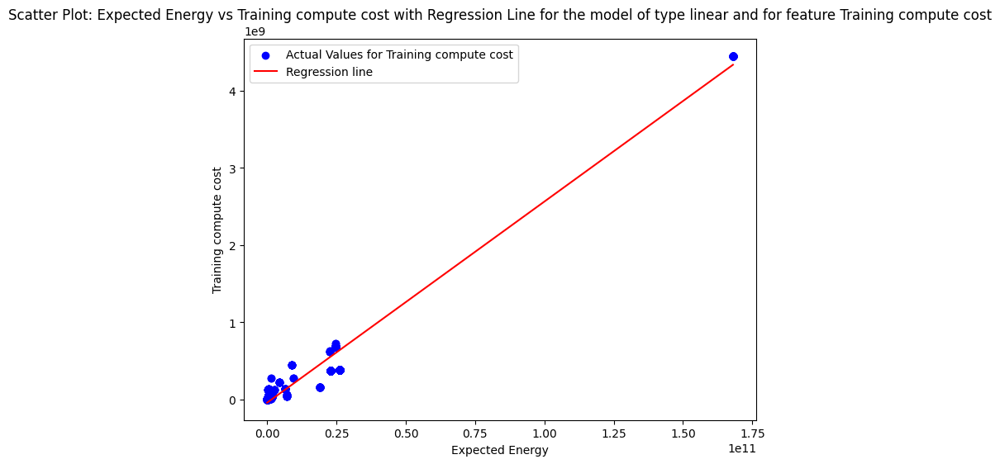

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=7.44493e-43): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: -3504011.167781687
data size: 4.030447884705299e-05
Training time (hours): 43905131.60897639
Hardware unit Release Price (USD): 1150828.0429644135
Hardware unit TDP (W): -372705340.8935557
Hardware unit Compute FLOPS: -5.859988334876105e-05
Hardware unit Compute OPS: 8.66348097784289e-05
Hardware unit Memory Size (bytes): 19083325685.680733
Epochs: 3406038375.945172
Batch size: -9343.631448296428
Hardware utilization: 188828119511.29385
Domain_encoded: -954490657.1365936
Country_encoded: 1716466750.6166875
Organization_encoded: -40415391.00815226
Date_encoded: -1446816804.0105948
Category_encoded: 3956123497.630023
Task_encoded: -466294931.91956073
Confidence_encoded: -843164.6851452409
accessibility_encoded: -13116805669.94612
Training dataset_encoded: -10473344409.894081
Training code accessibility_encoded: 3177380099.6929255
Training hardware_encoded: 5353521.858522718
Notability_encoded: 94223275

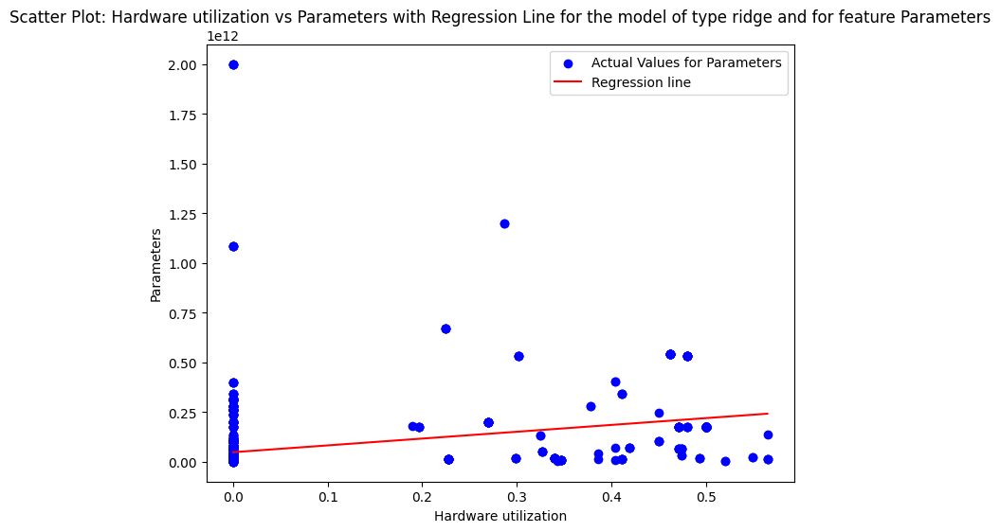

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 8.47804375260977e+19
data size: 23479420173.30771
Training time (hours): -1.1312518706731778e+21
Hardware unit Release Price (USD): -1.567112922068596e+20
Hardware unit TDP (W): -5.240661182697202e+20
Hardware unit Compute FLOPS: 5762249297.205807
Hardware unit Compute OPS: 3786704628.6059213
Hardware unit Memory Size (bytes): -1.8127056409664133e+24
Epochs: 1.6386092800869598e+23
Batch size: -1.3019120656252502e+17
Hardware utilization: -9.478488578323398e+24
Domain_encoded: -6.955949767712712e+23
Country_encoded: 1.72902702861937e+23
Organization_encoded: 1.2969913725763546e+23
Date_encoded: 4.035534139598608e+23
Category_encoded: -1.7022961511917167e+24
Task_encoded: -2.472859351211591e+23
Confidence_encoded: 3.1310548958669813e+24
accessibility_encoded: -1.8453723918263008e+23
Training dataset_encoded: -8.155540419442069e+23
Training code accessi

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=7.44493e-43): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


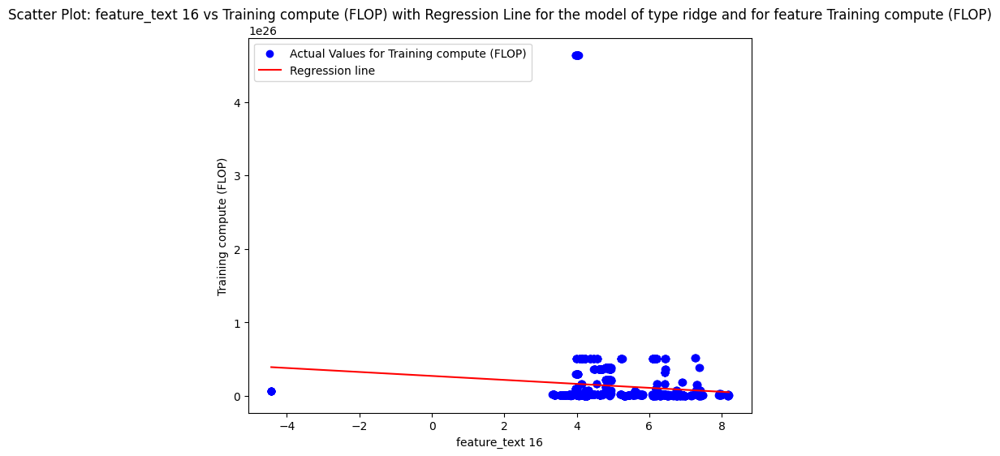

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: -0.0003867439670231631
data size: -5.396353284259054e-15
Training time (hours): 0.0035170415128411483
Hardware unit Release Price (USD): -0.002173350588138181
Hardware unit TDP (W): -0.07132708504983692
Hardware unit Compute FLOPS: 4.8631690917573844e-14
Hardware unit Compute OPS: -2.6172180760923782e-15
Hardware unit Memory Size (bytes): -0.09468422930836624
Epochs: 0.058115263953517085
Batch size: -8.350124093322059e-07
Hardware utilization: 28.68535498573171
Domain_encoded: -0.13477219513776661
Country_encoded: -0.7252709717300988
Organization_encoded: 0.07588567711601168
Date_encoded: 0.3420976157652474
Category_encoded: -7.39985040759797
Task_encoded: -0.1797250181652902
Confidence_encoded: 0.011095062475766755
accessibility_encoded: -1.0955041029852106
Training dataset_encoded: 0.2488507590585562
Training code accessibility_encoded: 0.607458730

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=7.44493e-43): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


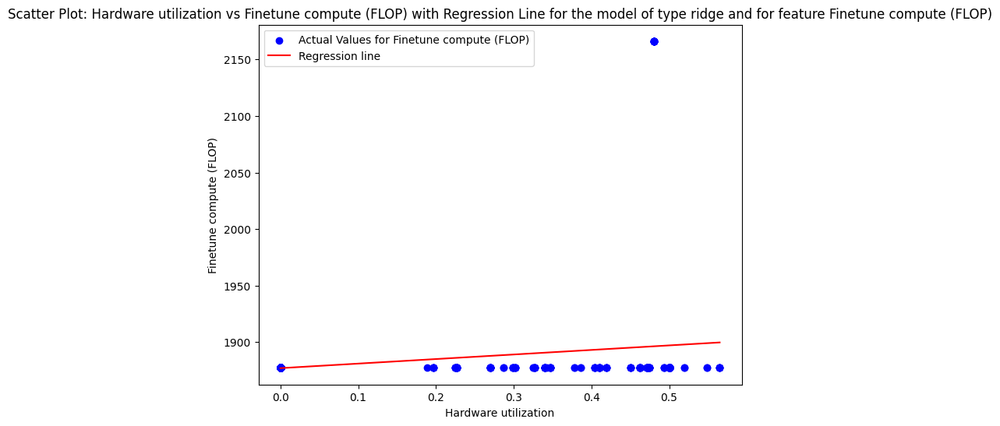

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: -209.84441403297856
data size: 1.466380105667411e-08
Training time (hours): -1033.2276803938555
Hardware unit Release Price (USD): -188.51034950479465
Hardware unit TDP (W): 10631.204267929617
Hardware unit Compute FLOPS: -7.2026514344403735e-09
Hardware unit Compute OPS: 1.0853108852544502e-08
Hardware unit Memory Size (bytes): -948398.772396845
Epochs: -668.0900345281107
Batch size: 0.16289260280307297
Hardware utilization: -1665626.1913324525
Domain_encoded: 38923.40916516532
Country_encoded: -21409.50481547437
Organization_encoded: 38633.570028112736
Date_encoded: -35204.54263369549
Category_encoded: -1677823.637830525
Task_encoded: -26643.066355595925
Confidence_encoded: 191673.4426679644
accessibility_encoded: -479930.75359987066
Training dataset_encoded: -376259.7696234015
Training code accessibility_encoded: -775285.9253353433
Training hardwa

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=7.44493e-43): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


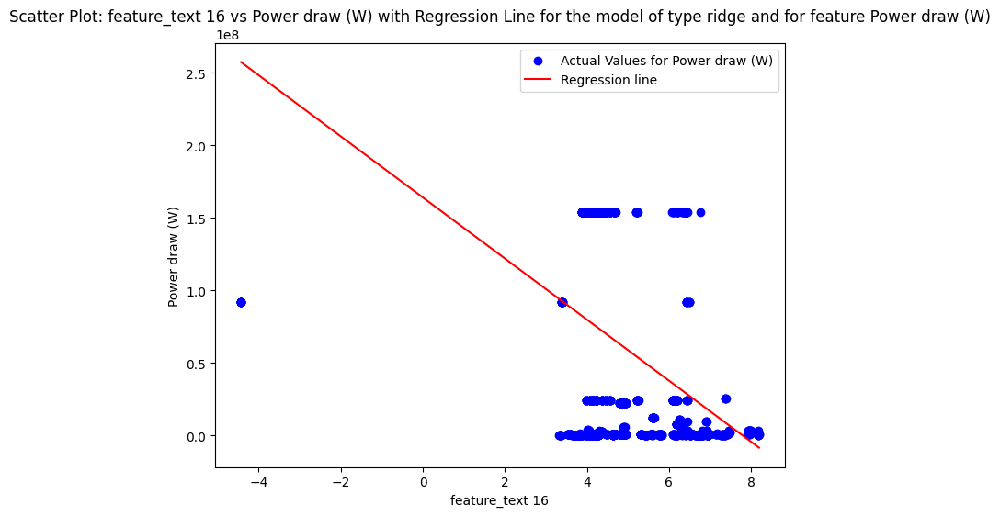

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: -160.59305798189774
data size: 5.632033838555806e-08
Training time (hours): 157.93111473179846
Hardware unit Release Price (USD): 3681.5454588719876
Hardware unit TDP (W): 24098.821808029305
Hardware unit Compute FLOPS: 9.390180084696783e-09
Hardware unit Compute OPS: -9.934124958797149e-08
Hardware unit Memory Size (bytes): 699355.6938463525
Epochs: -66796.36877903882
Batch size: 0.013476054674624222
Hardware utilization: 1024937.0724555651
Domain_encoded: -235716.48909490745
Country_encoded: -51546.16530716262
Organization_encoded: -26899.732565900908
Date_encoded: 1394.6215021644464
Category_encoded: 1370675.1157021401
Task_encoded: -130935.71960025215
Confidence_encoded: -1552048.8286480359
accessibility_encoded: 3392150.6811982947
Training dataset_encoded: 1029251.5188116976
Training code accessibility_encoded: 3622912.491424278
Training hardwar

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=7.44493e-43): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


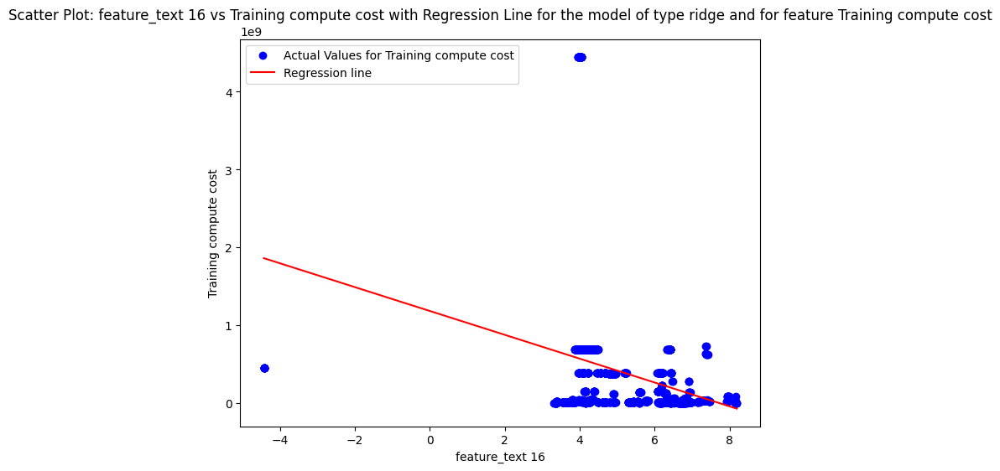

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: -1881416.7764455485
data size: -1.7445772113228794e-05
Training time (hours): 6823529.605811242
Hardware unit Release Price (USD): 1179964.9983028716
Hardware unit TDP (W): -43295793.56452276
Hardware unit Compute FLOPS: -7.727748696247624e-05
Hardware unit Compute OPS: 3.865099548424141e-05
Hardware unit Memory Size (bytes): 16587195143.213882
Epochs: 2851665532.4203286
Batch size: -1634.3382884296861
Hardware utilization: 218540546208.91534
Domain_encoded: -1262619453.5694351
Country_encoded: 1218760107.6193483
Organization_encoded: 68601934.31953233
Date_encoded: -1525332205.6415439
Category_encoded: 68474866.65384386
Task_encoded: -719120250.9853666
Confidence_encoded: -2599841293.413948
accessibility_encoded: -13064584728.985672
Training dataset_encoded: -11598295708.963074
Training code accessibility_encoded: 6557891696.710811
Training hardware

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.993e+24, tolerance: 3.388e+21
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


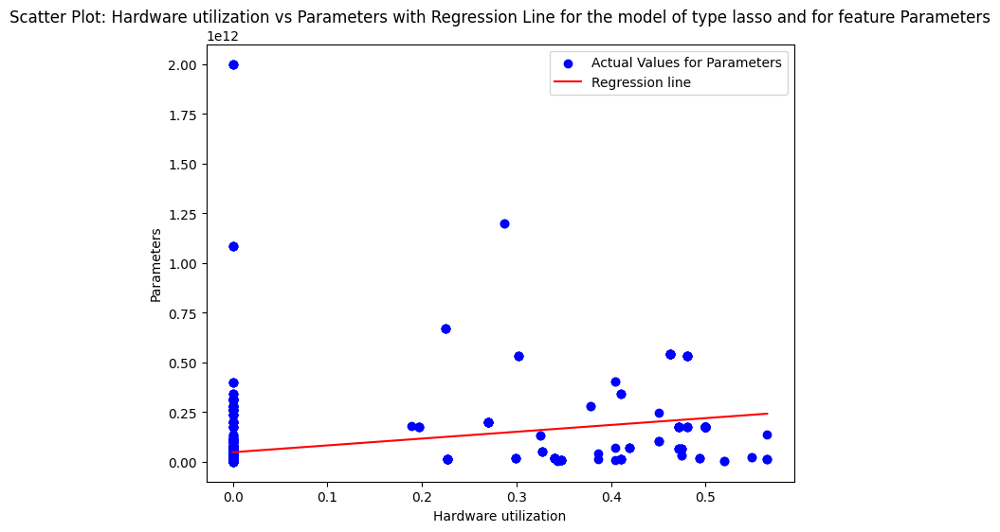

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 2.607028300100252e+20
data size: -6984908292.867251
Training time (hours): 4.656180077821525e+20
Hardware unit Release Price (USD): -6.544551794657935e+19
Hardware unit TDP (W): 2.3324956149989985e+18
Hardware unit Compute FLOPS: 8332529978.115678
Hardware unit Compute OPS: -2581437201.9923477
Hardware unit Memory Size (bytes): -1.628166924241179e+24
Epochs: 1.7060077287917834e+23
Batch size: 6.536397015675572e+17
Hardware utilization: -1.2872592536974747e+25
Domain_encoded: -6.796744922470017e+23
Country_encoded: 2.1930924109723532e+23
Organization_encoded: 1.3236475196738125e+23
Date_encoded: 4.037650933403111e+23
Category_encoded: -1.427628102893456e+24
Task_encoded: -2.2957554864830163e+23
Confidence_encoded: 3.2339522025775694e+24
accessibility_encoded: -3.418142499130652e+22
Training dataset_encoded: -5.8726854542953095e+23
Training code access

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.967e+53, tolerance: 2.987e+50
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


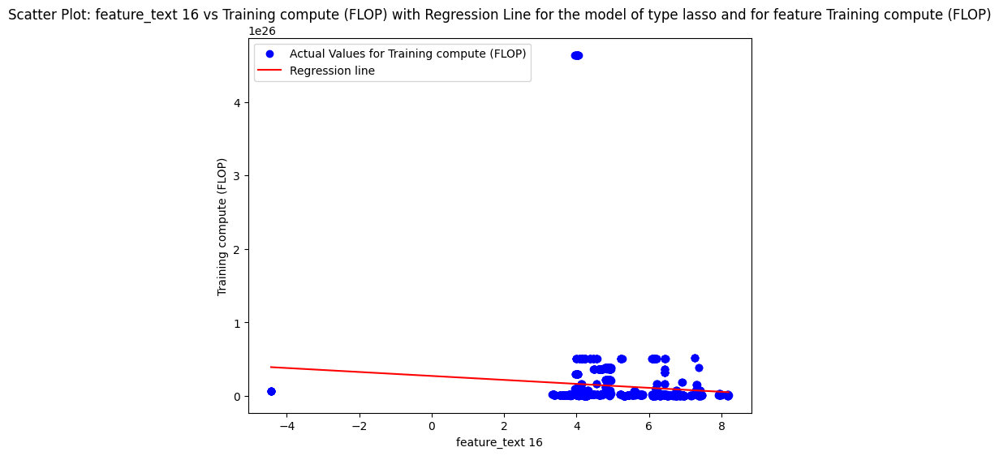

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.241e+05, tolerance: 7.474e+01
  model = cd_fast.enet_coordinate_descent(


--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 0.0011712114166515675
data size: -1.5560683349653265e-14
Training time (hours): -0.0002185822828670935
Hardware unit Release Price (USD): -0.0010641991460544377
Hardware unit TDP (W): 0.13466666153666196
Hardware unit Compute FLOPS: 1.301284401432075e-14
Hardware unit Compute OPS: -3.3997597543170786e-14
Hardware unit Memory Size (bytes): -0.8947343518591878
Epochs: -0.1678857743579371
Batch size: 2.3042745592538973e-07
Hardware utilization: 0.0
Domain_encoded: 0.0
Country_encoded: -0.33666635623402547
Organization_encoded: -0.051287698525104654
Date_encoded: 0.34203036205302995
Category_encoded: -0.0
Task_encoded: -0.21629125935953009
Confidence_encoded: -0.23638781080058344
accessibility_encoded: -0.9236477107463923
Training dataset_encoded: -0.7671461037639069
Training code accessibility_encoded: 0.48377410516360536
Training hardware_encoded: -0.0

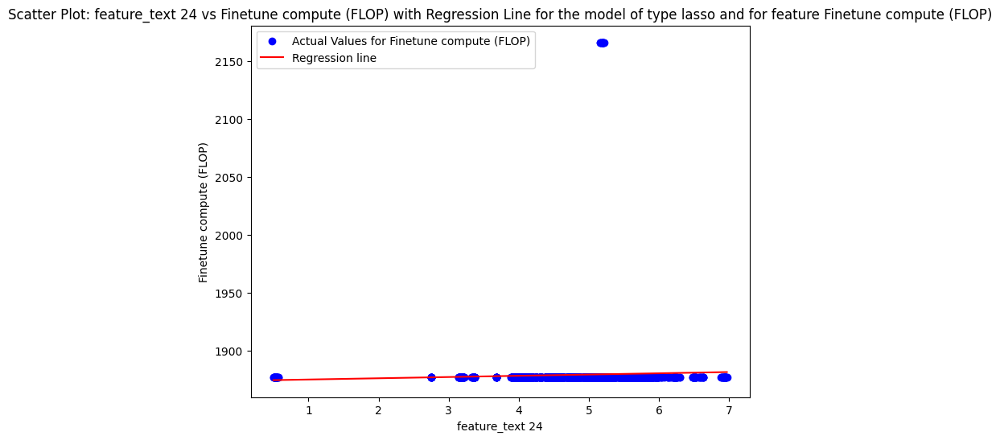

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 2138.5707302323817
data size: 1.6748998750140404e-08
Training time (hours): -1618.9259678191256
Hardware unit Release Price (USD): -132.97551018610218
Hardware unit TDP (W): 5570.496450231176
Hardware unit Compute FLOPS: -5.349926460417359e-09
Hardware unit Compute OPS: 7.79163644229645e-09
Hardware unit Memory Size (bytes): -798313.7357682864
Epochs: 13267.855352122306
Batch size: 0.1662992937948539
Hardware utilization: -3660434.2313757534
Domain_encoded: 55186.45629654181
Country_encoded: 12430.381581308613
Organization_encoded: 38793.045349675864
Date_encoded: -35137.72383085487
Category_encoded: -1444110.6741098757
Task_encoded: -11978.608064843876
Confidence_encoded: 281671.3748708356
accessibility_encoded: -390027.9407569771
Training dataset_encoded: -221402.91022829592
Training code accessibility_encoded: -921526.42558032
Training hardware_en

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.049e+15, tolerance: 6.917e+14
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


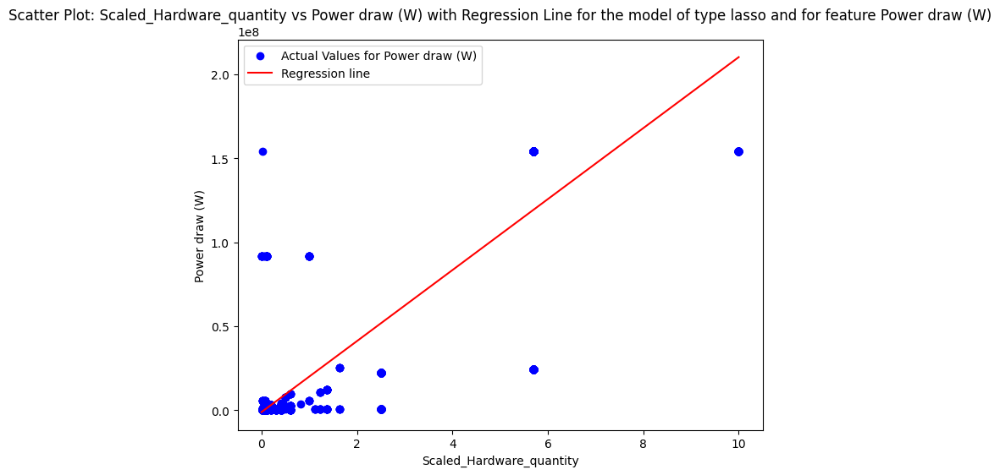

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 16960.39911829452
data size: -1.206688995258627e-07
Training time (hours): -42432.76098653039
Hardware unit Release Price (USD): 1424.8486436027645
Hardware unit TDP (W): -455248.59757227346
Hardware unit Compute FLOPS: 5.988025821228738e-09
Hardware unit Compute OPS: 7.572360697980627e-08
Hardware unit Memory Size (bytes): 1282951.7200827012
Epochs: 588699.1665155791
Batch size: 14.60933644493652
Hardware utilization: 15664424.918643791
Domain_encoded: -34540.64501237761
Country_encoded: -37542.30418001987
Organization_encoded: 26896.648053349392
Date_encoded: 82846.88986484171
Category_encoded: 3444390.210282347
Task_encoded: -137009.6997750856
Confidence_encoded: 992440.822650147
accessibility_encoded: 2160807.8978178883
Training dataset_encoded: 69503.4585090629
Training code accessibility_encoded: 1395252.8622969228
Training hardware_encoded: 42

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.370e+17, tolerance: 7.793e+16
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


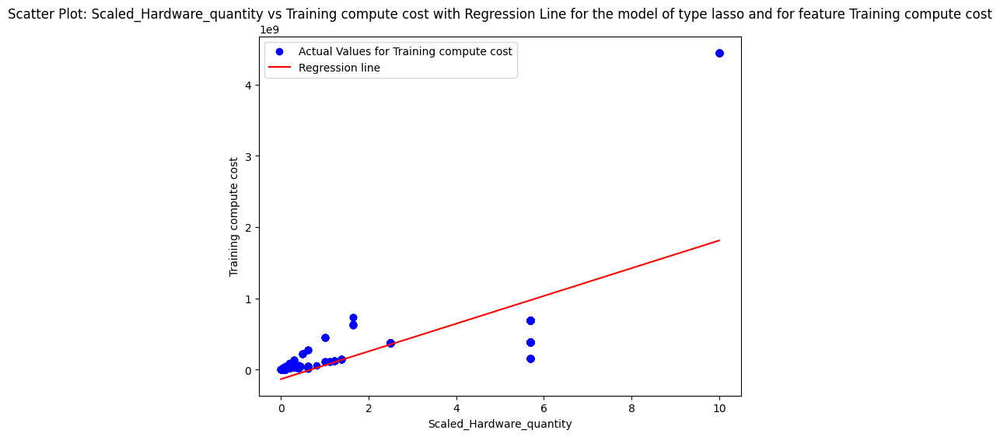

Running Models with Best Parameters:  20%|██        | 1/5 [00:03<00:12,  3.01s/it]

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Hardware quantity: 475057776230.4
data size: 109812331315.2
Training time (hours): 115192365056.0
Hardware unit Release Price (USD): 230703497216.0
Hardware unit TDP (W): 245663740723.2
Hardware unit Compute FLOPS: 216142970880.0
Hardware unit Compute OPS: 207668799078.4
Hardware unit Memory Size (bytes): 216366527283.2
Epochs: -136508656844.8
Batch size: 84864611123.2
Hardware utilization: 426741071872.0
Domain_encoded: 30266936524.8
Country_encoded: 67472090726.4
Organization_encoded: 1098068787.2
Date_encoded: 116255621120.0
Category_encoded: 49770030694.4
Task_encoded: 18093388595.2
Confidence_encoded: 55041851392.0
accessibility_encoded: 90057998336.0
Training dataset_encoded: 137860061593.6
Training code accessibility_encoded: 35022857830.4
Training hardware_encoded: 167352729600.0
Notability_encoded: 118514673254.4
Expected power (W): 520343257088.0
Training Energy: 405441976729.6
Expected Energy: 523223066214.4
Expected compute flops: 523066199244.8
feature_text 0: 393469755392

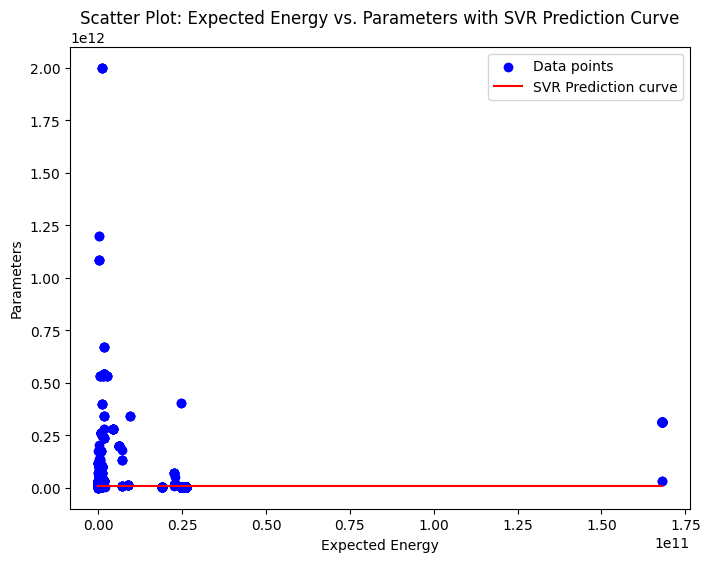

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.0
Hardware unit Release Price (USD): 0.0
Hardware unit TDP (W): 0.0
Hardware unit Compute FLOPS: 0.0
Hardware unit Compute OPS: 0.0
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.0
Batch size: 0.0
Hardware utilization: 0.0
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.0
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: 0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
Expected power (W): 0.0
Training Energy: 0.0
Expected Energy: 0.0
Expected compute flops: 0.0
feature_text 0: 0.0
feature_text 1: 0.0
feature_text 2: 0.0
feature_text 3: 0.0
feature_text 4: 0.0
feature_text 5: 0.0
feature_text 6: 0.0
feature_text 7: 0.0
feature_text 8: 0.0
feature_text 9: 0.0
feature_text 10: 0.0
feature_text 11: 0.0
feature_text 12: 0.0
feature_text 13: 0.0
feature_text 14: 0.0
feature_tex

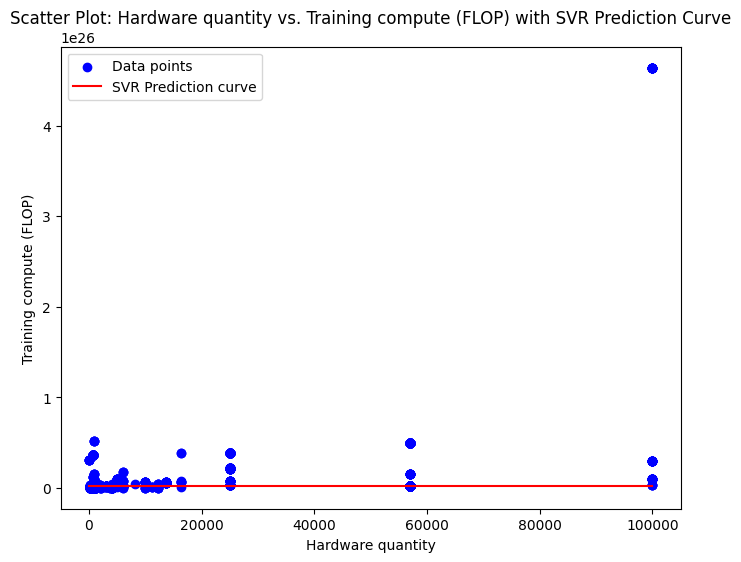

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.010031228516800184
data size: 0.024705143874143687
Training time (hours): 1.470273044123735
Hardware unit Release Price (USD): 0.31193186660461836
Hardware unit TDP (W): 0.15906937229059395
Hardware unit Compute FLOPS: 0.21547561141270535
Hardware unit Compute OPS: 0.22902021692883637
Hardware unit Memory Size (bytes): 0.16714079438899035
Epochs: 0.03822168100485897
Batch size: 0.1985417362493763
Hardware utilization: 4.354489342479269
Domain_encoded: 0.10528861888861911
Country_encoded: 0.7709696792824048
Organization_encoded: -0.037370598920313115
Date_encoded: 0.7863607211627596
Category_encoded: -0.08161303543564599
Task_encoded: 0.8509635119704739
Confidence_encoded: -0.20457402441453496
accessibility_encoded: 1.4526069782727518
Training dataset_encoded: 0.9295321156088108
Training code accessibility_encoded: 0.17006444087860473
Training hardware_encoded: 0.16046904607537726
Notability_encoded: 0.5258111

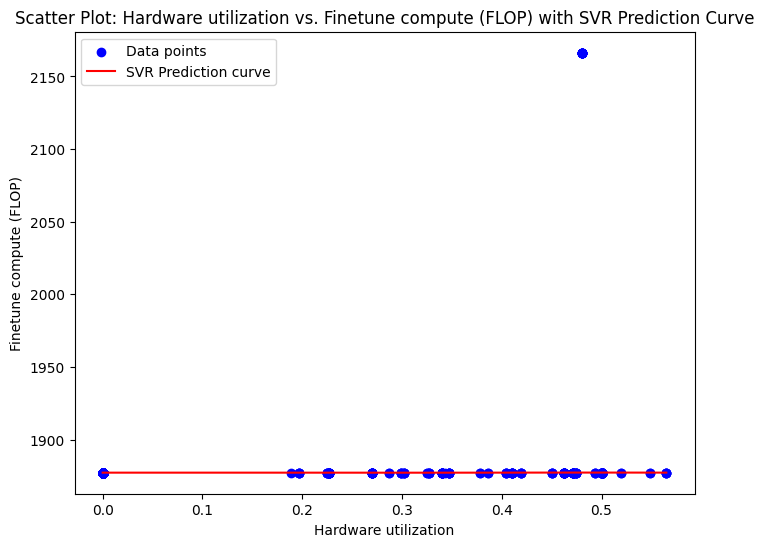

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Hardware quantity: 884749019.9
data size: 266932705.5
Training time (hours): 357260015.2
Hardware unit Release Price (USD): 243448583.6
Hardware unit TDP (W): 568468880.2
Hardware unit Compute FLOPS: 257610761.0
Hardware unit Compute OPS: 210918865.9
Hardware unit Memory Size (bytes): 439436299.1
Epochs: 31752968.3
Batch size: 133022821.4
Hardware utilization: 220182630.4
Domain_encoded: -43737329.6
Country_encoded: -92375535.7
Organization_encoded: 186472362.5
Date_encoded: 325193076.0
Category_encoded: 171481014.8
Task_encoded: 32359456.8
Confidence_encoded: 205923023.2
accessibility_encoded: 216167845.8
Training dataset_encoded: 345116806.0
Training code accessibility_encoded: 284844762.9
Training hardware_encoded: 296992350.1
Notability_encoded: 299915466.2
Expected power (W): 414169741.4
Training Energy: 1047125385.8
Expected Energy: 421036990.2
Expected compute flops: 416063607.5
feature_text 0: 752715600.0
feature_text 1: 16788367.3
feature_text 2: 190349534.5
feature_text 3: 21

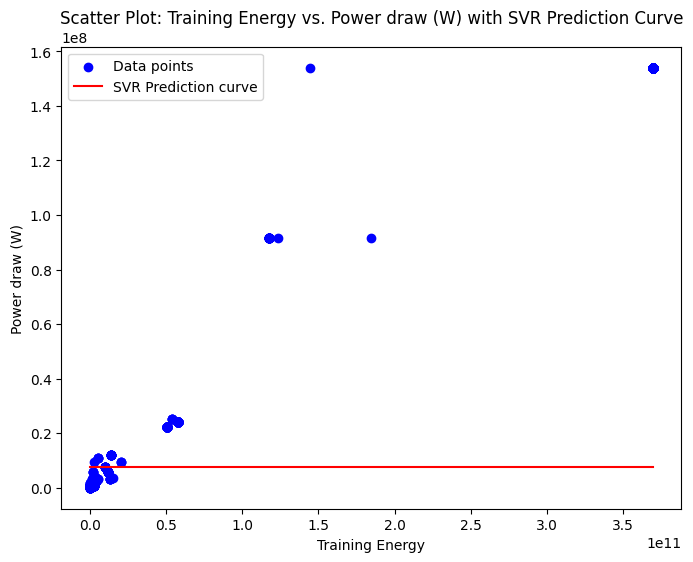

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Hardware quantity: 5121775616.0
data size: 964504281.6
Training time (hours): 1819461862.4
Hardware unit Release Price (USD): 1744645772.8
Hardware unit TDP (W): 1888499276.8
Hardware unit Compute FLOPS: 1614250368.0
Hardware unit Compute OPS: 1699525926.4
Hardware unit Memory Size (bytes): 1586946892.8
Epochs: 44744652.8
Batch size: 785087347.2
Hardware utilization: 1095023436.8
Domain_encoded: -95389657.6
Country_encoded: 349169932.8
Organization_encoded: 795393638.4
Date_encoded: 1305530304.0
Category_encoded: 579283660.8
Task_encoded: 150848960.0
Confidence_encoded: 457243980.8
accessibility_encoded: 1026331264.0
Training dataset_encoded: 1702307955.2
Training code accessibility_encoded: 1529862348.8
Training hardware_encoded: 1718565644.8
Notability_encoded: 1109724070.4
Expected power (W): 4711404441.6
Training Energy: 4220146470.4
Expected Energy: 4733791104.0
Expected compute flops: 4477161190.4
feature_text 0: 2646636160.0
feature_text 1: 438561267.2
feature_text 2: 1010048089

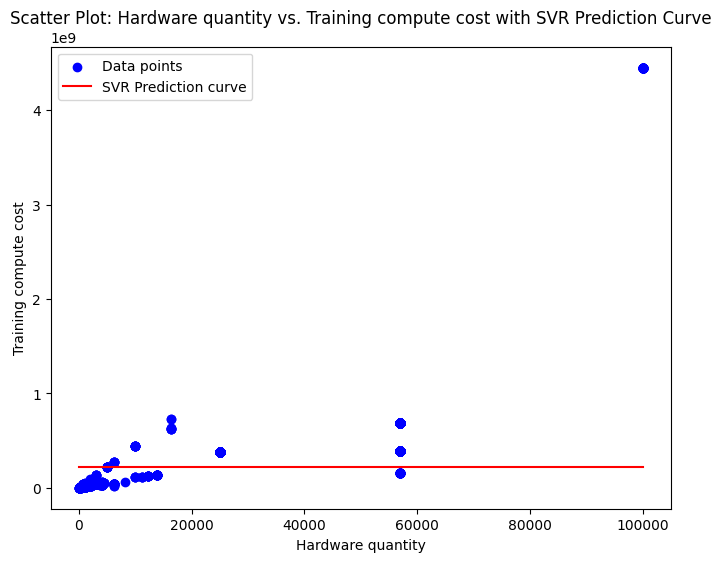

Running Models with Best Parameters:  40%|████      | 2/5 [00:09<00:15,  5.07s/it]

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.0036152478111224403
data size: 0.03953483868208219
Training time (hours): 0.0016515060558957783
Hardware unit Release Price (USD): 0.008026970178509585
Hardware unit TDP (W): 0.0024336607848770017
Hardware unit Compute FLOPS: 0.033332379027233364
Hardware unit Compute OPS: 2.6607672242423838e-05
Hardware unit Memory Size (bytes): 0.0010212206987302572
Epochs: 0.1032167849188445
Batch size: 0.011618632108263206
Hardware utilization: 0.07939941678911407
Domain_encoded: 0.0
Country_encoded: 0.0002144455599385489
Organization_encoded: 0.0027807925918059166
Date_encoded: 0.06682746614130572
Category_encoded: 0.0
Task_encoded: 1.9098687295036038e-05
Confidence_encoded: 0.0009509714875053791
accessibility_encoded: 0.11042096362373202
Training dataset_encoded: 0.015605835894153562
Training code accessibility_encoded: 0.001794532725131058
Training hardware_encoded: 0.000891788

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


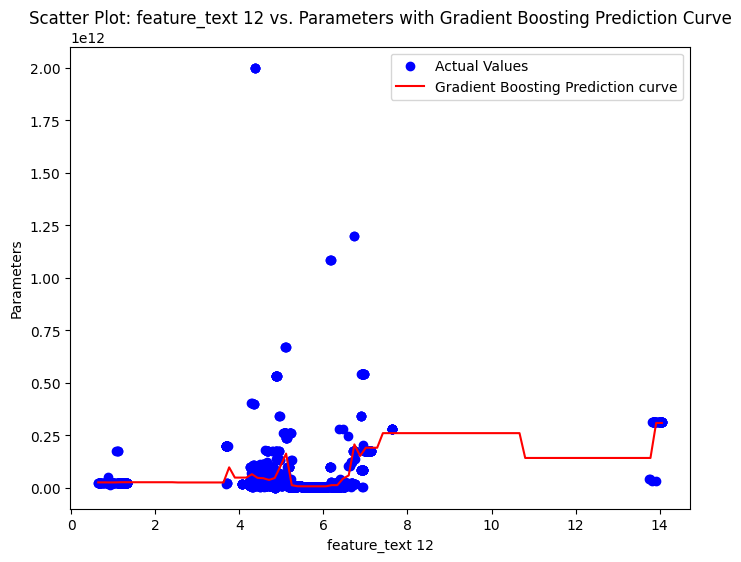

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.009577567881403027
data size: 7.008497588281357e-05
Training time (hours): 2.8457527133065986e-05
Hardware unit Release Price (USD): 0.0004501244745185464
Hardware unit TDP (W): 0.00020262085250099767
Hardware unit Compute FLOPS: 0.00014248158754133456
Hardware unit Compute OPS: 0.0010698324184187271
Hardware unit Memory Size (bytes): 6.391577809980104e-06
Epochs: 0.041895946926737634
Batch size: 3.220148851404973e-06
Hardware utilization: 0.4837525420596237
Domain_encoded: 5.122697196981384e-19
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.00010699869490464497
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0004830737614923034
accessibility_encoded: 0.0
Training dataset_encoded: 2.096162728483519e-06
Training code accessibility_encoded: 3.6255502653788587e-06
Training hardware_encoded: 0.0005825863581359708
Notability_encoded: 0.0077612

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


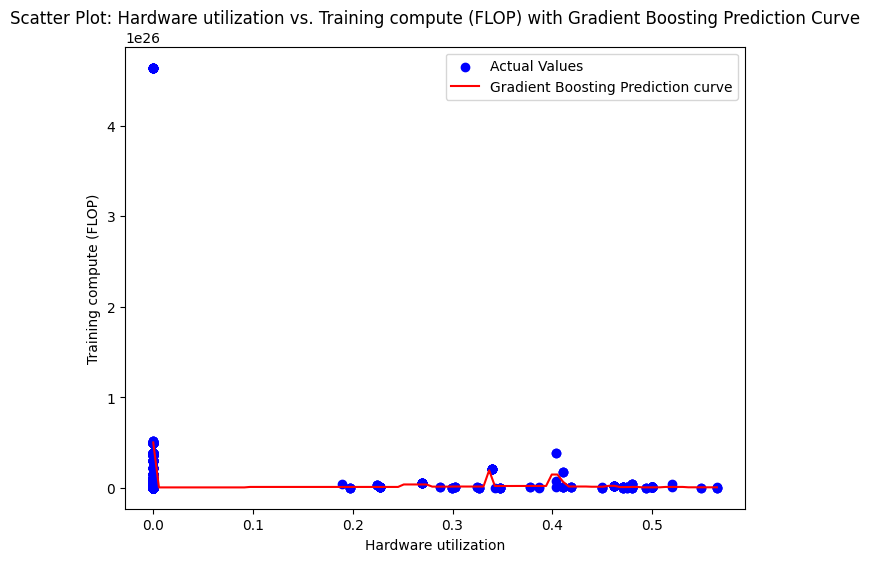

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 1.0329222000134264e-20
data size: 0.010169610154396741
Training time (hours): 5.044667848426229e-22
Hardware unit Release Price (USD): -8.336049039042783e-20
Hardware unit TDP (W): 0.0
Hardware unit Compute FLOPS: 1.3566275998537e-19
Hardware unit Compute OPS: 0.0
Hardware unit Memory Size (bytes): -1.5296279573969318e-20
Epochs: 0.0
Batch size: 0.013489196954364567
Hardware utilization: 0.0068581059760905805
Domain_encoded: 4.8993249705554873e-20
Country_encoded: 0.0001398624945369621
Organization_encoded: 0.0
Date_encoded: 0.0015780889760003962
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: 0.0
Training dataset_encoded: 0.0002300210257392192
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: -7.097812385338163e-21
Expected power (W): -9.577813432501546e-22
Training Energy: 3.3257501951713

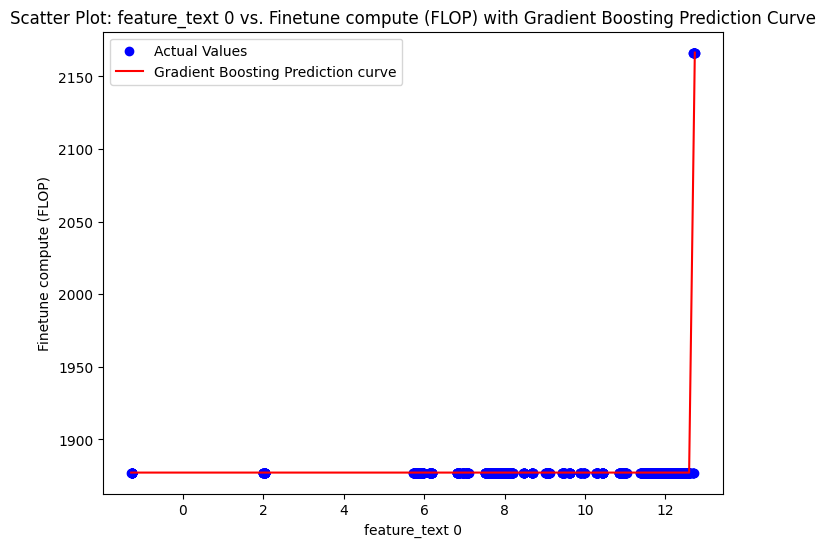

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 2.4101158475795016e-05
data size: 8.0815003354154e-08
Training time (hours): 1.037675143670021e-05
Hardware unit Release Price (USD): 4.614752755418787e-10
Hardware unit TDP (W): 3.3208562766180196e-10
Hardware unit Compute FLOPS: 1.7633535822379542e-08
Hardware unit Compute OPS: 4.500774971840304e-19
Hardware unit Memory Size (bytes): 8.313329850302862e-09
Epochs: 1.4228066518109599e-05
Batch size: 2.2603898475790168e-08
Hardware utilization: 5.103938476363951e-07
Domain_encoded: 0.0
Country_encoded: 2.0717070820647916e-09
Organization_encoded: 2.332137299408564e-06
Date_encoded: 1.0405744151689155e-08
Category_encoded: 1.113308808603466e-20
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: 4.2772099152040166e-10
Training dataset_encoded: 4.31785406223236e-08
Training code accessibility_encoded: 2.150811755706619e-09
Training hardware_encoded: 3.54321848

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


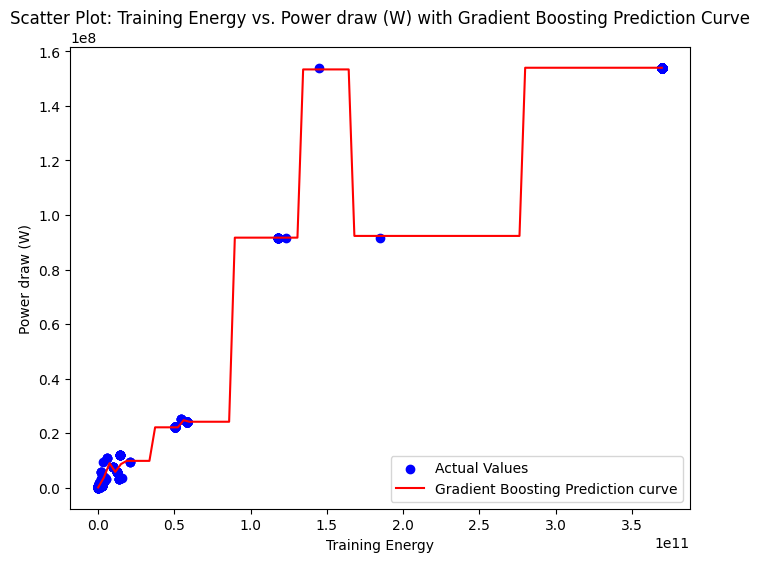

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.019133588057879958
data size: 2.407289748898861e-05
Training time (hours): 4.673852651989119e-07
Hardware unit Release Price (USD): 2.983340378318008e-06
Hardware unit TDP (W): 1.4033289549069397e-06
Hardware unit Compute FLOPS: 1.720869555520776e-07
Hardware unit Compute OPS: 0.00032200928035139493
Hardware unit Memory Size (bytes): 5.490870709429964e-07
Epochs: 3.9449662484604256e-08
Batch size: 2.6046575531533227e-07
Hardware utilization: 4.793428683228651e-08
Domain_encoded: 2.0571744269107255e-16
Country_encoded: 0.0
Organization_encoded: 9.125855103476248e-08
Date_encoded: 2.1278865288858376e-09
Category_encoded: 0.0
Task_encoded: 4.970708824525255e-12
Confidence_encoded: 5.637868032873959e-11
accessibility_encoded: 3.771299469284138e-07
Training dataset_encoded: 1.8005554216994984e-07
Training code accessibility_encoded: 1.2088527582285056e-07
Training hardware

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


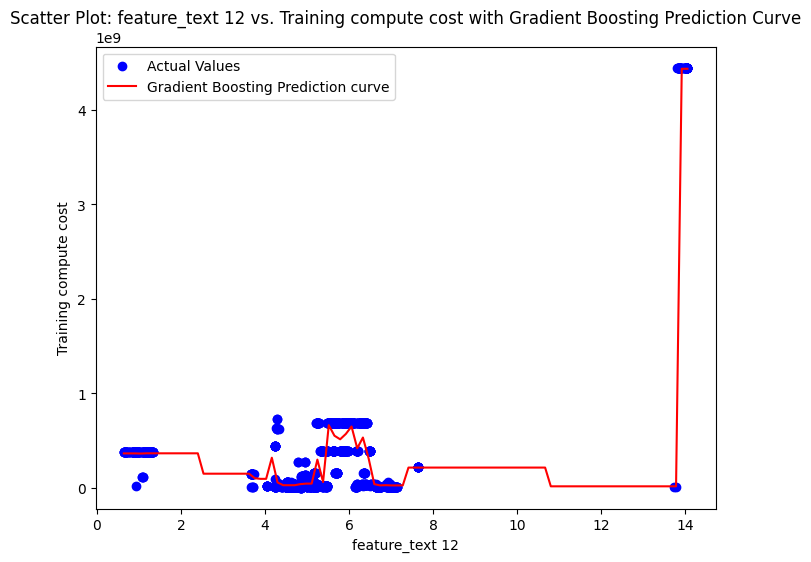

Running Models with Best Parameters:  60%|██████    | 3/5 [00:18<00:13,  6.86s/it]

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.0032706359320714942
data size: 0.07342550200245831
Training time (hours): 0.002332156395670275
Hardware unit Release Price (USD): 0.01221419055117103
Hardware unit TDP (W): 0.012187647731271695
Hardware unit Compute FLOPS: 0.01189568322664022
Hardware unit Compute OPS: 0.014092711329776597
Hardware unit Memory Size (bytes): 0.0005336491238091831
Epochs: 0.12577599824587007
Batch size: 0.021891619338210235
Hardware utilization: 0.0421541430963994
Domain_encoded: 0.0003200268320019811
Country_encoded: 0.00020298996107294054
Organization_encoded: 0.0019285696164610523
Date_encoded: 0.059982859172075215
Category_encoded: 1.3480869075994819e-05
Task_encoded: 0.0008457240651956117
Confidence_encoded: 0.0036420313140225744
accessibility_encoded: 0.05706016908651632
Training dataset_encoded: 0.002591342984536539
Training code accessibility_encoded: 0.003993812310358482
Traini

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


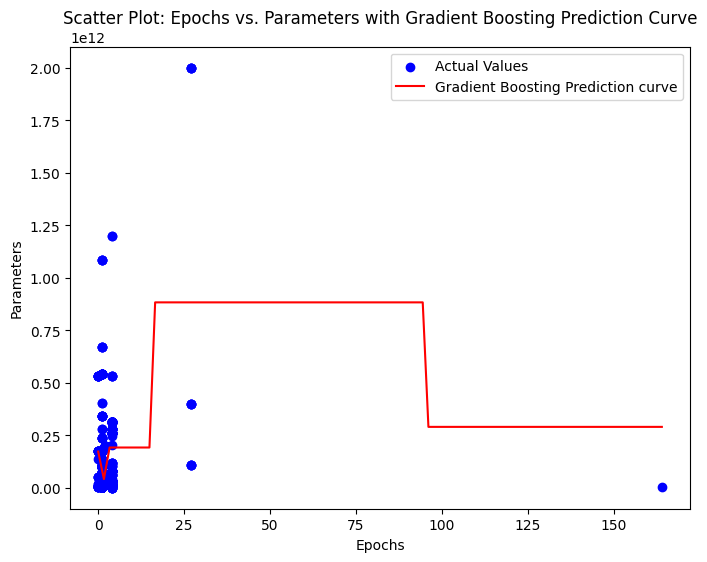

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 3.740361233589414e-05
data size: 0.005420650163898777
Training time (hours): 7.661867460227156e-05
Hardware unit Release Price (USD): 0.00017751657577638386
Hardware unit TDP (W): 0.009066037142275859
Hardware unit Compute FLOPS: 0.015715259840646957
Hardware unit Compute OPS: 0.010216396204879664
Hardware unit Memory Size (bytes): 0.00951711521095226
Epochs: 0.015605767961263624
Batch size: 6.048514374793202e-05
Hardware utilization: 0.5001671612385613
Domain_encoded: 1.90126315602693e-07
Country_encoded: 2.747079131559511e-06
Organization_encoded: 0.005248582920256683
Date_encoded: 7.653937335398791e-05
Category_encoded: 9.528514012587634e-08
Task_encoded: 1.296092326195436e-05
Confidence_encoded: 0.00035664145404615375
accessibility_encoded: 0.01425922155037432
Training dataset_encoded: 1.2295748500504324e-05
Training code accessibility_encoded: 0.009331289452134761


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


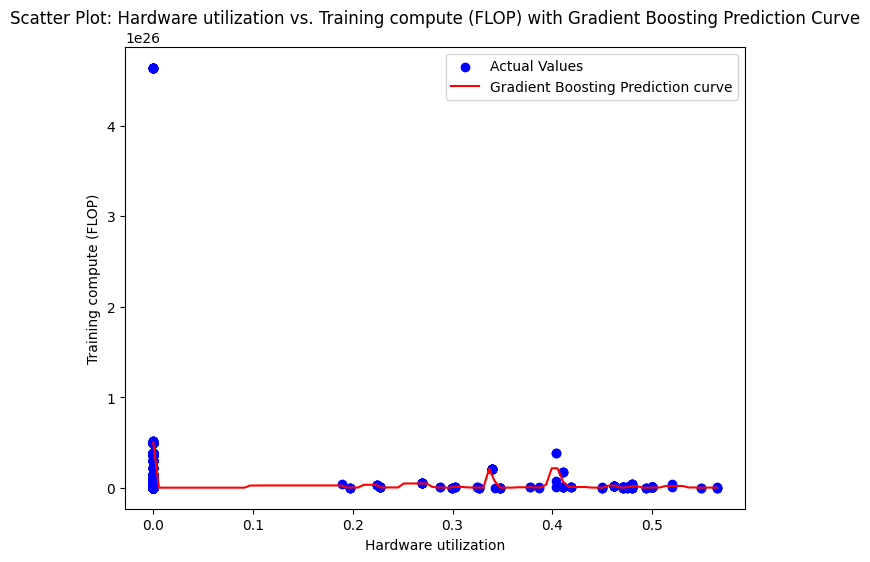

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 7.342635504106863e-14
data size: 0.0009158050222051619
Training time (hours): 0.0014348832318857728
Hardware unit Release Price (USD): 0.0
Hardware unit TDP (W): 0.0
Hardware unit Compute FLOPS: 0.0
Hardware unit Compute OPS: 0.0
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.0
Batch size: 0.018192641909749924
Hardware utilization: 0.0069846990524881645
Domain_encoded: 0.0
Country_encoded: 0.001981721483673942
Organization_encoded: 0.0
Date_encoded: 0.015606697170307968
Category_encoded: 2.3994847893043015e-16
Task_encoded: 0.0
Confidence_encoded: 6.401929230349519e-16
accessibility_encoded: 0.0
Training dataset_encoded: 0.0006319495922937708
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
Expected power (W): 0.0
Training Energy: 1.1197595683420074e-16
Expected Energy: 0.0
Expected compute flops: 0.0
feature_text 0: 0.90

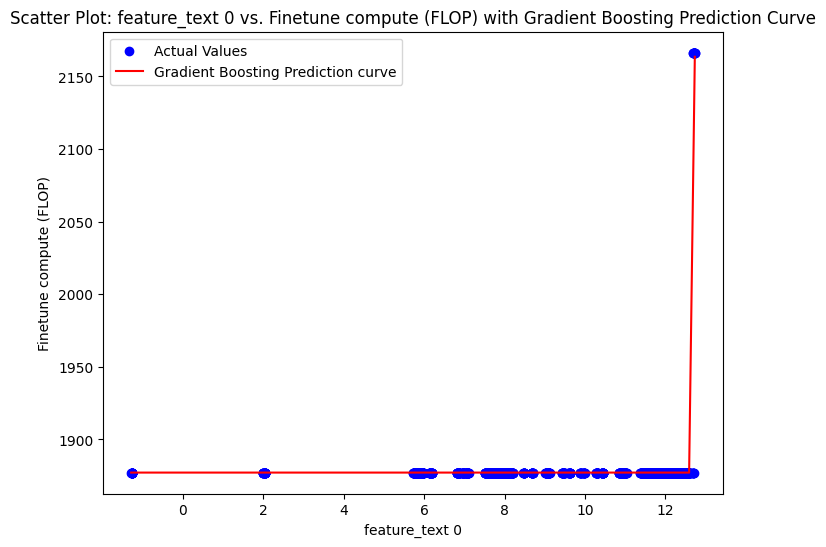

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 4.026561968996834e-06
data size: 8.834050414780259e-07
Training time (hours): 9.424201980432e-05
Hardware unit Release Price (USD): 2.2892208906936294e-07
Hardware unit TDP (W): 1.6852006450263128e-07
Hardware unit Compute FLOPS: 1.5105103987587707e-07
Hardware unit Compute OPS: 3.1872364444957684e-07
Hardware unit Memory Size (bytes): 8.517228389511335e-08
Epochs: 1.2816866839532136e-05
Batch size: 6.637434046280451e-07
Hardware utilization: 2.7994372891469436e-06
Domain_encoded: 1.4762958393753797e-07
Country_encoded: 3.565827996085458e-08
Organization_encoded: 0.00010077436303680733
Date_encoded: 4.80287727631911e-07
Category_encoded: 1.9086778323745884e-10
Task_encoded: 1.120548598694046e-07
Confidence_encoded: 3.785299660717209e-08
accessibility_encoded: 1.4121936213896288e-07
Training dataset_encoded: 3.143485219648267e-08
Training code accessibility_encoded: 3.76

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


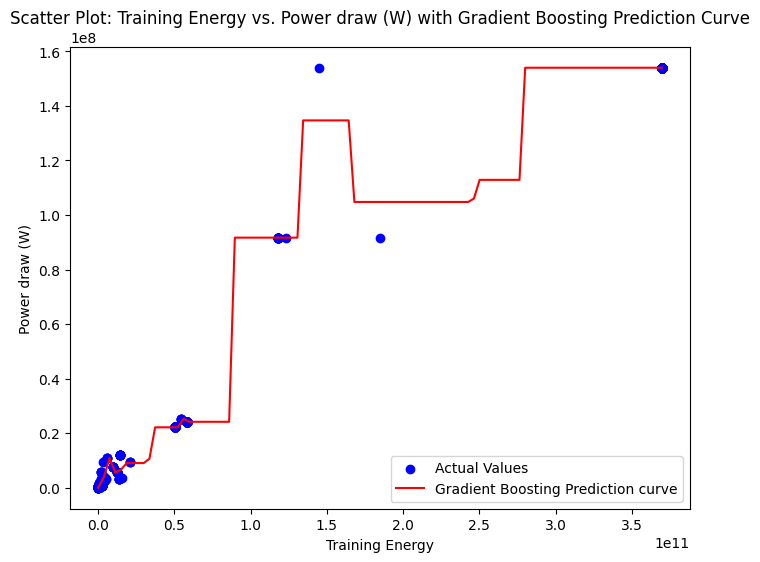

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.17127972800984764
data size: 4.963888946828318e-06
Training time (hours): 2.0502092638426548e-06
Hardware unit Release Price (USD): 8.610197809795027e-06
Hardware unit TDP (W): 6.600546349938734e-06
Hardware unit Compute FLOPS: 7.250185232320168e-06
Hardware unit Compute OPS: 1.3565640782267658e-05
Hardware unit Memory Size (bytes): 8.930983969849697e-06
Epochs: 1.1023739742738639e-05
Batch size: 5.487283579372138e-06
Hardware utilization: 9.336164043740411e-07
Domain_encoded: 2.8536623633823694e-10
Country_encoded: 4.230880098701233e-08
Organization_encoded: 1.8787973684426352e-06
Date_encoded: 2.578068283568572e-06
Category_encoded: 7.467950520300024e-12
Task_encoded: 2.185600104460997e-07
Confidence_encoded: 8.022948108299389e-07
accessibility_encoded: 1.6239125027793934e-06
Training dataset_encoded: 3.590467756019718e-07
Training code accessibility_encoded: 2.1028

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


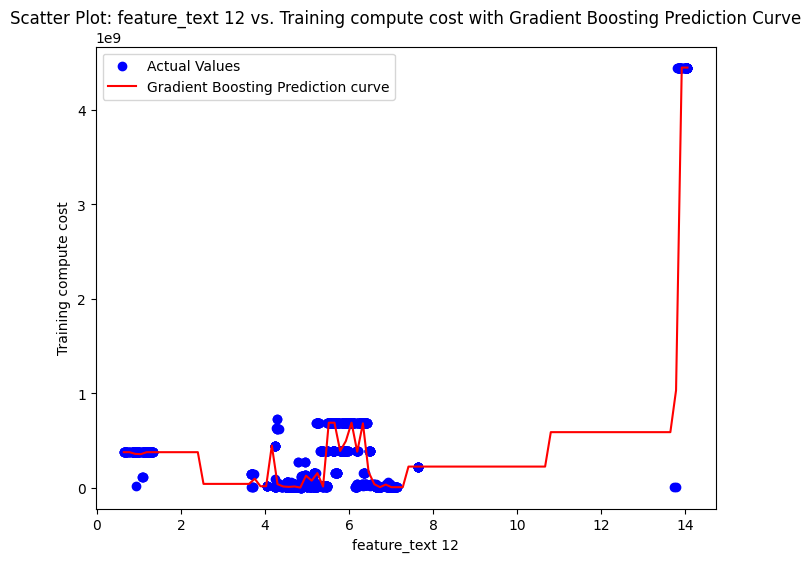

Running Models with Best Parameters:  80%|████████  | 4/5 [00:33<00:09,  9.98s/it]/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.00022197922021906816
data size: 0.21281823280170342
Training time (hours): 4.604150033555789e-05
Hardware unit Release Price (USD): 0.0024462058635769234
Hardware unit TDP (W): 0.007017680897684472
Hardware unit Compute FLOPS: 0.16832892992571646
Hardware unit Compute OPS: 0.003157055757614619
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.0001351124862795041
Batch size: 2.4237272630021737e-05
Hardware utilization: 0.016352476108240328
Domain_encoded: 0.0
Country_encoded: 1.3675866449072545e-05
Organization_encoded: 0.0009376770443669323
Date_encoded: 0.04055365118586618
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0003728053001685246
accessibility_encoded: 0.27601637762575104
Training dataset_encoded: 0.0
Training code accessibility_encoded: 1.3140577527904082e-05
Training hardware_encoded: 0.0002888106673910215
Notability_encoded: 0.0013803

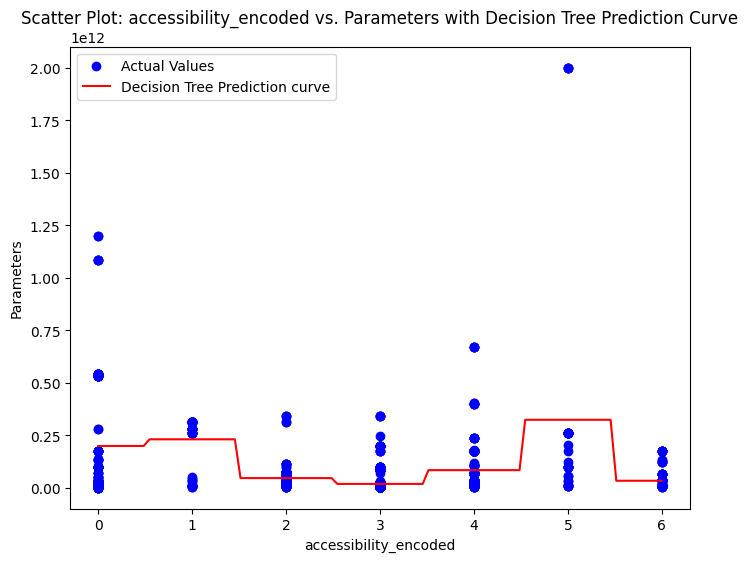

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 1.1583773008055518e-07
data size: 2.027612762455736e-06
Training time (hours): 1.281682220378131e-06
Hardware unit Release Price (USD): 3.6082457237265197e-07
Hardware unit TDP (W): 4.4042472191564685e-07
Hardware unit Compute FLOPS: 4.8538351348024955e-09
Hardware unit Compute OPS: 0.0
Hardware unit Memory Size (bytes): 1.401013808463037e-10
Epochs: 0.0011478873866260207
Batch size: 1.0421977096199163e-07
Hardware utilization: 0.48237776864303017
Domain_encoded: 0.0
Country_encoded: 3.3474199031287754e-11
Organization_encoded: 1.0642833257543554e-10
Date_encoded: 3.5847383815473666e-06
Category_encoded: 0.0
Task_encoded: 1.9609444445015093e-07
Confidence_encoded: 4.235547111397811e-10
accessibility_encoded: 8.580646326791608e-06
Training dataset_encoded: 1.3442426343645856e-05
Training code accessibility_encoded

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


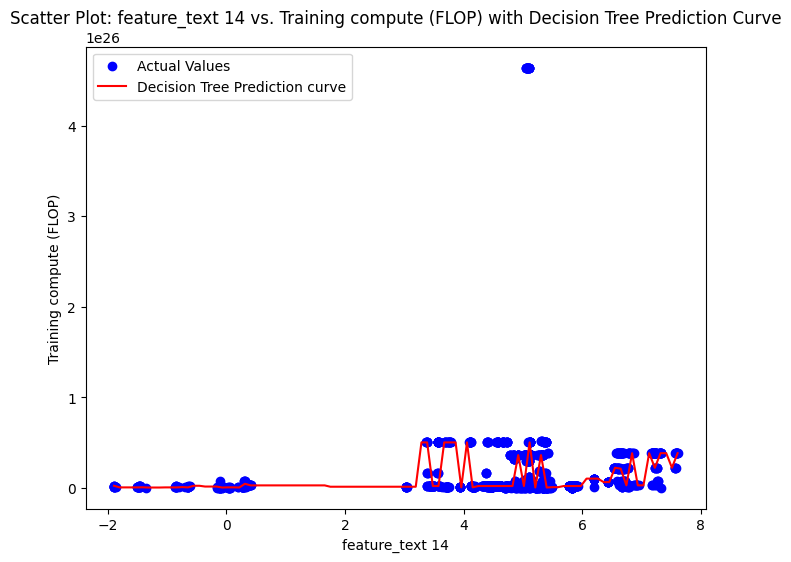

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.0
Hardware unit Release Price (USD): 0.0
Hardware unit TDP (W): 0.0
Hardware unit Compute FLOPS: 0.0
Hardware unit Compute OPS: 0.0
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.0
Batch size: 0.0
Hardware utilization: 0.0
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.0
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: 0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
Expected power (W): 0.0
Training Energy: 0.0
Expected Energy: 1.3706150944278753e-14
Expected compute flops: 0.0
feature_text 0: 0.8993357933504217
feature_text 1: 0.0
feature_text 2: 0.0
feature_text 3: 0.0
feature_text 4: 0.10066420664956459
feature_t

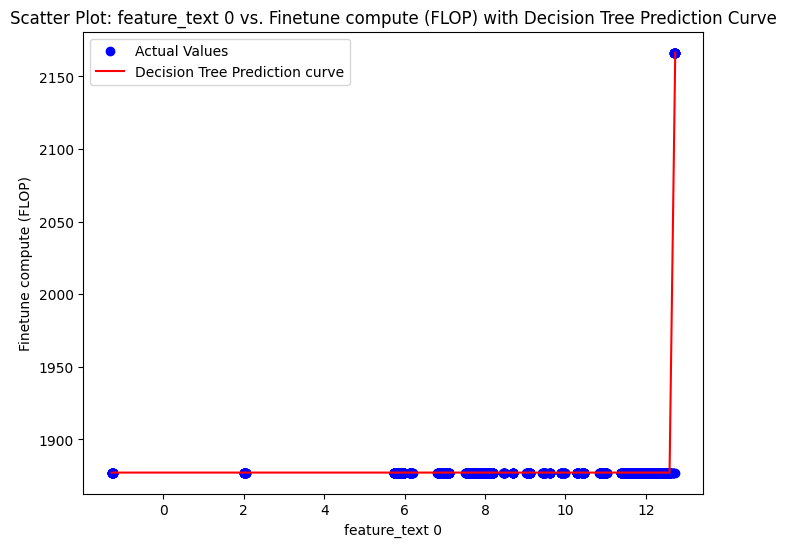

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 2.097285454994567e-06
data size: 7.78552337822005e-08
Training time (hours): 9.997152138109133e-07
Hardware unit Release Price (USD): 0.0
Hardware unit TDP (W): 0.0
Hardware unit Compute FLOPS: 0.0
Hardware unit Compute OPS: 2.731227889595534e-07
Hardware unit Memory Size (bytes): 0.0
Epochs: 7.005312779390702e-08
Batch size: 2.2378859534507727e-06
Hardware utilization: 9.032457033578293e-09
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.0
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: 0.0
Training dataset_encoded: 6.395089665900323e-09
Training code accessibility_encoded: 6.827176194509028e-10
Training hardware_encoded: 5.803958412733064e-08
Notability_encoded: 0.012319962481986076
Expected power (W): 7.427013435018976e-06
Training Energ

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


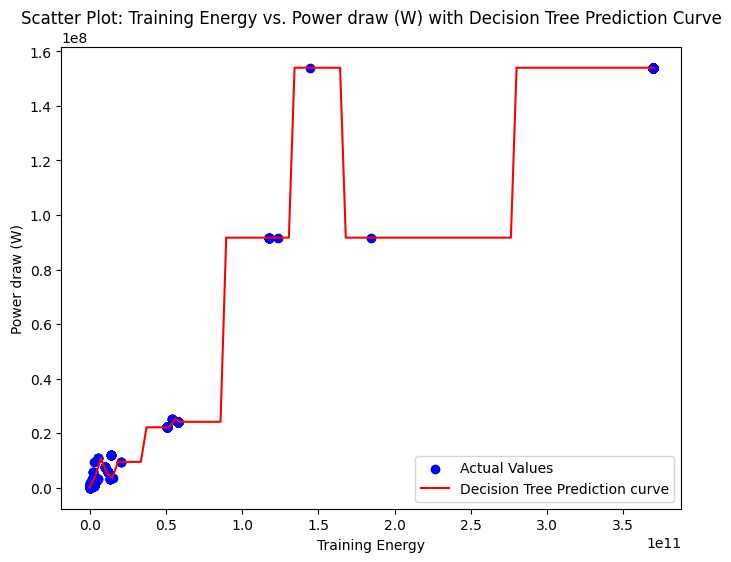

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.0
data size: 1.0846031063239057e-07
Training time (hours): 7.189692667598839e-09
Hardware unit Release Price (USD): 1.5550961377032283e-09
Hardware unit TDP (W): 0.0
Hardware unit Compute FLOPS: 2.8647618541812616e-06
Hardware unit Compute OPS: 6.184377300844936e-10
Hardware unit Memory Size (bytes): 9.422195913879046e-08
Epochs: 0.0
Batch size: 1.2101683530567216e-07
Hardware utilization: 0.0
Domain_encoded: 0.0
Country_encoded: 1.075893310567184e-08
Organization_encoded: 0.0
Date_encoded: 3.153728389527477e-08
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: 4.441857957846068e-06
Training dataset_encoded: 0.0
Training code accessibility_encoded: 7.459875152920252e-07
Training hardware_encoded: 0.0
Notability_encoded: 1.1598447162479748e-08
Expected power (W): 0.0018581852

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


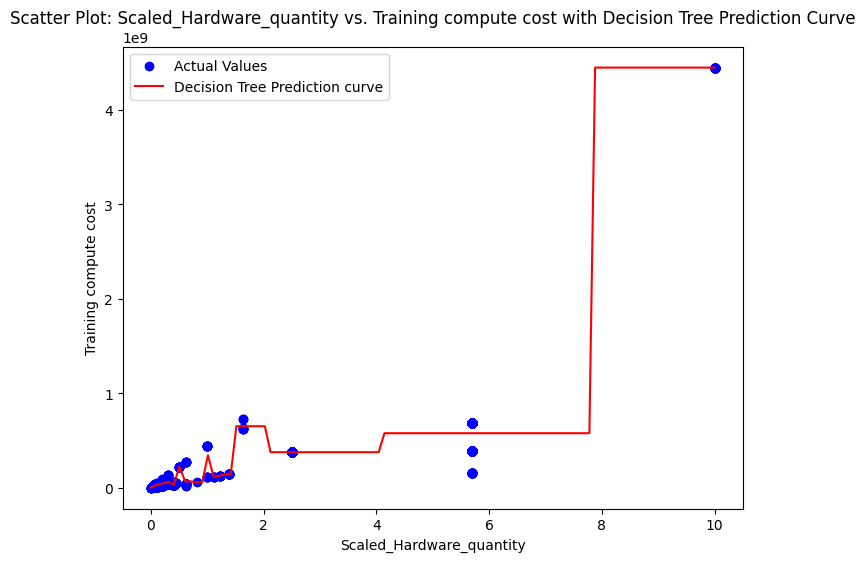

Running Models with Best Parameters: 100%|██████████| 5/5 [00:34<00:00,  6.99s/it]

--------------------------------------------------


In [ ]:
common_params['show_max_feature_graph'] = True
common_params['display_error'] = False
common_params['verbose'] = True
run_models(model_configs,common_params,store_err2)

In [ ]:
output_path_large_models = "/content/drive/MyDrive/DATA 6250/Datasets/ML_Project/Experiment2.csv"
if os.path.exists(output_path_large_models):
    os.remove(output_path_large_models)
path = os.path.dirname(output_path_large_models)
if not os.path.exists(path):
    os.makedirs(path)
df.to_csv(output_path_large_models, index=False)

## Experiment 3

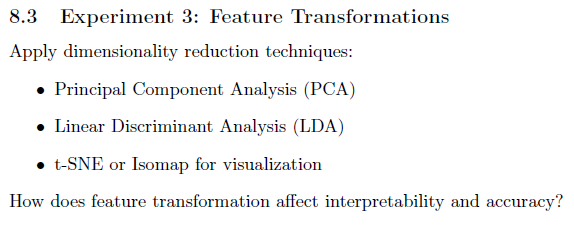

### Using PCA to 15 columns

In [ ]:
# prompt: give me code to apply PCA on the above data to get new data on whole data.keep atleast 3 to 4 features after applying pca

from sklearn.decomposition import PCA
n_comp=15
# Assuming 'X' is your feature matrix (df_new[num_cols])
# and you want to keep at least 4 principal components
X = df_new[num_cols]
pca = PCA(n_components=n_comp)  # Adjust n_components as needed
X_pca = pca.fit_transform(X)

# X_pca now contains the transformed data with reduced dimensionality
# You can create a new DataFrame with these principal components:
cols = [f"PCA{i}" for i in range(n_comp)]
pca_df = pd.DataFrame(data = X_pca, columns = cols)

# Now you can use pca_df as your input for modeling instead of X
# Example usage with linear regression:
pca_df = pd.concat([pca_df,df_new[out_cols]],axis=1)
pca_df.shape


(1705, 20)

In [ ]:
df_exp3 = pca_df.copy()
exp3_cols = cols

### Apply Grid Search Again

In [ ]:
Apply_Grid_Search(pca_df,cols,out_cols,results)

Hyperparameter Tuning:  86%|████████▌ | 6/7 [08:13<00:52, 52.11s/it] /usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.462e+25, tolerance: 3.639e+21
  model = cd_fast.enet_coordinate_descent(
Hyperparameter Tuning: 100%|██████████| 7/7 [08:13<00:00, 70.50s/it]

Model: SVR
Best parameters: {'svr__C': 10, 'svr__gamma': 'scale', 'svr__kernel': 'poly'}
Best R-squared score: -0.15355700336781514
--------------------
Model: Gradient Boosting
Best parameters: {'learning_rate': 0.5, 'max_depth': 2, 'n_estimators': 110}
Best R-squared score: 0.8858296007891167
--------------------
Model: Random Forest
Best parameters: {'max_depth': 6, 'min_samples_split': 2, 'n_estimators': 10}
Best R-squared score: 0.7769415834696772
--------------------
Model: Decision Tree
Best parameters: {'max_depth': 11, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best R-squared score: 0.6626469292806894
--------------------
Model: Linear Regression
Best parameters: None (default parameters)
Best R-squared score: 0.24764737535762
--------------------
Model: Ridge
Best parameters: {'ridge__alpha': 100}
Best R-squared score: 0.21522922830654698
--------------------
Model: Lasso
Best parameters: {'lasso__alpha': 1000}
Best R-squared score: 0.21138643039809785
-------------------

In [ ]:
model_configs,common_params = get_model_config(pca_df,cols,out_cols,results)

In [ ]:
common_params['show_max_feature_graph'] = False
common_params['display_error'] = True
common_params['verbose'] = True
store_err3={}
run_models(model_configs,common_params,store_err3)

Running Models with Best Parameters:   0%|          | 0/5 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.34213e-40): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/

Linear Regression (Linear)
Showing Errors for Parameters
The Mean_Absolute_Error Error is: 67467867416.37882
The Mean_Squared_Error Error is: 1.8808200698481772e+22
The Root_Mean_Squared_Error Error is: 137142993617.9088
The Median_Absolute_Error Error is: 46054335987.960075
The Mean_Absolute_Percentage_Error Error is: 5.767483991155732
The Mean_Squared_Log_Error Error is: 22.519212960309673
The R2 Error is: 0.17975237364579144
The Explained_Variance Error is: 0.18287457394878803
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.8103095798946889
The Root_Relative_Squared_Error Error is: 0.9056752322738039
The Adjusted_R2 Error is: 0.14189479089098178

--------------------------------------------------
Linear Regression (Linear)
Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 1.3612337372218478e+25
The Mean_Squared_Error Error is: 1.4182877292514476e+51
The Root_Mean_Squared_Error Error is: 3.7660161035920274e+25
The Median_Absolute_Er

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.616e+16, tolerance: 6.917e+14
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Linear Regression (Lasso)
Showing Errors for Power draw (W)
The Mean_Absolute_Error Error is: 1552287.882050091
The Mean_Squared_Error Error is: 14933036867598.59
The Root_Mean_Squared_Error Error is: 3864328.7732280996
The Median_Absolute_Error Error is: 949027.5110374893
The Mean_Absolute_Percentage_Error Error is: 3.03776237317781
The Mean_Squared_Log_Error Error is: 11.97042446911469
The R2 Error is: 0.996894474158007
The Explained_Variance Error is: 0.9968949532406127
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.024043940447909674
The Root_Relative_Squared_Error Error is: 0.055727245060140804
The Adjusted_R2 Error is: 0.9967511421960689

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.141e+17, tolerance: 7.793e+16
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  20%|██        | 1/5 [00:00<00:00,  4.38it/s]/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Linear Regression (Lasso)
Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 10367717.39839401
The Mean_Squared_Error Error is: 346079812148137.7
The Root_Mean_Squared_Error Error is: 18603220.477867205
The Median_Absolute_Error Error is: 6709610.567355156
The Mean_Absolute_Percentage_Error Error is: 0.5195306061482362
The Mean_Squared_Log_Error Error is: 12.530096263692926
The R2 Error is: 0.9995492878597375
The Explained_Variance Error is: 0.9995495457065362
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.022925645331427363
The Root_Relative_Squared_Error Error is: 0.021229982106976422
The Adjusted_R2 Error is: 0.9995284857609562

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 61727766409.769775
The Mean_Squared_Error Error is: 2.6233617716063613e+22
The Root_Mean_Squared_Error Error is: 161967952743.94135
The Me

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 1.1006307615964163e+25
The Mean_Squared_Error Error is: 1.5525765351153307e+51
The Root_Mean_Squared_Error Error is: 3.940274781173682e+25
The Median_Absolute_Error Error is: 1.410001e+24
The Mean_Absolute_Percentage_Error Error is: 2.109609345540536
The Mean_Squared_Log_Error Error is: 3.22560939335232
The R2 Error is: -0.06837742012190229
The Explained_Variance Error is: 3.3306690738754696e-16
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.6813356087618396
The Root_Relative_Squared_Error Error is: 1.0336234421305963
The Adjusted_R2 Error is: -0.11768714720445161

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error is: 2.5872186524128056
The Mean_Squared_Error Error is: 713.2020837358804
The Root_Mean

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  40%|████      | 2/5 [00:00<00:01,  2.65it/s]

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 431902567.0068067
The Mean_Squared_Error Error is: 7.705605950943749e+17
The Root_Mean_Squared_Error Error is: 877815809.3212806
The Median_Absolute_Error Error is: 333241565.6208015
The Mean_Absolute_Percentage_Error Error is: 32.47155052365612
The Mean_Squared_Log_Error Error is: 7.146737799831078
The R2 Error is: -0.0035286740975837283
The Explained_Variance Error is: 1.2328048870635655e-07
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.9550458108035319
The Root_Relative_Squared_Error Error is: 1.001762783346229
The Adjusted_R2 Error is: -0.04984538213285683

--------------------------------------------------
Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 15041185210.6119
The Mean_Squared_Error Error is: 2.6528624

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 7.702608833344719e+24
The Mean_Squared_Error Error is: 2.1331017921767593e+51
The Root_Mean_Squared_Error Error is: 4.618551496061032e+25
The Median_Absolute_Error Error is: 5.9666174585980025e+23
The Mean_Absolute_Percentage_Error Error is: 2.4530966026755894
The Mean_Squared_Log_Error Error is: 82.31277679487513
The R2 Error is: -0.46785536045340503
The Explained_Variance Error is: -0.46411160866799683
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.47682309650415056
The Root_Relative_Squared_Error Error is: 1.2115508080362973
The Adjusted_R2 Error is: -0.5356025309358701

--------------------------------------------------
Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error is: 0.00011734739309438823
The Mean_Squared_Error Error is: 5.146142482549447e-07
The Root_Mean_Squared_Error Error is: 0.0007173661883967941
The Median_Absolute_Error Error is: 5.067386382506811e-05
The Mean_Absolute_Percentage_Error Error is: 5.7740839857077936e-08
The Mean_Squared_Log_Error Error is: 1.0973797494732545e-13
The R2 Error is: 0.9999999992941008
The Explained_Variance Error is: 0.9999999992944921
The Log_Cosh_Error Error is: 2.57304640256317e-07
The Relative_Absolute_Error Error is: 2.3270693073043698e-05
The Root_Relative_Squared_Error Error is: 2.65687651187701e-05
The Adjusted_R2 Error is: 0.9999999992615208

--------------------------------------------------
Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Power draw (W)
The Mean_Absolute_Error Error is: 320195.7316395722
The Mean_Squared_Error Error is: 413404956493.63153
The

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  60%|██████    | 3/5 [00:02<00:01,  1.02it/s]

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 594798.105450787
The Mean_Squared_Error Error is: 1289177597052.315
The Root_Mean_Squared_Error Error is: 1135419.5687288092
The Median_Absolute_Error Error is: 115511.63682644069
The Mean_Absolute_Percentage_Error Error is: 0.04132020655355454
The Mean_Squared_Log_Error Error is: 0.006902244527928771
The R2 Error is: 0.9999983210578209
The Explained_Variance Error is: 0.9999983211013503
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.001315249045222042
The Root_Relative_Squared_Error Error is: 0.0012957400121501464
The Adjusted_R2 Error is: 0.9999982435681819

--------------------------------------------------
Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 6614742043.900998
T

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 4.630317053253962e+24
The Mean_Squared_Error Error is: 1.381235729688744e+51
The Root_Mean_Squared_Error Error is: 3.7164979882797516e+25
The Median_Absolute_Error Error is: 3489660928.0
The Mean_Absolute_Percentage_Error Error is: 0.32559320942284486
The Mean_Squared_Log_Error Error is: 0.18585038279783372
The R2 Error is: 0.04952765155926109
The Explained_Variance Error is: 0.05009145464649223
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.28663562734365317
The Root_Relative_Squared_Error Error is: 0.9749217140061754
The Adjusted_R2 Error is: 0.0056596970158423465

--------------------------------------------------
Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error i

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Power draw (W)
The Mean_Absolute_Error Error is: 144223.6668617446
The Mean_Squared_Error Error is: 2115768185487.9736
The Root_Mean_Squared_Error Error is: 1454568.040858857
The Median_Absolute_Error Error is: 7.450580596923828e-08
The Mean_Absolute_Percentage_Error Error is: 0.14306692494598322
The Mean_Squared_Log_Error Error is: 0.07755092470212452
The R2 Error is: 0.9995599975521419
The Explained_Variance Error is: 0.9995634193244292
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.0022339317966092653
The Root_Relative_Squared_Error Error is: 0.02097623531185134
The Adjusted_R2 Error is: 0.9995396897468561

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  80%|████████  | 4/5 [00:05<00:01,  1.76s/it]/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeW

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 108111.16492088794
The Mean_Squared_Error Error is: 399306334495.99945
The Root_Mean_Squared_Error Error is: 631906.9033457377
The Median_Absolute_Error Error is: 7.450580596923828e-09
The Mean_Absolute_Percentage_Error Error is: 0.0038697037538133897
The Mean_Squared_Log_Error Error is: 0.0005894046809334559
The R2 Error is: 0.9999994799690525
The Explained_Variance Error is: 0.9999994806039902
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.00023906112870395737
The Root_Relative_Squared_Error Error is: 0.0007211317130421344
The Adjusted_R2 Error is: 0.9999994559676241

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 51

Running Models with Best Parameters:   0%|          | 0/5 [00:00<?, ?it/s]

Linear Regression (Linear)
Regression Coefficients for each feature:
PCA0: 7.441312149435517e-10
PCA1: -1.9490850948542605e-05
PCA2: 4.680920263538036e-05
PCA3: 0.001994756560290081
PCA4: 118.98084650412228
PCA5: -546.8398394320009
PCA6: -0.47827971129785773
PCA7: -0.15712454419102068
PCA8: 0.6518104720757505
PCA9: 16.718543086548127
PCA10: 99.73592362984395
PCA11: 1.8506482857957174
PCA12: 12.129458657883347
PCA13: -0.09048927461520417
PCA14: 1.5019098526432169e-05
The main feature is PCA5


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


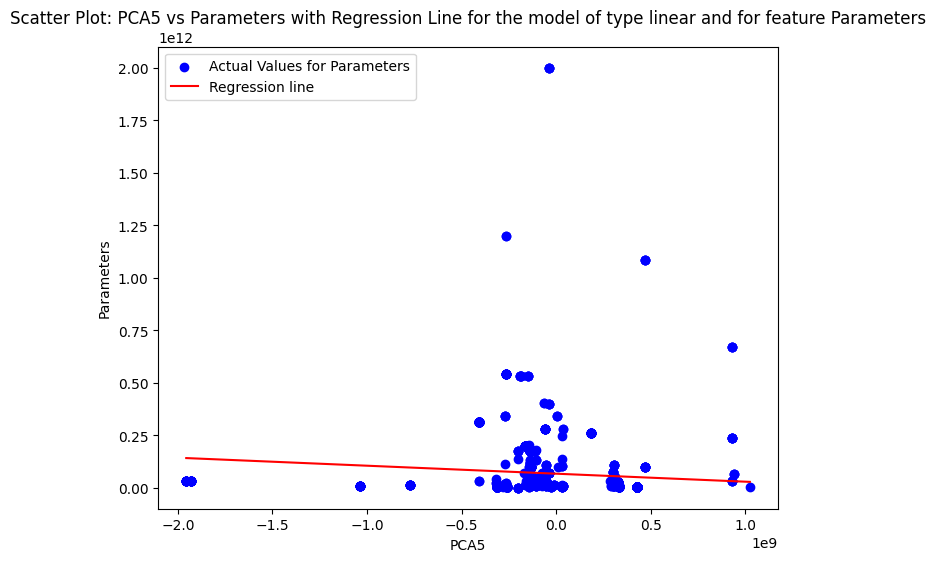

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
PCA0: 776080.1551189558
PCA1: -9274290906.630585
PCA2: 11355899288.75991
PCA3: -852099893405.5736
PCA4: -4.42580023476268e+16
PCA5: 2.0333238832306432e+17
PCA6: 177978770453092.62
PCA7: 58958653085734.8
PCA8: -242456684919453.0
PCA9: -6218904162265221.0
PCA10: 1.3457442334891808e+16
PCA11: -688394834784158.1
PCA12: -4511682320325844.0
PCA13: 31580237830577.793
PCA14: -5521709049.625665
The main feature is PCA5


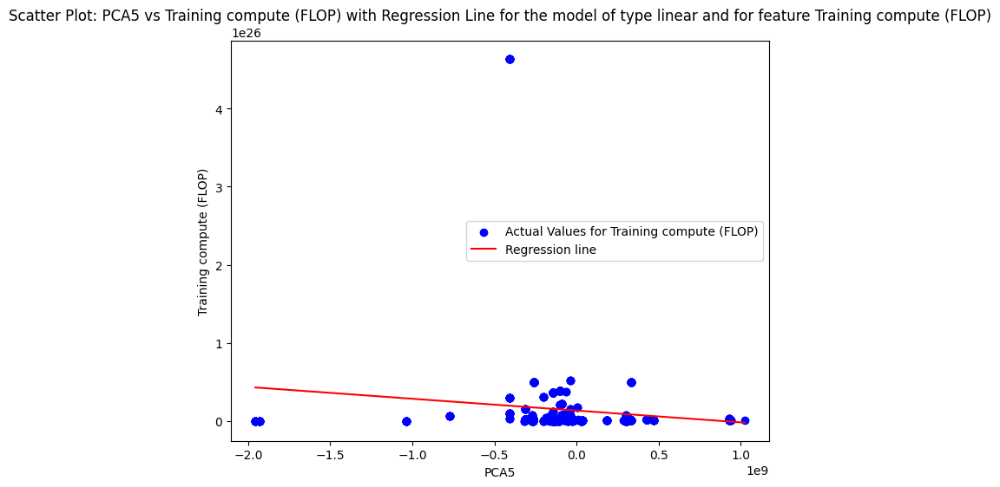

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
PCA0: -1.8075441617962675e-20
PCA1: 7.894512263962483e-16
PCA2: -4.712714924353229e-15
PCA3: 3.7891611593101406e-13
PCA4: 2.178586437450329e-08
PCA5: -1.0011066293402536e-07
PCA6: -8.759084571488893e-11
PCA7: -2.888627179337798e-11
PCA8: 1.1934883619849401e-10
PCA9: 3.0612336905178687e-09
PCA10: 6.7960252828673374e-09
PCA11: 3.3886065943217877e-10
PCA12: 2.220910327300291e-09
PCA13: -1.6097305077763572e-11
PCA14: 2.735307299423634e-15
The main feature is PCA5


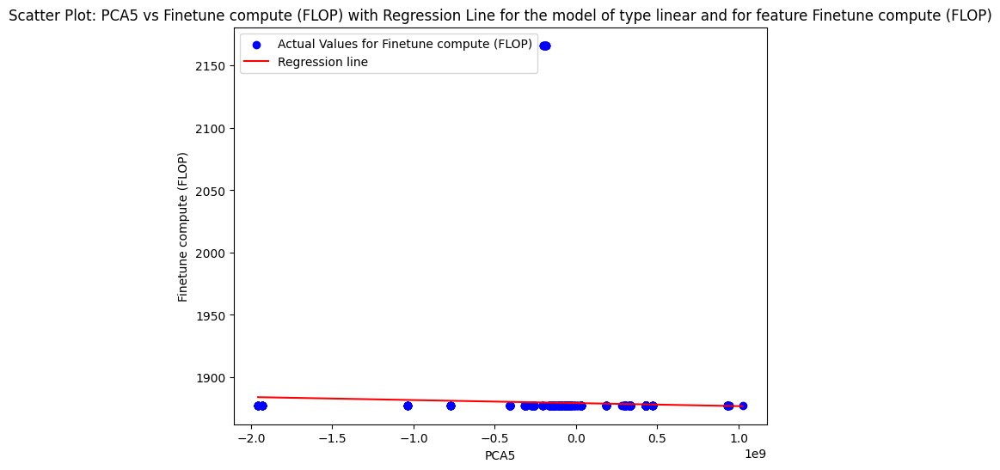

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
PCA0: 1.1436869416514333e-12
PCA1: 3.3637529869355295e-08
PCA2: -5.556600579627757e-08
PCA3: 8.437739460699945e-07
PCA4: 0.034892833861901326
PCA5: -0.16017338511178406
PCA6: -0.00014043636589447744
PCA7: -4.73472246484301e-05
PCA8: 0.00019115007766054272
PCA9: 0.004902975915845265
PCA10: -0.09595005988830538
PCA11: 0.0005427249820550427
PCA12: 0.003556682802019043
PCA13: -2.1387374487267697e-05
PCA14: 4.24351735739294e-09
The main feature is PCA5


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


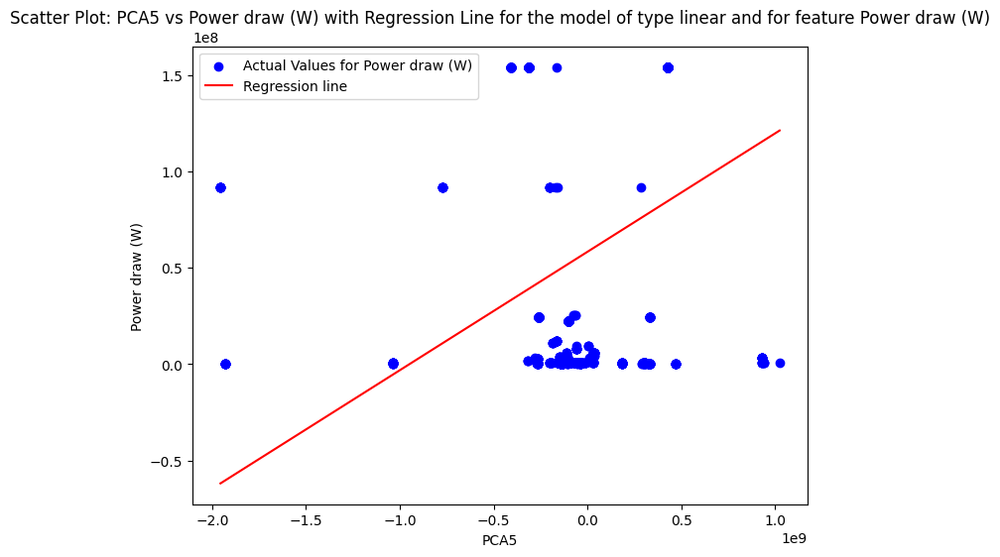

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
PCA0: 2.408497186823607e-11
PCA1: 2.591823844988664e-09
PCA2: 1.199536654906235e-10
PCA3: -2.2427977663471406e-07
PCA4: -0.013777455085790898
PCA5: 0.06332823709887991
PCA6: 5.537678452695814e-05
PCA7: 1.8151413601618902e-05
PCA8: -7.547685594421207e-05
PCA9: -0.001935932428125172
PCA10: -0.01578538294336583
PCA11: -0.00021429701343191992
PCA12: -0.0014045529668930904
PCA13: 1.0652516200354248e-05
PCA14: -1.7445945302698834e-09
The main feature is PCA5


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


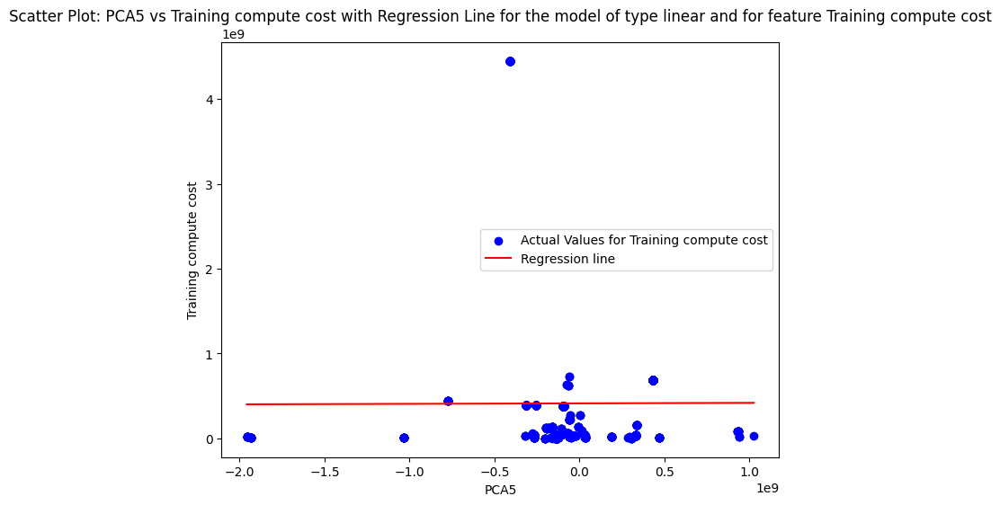

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
PCA0: 7.464801989399726e-10
PCA1: -11.78823793919895
PCA2: -27.079232320972082
PCA3: 1054.7785358618162
PCA4: -1187277897.6557758
PCA5: -275121674.4805111
PCA6: 27253392522.282753
PCA7: -1375235256.9117818
PCA8: 1604979509.2109072
PCA9: 4773452133.951224
PCA10: -428599.5156308607
PCA11: 511383324.75194156
PCA12: -6440528561.704321
PCA13: -566181.2058553938
PCA14: -3713696544.110295
The main feature is PCA6


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.34213e-40): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


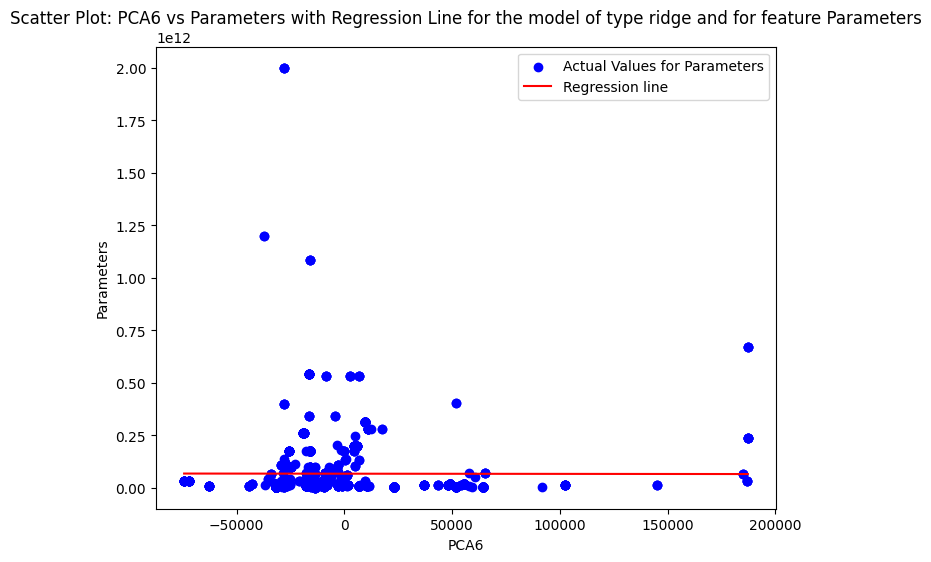

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
PCA0: 776532.5707333215
PCA1: 5580149974204100.0
PCA2: 5316941208154295.0
PCA3: -9.405419146215434e+16
PCA4: 1.0667515282786924e+23
PCA5: 2.466965651868773e+22
PCA6: -1.4441285203195533e+24
PCA7: -2.2744976098934898e+23
PCA8: -6.275735683962884e+23
PCA9: -8.314989526585791e+23
PCA10: 3.847627091546258e+19
PCA11: 2.1595154304743845e+23
PCA12: 1.1524484990007205e+24
PCA13: 5.4560772274632425e+20
PCA14: -2.8909979717542247e+23
The main feature is PCA6


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.34213e-40): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


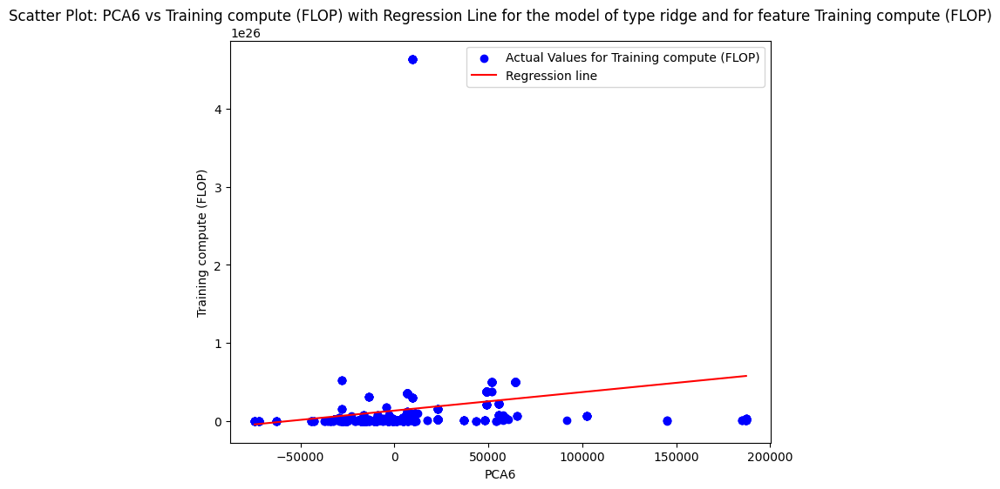

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
PCA0: -1.6513231769029687e-20
PCA1: 1.200312416646511e-08
PCA2: 4.621844351799895e-09
PCA3: 1.6584794920363764e-07
PCA4: -0.18421380800595577
PCA5: -0.0428389931591763
PCA6: 1.3708754608285
PCA7: -0.19722692534833342
PCA8: -1.2298569823181593
PCA9: 0.04694665913081216
PCA10: -6.672152782557013e-05
PCA11: -0.6501648803804603
PCA12: 0.028300672106715784
PCA13: 0.0004789113561375817
PCA14: -1.0672469112976097
The main feature is PCA6


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.34213e-40): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


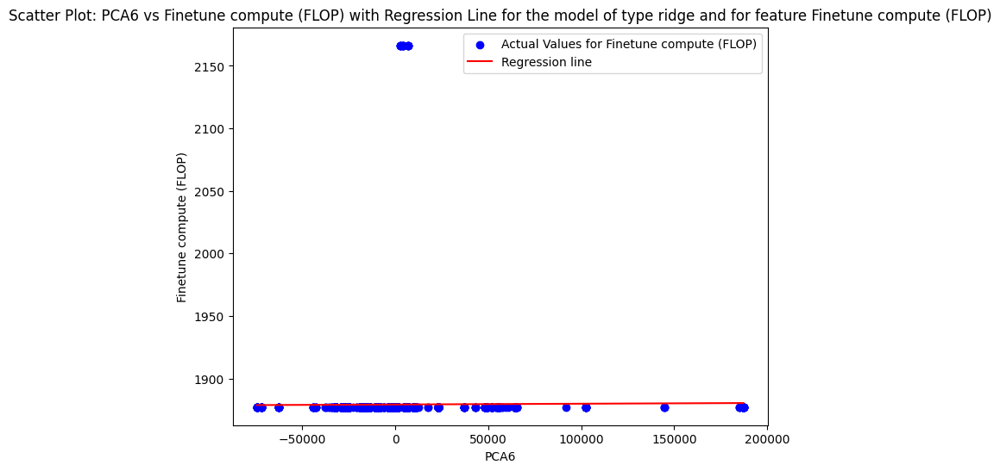

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
PCA0: 1.1438450703991552e-12
PCA1: 0.0004663078280179186
PCA2: 0.0005839746693302201
PCA3: -0.015407779623790684
PCA4: 17396.604896746554
PCA5: 4027.833281187667
PCA6: -743923.6102937589
PCA7: 62571.33014207406
PCA8: -54901.947835239036
PCA9: -78341.81861362832
PCA10: 6.175070940993109
PCA11: -100023.81998910611
PCA12: 108566.8351650244
PCA13: -123.21143370862215
PCA14: -78001.57738290935
The main feature is PCA6


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.34213e-40): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


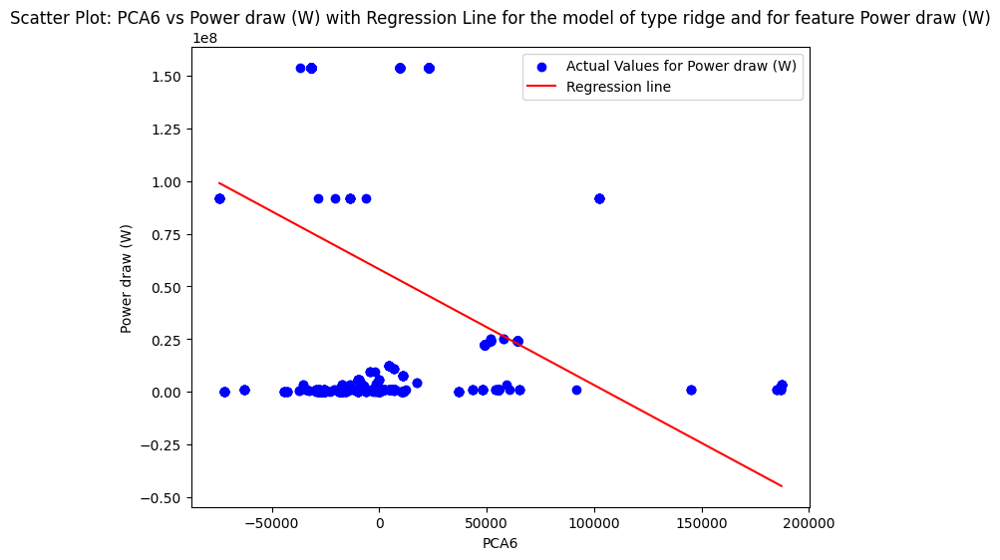

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
PCA0: 2.40854537729885e-11
PCA1: -0.00014406075060552186
PCA2: 0.001973678903134446
PCA3: -0.11160875648733513
PCA4: 125379.46621840823
PCA5: 29069.16554349848
PCA6: 1592996.9104777297
PCA7: -761111.8783869909
PCA8: -20991.4587738464
PCA9: -854524.396534263
PCA10: 45.21131109751581
PCA11: -1152714.962079755
PCA12: 1488060.4851395774
PCA13: -1567.7196346334754
PCA14: 1985452.3904864981
The main feature is PCA14


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.34213e-40): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


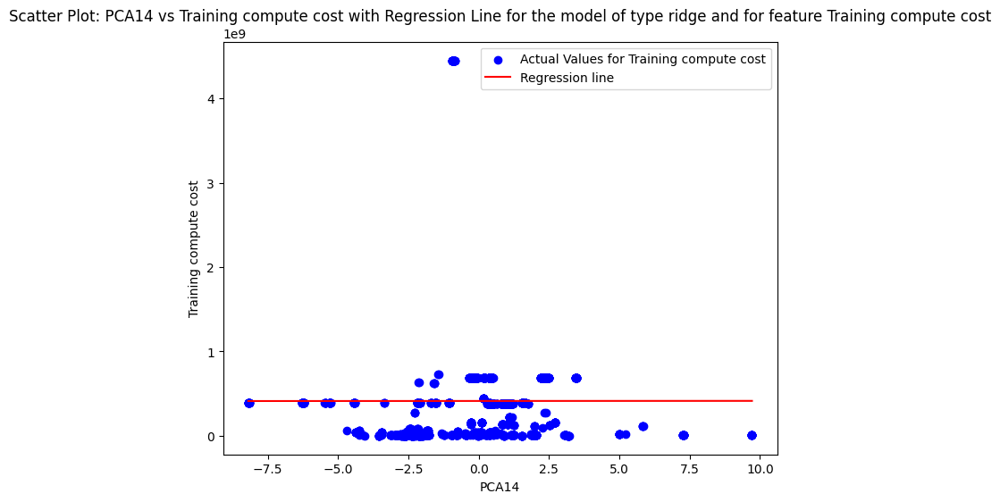

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
PCA0: 7.422961091609943e-10
PCA1: -2.6235914204962507e-05
PCA2: 7.747646365112304e-05
PCA3: -0.0001293461715585883
PCA4: -199.07805800611612
PCA5: -0.32926346525781885
PCA6: -282083.0139805762
PCA7: 544239.9958918527
PCA8: 32.015296203212785
PCA9: 11328.982266998226
PCA10: 64.37093794210998
PCA11: 65991.20053072627
PCA12: -168.63941407396132
PCA13: -978332.6078264271
PCA14: -7109708868.71162
The main feature is PCA14


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.343e+25, tolerance: 3.388e+21
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


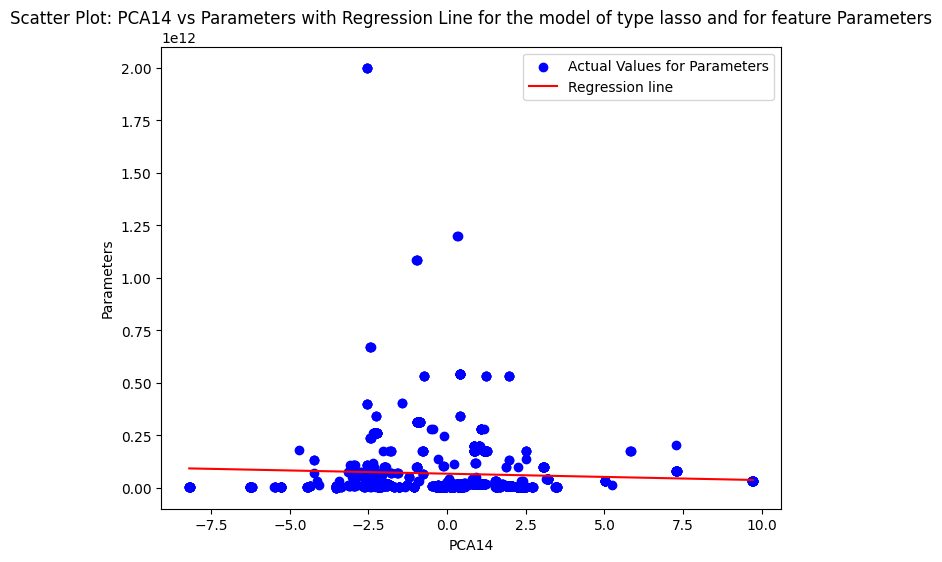

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.460e+53, tolerance: 2.987e+50
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
PCA0: 775771.3212929516
PCA1: -5525736677.403902
PCA2: 546193183.7860986
PCA3: -65649646308.71432
PCA4: -2.1678797860987987e+17
PCA5: 130965060597096.3
PCA6: 2.0648848655710103e+20
PCA7: -6.8571261196761465e+19
PCA8: -1.099725278646108e+17
PCA9: -1.4409227388438564e+18
PCA10: 3.4126610864293736e+16
PCA11: 3.4391583464563773e+19
PCA12: -4.00044494900726e+16
PCA13: 5.0402050034145775e+20
PCA14: 1.185988007561288e+23
The main feature is PCA14


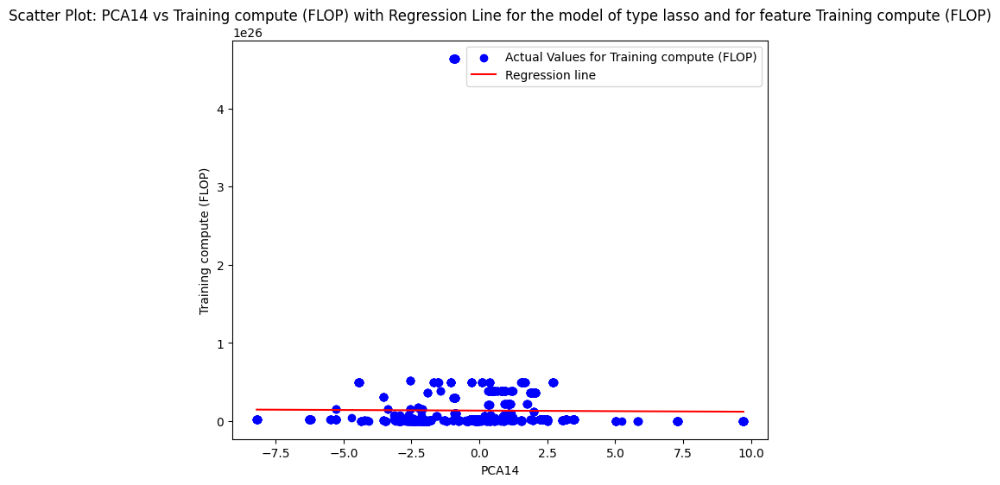

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.355e+05, tolerance: 7.474e+01
  model = cd_fast.enet_coordinate_descent(


Linear Regression (Lasso)
Regression Coefficients for each feature:
PCA0: -1.969291309264518e-20
PCA1: 2.2807180565598934e-17
PCA2: 1.683806013020938e-15
PCA3: -1.9447648028287807e-15
PCA4: 5.475872740826726e-07
PCA5: -1.7075467861485437e-10
PCA6: 0.00010130740448536141
PCA7: 0.000248315782245909
PCA8: -5.548692854065489e-08
PCA9: 4.900826726547498e-06
PCA10: 1.761395834871568e-08
PCA11: 1.7388458269631715e-05
PCA12: 8.070487732207156e-08
PCA13: 0.00030530862959879846
PCA14: -0.5905625587071182
The main feature is PCA14


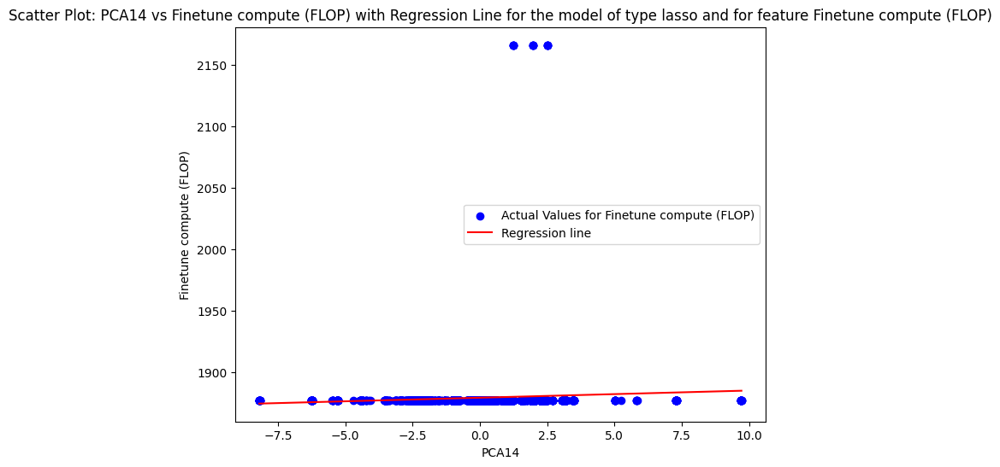

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.616e+16, tolerance: 6.917e+14
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
PCA0: 1.1439216137515464e-12
PCA1: 2.9820671526587715e-08
PCA2: -4.671521780859891e-08
PCA3: 2.2960720050825374e-07
PCA4: 0.7196276365184323
PCA5: -0.00024059053345981503
PCA6: -355.0970807924703
PCA7: 61.34031859178106
PCA8: 0.1958435396914524
PCA9: 1.2993192809039391
PCA10: -0.10055029654255822
PCA11: -101.10543514204477
PCA12: 0.07778330879618817
PCA13: -114.10879266946121
PCA14: 24362.261063309023
The main feature is PCA14


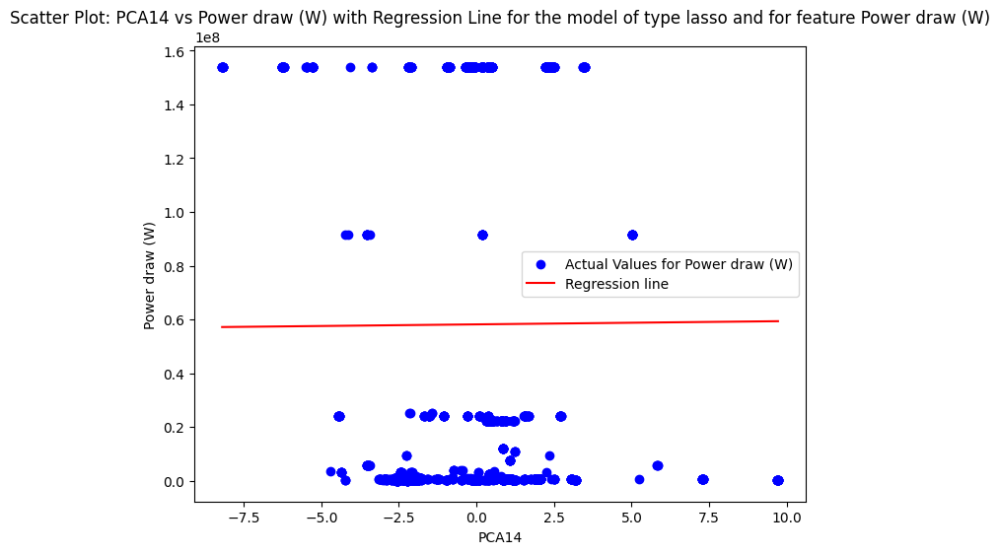

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.141e+17, tolerance: 7.793e+16
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Linear Regression (Lasso)
Regression Coefficients for each feature:
PCA0: 2.4087144469381432e-11
PCA1: 3.1732401762660526e-09
PCA2: -7.158340797089601e-09
PCA3: 5.9325455948593e-09
PCA4: -1.813604953647444
PCA5: 0.00046742991707516396
PCA6: -327.1168998062012
PCA7: 17.370341660532542
PCA8: -0.1403355606141704
PCA9: 0.29098961923192607
PCA10: -0.08641231067538568
PCA11: -87.53716562308473
PCA12: 0.16804078736613
PCA13: -1638.1910571968986
PCA14: 2662637.3301248313
The main feature is PCA14


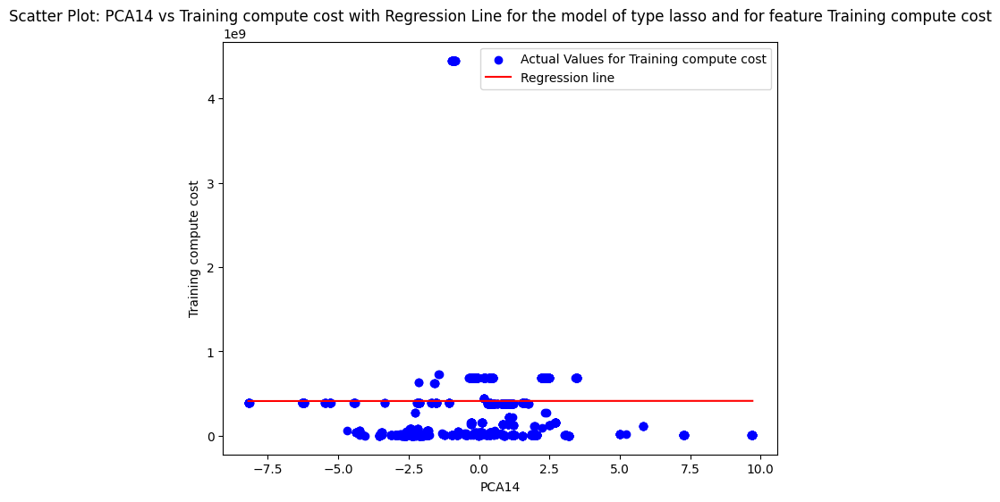

Running Models with Best Parameters:  20%|██        | 1/5 [00:02<00:10,  2.74s/it]

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


PCA0: -1442222755020.8
PCA1: 522136322048.0
PCA2: 847391594905.6
PCA3: 1047227531264.0
PCA4: 288817676288.0
PCA5: 1093081340313.6
PCA6: 268475721318.4
PCA7: 171388488908.8
PCA8: 349414044467.2
PCA9: 277126892748.8
PCA10: 1774755145318.4
PCA11: 277311442124.8
PCA12: 279173713100.8
PCA13: 2407553984102.4
PCA14: 447833807257.6

Most influential feature according to permutation importance: PCA13


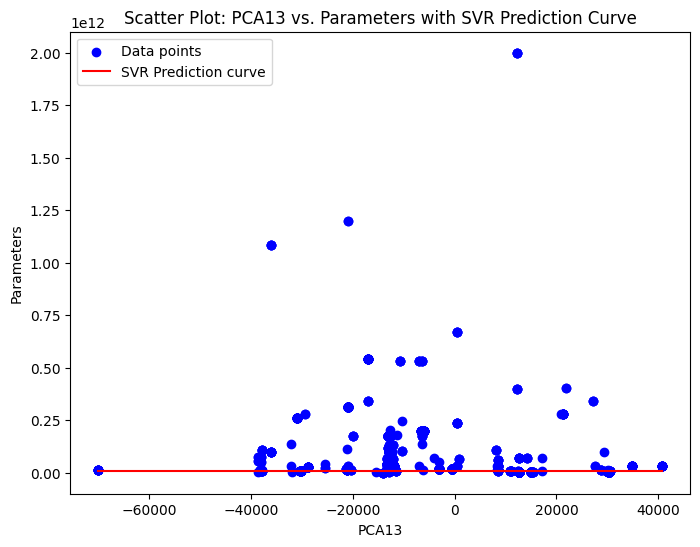

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


PCA0: 0.0
PCA1: 0.0
PCA2: 0.0
PCA3: 0.0
PCA4: 0.0
PCA5: 0.0
PCA6: 0.0
PCA7: 0.0
PCA8: 0.0
PCA9: 0.0
PCA10: 0.0
PCA11: 0.0
PCA12: 0.0
PCA13: 0.0
PCA14: 0.0

Most influential feature according to permutation importance: PCA0


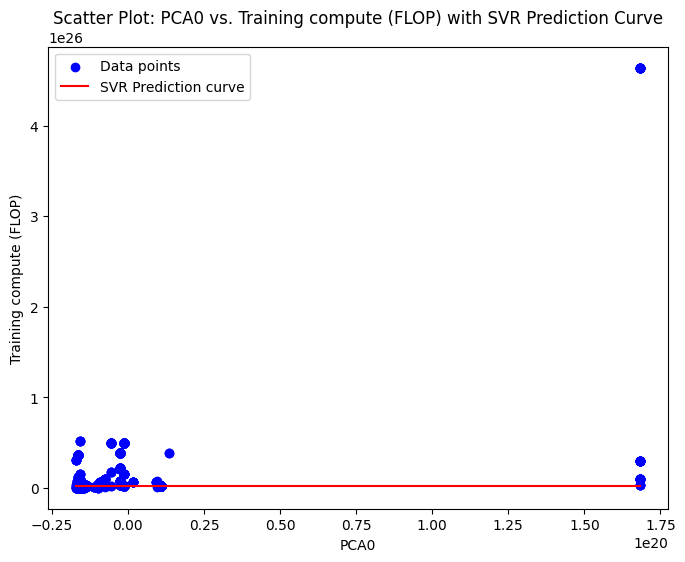

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

PCA0: 1.3601396335914047
PCA1: 0.30536399257190394
PCA2: 1.886956998473852
PCA3: 1.589723017405356
PCA4: 5.908594694163298
PCA5: 1.7792777812929443
PCA6: 1.4130759794688743
PCA7: 21.363144487734758
PCA8: 0.6540263025384092
PCA9: 3.7512301131457093
PCA10: 1.9910458229405663
PCA11: 3.800622363578418
PCA12: 4.296396432988217
PCA13: 1.5993781241463807
PCA14: 2.075521831467097

Most influential feature according to permutation importance: PCA7


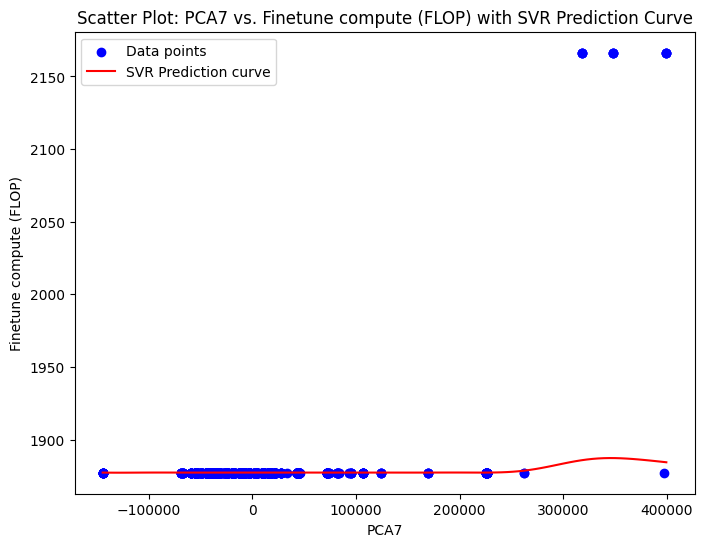

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


PCA0: 4357286536.3
PCA1: 1254342111.4
PCA2: 1411988515.1
PCA3: 3462844610.7
PCA4: 1758647357.5
PCA5: 3367463584.5
PCA6: 1536812177.8
PCA7: 726701976.1
PCA8: 697026424.5
PCA9: 1578084433.7
PCA10: 4367761427.2
PCA11: 1578478430.0
PCA12: 1582409402.3
PCA13: 3949733791.7
PCA14: 1075023936.6

Most influential feature according to permutation importance: PCA10


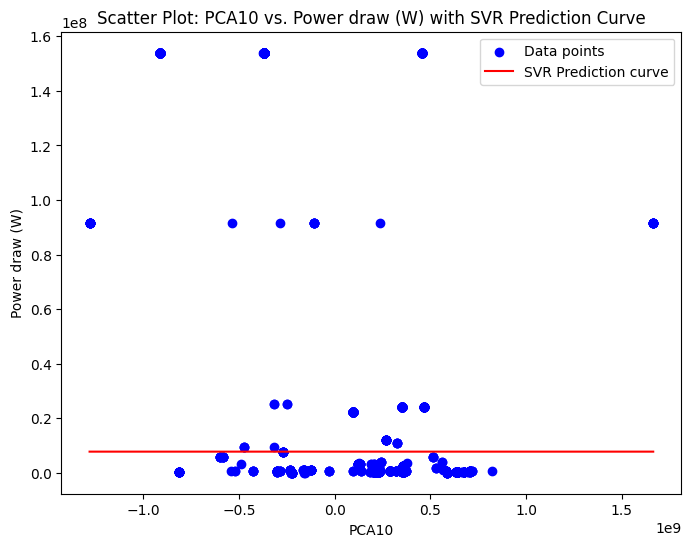

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


PCA0: 79748001331.2
PCA1: 4978145190.4
PCA2: 7134317196.8
PCA3: 12849631936.0
PCA4: 7359240960.0
PCA5: 12744356300.8
PCA6: 6520286348.8
PCA7: 2832832064.0
PCA8: 3538292953.6
PCA9: 6523680064.0
PCA10: 16488856908.8
PCA11: 6524148928.0
PCA12: 6529198195.2
PCA13: 18595114598.4
PCA14: 3951584268.8

Most influential feature according to permutation importance: PCA0


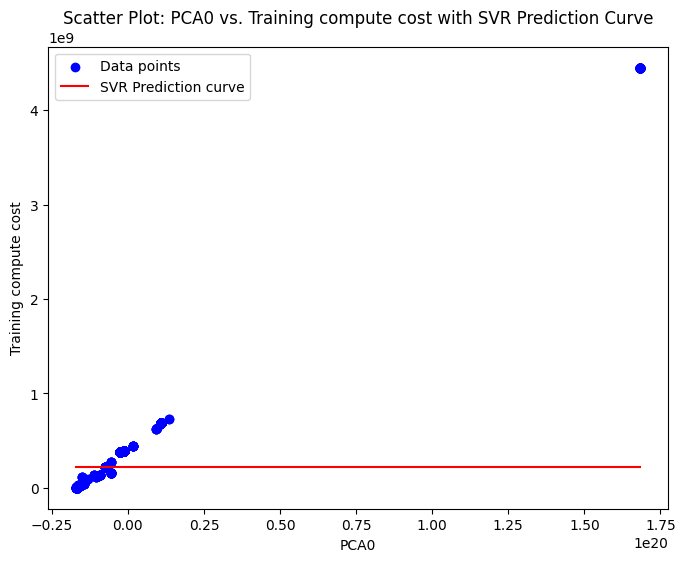

Running Models with Best Parameters:  40%|████      | 2/5 [00:05<00:09,  3.00s/it]

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

PCA0: 0.017971244793698212
PCA1: 0.1133067374357217
PCA2: 0.09107566570385288
PCA3: 0.035444563129474374
PCA4: 0.05932106642312724
PCA5: 0.037384387147987516
PCA6: 0.1802968483113978
PCA7: 0.16503163034142748
PCA8: 0.05677426805757013
PCA9: 0.07848490432277033
PCA10: 0.002316663881314938
PCA11: 0.01910121216006067
PCA12: 0.010054413644275085
PCA13: 0.1245417492847036
PCA14: 0.008894645362618029

Most influential feature according to permutation importance: PCA6


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


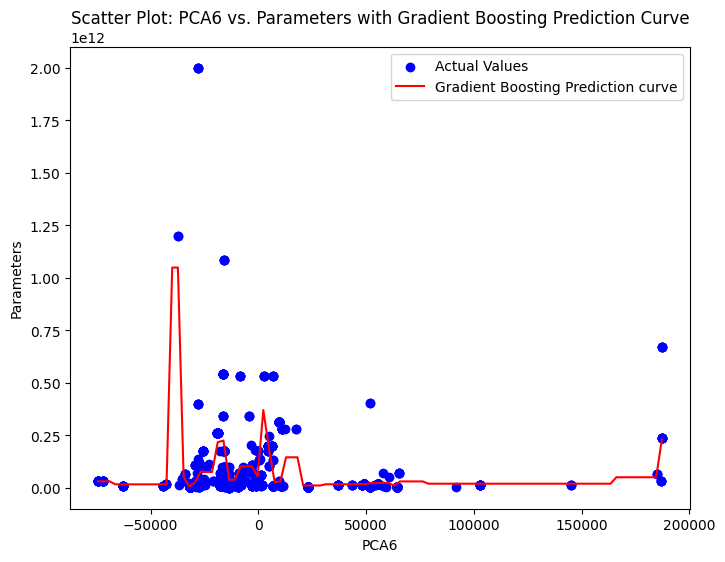

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

PCA0: 0.1843255567486877
PCA1: 0.14344409311272743
PCA2: 0.021077703631030998
PCA3: 0.006265819083925656
PCA4: 0.03234407704129933
PCA5: 0.002250904918011407
PCA6: 0.2122011223450472
PCA7: 0.004660863689563738
PCA8: 0.0018054059908294456
PCA9: 0.02954878237693873
PCA10: 0.0005120535412995427
PCA11: 0.0036446957991322854
PCA12: 0.022008669356933675
PCA13: 0.0004482691408258567
PCA14: 0.33546198322374704

Most influential feature according to permutation importance: PCA14


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


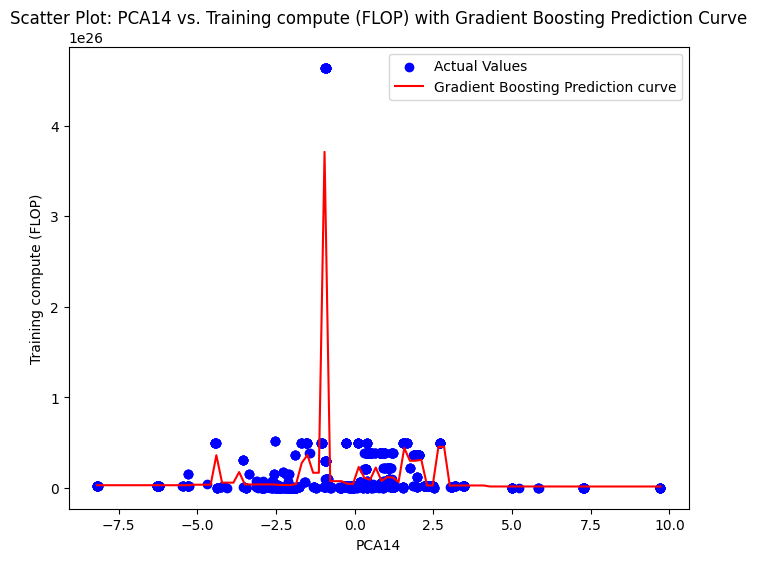

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

PCA0: -2.1674433049462066e-20
PCA1: -7.617660115508854e-19
PCA2: 0.0005415606467967692
PCA3: 0.009819871975401209
PCA4: 0.0
PCA5: 3.7794087082048647e-19
PCA6: 0.02860135136569607
PCA7: 0.8993357933579278
PCA8: -9.348122297109214e-19
PCA9: 0.023732075496974026
PCA10: -1.1836272423104674e-19
PCA11: 0.0060159987248960016
PCA12: 0.0029753686384339562
PCA13: 2.9377379801267116e-17
PCA14: 0.02897797979387417

Most influential feature according to permutation importance: PCA7


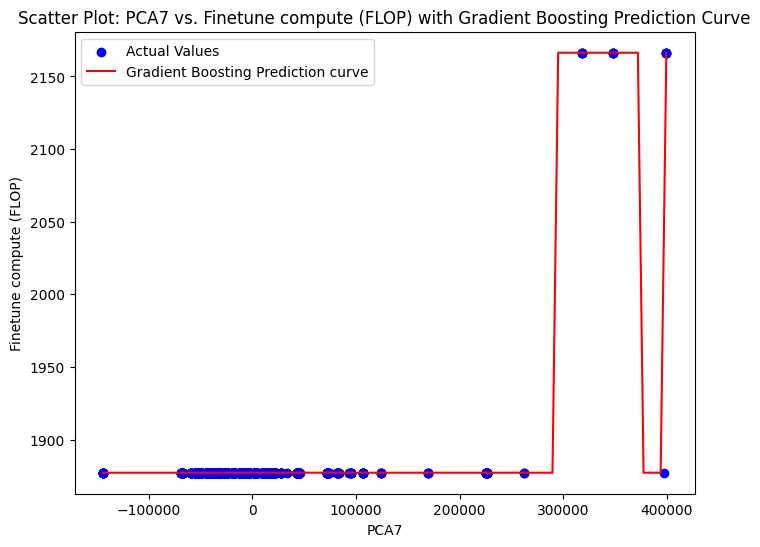

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

PCA0: 0.8234358568821815
PCA1: 0.01797601445299426
PCA2: 0.001667298221602426
PCA3: 0.0002602677435357336
PCA4: 0.055032163654351124
PCA5: 0.0013604602898152347
PCA6: 0.06748903680770868
PCA7: 0.002579090613467465
PCA8: 0.0008520214747965764
PCA9: 0.011721194518051472
PCA10: 0.00256099783942867
PCA11: 0.004563656750611208
PCA12: 0.004214924344526451
PCA13: 0.00186844631693485
PCA14: 0.004418570089994226

Most influential feature according to permutation importance: PCA0


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


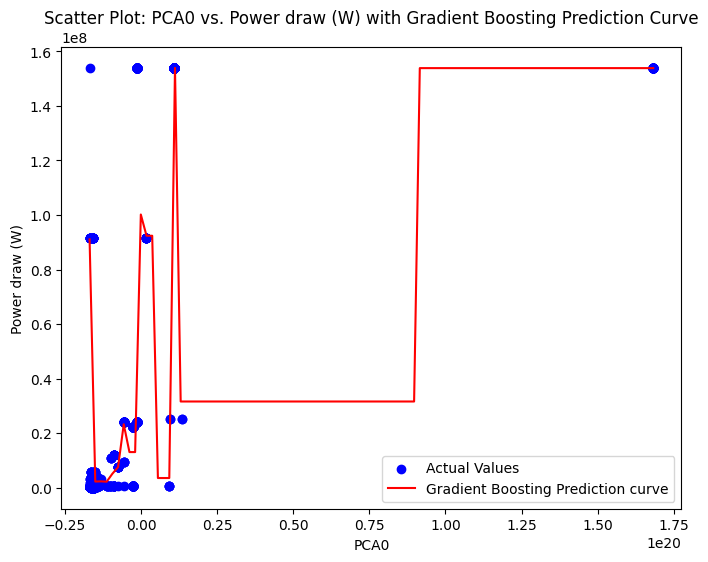

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

PCA0: 0.6476083327415411
PCA1: 0.34270566109008327
PCA2: 5.999205117689894e-06
PCA3: 0.005492871759529467
PCA4: 1.1538910080855582e-06
PCA5: 0.003131348354402298
PCA6: 1.1061711697466102e-06
PCA7: 4.467433197778746e-05
PCA8: 0.0010011509639248778
PCA9: 1.8415855699291484e-07
PCA10: 2.5445267687009466e-07
PCA11: 3.853915944290708e-07
PCA12: 2.276671493812742e-07
PCA13: 1.2666270813887557e-06
PCA14: 5.383194186611448e-06

Most influential feature according to permutation importance: PCA0


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


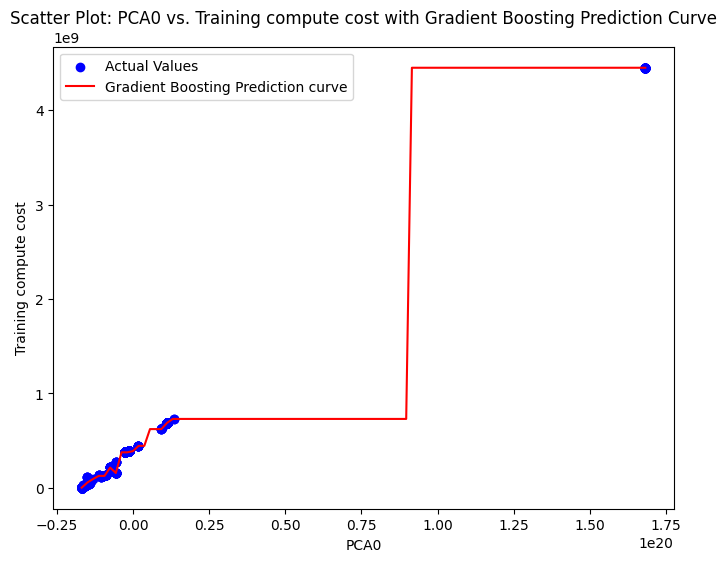

Running Models with Best Parameters:  60%|██████    | 3/5 [00:08<00:06,  3.01s/it]

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

PCA0: 0.03975636383307439
PCA1: 0.11630873973354337
PCA2: 0.07796570781640678
PCA3: 0.04943921809368851
PCA4: 0.033481737409287525
PCA5: 0.02786380859690174
PCA6: 0.17478780888578593
PCA7: 0.14674672616557627
PCA8: 0.05650765264594398
PCA9: 0.06907329736962357
PCA10: 0.0259078327064856
PCA11: 0.048741983994869974
PCA12: 0.040499823853239574
PCA13: 0.07334693746428696
PCA14: 0.019572361431286

Most influential feature according to permutation importance: PCA6


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


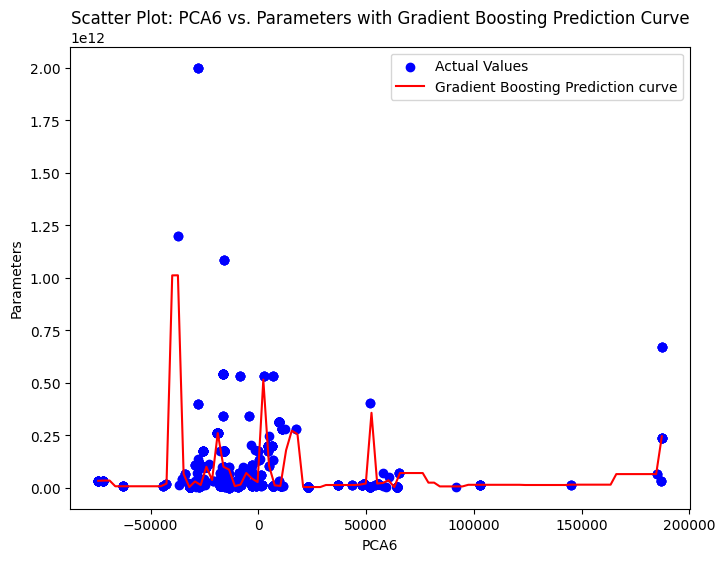

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

PCA0: 0.07301620440635316
PCA1: 0.2267552778876187
PCA2: 0.020650192814531943
PCA3: 0.0020650197638346743
PCA4: 0.03025140955487356
PCA5: 0.00013037324344591925
PCA6: 0.16956332822473402
PCA7: 0.02500794864771872
PCA8: 0.014005657038223098
PCA9: 0.1032053952459131
PCA10: 0.0005546183235700749
PCA11: 0.03232069674583309
PCA12: 0.06122382888823064
PCA13: 0.0019927696103097295
PCA14: 0.2392572796048096

Most influential feature according to permutation importance: PCA14


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


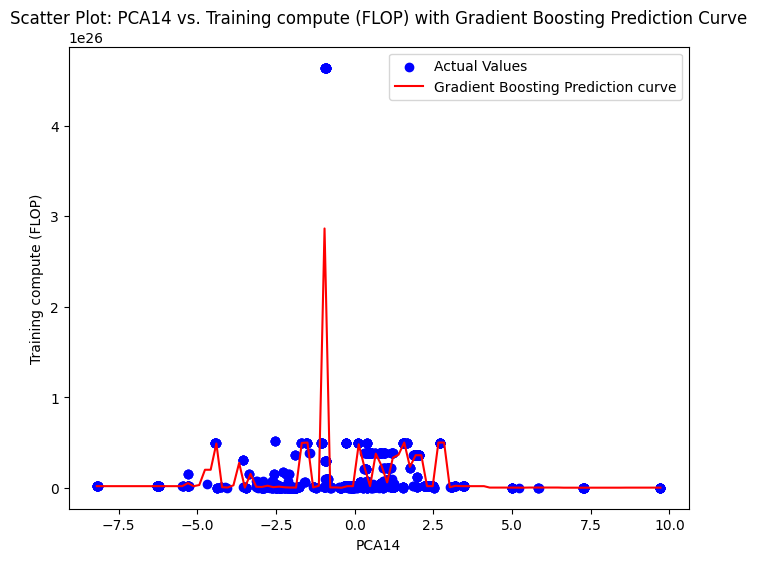

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

PCA0: 3.679386768113073e-14
PCA1: 4.150013649926851e-14
PCA2: 0.02161235698565919
PCA3: 0.013885475716543243
PCA4: 0.000915805022131013
PCA5: 0.005854182910312077
PCA6: 0.019319019503791886
PCA7: 0.8987088650002775
PCA8: 4.1734700931473416e-14
PCA9: 0.011652012602025245
PCA10: 0.004008817046153001
PCA11: 0.006332309917554268
PCA12: 0.007505297479099127
PCA13: 8.851760018752914e-16
PCA14: 0.010205857816332653

Most influential feature according to permutation importance: PCA7


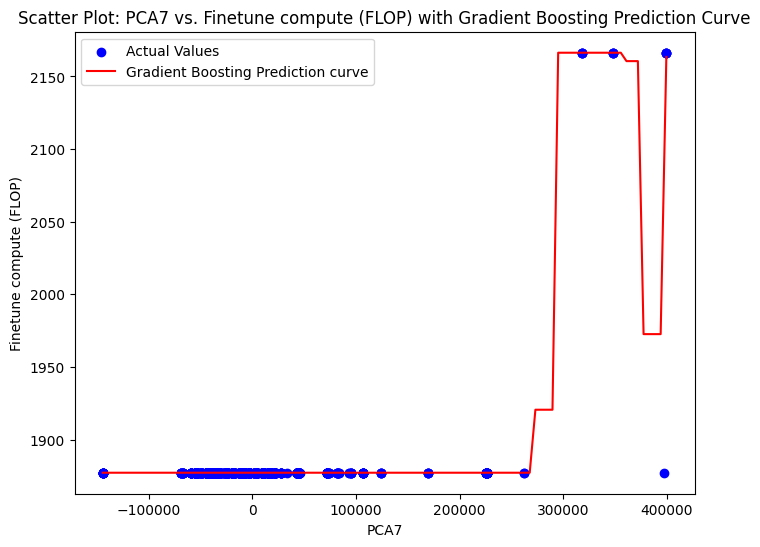

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

PCA0: 0.5897903958362705
PCA1: 0.2927023181524657
PCA2: 0.0036928832003685803
PCA3: 0.0016728925472483112
PCA4: 0.02869628269758604
PCA5: 0.0008330151576844379
PCA6: 0.017628557634998238
PCA7: 0.001439060540020457
PCA8: 0.0012427411636323858
PCA9: 0.01190619433795209
PCA10: 0.007306605491577894
PCA11: 0.01609574739928372
PCA12: 0.02034428854372343
PCA13: 0.001779198569990243
PCA14: 0.0048698187271980515

Most influential feature according to permutation importance: PCA0


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


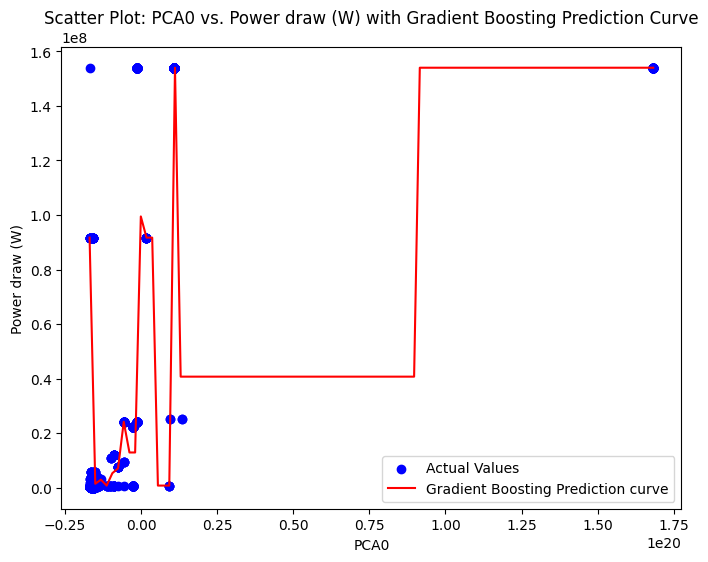

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

PCA0: 0.4871606899368179
PCA1: 0.49902193281586854
PCA2: 3.670492516708141e-05
PCA3: 0.0062064909922895616
PCA4: 5.2231084101305615e-06
PCA5: 0.007430304996923182
PCA6: 1.2991038702423426e-05
PCA7: 3.5296554767317034e-05
PCA8: 2.7023821843768253e-05
PCA9: 6.977610279910424e-06
PCA10: 2.4285806707776977e-05
PCA11: 5.279932089328423e-06
PCA12: 7.080174959281965e-06
PCA13: 1.5465155674404206e-05
PCA14: 4.25312949956221e-06

Most influential feature according to permutation importance: PCA1


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


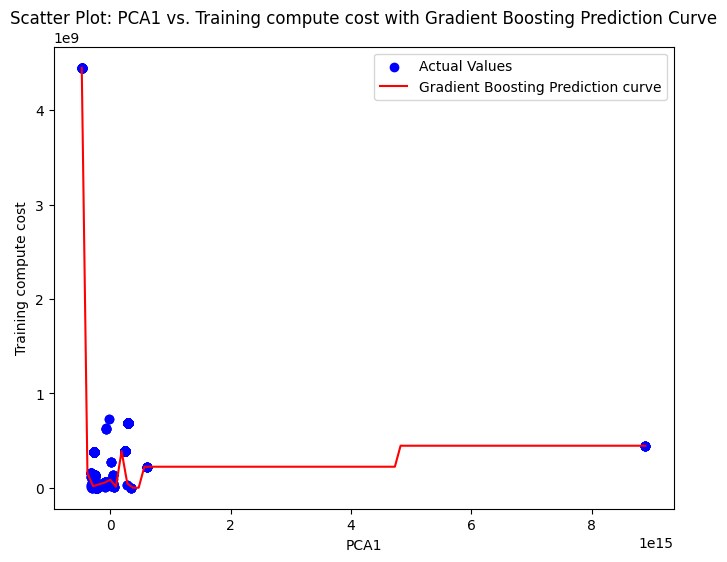

Running Models with Best Parameters:  80%|████████  | 4/5 [00:13<00:03,  3.66s/it]

Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

PCA0: 0.0003399694563246693
PCA1: 0.19253622829968853
PCA2: 0.046815923859173096
PCA3: 0.025700035101111036
PCA4: 0.10691465184075259
PCA5: 0.001416704668412658
PCA6: 0.2662700217939774
PCA7: 0.2369899437049166
PCA8: 0.08289389777259756
PCA9: 0.023772041476879793
PCA10: 0.0005876022902392852
PCA11: 0.002746690193009259
PCA12: 0.0008623765309830877
PCA13: 0.011730643518219529
PCA14: 0.00042326949371497303

Most influential feature according to permutation importance: PCA6


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


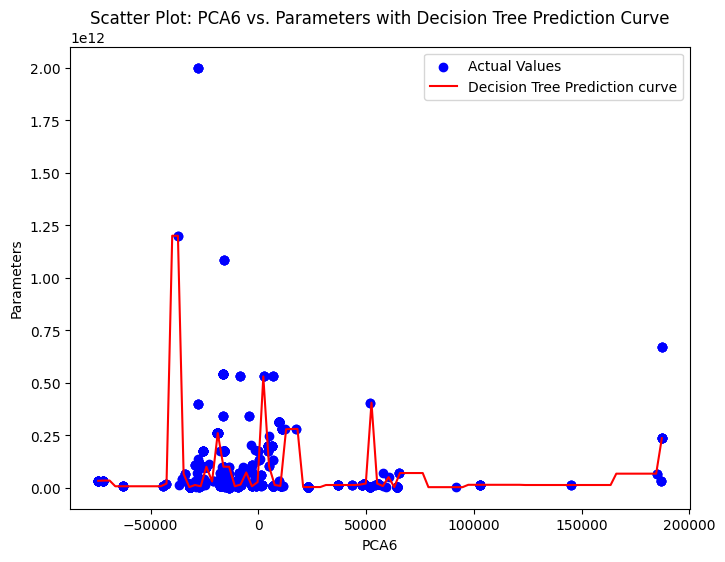

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

PCA0: 0.0019513068551530223
PCA1: 0.30553023354403924
PCA2: 0.0197135341044266
PCA3: 0.00026033866802826344
PCA4: 0.0024347054218058885
PCA5: 3.3766136910703906e-05
PCA6: 0.0725743853885004
PCA7: 0.08005251008955216
PCA8: 6.859811919457981e-06
PCA9: 0.19310185940342006
PCA10: 9.82380817724788e-05
PCA11: 0.005167778273893099
PCA12: 0.05748915350887946
PCA13: 0.0034845916411925
PCA14: 0.2581007390705066

Most influential feature according to permutation importance: PCA1


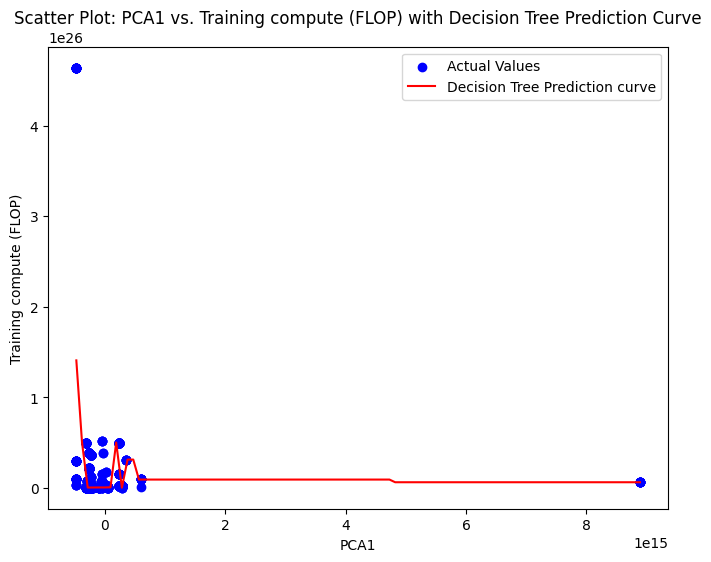

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

PCA0: 0.0
PCA1: 0.0
PCA2: 0.0
PCA3: 0.0
PCA4: 3.738041166621446e-15
PCA5: 0.0
PCA6: 0.0
PCA7: 0.8993357933504138
PCA8: 0.0
PCA9: 0.10066420664956371
PCA10: 0.0
PCA11: 1.8690205833107228e-14
PCA12: 0.0
PCA13: 0.0
PCA14: 0.0

Most influential feature according to permutation importance: PCA7


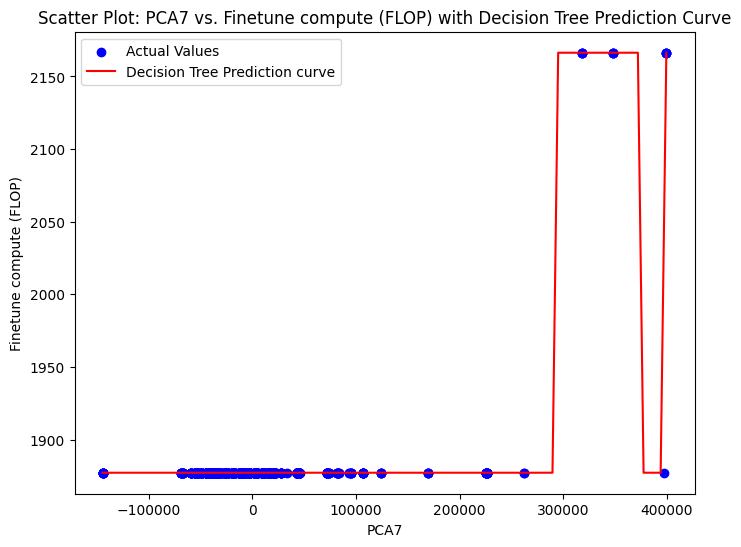

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

PCA0: 0.8396566414182778
PCA1: 0.000608125668110312
PCA2: 0.002724144293451823
PCA3: 1.341024631454165e-08
PCA4: 4.010603707438542e-06
PCA5: 1.404109985601969e-05
PCA6: 4.543693365453039e-05
PCA7: 0.0035342610314604123
PCA8: 0.0037270610509415776
PCA9: 0.008596069456186921
PCA10: 4.3126098982644645e-05
PCA11: 0.13799605122962355
PCA12: 3.909057346043332e-06
PCA13: 1.555910027958264e-05
PCA14: 0.003031549547875009

Most influential feature according to permutation importance: PCA0


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


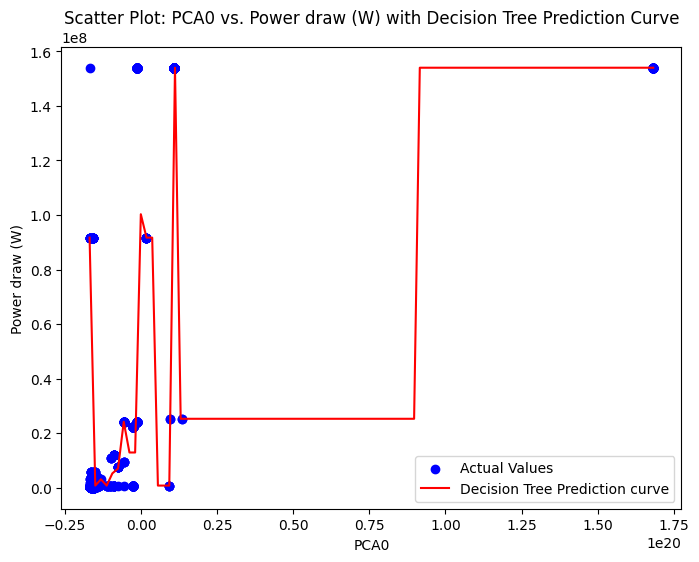

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

PCA0: 0.9997090974762948
PCA1: 2.6836050087443655e-05
PCA2: 0.0001090409999835245
PCA3: 4.058738651201556e-06
PCA4: 1.3173978781841034e-07
PCA5: 8.923994215664197e-06
PCA6: 2.2501616168008538e-07
PCA7: 3.0973329257741395e-05
PCA8: 4.533473057680833e-05
PCA9: 2.5291383036779568e-08
PCA10: 8.021165835446143e-08
PCA11: 1.1136622836235086e-05
PCA12: 4.3132675410854897e-10
PCA13: 5.395735151051776e-05
PCA14: 1.7801626850220347e-07

Most influential feature according to permutation importance: PCA0


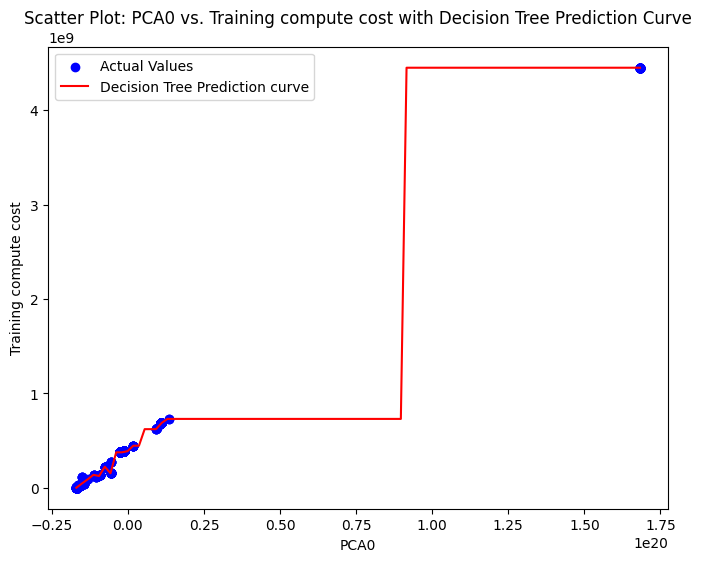

Running Models with Best Parameters: 100%|██████████| 5/5 [00:14<00:00,  2.89s/it]

--------------------------------------------------


In [ ]:
common_params['show_max_feature_graph'] = True
common_params['display_error'] = False
common_params['verbose'] = True
run_models(model_configs,common_params,store_err3)

In [ ]:
output_path_large_models = "/content/drive/MyDrive/DATA 6250/Datasets/ML_Project/Experiment-3.csv"
pca_df = pd.concat([pca_df,df_new[out_cols]],axis=1)
if os.path.exists(output_path_large_models):
    os.remove(output_path_large_models)
path = os.path.dirname(output_path_large_models)
if not os.path.exists(path):
    os.makedirs(path)
pca_df.to_csv(output_path_large_models, index=False)

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:105: RuntimeWarning: overflow encountered in cast
  distances_data = distances_data.astype(np.float32, copy=False)
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:188: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:199: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


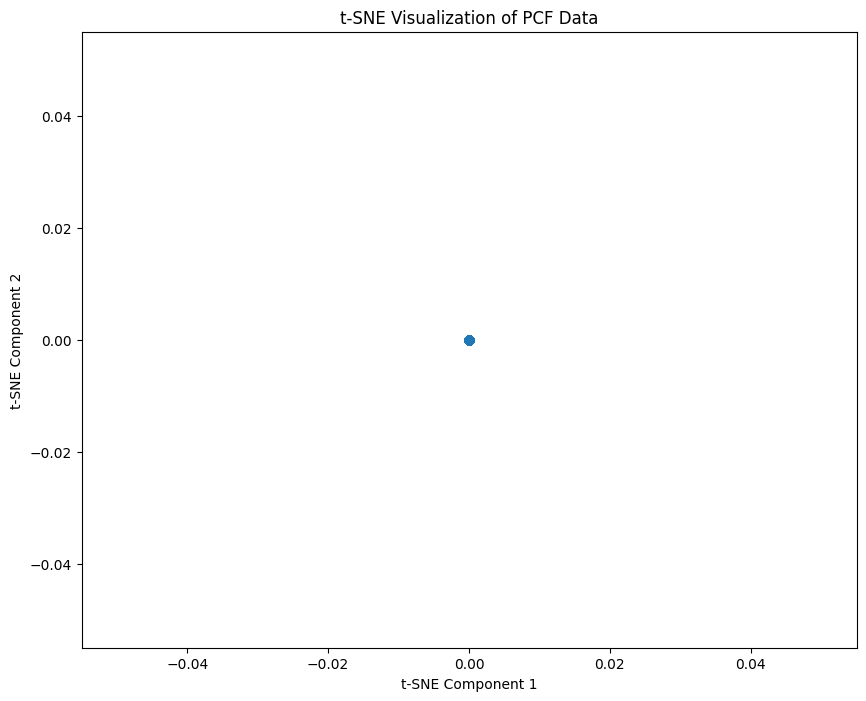

In [ ]:
# prompt: apply t-SNE for visualization of the PCF data

from sklearn.manifold import TSNE

# Assuming X_train_pca is defined from the previous code (PCA-transformed data)

# Apply t-SNE to the PCA-transformed data
tsne = TSNE(n_components=2, random_state=42) # Reduce to 2 dimensions for visualization
X_tsne = tsne.fit_transform(df_new[num_cols])

# Create a scatter plot of the t-SNE results
plt.figure(figsize=(10, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.title('t-SNE Visualization of PCF Data')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()


Due to lack of data, not much info is obtained from PCF

## Experiment 4

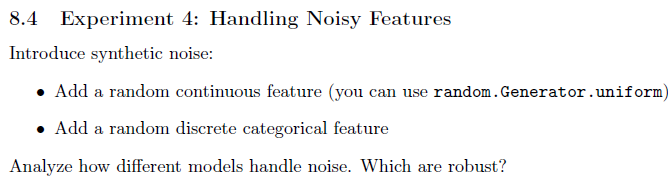

In [ ]:
# prompt: add noise "random.Generator.uniform" feature to df_new, discrete categorical feature to df_new.code for this.sing feature each is enough

import random

# Assuming df_new is defined from the previous code
df_new = df.copy()
df_new = df.drop(columns = high_corr_cols)
df_new = clean_df(df_new)
for col in obj_col:
    df_new = encode_df_column(df_new, col,le)
# Add noise using random.uniform
random.seed(42) # for reproducibility
df_new['noise'] = [random.uniform(0, 1) for _ in range(len(df_new))]

# Add a discrete categorical feature
categories = [i for i in range(20)]
df_new['category'] = random.choices(categories, k=len(df_new))


In [ ]:
num_cols = [col for col in df_new.select_dtypes(include=np.number) if col not in out_cols]

In [ ]:
df_exp4 = df_new.copy()
exp4_cols = num_cols

In [ ]:
df_new = generate_feature_encoding(df_new,'category',n_cluster=20)

Batches:   0%|          | 0/54 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
df_new.columns

Index(['Model', 'Domain', 'Country', 'Organization', 'Date', 'Category',
       'Task', 'Confidence', 'accessibility', 'Training dataset',
       'Training code accessibility', 'Training hardware', 'Notability',
       'text', 'Hardware quantity', 'data size', 'Training time (hours)',
       'Hardware unit Release Price (USD)', 'Hardware unit TDP (W)',
       'Hardware unit Compute FLOPS', 'Hardware unit Compute OPS',
       'Hardware unit Memory Size (bytes)', 'Epochs', 'Batch size',
       'Hardware utilization', 'Parameters', 'Training compute (FLOP)',
       'Finetune compute (FLOP)', 'Power draw (W)', 'Training compute cost',
       'Domain_encoded', 'Country_encoded', 'Organization_encoded',
       'Date_encoded', 'Category_encoded', 'Task_encoded',
       'Confidence_encoded', 'accessibility_encoded',
       'Training dataset_encoded', 'Training code accessibility_encoded',
       'Training hardware_encoded', 'Notability_encoded', 'Expected power (W)',
       'Training Energy', 

In [ ]:
output_path_large_models = "/content/drive/MyDrive/DATA 6250/Datasets/ML_Project/Experiment-4.csv"
if os.path.exists(output_path_large_models):
    os.remove(output_path_large_models)
path = os.path.dirname(output_path_large_models)
if not os.path.exists(path):
    os.makedirs(path)
df_new.to_csv(output_path_large_models, index=False)

In [ ]:
num_cols = [col for col in df_new.select_dtypes(include=np.number).columns if col not in out_cols]
obj_cols = [col for col in df_new.select_dtypes(include=['object']).columns]

In [ ]:
Apply_Grid_Search(df_new,num_cols,out_cols,results)

Hyperparameter Tuning: 100%|██████████| 7/7 [07:58<00:00, 68.42s/it]

Model: SVR
Best parameters: {'svr__C': 10, 'svr__gamma': 'scale', 'svr__kernel': 'linear'}
Best R-squared score: -0.15355696587287482
--------------------
Model: Gradient Boosting
Best parameters: {'learning_rate': 0.06, 'max_depth': 5, 'n_estimators': 200}
Best R-squared score: 0.9476606282941604
--------------------
Model: Random Forest
Best parameters: {'max_depth': None, 'min_samples_split': 3, 'n_estimators': 20}
Best R-squared score: 0.9092772117369853
--------------------
Model: Decision Tree
Best parameters: {'max_depth': 19, 'min_samples_leaf': 1, 'min_samples_split': 4}
Best R-squared score: 0.9285199771661867
--------------------
Model: Linear Regression
Best parameters: None (default parameters)
Best R-squared score: 0.20689245834921666
--------------------
Model: Ridge
Best parameters: {'ridge__alpha': 1000}
Best R-squared score: 0.23473634967232174
--------------------
Model: Lasso
Best parameters: {'lasso__alpha': 1000}
Best R-squared score: 0.2068924699756111
----------

In [ ]:
model_configs,common_params = get_model_config(df_new,num_cols,out_cols,results)

In [ ]:
common_params['show_max_feature_graph'] = False
common_params['display_error'] = True
common_params['verbose'] = True
store_err4={}
run_models(model_configs,common_params,store_err4)

Running Models with Best Parameters:   0%|          | 0/5 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.0973e-23): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/d

Linear Regression (Linear)
Showing Errors for Parameters
The Mean_Absolute_Error Error is: 55254080125.420044
The Mean_Squared_Error Error is: 1.5755073445675504e+22
The Root_Mean_Squared_Error Error is: 125519215443.99289
The Median_Absolute_Error Error is: 30097596847.74324
The Mean_Absolute_Percentage_Error Error is: 4.290322939348978
The Mean_Squared_Log_Error Error is: 95.60441626628192
The R2 Error is: 0.31290282340007547
The Explained_Variance Error is: 0.3132114906453227
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.6636182847988953
The Root_Relative_Squared_Error Error is: 0.8289132503464548
The Adjusted_R2 Error is: 0.2630503468644343

--------------------------------------------------
Linear Regression (Linear)
Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 1.659526271619742e+25
The Mean_Squared_Error Error is: 1.1622254780542769e+51
The Root_Mean_Squared_Error Error is: 3.409142821963135e+25
The Median_Absolute_Error 

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.773e+19, tolerance: 7.793e+16
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  20%|██        | 1/5 [00:00<00:01,  3.95it/s]

Linear Regression (Lasso)
Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 211791365.17268303
The Mean_Squared_Error Error is: 1.0330932119956778e+17
The Root_Mean_Squared_Error Error is: 321417674.06222045
The Median_Absolute_Error Error is: 117524520.73707819
The Mean_Absolute_Percentage_Error Error is: 26.73532053548719
The Mean_Squared_Log_Error Error is: 77.10094417942645
The R2 Error is: 0.8654565691714016
The Explained_Variance Error is: 0.8663038431889
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.46832427386185055
The Root_Relative_Squared_Error Error is: 0.3668016232633089
The Adjusted_R2 Error is: 0.8556947429598629

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 61727766413.22215
The Mean_Squared_Error Error is: 2.6233617706449807e+22
The Root_Mean_Squared_Error Error is: 161967952714.2632
The Media

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 1.1006307615964163e+25
The Mean_Squared_Error Error is: 1.5525765351153307e+51
The Root_Mean_Squared_Error Error is: 3.940274781173682e+25
The Median_Absolute_Error Error is: 1.410001e+24
The Mean_Absolute_Percentage_Error Error is: 2.109609345540536
The Mean_Squared_Log_Error Error is: 3.22560939335232
The R2 Error is: -0.06837742012190229
The Explained_Variance Error is: 3.3306690738754696e-16
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.6813356087618396
The Root_Relative_Squared_Error Error is: 1.0336234421305963
The Adjusted_R2 Error is: -0.14589376290677225

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error is: 2.584461674719914
The Mean_Squared_Error Error is: 725.4433789855075
The Root_Mean_

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  40%|████      | 2/5 [00:00<00:01,  2.35it/s]

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 431902560.3089145
The Mean_Squared_Error Error is: 7.705606282393252e+17
The Root_Mean_Squared_Error Error is: 877815828.2004974
The Median_Absolute_Error Error is: 333241548.0625458
The Mean_Absolute_Percentage_Error Error is: 32.47154804190869
The Mean_Squared_Log_Error Error is: 7.146737449184932
The R2 Error is: -0.003528717263440173
The Explained_Variance Error is: 8.861744815735761e-08
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.9550457959927983
The Root_Relative_Squared_Error Error is: 1.001762804891178
The Adjusted_R2 Error is: -0.0763399491153618

--------------------------------------------------
Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 10393580304.940426
The Mean_Squared_Error Error is: 4.14584099

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 3.432593436544044e+23
The Mean_Squared_Error Error is: 5.380796736600146e+47
The Root_Mean_Squared_Error Error is: 7.335391425547886e+23
The Median_Absolute_Error Error is: 1.1127997055216399e+23
The Mean_Absolute_Percentage_Error Error is: 0.5462780651000666
The Mean_Squared_Log_Error Error is: 102.19853680129724
The R2 Error is: 0.9996297302190502
The Explained_Variance Error is: 0.999632455670831
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.021249162028938572
The Root_Relative_Squared_Error Error is: 0.019242395405712348
The Adjusted_R2 Error is: 0.9996028652191706

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error is: 0.21258733728546303
The Mean_Squared_Error Error is: 7.700208651303874
The Root_Mean_Squared_Error Error is: 2.7749249812028927
The Median_Absolute_Error Error is: 5.067386382506811e-05
The Mean_Absolute_Percentage_Error Error is: 9.81374111959337e-05
The Mean_Squared_Log_Error Error is: 1.667155948326871e-06
The R2 Error is: 0.9894375801666059
The Explained_Variance Error is: 0.9894995136028619
The Log_Cosh_Error Error is: 0.20844944337780102
The Relative_Absolute_Error Error is: 0.042157346207141316
The Root_Relative_Squared_Error Error is: 0.10277363394078341
The Adjusted_R2 Error is: 0.9886712216297981

--------------------------------------------------
Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Power draw (W)
The Mean_Absolute_Error E

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  60%|██████    | 3/5 [00:02<00:01,  1.03it/s]

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 5027786.165256437
The Mean_Squared_Error Error is: 95733326231956.12
The Root_Mean_Squared_Error Error is: 9784340.868548894
The Median_Absolute_Error Error is: 1421653.8948342204
The Mean_Absolute_Percentage_Error Error is: 0.28113387971495013
The Mean_Squared_Log_Error Error is: 3.66641660723894
The R2 Error is: 0.9998753230588845
The Explained_Variance Error is: 0.9998757732395589
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.011117706819900517
The Root_Relative_Squared_Error Error is: 0.011165882908014953
The Adjusted_R2 Error is: 0.9998662770978571

--------------------------------------------------
Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 3387920710.9477553
The M

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Training compute (FLOP)
The Mean_Absolute_Error Error is: 5.8213103187052724e+22
The Mean_Squared_Error Error is: 7.855160305394746e+46
The Root_Mean_Squared_Error Error is: 2.8027058899204436e+23
The Median_Absolute_Error Error is: 51539607552.0
The Mean_Absolute_Percentage_Error Error is: 0.08767348882405415
The Mean_Squared_Log_Error Error is: 0.042031545891826456
The R2 Error is: 0.999945946137199
The Explained_Variance Error is: 0.999946171469949
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.0036036299803521225
The Root_Relative_Squared_Error Error is: 0.007352133214314457
The Adjusted_R2 Error is: 0.9999420242480999

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Finetune compute (FLOP)
The Mean_Absolute_Error Error is: 0.4917887048458319
The Mean_Squared_Error Error is: 18.92660820103349
The Root_Mean_Squared_Error Error is: 4.350472181388302
The Median_Absolute_Error Error is: 1.1141310096718371e-11
The Mean_Absolute_Percentage_Error Error is: 0.0002505303693470949
The Mean_Squared_Log_Error Error is: 5.003882718866174e-06
The R2 Error is: 0.9740382642998089
The Explained_Variance Error is: 0.9740777120315592
The Log_Cosh_Error Error is: 0.4775689239871502
The Relative_Absolute_Error Error is: 0.09752465483448663
The Root_Relative_Squared_Error Error is: 0.16112645872168588
The Adjusted_R2 Error is: 0.9721546052426973

--------------------------------------------------
Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Power draw (W)
The Mean_Absolute_Error Err

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running Models with Best Parameters:  80%|████████  | 4/5 [00:05<00:01,  1.69s/it]/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeW

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Showing Errors for Training compute cost
The Mean_Absolute_Error Error is: 1056910.1523912838
The Mean_Squared_Error Error is: 53052902518213.734
The Root_Mean_Squared_Error Error is: 7283742.342931533
The Median_Absolute_Error Error is: 2.2351741790771484e-08
The Mean_Absolute_Percentage_Error Error is: 0.03421252535766239
The Mean_Squared_Log_Error Error is: 0.017757237758781654
The R2 Error is: 0.9999309073040329
The Explained_Variance Error is: 0.9999311262247924
The Log_Cosh_Error Error is: inf
The Relative_Absolute_Error Error is: 0.0023370956566255143
The Root_Relative_Squared_Error Error is: 0.00831220163176775
The Adjusted_R2 Error is: 0.9999258942693098

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Showing Errors for Parameters
The Mean_Absolute_Error Error is: 1773909

Running Models with Best Parameters:   0%|          | 0/5 [00:00<?, ?it/s]

Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 835744.9005434382
data size: 0.08929858761363008
Training time (hours): 10214024.189349035
Hardware unit Memory Size (bytes): 0.5208920519801626
Epochs: 56168641115.66116
Batch size: -18496.091228158013
Hardware utilization: 287744258835.2164
Model_encoded: -521857035.063402
Domain_encoded: -1646081324.3626068
Country_encoded: -4726763465.316623
Organization_encoded: 76867087.64820923
Date_encoded: 196042768.72841442
Category_encoded: 2704762084.083293
Task_encoded: -125002880.66611834
Confidence_encoded: -9370604006.364307
accessibility_encoded: 8727391756.346207
Training dataset_encoded: -531669997.25698656
Training code accessibility_encoded: -2682214952.4148316
Training hardware_encoded: 2224132921.8330884
Notability_encoded: -9431809647.211042
text_encoded: 53205233.66314074
noise: 15557220473.059227
category: 319961730.25344044
The main feature is Hardware utilization


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


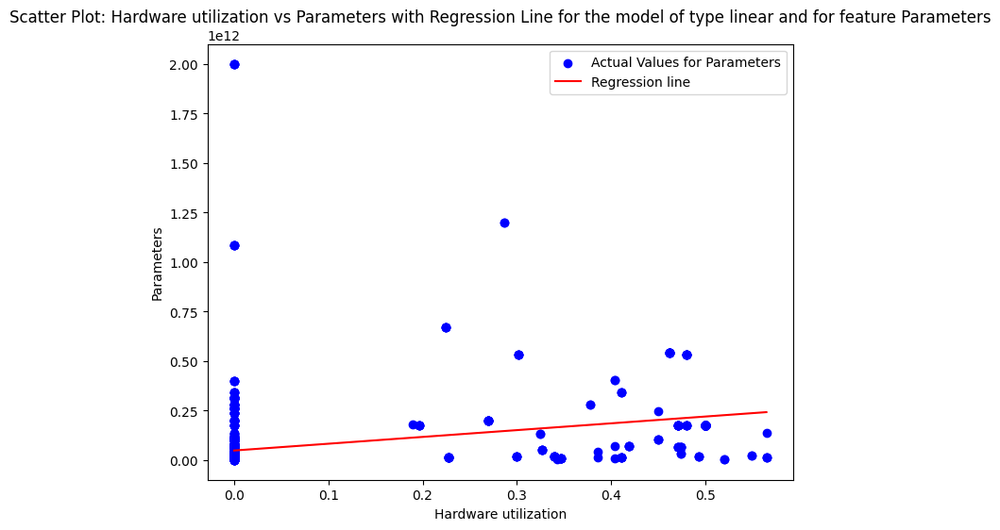

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 9.949154626700281e+20
data size: 7021803952781.0
Training time (hours): 4.933357826780988e+21
Hardware unit Memory Size (bytes): 406545035891086.44
Epochs: 7.470298762975692e+24
Batch size: -2.107749937545084e+17
Hardware utilization: -5.853166729094989e+24
Model_encoded: 2.6645526941262825e+23
Domain_encoded: 2.851078794945139e+23
Country_encoded: 5.201957843229288e+23
Organization_encoded: 3.650144580193098e+23
Date_encoded: 1.5920753285813262e+23
Category_encoded: -1.4693649602385542e+24
Task_encoded: -2.8664106355086596e+22
Confidence_encoded: -1.4404661639236663e+25
accessibility_encoded: -1.356458170320579e+24
Training dataset_encoded: -1.2589624028084789e+23
Training code accessibility_encoded: -3.059847368836983e+24
Training hardware_encoded: 7.734188066504637e+23
Notability_encoded: 2.0903563959207203e+23
text_encoded: -2.6122840632787015e+

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


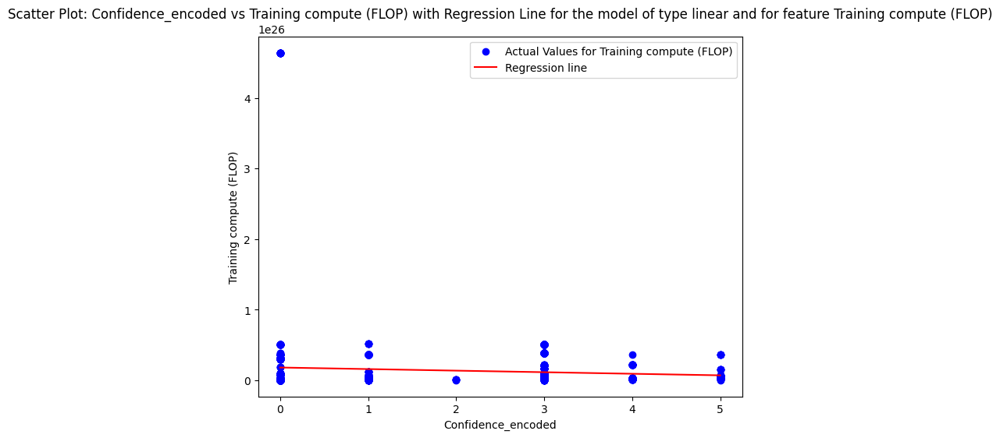

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 0.0003339355133551841
data size: -7.665486467179893e-11
Training time (hours): -0.014094183910056129
Hardware unit Memory Size (bytes): 5.42946020868453e-10
Epochs: -2.7147191819974297
Batch size: -1.0585891197846303e-06
Hardware utilization: 72.48826082392391
Model_encoded: -0.07698051268704727
Domain_encoded: -0.3076047711583496
Country_encoded: -0.9919261224592639
Organization_encoded: 0.09287422560688026
Date_encoded: 0.09179031056572375
Category_encoded: -6.1359092511886
Task_encoded: -0.03375821559288553
Confidence_encoded: 3.9421311488654363
accessibility_encoded: 2.2432005635366155
Training dataset_encoded: -0.11975869962882787
Training code accessibility_encoded: 1.17489427893486
Training hardware_encoded: -0.4949727242633162
Notability_encoded: 0.8740197550084323
text_encoded: 0.0043514062045359216
noise: -2.5014305046701906
category: 0.10

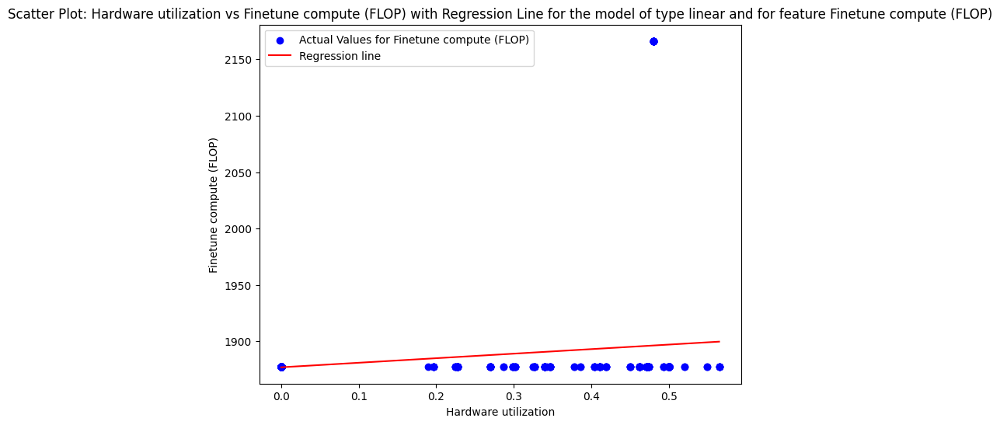

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 1626.2691513985446
data size: 0.00010075589793399117
Training time (hours): -3292.15459998788
Hardware unit Memory Size (bytes): -0.00022712004965041207
Epochs: 3005280.970250108
Batch size: 2.8674206671234366
Hardware utilization: 38135542.9240293
Model_encoded: -267292.16899804573
Domain_encoded: -407604.3766702844
Country_encoded: -1840829.1344737308
Organization_encoded: -248985.5070965174
Date_encoded: 382763.6561264536
Category_encoded: -5153769.586497257
Task_encoded: 229156.33740416035
Confidence_encoded: 8561321.709408857
accessibility_encoded: -767888.087681005
Training dataset_encoded: -855236.3812463313
Training code accessibility_encoded: 5826504.165730957
Training hardware_encoded: -1500115.7414575845
Notability_encoded: 1675904.9877259454
text_encoded: 31362.618503676174
noise: 389592.6383042415
category: -163050.9426300984
The main f

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


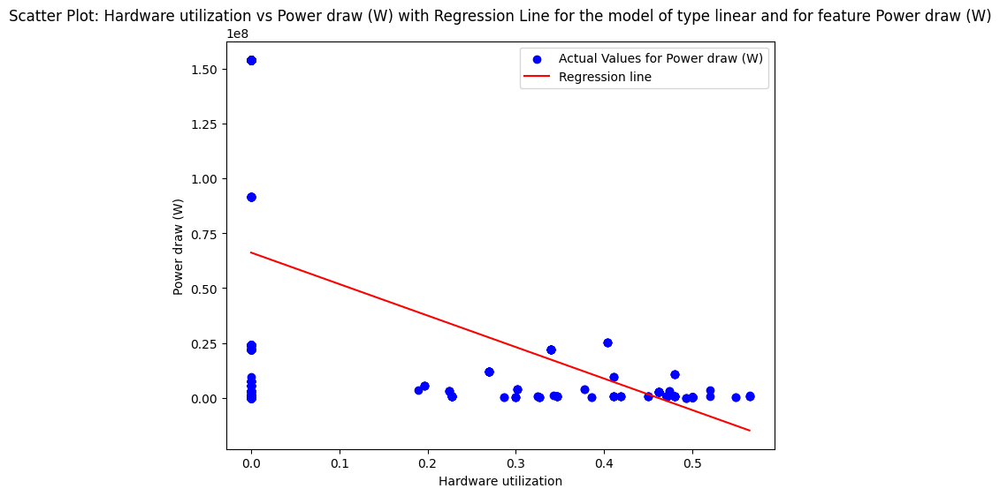

--------------------------------------------------
Linear Regression (Linear)
Regression Coefficients for each feature:
Hardware quantity: 28554.70606526659
data size: -3.357699849586282e-05
Training time (hours): -3724.108100879589
Hardware unit Memory Size (bytes): 0.019993737381832823
Epochs: 157661175.55929795
Batch size: 13.28448329208888
Hardware utilization: 214105522.88151774
Model_encoded: -1539502.2307055974
Domain_encoded: -6060681.002836936
Country_encoded: -3868897.562946772
Organization_encoded: 7103240.858545308
Date_encoded: 2201479.1868518475
Category_encoded: 1509540.0365073623
Task_encoded: -746924.1554836074
Confidence_encoded: -109394482.19427916
accessibility_encoded: 27621766.54211932
Training dataset_encoded: -2960104.562644661
Training code accessibility_encoded: 19237251.77147539
Training hardware_encoded: 39324152.03727088
Notability_encoded: -59440452.76100552
text_encoded: 200827.85015646042
noise: 12438917.959809506
category: 544027.0281247162
The main fea

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


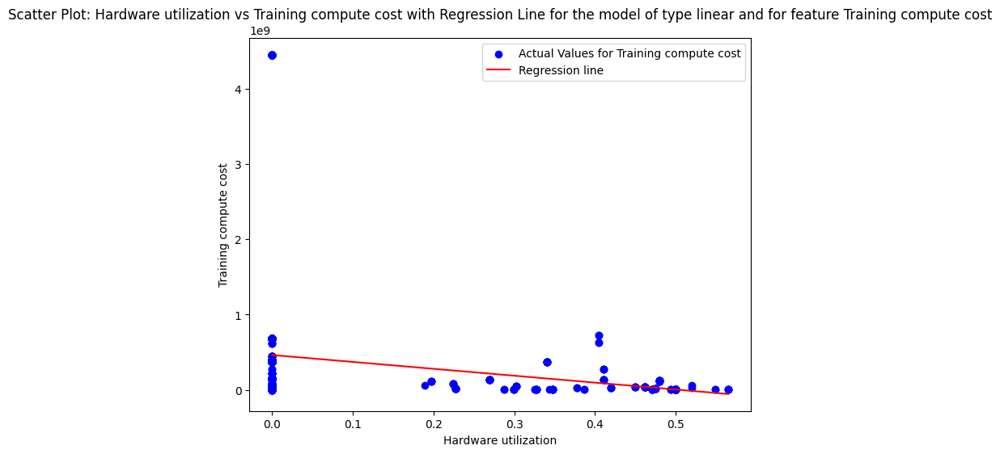

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 833085.3451069036
data size: 0.11754973624603526
Training time (hours): 10436553.636012692
Hardware unit Memory Size (bytes): 0.4998454181977898
Epochs: 55600131778.74562
Batch size: -18285.536068641388
Hardware utilization: 267056128369.8883
Model_encoded: -515360147.44529253
Domain_encoded: -1629419403.80825
Country_encoded: -4594961928.399237
Organization_encoded: 68941244.06461
Date_encoded: 171294452.20396873
Category_encoded: 2865605715.768544
Task_encoded: -120344392.31856526
Confidence_encoded: -9494923363.181108
accessibility_encoded: 8946013296.224957
Training dataset_encoded: -628338391.822588
Training code accessibility_encoded: -2451468245.4187927
Training hardware_encoded: 2333736603.439235
Notability_encoded: -10100914203.8628
text_encoded: 53002461.99076982
noise: 15346768400.708076
category: 334268182.5821387
The main feature is Hard

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.0973e-23): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


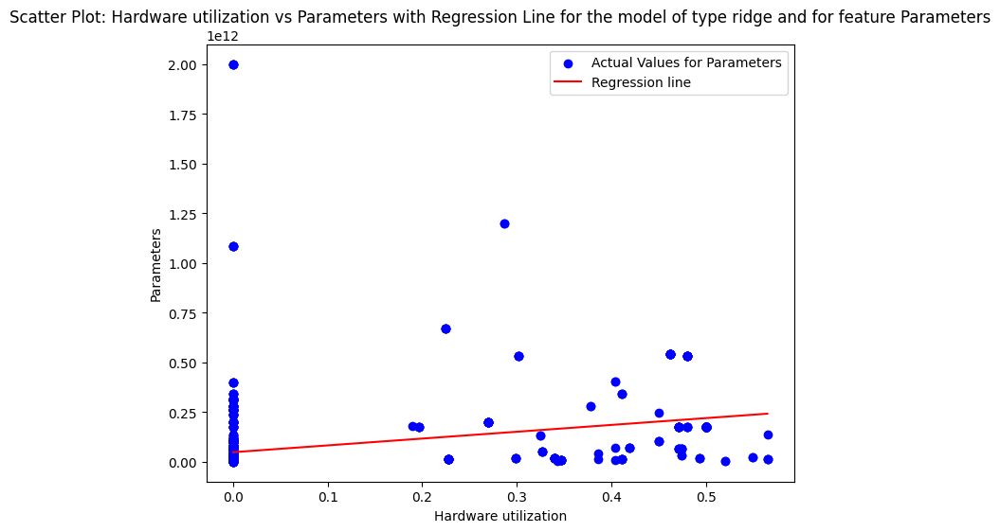

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 9.950450712311396e+20
data size: 6414754125912.948
Training time (hours): 4.92416211135976e+21
Hardware unit Memory Size (bytes): 407563228174655.8
Epochs: 7.466468727335237e+24
Batch size: -2.1289994030763546e+17
Hardware utilization: -5.443773404030025e+24
Model_encoded: 2.6612263340881098e+23
Domain_encoded: 2.8403526929061338e+23
Country_encoded: 5.1784694382828436e+23
Organization_encoded: 3.6542343460358556e+23
Date_encoded: 1.5933809871452355e+23
Category_encoded: -1.4650638882034952e+24
Task_encoded: -2.880776449914822e+22
Confidence_encoded: -1.4387669238231209e+25
accessibility_encoded: -1.3553857157460305e+24
Training dataset_encoded: -1.2403960226620223e+23
Training code accessibility_encoded: -3.064566490418757e+24
Training hardware_encoded: 7.732192552260303e+23
Notability_encoded: 2.2695969219405744e+23
text_encoded: -2.609876098819563

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.0973e-23): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


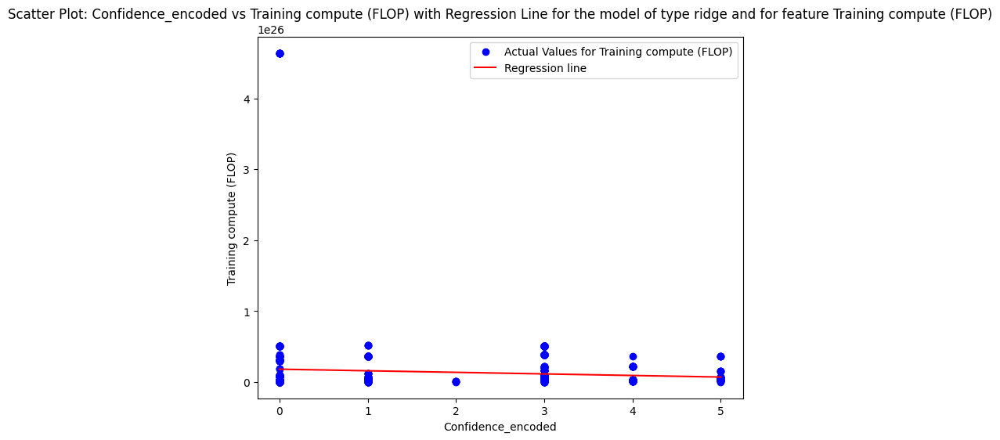

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 0.00033298414291158706
data size: -6.945591640944733e-11
Training time (hours): -0.014039060746512982
Hardware unit Memory Size (bytes): 5.366436286663389e-10
Epochs: -2.8305240592475274
Batch size: -1.0062811369605101e-06
Hardware utilization: 67.2923809787547
Model_encoded: -0.0752655696988011
Domain_encoded: -0.30280608081089216
Country_encoded: -0.9609266649669197
Organization_encoded: 0.0907128449662725
Date_encoded: 0.08602175027975204
Category_encoded: -6.076556083113354
Task_encoded: -0.03260433567780948
Confidence_encoded: 3.9025776211591485
accessibility_encoded: 2.296821140889873
Training dataset_encoded: -0.14372192195676023
Training code accessibility_encoded: 1.235828806589935
Training hardware_encoded: -0.4706015087134865
Notability_encoded: 0.6971249911114834
text_encoded: 0.004284653531166719
noise: -2.493977340370394
category: 0.105

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.0973e-23): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


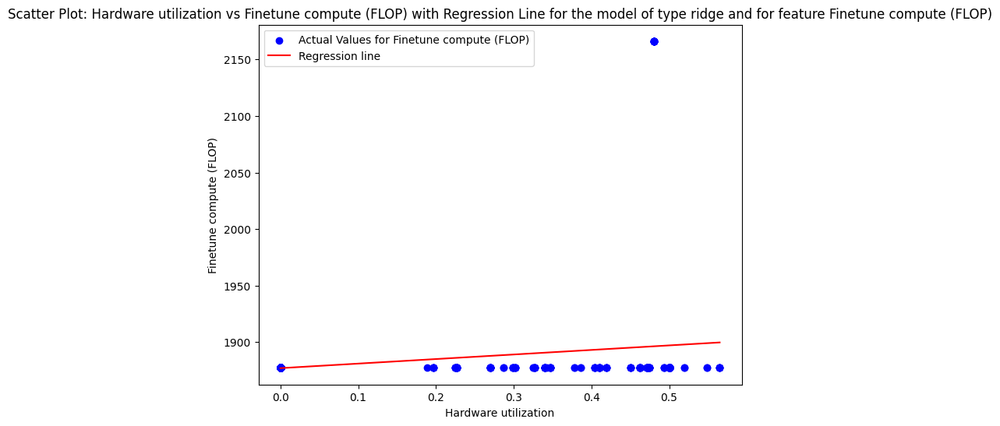

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 1625.972617020024
data size: 0.00010452751613732056
Training time (hours): -3265.3302212161093
Hardware unit Memory Size (bytes): -0.00023005558880065895
Epochs: 2937273.1747838086
Batch size: 2.8942990567874793
Hardware utilization: 35389217.20081541
Model_encoded: -266326.18941948673
Domain_encoded: -404907.1459403721
Country_encoded: -1823827.3015212247
Organization_encoded: -250073.52609795547
Date_encoded: 379705.6778933849
Category_encoded: -5116510.355845947
Task_encoded: 229808.3357131427
Confidence_encoded: 8536605.217249058
accessibility_encoded: -740648.3222915953
Training dataset_encoded: -867807.4270176591
Training code accessibility_encoded: 5854884.608335509
Training hardware_encoded: -1486839.9827784547
Notability_encoded: 1582289.2978939817
text_encoded: 31321.348808094615
noise: 377274.7240024245
category: -161333.39539339356
The ma

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.0973e-23): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


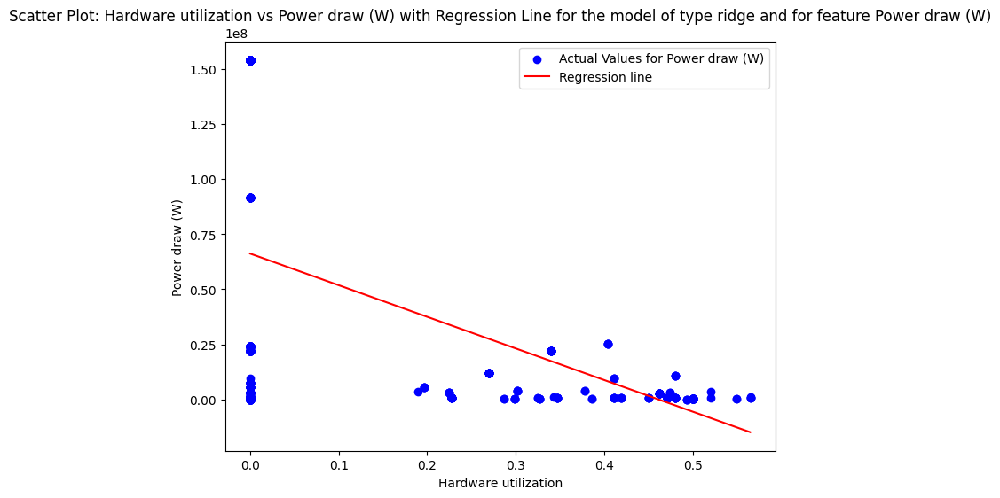

--------------------------------------------------
Linear Regression (Ridge)
Regression Coefficients for each feature:
Hardware quantity: 28554.59147160516
data size: -1.3824644697467778e-05
Training time (hours): -3566.5603650728685
Hardware unit Memory Size (bytes): 0.019988028537298377
Epochs: 157029989.34853315
Batch size: 13.446063387673691
Hardware utilization: 198743527.48748553
Model_encoded: -1536640.8224654582
Domain_encoded: -6055084.3500949275
Country_encoded: -3759488.0168314804
Organization_encoded: 7099570.836386029
Date_encoded: 2178478.227733881
Category_encoded: 1661979.7626311616
Task_encoded: -744030.7548002353
Confidence_encoded: -109381530.01788257
accessibility_encoded: 27806239.237223256
Training dataset_encoded: -3034452.2897564718
Training code accessibility_encoded: 19369887.47040831
Training hardware_encoded: 39427335.52461249
Notability_encoded: -59822233.56746311
text_encoded: 200888.07290099657
noise: 12256451.866331343
category: 555878.7817969818
The mai

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=6.0973e-23): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


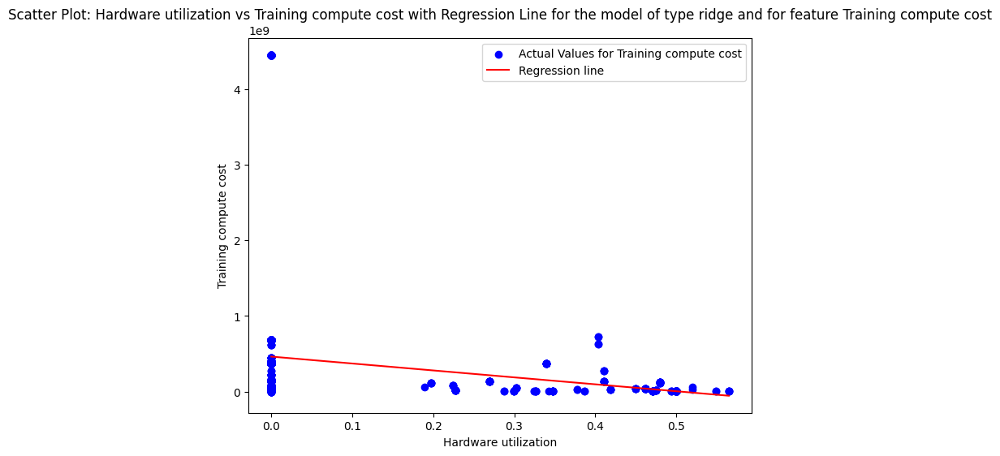

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 835744.9004567182
data size: 0.08929858947341092
Training time (hours): 10214024.19536979
Hardware unit Memory Size (bytes): 0.5208920519455593
Epochs: 56168641110.927025
Batch size: -18496.091227129884
Hardware utilization: 287744258732.22864
Model_encoded: -521857035.0267076
Domain_encoded: -1646081324.1888614
Country_encoded: -4726763464.371236
Organization_encoded: 76867087.60881801
Date_encoded: 196042768.55923378
Category_encoded: 2704762080.6754436
Task_encoded: -125002880.63441014
Confidence_encoded: -9370604006.115156
accessibility_encoded: 8727391757.231234
Training dataset_encoded: -531669997.8118032
Training code accessibility_encoded: -2682214951.0980864
Training hardware_encoded: 2224132922.638059
Notability_encoded: -9431809648.878345
text_encoded: 53205233.66354346
noise: 15557220460.186176
category: 319961730.3373896
The main feature

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.200e+25, tolerance: 3.388e+21
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


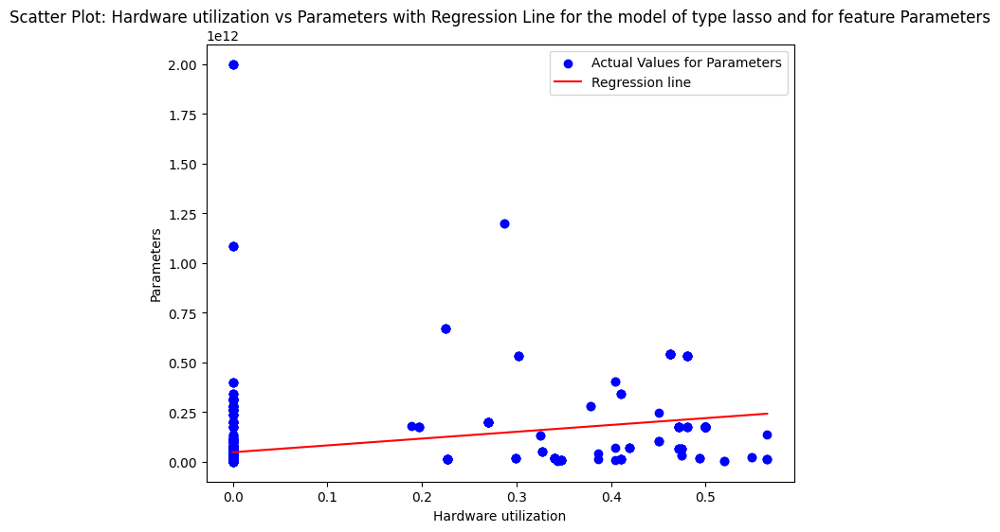

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.749e+53, tolerance: 2.987e+50
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 9.94915462643491e+20
data size: 7021804624081.537
Training time (hours): 4.933357828599201e+21
Hardware unit Memory Size (bytes): 406545035914844.75
Epochs: 7.470298762975724e+24
Batch size: -2.1077499375329485e+17
Hardware utilization: -5.853166729094736e+24
Model_encoded: 2.664552694126355e+23
Domain_encoded: 2.8510787949450474e+23
Country_encoded: 5.201957843229216e+23
Organization_encoded: 3.650144580193099e+23
Date_encoded: 1.592075328581362e+23
Category_encoded: -1.4693649602385757e+24
Task_encoded: -2.8664106355086013e+22
Confidence_encoded: -1.4404661639236678e+25
accessibility_encoded: -1.356458170320583e+24
Training dataset_encoded: -1.258962402808573e+23
Training code accessibility_encoded: -3.059847368836999e+24
Training hardware_encoded: 7.734188066504703e+23
Notability_encoded: 2.0903563959208643e+23
text_encoded: -2.6122840632788517e+22
noise: 1.8829989785545868e+24
category: 2.1684205

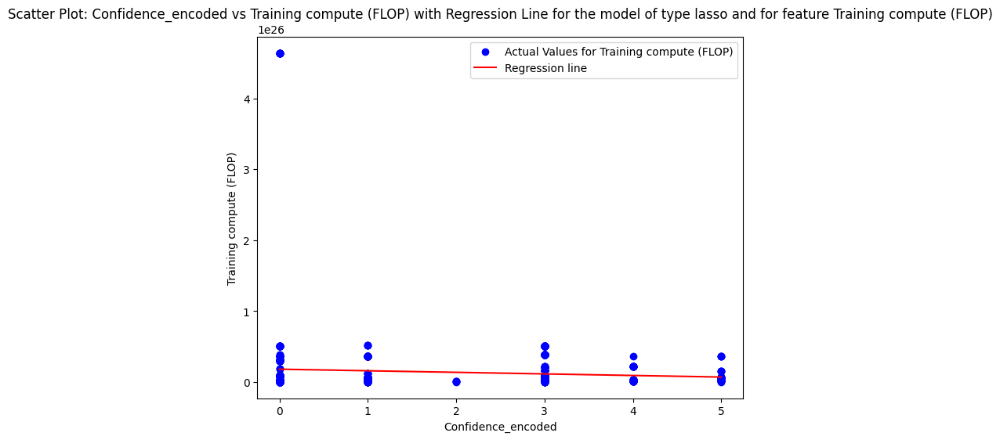

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 0.00030164334698371204
data size: 1.0059619520758269e-11
Training time (hours): -0.012511516579701712
Hardware unit Memory Size (bytes): 3.6520764652361104e-10
Epochs: -3.163815584977367
Batch size: -7.564535161636046e-07
Hardware utilization: 0.0
Model_encoded: -0.02748174502949997
Domain_encoded: -0.014715732026165466
Country_encoded: -0.5458010121320002
Organization_encoded: 0.04893084840073811
Date_encoded: 0.019681881091155245
Category_encoded: -1.6107574657006052
Task_encoded: -0.005906054770865289
Confidence_encoded: 1.9946092978828018
accessibility_encoded: 2.179971567769944
Training dataset_encoded: -0.44330312139074385
Training code accessibility_encoded: 1.21580976282041
Training hardware_encoded: -0.20870285605492714
Notability_encoded: -0.20619535713731127
text_encoded: 0.001043405801242021
noise: -0.0
category: 0.0811130264387481
The ma

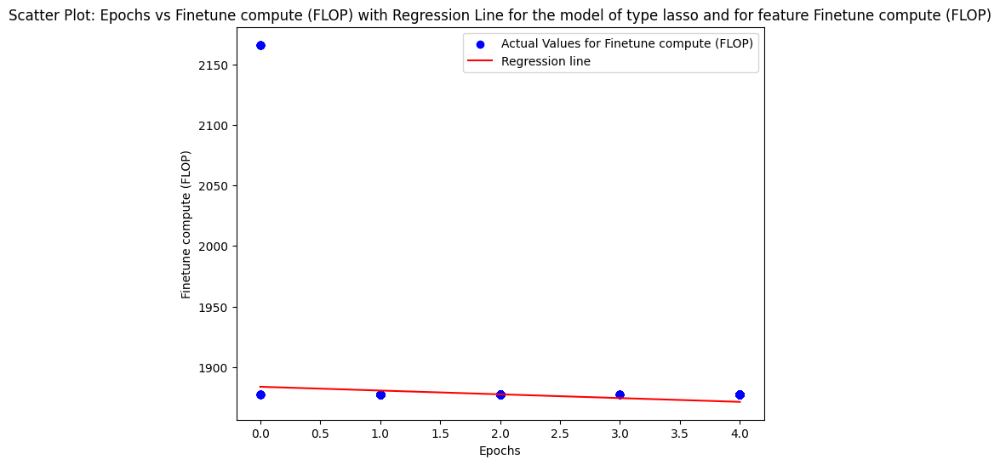

--------------------------------------------------
Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 1626.2691951281843
data size: 0.00010075605281629467
Training time (hours): -3292.155175087829
Hardware unit Memory Size (bytes): -0.00022712009356115693
Epochs: 3005276.112132252
Batch size: 2.8674218386764014
Hardware utilization: 38135428.926618285
Model_encoded: -267292.10226232524
Domain_encoded: -407604.04718214396
Country_encoded: -1840828.2982898413
Organization_encoded: -248985.51675989263
Date_encoded: 382763.5266250056
Category_encoded: -5153764.411676363
Task_encoded: 229156.37283988623
Confidence_encoded: 8561320.573754773
accessibility_encoded: -767886.5387690105
Training dataset_encoded: -855236.8167120387
Training code accessibility_encoded: 5826504.415474016
Training hardware_encoded: -1500114.956081973
Notability_encoded: 1675900.1371687255
text_encoded: 31362.6141473624
noise: 389579.3702274991
category: -163050.85284302742
The mai

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


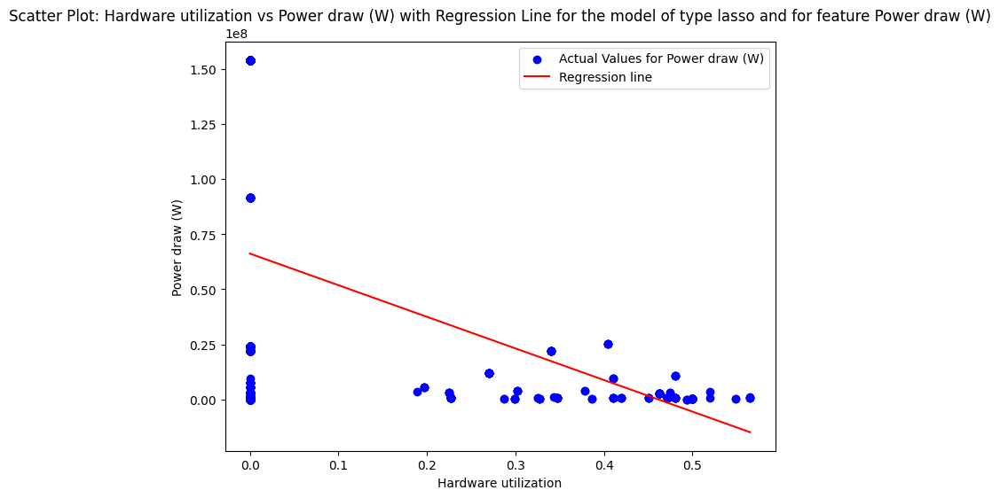

--------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.773e+19, tolerance: 7.793e+16
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Linear Regression (Lasso)
Regression Coefficients for each feature:
Hardware quantity: 28554.70606258661
data size: -3.357686917715562e-05
Training time (hours): -3724.105835756451
Hardware unit Memory Size (bytes): 0.01999373738804533
Epochs: 157661170.33099115
Batch size: 13.28448419457828
Hardware utilization: 214105422.37527564
Model_encoded: -1539502.207296589
Domain_encoded: -6060680.868792124
Country_encoded: -3868896.512499807
Organization_encoded: 7103240.811586946
Date_encoded: 2201478.996747642
Category_encoded: 1509536.7710615026
Task_encoded: -746924.1193110361
Confidence_encoded: -109394481.96633504
accessibility_encoded: 27621767.204601407
Training dataset_encoded: -2960105.0841313973
Training code accessibility_encoded: 19237251.647192467
Training hardware_encoded: 39324152.882068835
Notability_encoded: -59440454.09296669
text_encoded: 200827.85180319028
noise: 12438904.768402455
category: 544027.1020682746
The main feature is Hardware utilization


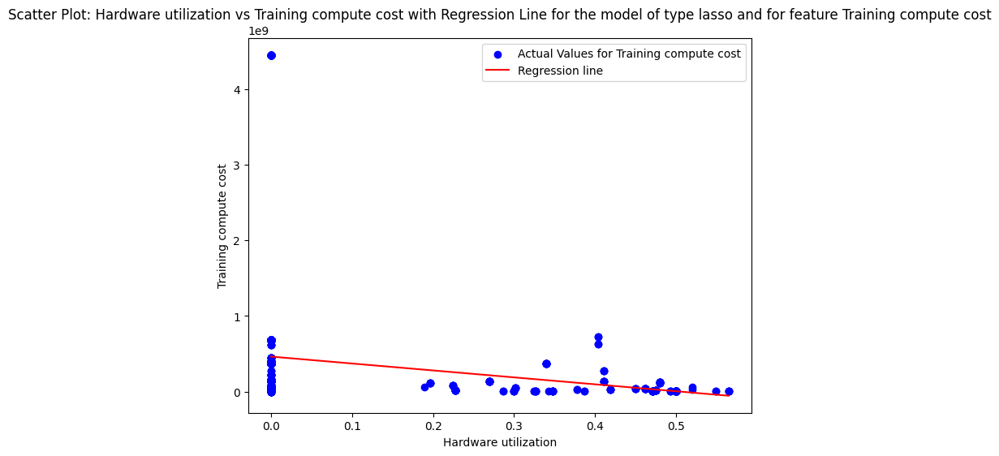

Running Models with Best Parameters:  20%|██        | 1/5 [00:03<00:12,  3.18s/it]

--------------------------------------------------
SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Hardware quantity: 416702005248.0
data size: -49889987788.8
Training time (hours): 283532853248.0
Hardware unit Memory Size (bytes): 268877955072.0
Epochs: 1307732397260.8
Batch size: 350903861248.0
Hardware utilization: 595481696665.6
Model_encoded: 267318093414.4
Domain_encoded: 139573854208.0
Country_encoded: 78290459033.6
Organization_encoded: 649656165990.4
Date_encoded: 406716206284.8
Category_encoded: 1372795699.2
Task_encoded: 224726194585.6
Confidence_encoded: 450786177843.2
accessibility_encoded: 427511565516.8
Training dataset_encoded: 335826596659.2
Training code accessibility_encoded: 139369591603.2
Training hardware_encoded: 988900281548.8
Notability_encoded: 225472780697.6
text_encoded: 228207886336.0
noise: 2894908620.8
category: 20312594841.6

Most influential feature according to permutation importance: Epochs


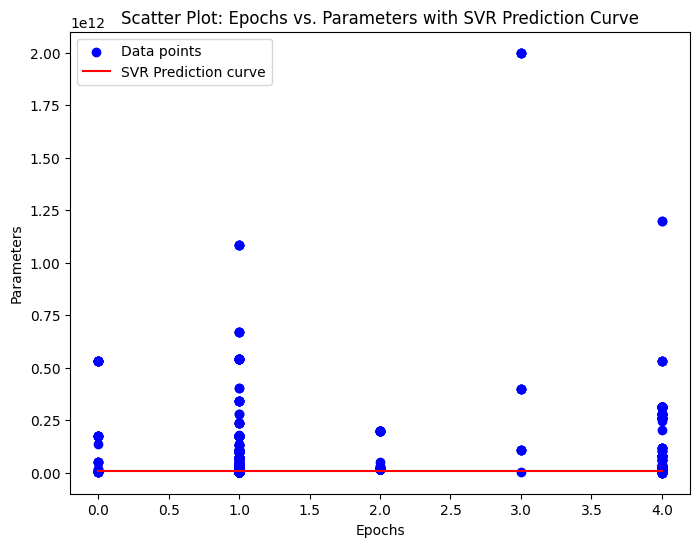

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.0
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.0
Batch size: 0.0
Hardware utilization: 0.0
Model_encoded: 0.0
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.0
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: 0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
text_encoded: 0.0
noise: 0.0
category: 0.0

Most influential feature according to permutation importance: Hardware quantity


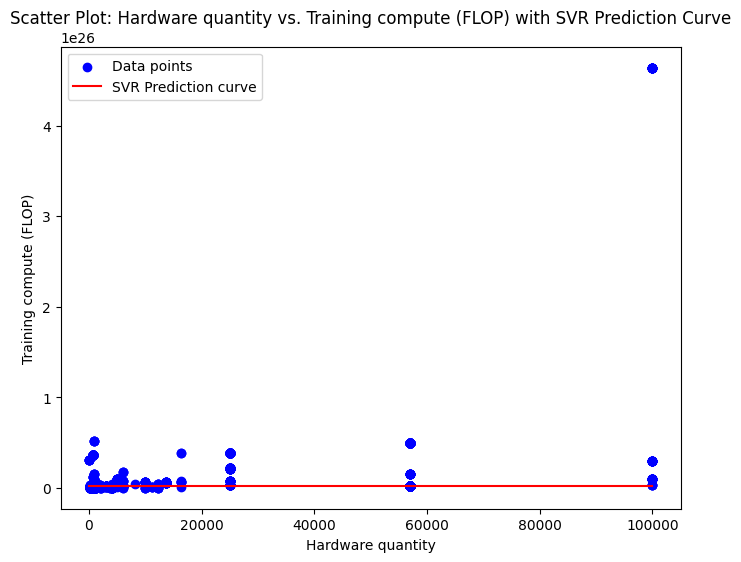

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale

Hardware quantity: 0.3670994507716955
data size: 0.2724210296189426
Training time (hours): 3.4007640345091206
Hardware unit Memory Size (bytes): 0.6109934007075821
Epochs: 2.496444968333242
Batch size: 0.518320624226169
Hardware utilization: 6.014252483070299
Model_encoded: 0.6937554045819183
Domain_encoded: 0.4545474586961518
Country_encoded: 3.47807246172066
Organization_encoded: -0.08261221884014276
Date_encoded: 0.11537580547877724
Category_encoded: -0.22701560077896374
Task_encoded: 0.3154372584733096
Confidence_encoded: -0.37559430321823584
accessibility_encoded: 2.3444621857823904
Training dataset_encoded: 1.4289297217090393
Training code accessibility_encoded: 0.37184454788157384
Training hardware_encoded: 0.6620702197245236
Notability_encoded: 0.277493835215364
text_encoded: 0.7752601634270263
noise: 0.2637792175206755
category: -0.4286876857337575

Most influential feature according to permutation importance: Hardware u

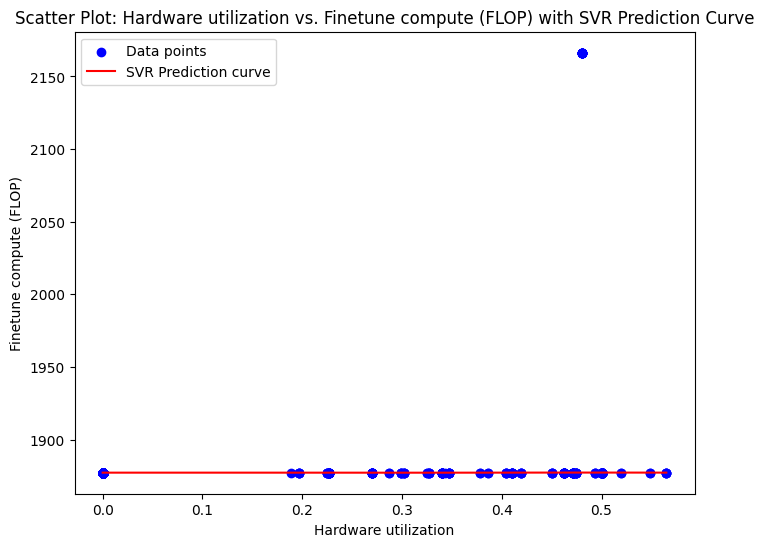

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Hardware quantity: 3131203520.9
data size: 460537054.5
Training time (hours): 1964956811.3
Hardware unit Memory Size (bytes): 1445498646.7
Epochs: 669122378.1
Batch size: 952484923.3
Hardware utilization: 859724298.5
Model_encoded: 1064068030.4
Domain_encoded: -85548876.9
Country_encoded: 1098910831.1
Organization_encoded: 973642075.8
Date_encoded: 1198842009.9
Category_encoded: 841005442.2
Task_encoded: 327411703.4
Confidence_encoded: 2541417609.5
accessibility_encoded: 2255964952.0
Training dataset_encoded: 1225556132.0
Training code accessibility_encoded: 1255051709.5
Training hardware_encoded: 1298846966.4
Notability_encoded: 960725328.8
text_encoded: 884566904.3
noise: 56617656.7
category: -4125226.3

Most influential feature according to permutation importance: Hardware quantity


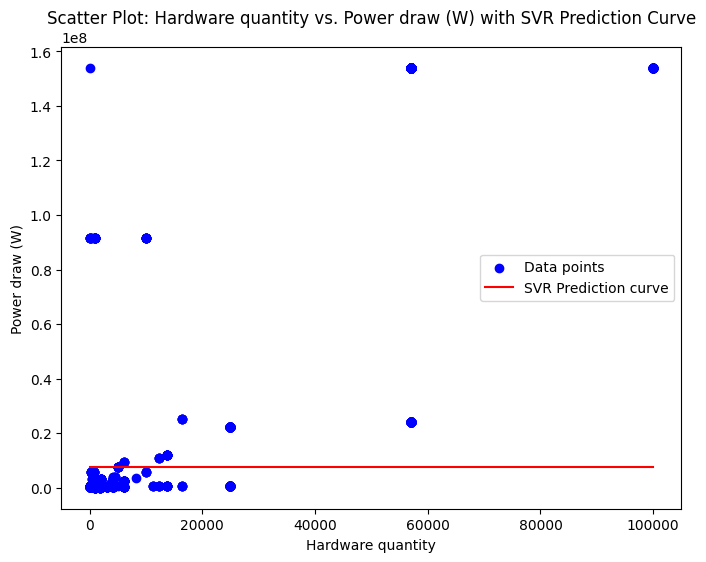

SVR with Best Paramson kernel rbf, C:1.0, gamma = scale



/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


Hardware quantity: 14331334348.8
data size: 1326000985.6
Training time (hours): 9562588659.2
Hardware unit Memory Size (bytes): 3715306342.4
Epochs: -6499822476.8
Batch size: 1571822732.8
Hardware utilization: 3599295014.4
Model_encoded: 3953208384.0
Domain_encoded: 722597939.2
Country_encoded: 6258731648.0
Organization_encoded: -1934357068.8
Date_encoded: 4511931596.8
Category_encoded: 2810664396.8
Task_encoded: 659843276.8
Confidence_encoded: 9802645363.2
accessibility_encoded: 10319302131.2
Training dataset_encoded: 5529828032.0
Training code accessibility_encoded: 6535309593.6
Training hardware_encoded: -1708642956.8
Notability_encoded: 3637906304.0
text_encoded: 2830285350.4
noise: 338129177.6
category: 52497254.4

Most influential feature according to permutation importance: Hardware quantity


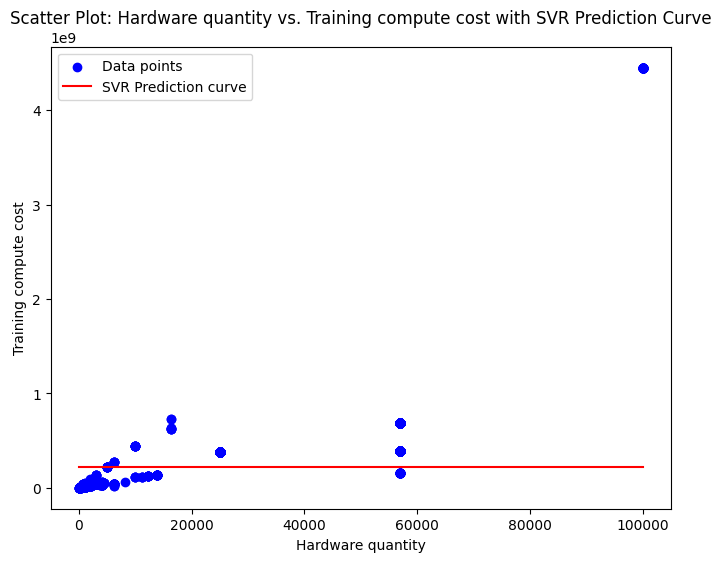

Running Models with Best Parameters:  40%|████      | 2/5 [00:06<00:10,  3.45s/it]

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.0641046126195212
data size: 0.0
Training time (hours): 0.02299705622013437
Hardware unit Memory Size (bytes): 0.001814086007017589
Epochs: 0.029094561447260435
Batch size: 0.10051225556979479
Hardware utilization: 0.10375251197550613
Model_encoded: 0.01524858356731439
Domain_encoded: 0.0002920977202587722
Country_encoded: 0.003203277406540758
Organization_encoded: 0.037734302270734654
Date_encoded: 0.4259485740091158
Category_encoded: 0.0
Task_encoded: 3.1485521032448514e-15
Confidence_encoded: 0.00037797472006828576
accessibility_encoded: 0.07248174282572231
Training dataset_encoded: 0.03461604151252383
Training code accessibility_encoded: 0.002237239027205418
Training hardware_encoded: 0.05850680600600666
Notability_encoded: 0.0013719018762189368
text_encoded: 0.0254934811062979
noise: 0.00019483745873194867
category: 1.805665402281487e-05

Most influential feature 

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


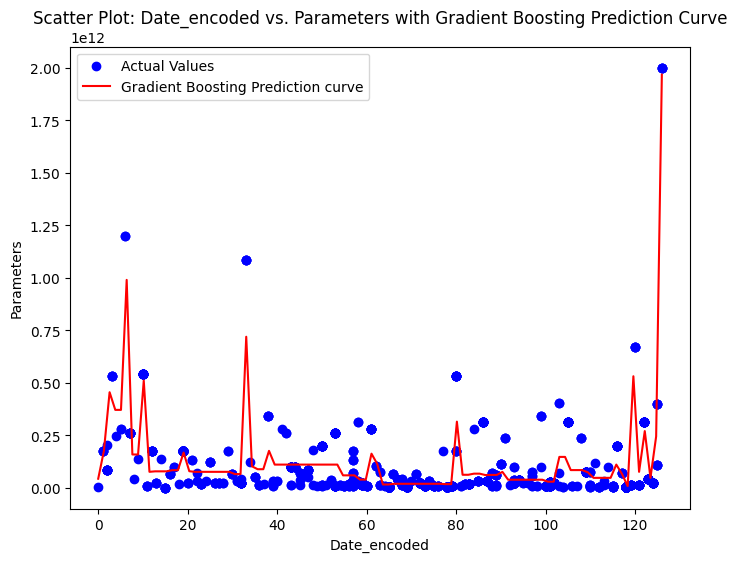

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.013131092467420395
data size: 0.0
Training time (hours): 0.0007240331013146342
Hardware unit Memory Size (bytes): 0.09683730714574537
Epochs: 0.0006285458763864484
Batch size: 0.004195612415060289
Hardware utilization: 0.49530773410579715
Model_encoded: 0.0009448352323772118
Domain_encoded: 4.072815719970339e-17
Country_encoded: 1.9289261043943847e-05
Organization_encoded: 0.09036677257982337
Date_encoded: 0.0028951671084573405
Category_encoded: 0.0
Task_encoded: 5.565008720125705e-09
Confidence_encoded: 5.1239802188732116e-05
accessibility_encoded: 0.1176619519387331
Training dataset_encoded: 2.6954206309658384e-06
Training code accessibility_encoded: 1.015237363339231e-08
Training hardware_encoded: 0.0026160435211041726
Notability_encoded: 0.007418095123782938
text_encoded: 0.16717931437431371
noise: 1.0380321668842485e-07
category: 2.0151005220832807e-05

Most infl

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


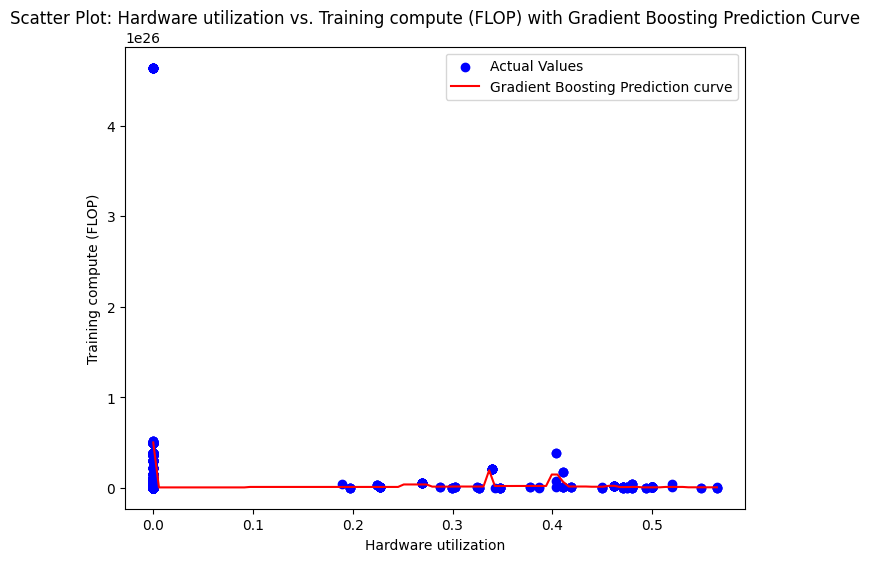

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.11089269667846477
data size: 0.0
Training time (hours): 0.4607137372306419
Hardware unit Memory Size (bytes): 5.645865257327452e-19
Epochs: 0.08816148485491374
Batch size: 0.017224803154968476
Hardware utilization: 0.08193606903817356
Model_encoded: 0.12770338420893537
Domain_encoded: 0.0
Country_encoded: 0.05479585507890859
Organization_encoded: 3.270042774778654e-19
Date_encoded: 0.00015456320966812542
Category_encoded: 3.699554791130033e-18
Task_encoded: 5.211074154820983e-17
Confidence_encoded: 0.010747108141143887
accessibility_encoded: 1.984051356066393e-18
Training dataset_encoded: 0.011698850365423744
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
text_encoded: 0.012523124305554193
noise: 0.004809390203255786
category: 0.01863893352994785

Most influential feature according to permutation importance: Training ti

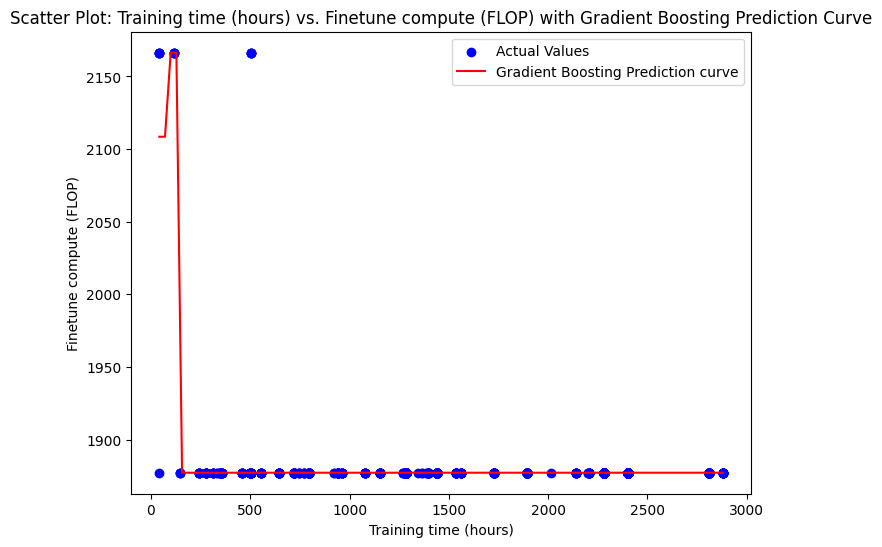

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.7943273967593764
data size: 0.0
Training time (hours): 0.00010720008751151362
Hardware unit Memory Size (bytes): 0.0007644561140090829
Epochs: 0.0015618454761575772
Batch size: 2.3355754078761804e-05
Hardware utilization: 0.15245634055164292
Model_encoded: 4.9944008853787564e-05
Domain_encoded: 2.7013725702841372e-08
Country_encoded: 0.0006980138347899232
Organization_encoded: 0.017713905259479495
Date_encoded: 0.0002756550662514534
Category_encoded: 0.0
Task_encoded: 1.173393019168214e-06
Confidence_encoded: 0.00012282118813454704
accessibility_encoded: 0.0001816466536102623
Training dataset_encoded: 4.415633425083501e-05
Training code accessibility_encoded: 5.060391018297558e-06
Training hardware_encoded: 0.0014865500670160463
Notability_encoded: 0.007232384219025695
text_encoded: 0.020604437114769534
noise: 0.0023436174515134326
category: 1.3261765548387804e-08

Mo

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


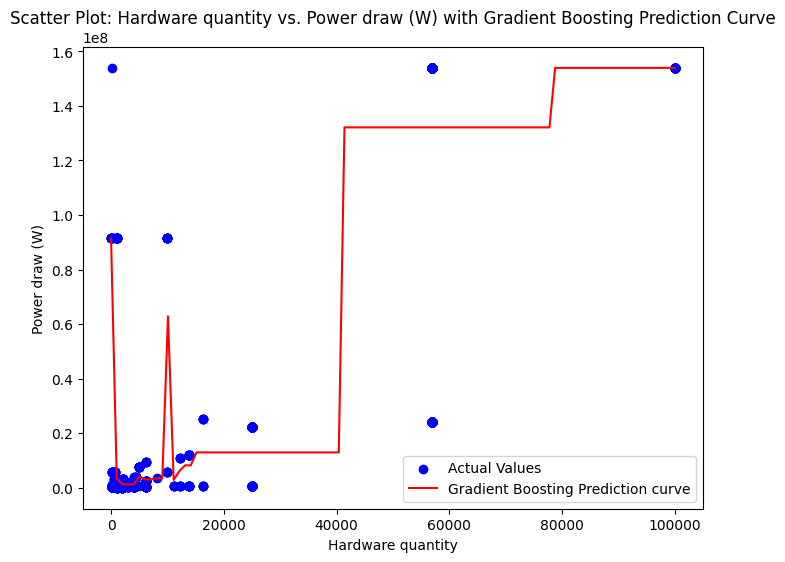

Gradient Boosting with Best Paramson n_estimators 100, with learning rate:0.1, and max depth of 3

Hardware quantity: 0.37617550923526827
data size: 0.0
Training time (hours): 1.3862036962065787e-05
Hardware unit Memory Size (bytes): 0.001137374282021235
Epochs: 1.2081386820313124e-05
Batch size: 0.0003088499381834592
Hardware utilization: 0.013902857336233808
Model_encoded: 4.6628553737634537e-05
Domain_encoded: 3.810034304879505e-23
Country_encoded: 1.3267295841387757e-06
Organization_encoded: 0.5901623513763552
Date_encoded: 0.00914047906320135
Category_encoded: 0.0
Task_encoded: 1.5171611466524178e-16
Confidence_encoded: 0.007848430039872864
accessibility_encoded: 0.00045851405865705906
Training dataset_encoded: 0.00031121382883433034
Training code accessibility_encoded: 5.230245233771305e-06
Training hardware_encoded: 0.00042076303159767526
Notability_encoded: 2.431831735248044e-05
text_encoded: 2.887507337573109e-05
noise: 1.85230667200863e-08
category: 1.316943641650031e-06

Mos

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


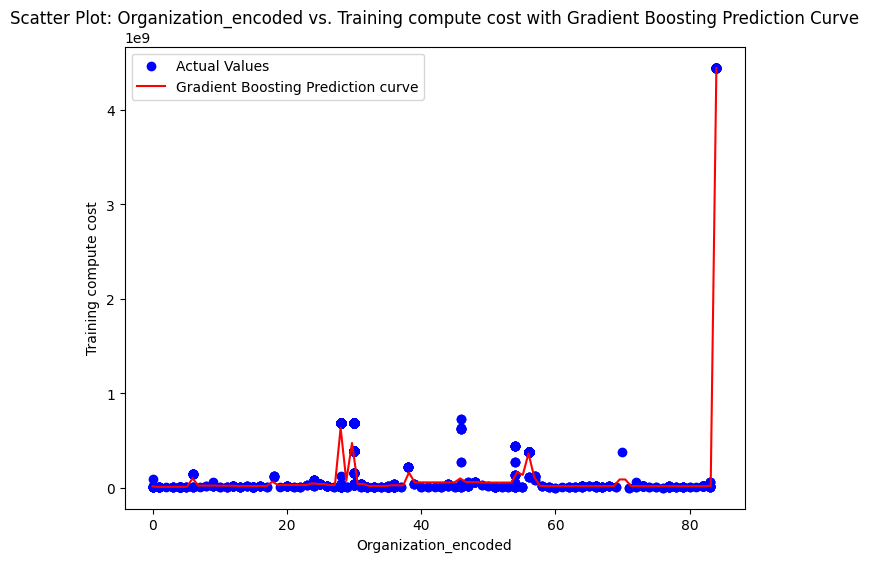

Running Models with Best Parameters:  60%|██████    | 3/5 [00:09<00:06,  3.12s/it]

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.05318158101132898
data size: 0.0006515251634668103
Training time (hours): 0.034288899675873896
Hardware unit Memory Size (bytes): 0.019767219515339853
Epochs: 0.04268412641474194
Batch size: 0.030538958860514907
Hardware utilization: 0.09623125628222164
Model_encoded: 0.02683804788226452
Domain_encoded: 0.0002752401193545398
Country_encoded: 0.009532304014305631
Organization_encoded: 0.0417882016526261
Date_encoded: 0.4622448616223038
Category_encoded: 0.00013846668287797195
Task_encoded: 0.0008724903649532445
Confidence_encoded: 0.005442854239521901
accessibility_encoded: 0.03527208733975066
Training dataset_encoded: 0.04614211989487814
Training code accessibility_encoded: 0.0033531425831430615
Training hardware_encoded: 0.05139578254930103
Notability_encoded: 0.0060437255564009815
text_encoded: 0.025847242238055096
noise: 0.003200609333659318
category: 0.00426925700

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


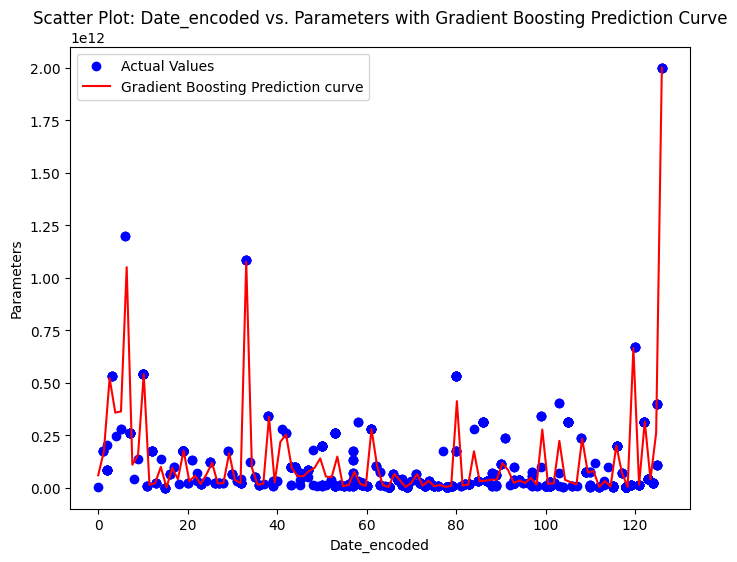

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.021895568395405955
data size: 2.2886038199055983e-07
Training time (hours): 0.0011959337860140992
Hardware unit Memory Size (bytes): 0.009949101230961599
Epochs: 0.011140771858527064
Batch size: 0.015536448664226729
Hardware utilization: 0.5071296339273574
Model_encoded: 0.0054218352441607704
Domain_encoded: 2.8240887599460424e-06
Country_encoded: 1.8172970923047414e-05
Organization_encoded: 0.05702190746747379
Date_encoded: 0.03821069585338642
Category_encoded: 2.771817836786086e-06
Task_encoded: 7.171068218285252e-06
Confidence_encoded: 0.00015283118767681536
accessibility_encoded: 0.011120187629008462
Training dataset_encoded: 6.56660329056695e-05
Training code accessibility_encoded: 0.009523797786142247
Training hardware_encoded: 0.0069114971421292875
Notability_encoded: 0.009351038416060694
text_encoded: 0.29529762859691544
noise: 2.6031483643578987e-05
category:

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


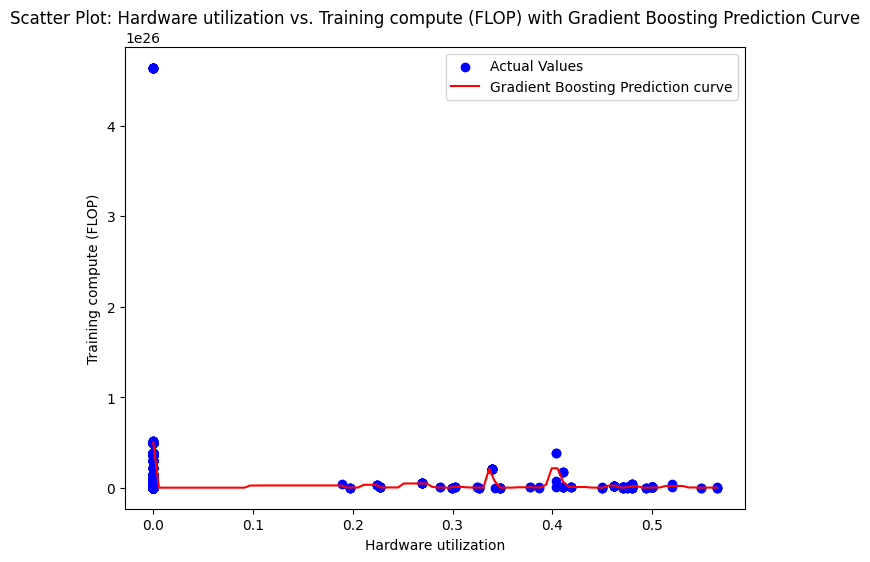

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.04726424968435484
data size: 0.0
Training time (hours): 0.408450631445206
Hardware unit Memory Size (bytes): 1.02569041953233e-16
Epochs: 0.15207858658920148
Batch size: 0.0022854402883952197
Hardware utilization: 0.086043754819647
Model_encoded: 0.053297290689791145
Domain_encoded: 0.0
Country_encoded: 0.06720029980225577
Organization_encoded: 0.006367961206045799
Date_encoded: 0.0019343084077779284
Category_encoded: 0.0012555228276879434
Task_encoded: 1.7081946324390207e-15
Confidence_encoded: 0.03761065325547271
accessibility_encoded: 5.037545065453129e-16
Training dataset_encoded: 0.013425648286930545
Training code accessibility_encoded: 0.0
Training hardware_encoded: 5.958075339424541e-16
Notability_encoded: 6.735490979313121e-16
text_encoded: 0.10831725707031607
noise: 0.00761155427055831
category: 0.006856841356355593

Most influential feature according to perm

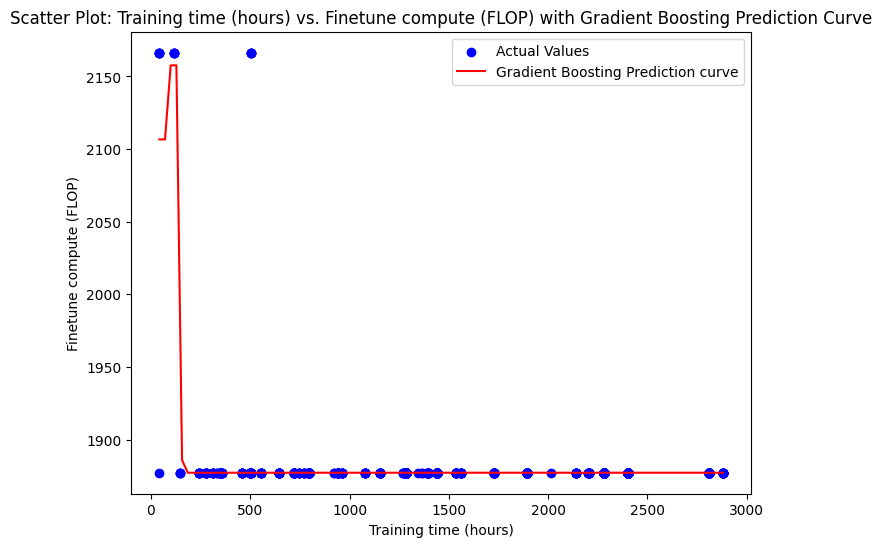

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.7996528363846407
data size: 1.1554552826794777e-07
Training time (hours): 0.0002967459621838121
Hardware unit Memory Size (bytes): 0.003998178611289798
Epochs: 0.0036814556858566563
Batch size: 0.002811847111627852
Hardware utilization: 0.15238715676881567
Model_encoded: 0.002000819100868935
Domain_encoded: 0.00015485705120375274
Country_encoded: 0.0005519795867942898
Organization_encoded: 0.017515863684164922
Date_encoded: 0.0026718516640968025
Category_encoded: 1.6308277142382577e-07
Task_encoded: 3.1266893815585756e-05
Confidence_encoded: 0.0002431469743859145
accessibility_encoded: 0.0005865667983389911
Training dataset_encoded: 0.00036413116067490796
Training code accessibility_encoded: 0.0006950475709639304
Training hardware_encoded: 0.0024764668267369563
Notability_encoded: 0.005666977545343744
text_encoded: 0.0023276053777004737
noise: 0.0018592151921417014
ca

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


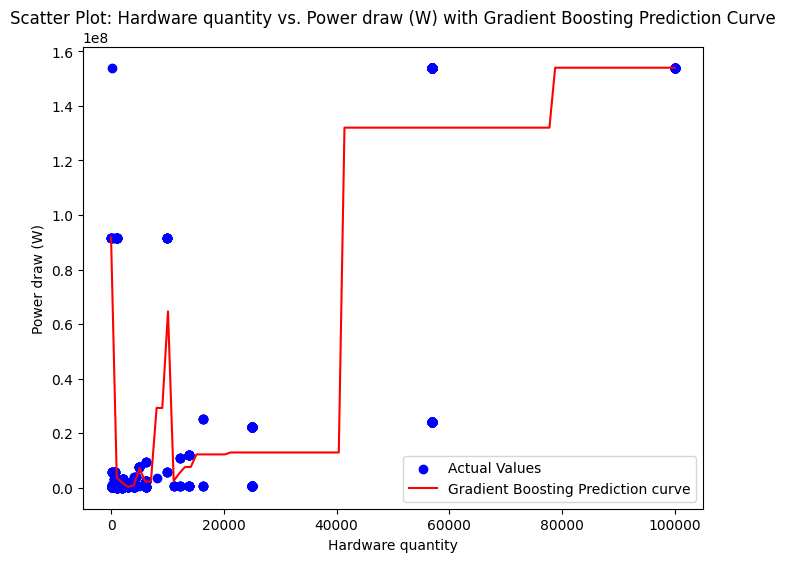

Random Forest with Best Paramson n_estimators 100, with max depth:None, and min sample split of 2

Hardware quantity: 0.2669327906862332
data size: 1.1152760250768789e-07
Training time (hours): 7.535387273414394e-05
Hardware unit Memory Size (bytes): 0.00036589864790774707
Epochs: 0.000318848715249572
Batch size: 0.0004933935529180977
Hardware utilization: 0.020050279087434435
Model_encoded: 0.00047447617997083965
Domain_encoded: 5.178142449281676e-05
Country_encoded: 4.07732276133085e-06
Organization_encoded: 0.7070791108055887
Date_encoded: 0.0026231290219006042
Category_encoded: 2.6215216685396895e-07
Task_encoded: 5.207521090497822e-06
Confidence_encoded: 0.000326677238395541
accessibility_encoded: 0.0003405443618163271
Training dataset_encoded: 1.0943447808961118e-05
Training code accessibility_encoded: 0.00015138854283775147
Training hardware_encoded: 0.00027238185020951854
Notability_encoded: 2.267416679969906e-05
text_encoded: 0.00040017958503582303
noise: 2.436279810338433e-07

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


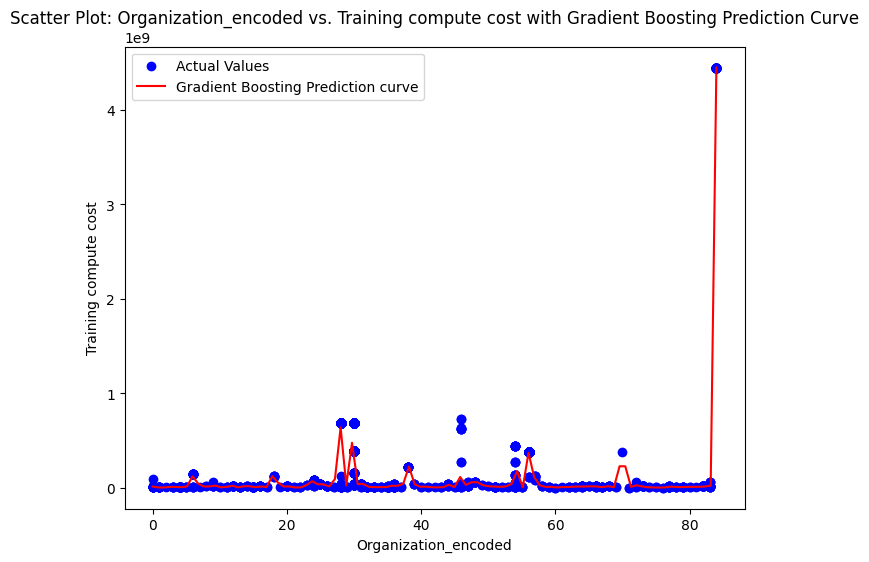

Running Models with Best Parameters:  80%|████████  | 4/5 [00:13<00:03,  3.58s/it]

Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.0382944553606367
data size: 1.4756891133191669e-08
Training time (hours): 0.017886888347481974
Hardware unit Memory Size (bytes): 0.04136681701226
Epochs: 0.05020011058438177
Batch size: 0.002221652379888389
Hardware utilization: 0.07750513232834294
Model_encoded: 0.05069990108186434
Domain_encoded: 0.0
Country_encoded: 1.2394815653196652e-05
Organization_encoded: 0.09645852668318218
Date_encoded: 0.4801396488583776
Category_encoded: 0.0
Task_encoded: 8.28085897317277e-21
Confidence_encoded: 0.0019652503437412126
accessibility_encoded: 0.002284193300194594
Training dataset_encoded: 0.047587729179860955
Training code accessibility_encoded: 3.8719956236048595e-05
Training hardware_encoded: 0.07939249606176994
Notability_encoded: 0.005209093524482795
text_encoded: 0.008700034007259671
noise: 2.8411934419433813e-05
category: 8.529483074985035e-06

Most influential 

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


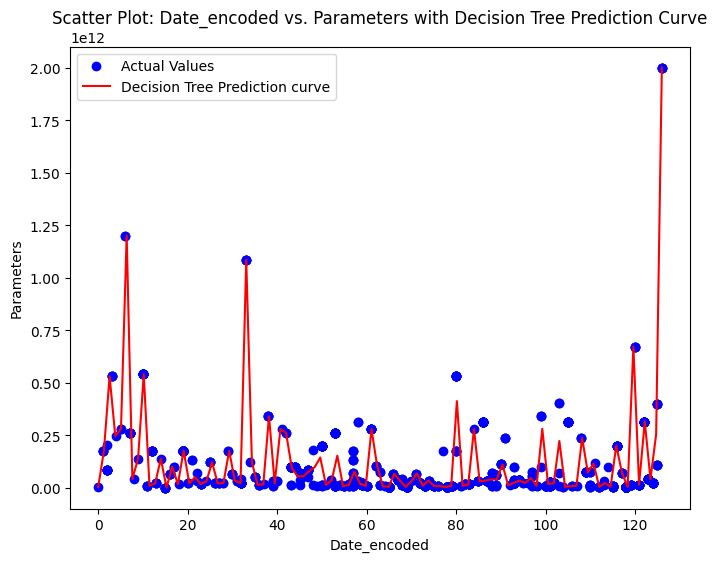

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.0004677014608873259
data size: 0.0
Training time (hours): 0.002627818563446102
Hardware unit Memory Size (bytes): 3.4079725401445194e-07
Epochs: 0.0011478875284828825
Batch size: 1.1242804418366264e-07
Hardware utilization: 0.4841280290867861
Model_encoded: 0.00032091581884583886
Domain_encoded: 0.0
Country_encoded: 9.648515952711551e-06
Organization_encoded: 8.6464709813218e-06
Date_encoded: 0.00024091047377097926
Category_encoded: 2.727300104372145e-06
Task_encoded: 1.9975661420458806e-09
Confidence_encoded: 4.0011149117835e-07
accessibility_encoded: 3.108174673741018e-05
Training dataset_encoded: 1.0492377740705447e-07
Training code accessibility_encoded: 0.00040596052538603136
Training hardware_encoded: 0.0011096284588706894
Notability_encoded: 0.00011951026242545207
text_encoded: 0.5093706996376818
noise: 

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


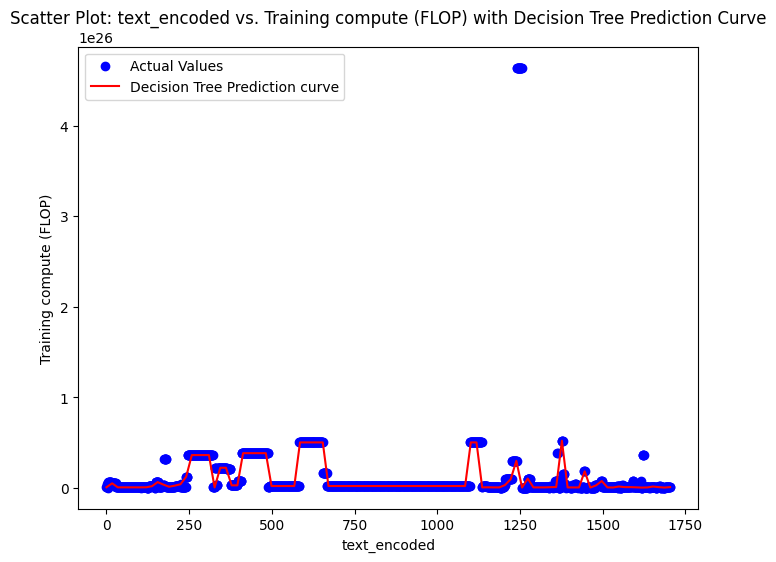

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.0
data size: 0.0
Training time (hours): 0.46071373722833125
Hardware unit Memory Size (bytes): 0.0
Epochs: 0.08816148485798628
Batch size: 0.0
Hardware utilization: 0.0
Model_encoded: 0.3579171791711814
Domain_encoded: 0.0
Country_encoded: 0.0
Organization_encoded: 0.0
Date_encoded: 0.0
Category_encoded: 0.0
Task_encoded: 0.0
Confidence_encoded: 0.0
accessibility_encoded: 0.0
Training dataset_encoded: 0.0
Training code accessibility_encoded: 0.0
Training hardware_encoded: 0.0
Notability_encoded: 0.0
text_encoded: 0.0
noise: 0.0
category: 0.09320759874250105

Most influential feature according to permutation importance: Training time (hours)


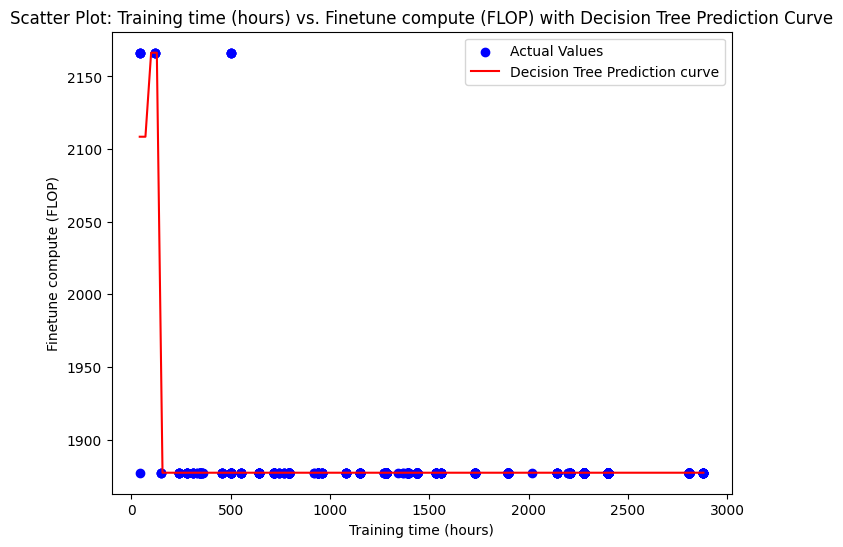

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.7913519440855021
data size: 4.0967236371210884e-07
Training time (hours): 5.712408528386343e-07
Hardware unit Memory Size (bytes): 9.085761351207897e-06
Epochs: 7.017012005608961e-06
Batch size: 0.02752461046603971
Hardware utilization: 0.15217644376011344
Model_encoded: 6.068839491119216e-06
Domain_encoded: 6.365397629194022e-08
Country_encoded: 5.149883820879322e-08
Organization_encoded: 0.018550649618419138
Date_encoded: 7.142133672692323e-07
Category_encoded: 3.9037865022375496e-08
Task_encoded: 5.7618701375205634e-08
Confidence_encoded: 3.961108918792832e-05
accessibility_encoded: 6.780077564180734e-08
Training dataset_encoded: 8.860988604969928e-07
Training code accessibility_encoded: 8.259408220351826e-21
Training hardware_encoded: 1.7770837553957244e-05
Notability_encoded: 0.006905528034575069
text_enco

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


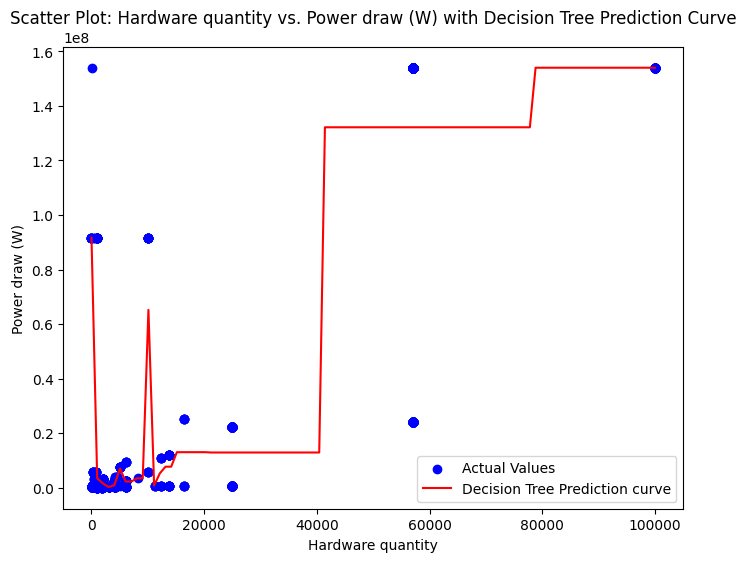

--------------------------------------------------
Decision Tree with Best Paramson max depth None, with min sample split:2, and min data in leaf node of 1

Hardware quantity: 0.11059682476740884
data size: 5.175905186983195e-08
Training time (hours): 2.7527059535597586e-06
Hardware unit Memory Size (bytes): 8.700242897907518e-05
Epochs: 3.738234284683307e-09
Batch size: 0.0007562928249010601
Hardware utilization: 0.02140953891060962
Model_encoded: 0.0017360393894462897
Domain_encoded: 3.792074813942675e-17
Country_encoded: 5.919665337250529e-10
Organization_encoded: 0.8637121711839544
Date_encoded: 0.0012212053653852441
Category_encoded: 0.0
Task_encoded: 6.909433774573538e-08
Confidence_encoded: 0.0002695683103236379
accessibility_encoded: 3.0850291858762545e-05
Training dataset_encoded: 7.450131921458661e-07
Training code accessibility_encoded: 3.867711977630491e-07
Training hardware_encoded: 0.0001750767478354952
Notability_encoded: 6.994351661371036e-07
text_encoded: 7.20576833806

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in cosh
  result = getattr(ufunc, method)(*inputs, **kwargs)


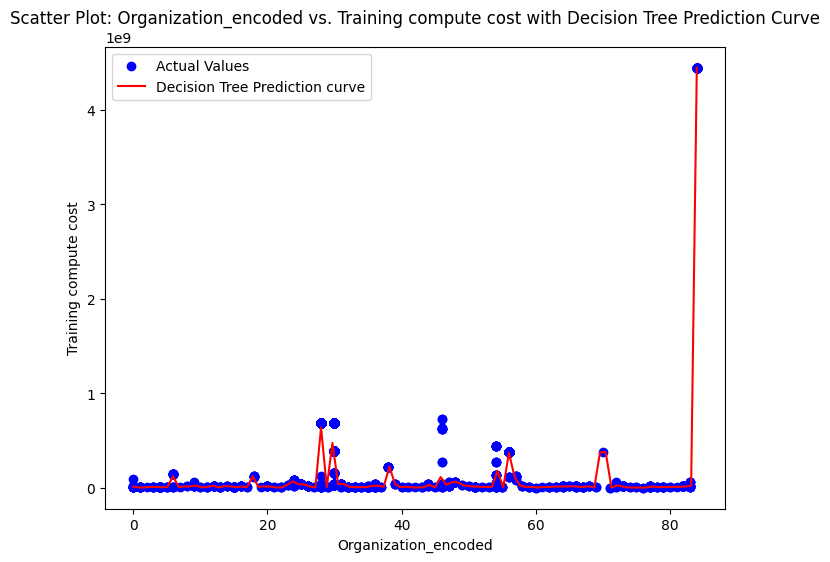

Running Models with Best Parameters: 100%|██████████| 5/5 [00:14<00:00,  2.94s/it]

--------------------------------------------------


In [ ]:
common_params['show_max_feature_graph'] = True
common_params['display_error'] = False
common_params['verbose'] = True
run_models(model_configs,common_params,store_err4)

### The the efficiency is slightly decresing for noisy features

## Code to check the best model

In [ ]:
import json

# Assuming store_err, store_err1, store_err2, store_err3, and store_err4 are defined

all_errors = {
    "original": store_err,
    "experiment_1": store_err1,
    "experiment_2": store_err2,
    "experiment_3": store_err3,
    "experiment_4": store_err4
}

with open('/content/drive/MyDrive/DATA 6250/Datasets/error_results.json', 'w') as f:
    json.dump(all_errors, f, indent=4)

In [ ]:
import json

def find_best_model(json_data, error_metric, maximize=True):
    # Initialize the result as a dictionary
    result = {}

    # Iterate through each experiment
    for experiment in json_data.keys():
        result[experiment] = {}

        # Get the data for the current experiment
        exp_data = json_data.get(experiment)
        if not exp_data:
            continue

        # Get all output columns (third key level) from the first model
        first_model = next(iter(exp_data.values()))
        output_columns = list(first_model.keys())

        # Iterate through each output column
        for output_col in output_columns:
            best_model = None
            best_value = float('-inf') if maximize else float('inf')

            # Iterate through each model for the output column
            for model_name, metrics in exp_data.items():
                value = metrics.get(output_col, {}).get(error_metric)
                if value is None:
                    continue

                # Handle Infinity values
                if value == float('inf') or value == float('-inf'):
                    continue

                # Update best model based on the metric
                if maximize:
                    if value > best_value:
                        best_value = value
                        best_model = model_name
                else:
                    if value < best_value:
                        best_value = value
                        best_model = model_name

            # Add the result for this output column
            if best_model:
                result[experiment][output_col] = best_model

    # Remove empty experiment entries
    result = {k: v for k, v in result.items() if v}

    return result

In [ ]:
def find_best_models_for_experiment(data, experiment_name, metric_name):
    """
    For a given experiment and evaluation metric, find for each output column the models
    that give the optimal value (either maximum or minimum based on the metric).

    If more than one model achieves the same optimum, return a list of model names;
    otherwise, return the single model name.

    The output is a dictionary with the following structure:
        { experiment_name: { output_column: best_model_or_models, ... } }

    Parameters:
        data (dict): The complete JSON data.
        experiment_name (str): The key for the experiment (e.g., "experiment_1").
        metric_name (str): The metric name (e.g., "Mean_Absolute_Error", "R2").

    Returns:
        dict: Dictionary-of-dictionaries mapping each output column to the best model name or list.
    """
    # For performance metrics such as R2, a higher value is better.
    higher_is_better = {"R2", "Explained_Variance", "Adjusted_R2"}
    optimize = "max" if metric_name in higher_is_better else "min"

    experiment_data = data.get(experiment_name, {})
    best_models = {}

    # Gather all output column names from all models in this experiment.
    output_columns = set()
    for model_name, model_info in experiment_data.items():
        output_columns.update(model_info.keys())

    # For each output column, iterate over models to compute the optimum value.
    for col in output_columns:
        best_value = None
        best_model_list = []
        for model_name, model_info in experiment_data.items():
            if col in model_info and metric_name in model_info[col]:
                value = model_info[col][metric_name]
                # If the value is the string "Infinity", convert it to float('inf')
                if isinstance(value, str) and value.lower() == "infinity":
                    value = float("inf")

                # Initialize best_value if needed.
                if best_value is None:
                    best_value = value
                    best_model_list = [model_name]
                else:
                    if optimize == "min":
                        if value < best_value:
                            best_value = value
                            best_model_list = [model_name]
                        elif value == best_value:
                            best_model_list.append(model_name)
                    else:  # optimize == "max"
                        if value > best_value:
                            best_value = value
                            best_model_list = [model_name]
                        elif value == best_value:
                            best_model_list.append(model_name)

        if best_model_list:
            # If only one model attains the optimum, return a string; otherwise, return the list.
            best_models[col] = best_model_list[0] if len(best_model_list) == 1 else best_model_list

    return {experiment_name: best_models}

In [ ]:
def find_best_model_for_experiment(data, experiment_name, metric_name):
    """
    For a given experiment and metric, find for each output column (e.g. "Parameters", "Training compute (FLOP)")
    the model that gives the best value for the given metric.

    The return value is a dictionary of the form:
    { experiment_name: { output_column: best_model, ... } }

    Parameters:
        data (dict): The complete JSON data.
        experiment_name (str): The experiment key (e.g., "experiment_1").
        metric_name (str): The metric name (e.g., "Mean_Absolute_Error", "R2").

    Returns:
        dict: A dictionary-of-dictionaries with the best model for each output column.
    """
    # Metrics for which higher is better:
    higher_is_better = {"R2", "Explained_Variance", "Adjusted_R2"}
    optimize = "max" if metric_name in higher_is_better else "min"

    experiment_data = data.get(experiment_name, {})
    best_models = {}

    # Collect all output column names from the models in this experiment
    output_columns = set()
    for model_name, model_info in experiment_data.items():
        output_columns.update(model_info.keys())

    # For each output column find the best model based on the metric
    for col in output_columns:
        best_model = None
        best_value = None
        for model_name, model_info in experiment_data.items():
            if col in model_info and metric_name in model_info[col]:
                value = model_info[col][metric_name]
                # Convert string "Infinity" to float('inf') if needed
                if isinstance(value, str) and value.lower() == "infinity":
                    value = float("inf")
                if best_value is None:
                    best_value = value
                    best_model = model_name
                else:
                    if optimize == "min" and value < best_value:
                        best_value = value
                        best_model = model_name
                    elif optimize == "max" and value > best_value:
                        best_value = value
                        best_model = model_name
        if best_model is not None:
            best_models[col] = best_model

    return {experiment_name: best_models}

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
results_path = "/content/drive/MyDrive/DATA 6250/Datasets/error_results.json"
with open(results_path, 'r') as f:
    json_data = json.load(f)



In [ ]:
result = find_best_model_for_experiment(json_data, 'experiment_2','Mean_Squared_Error')
for exp,mod_dict in result.items():
  for key,value in mod_dict.items():
    print(f"for the given 'Mean Squared Error' metric, for the given experiment {exp}, for the given column {key} the best model is {value}")

for the given 'Mean Squared Error' metric, for the given experiment experiment_2, for the given column Parameters the best model is Linear Regression
for the given 'Mean Squared Error' metric, for the given experiment experiment_2, for the given column Power draw (W) the best model is Linear Regression
for the given 'Mean Squared Error' metric, for the given experiment experiment_2, for the given column Training compute cost the best model is Linear Regression
for the given 'Mean Squared Error' metric, for the given experiment experiment_2, for the given column Training compute (FLOP) the best model is Linear Regression
for the given 'Mean Squared Error' metric, for the given experiment experiment_2, for the given column Finetune compute (FLOP) the best model is Linear Regression


## Experiment 5

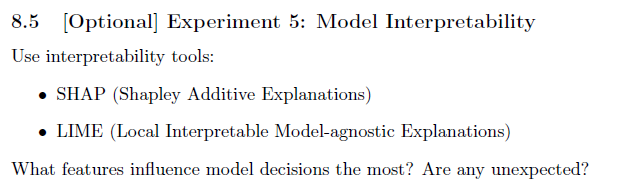

In [ ]:
!pip install shap lime

import shap
import lime
import lime.lime_tabular

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 972.6/972.6 kB 30.4 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283913 sha256=0883654866e0919985ddd6f9ff065662699b9263828b5f2ee91f24bd12e2ebcb
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime



Processing original...

Training model for: original, Parameters

Training model for: original, Training compute (FLOP)

Training model for: original, Finetune compute (FLOP)

Training model for: original, Power draw (W)

Training model for: original, Training compute cost
Computing SHAP values for original, Training compute cost...


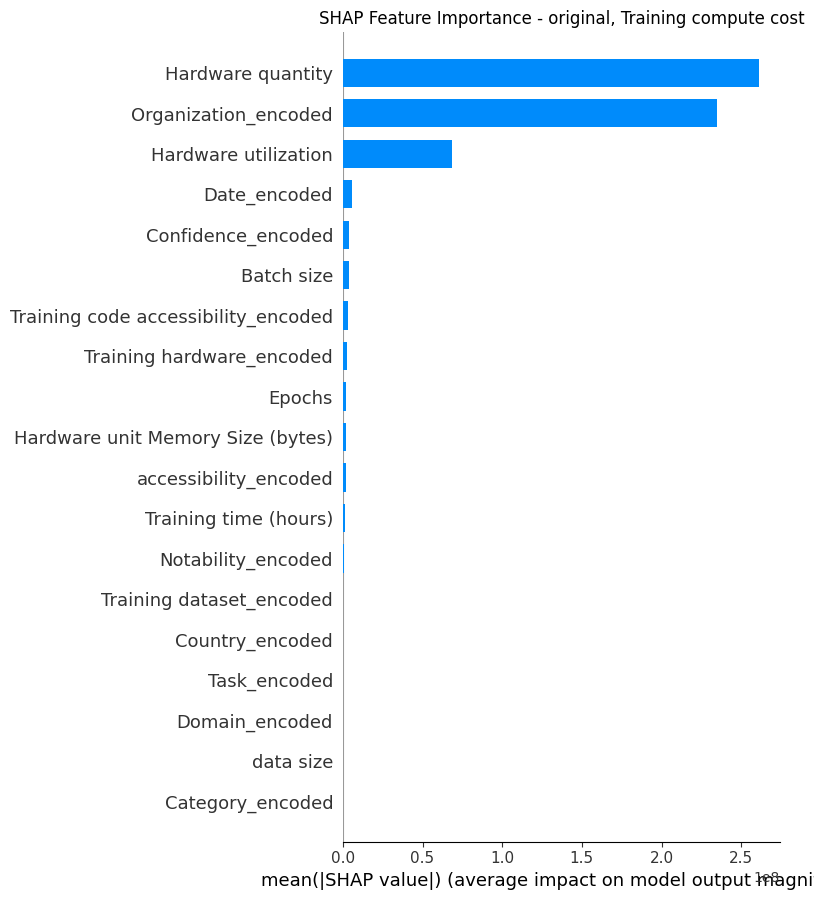

Computing LIME explanations for original, Training compute cost...
LIME failed for original, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: original, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



Training model for: original, Training compute (FLOP)

Training model for: original, Finetune compute (FLOP)

Training model for: original, Power draw (W)

Training model for: original, Training compute cost
Computing SHAP values for original, Training compute cost...


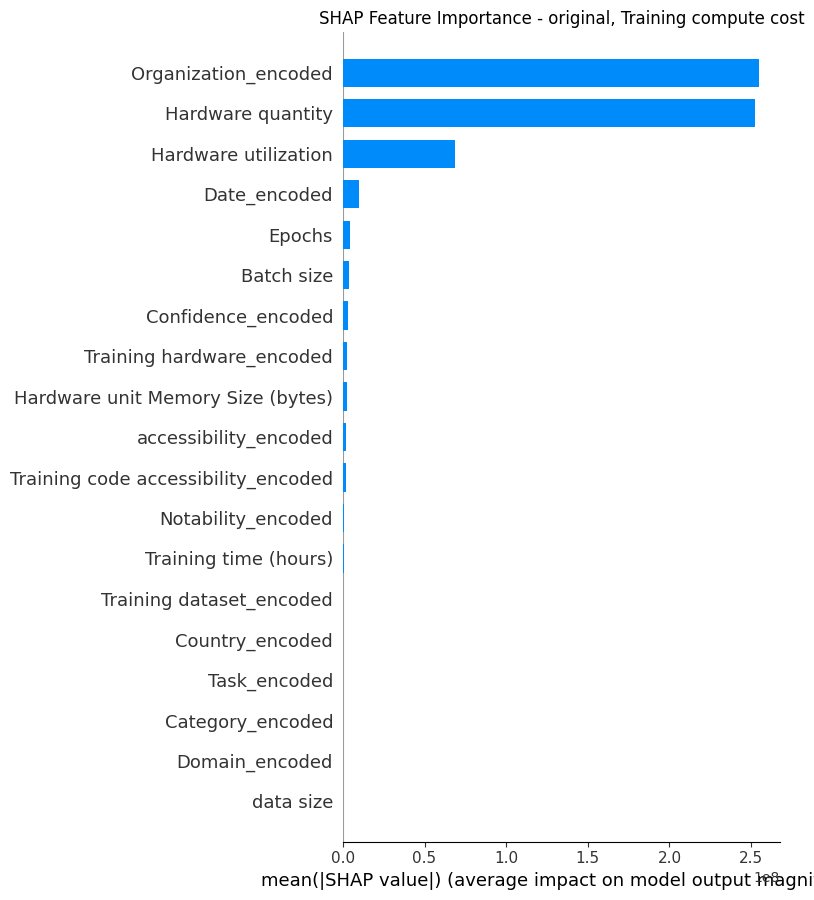

Computing LIME explanations for original, Training compute cost...
LIME failed for original, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: original, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



Training model for: original, Training compute (FLOP)

Training model for: original, Finetune compute (FLOP)

Training model for: original, Power draw (W)

Training model for: original, Training compute cost
Computing SHAP values for original, Training compute cost...


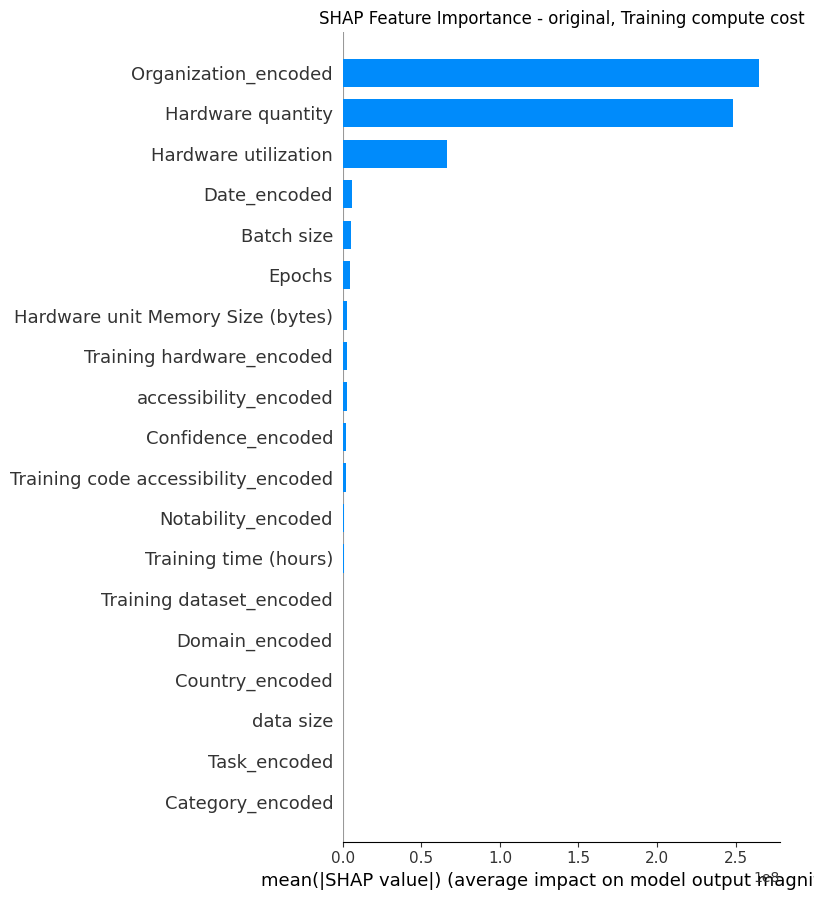

Computing LIME explanations for original, Training compute cost...
LIME failed for original, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: original, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



Training model for: original, Training compute (FLOP)

Training model for: original, Finetune compute (FLOP)

Training model for: original, Power draw (W)

Training model for: original, Training compute cost
Computing SHAP values for original, Training compute cost...


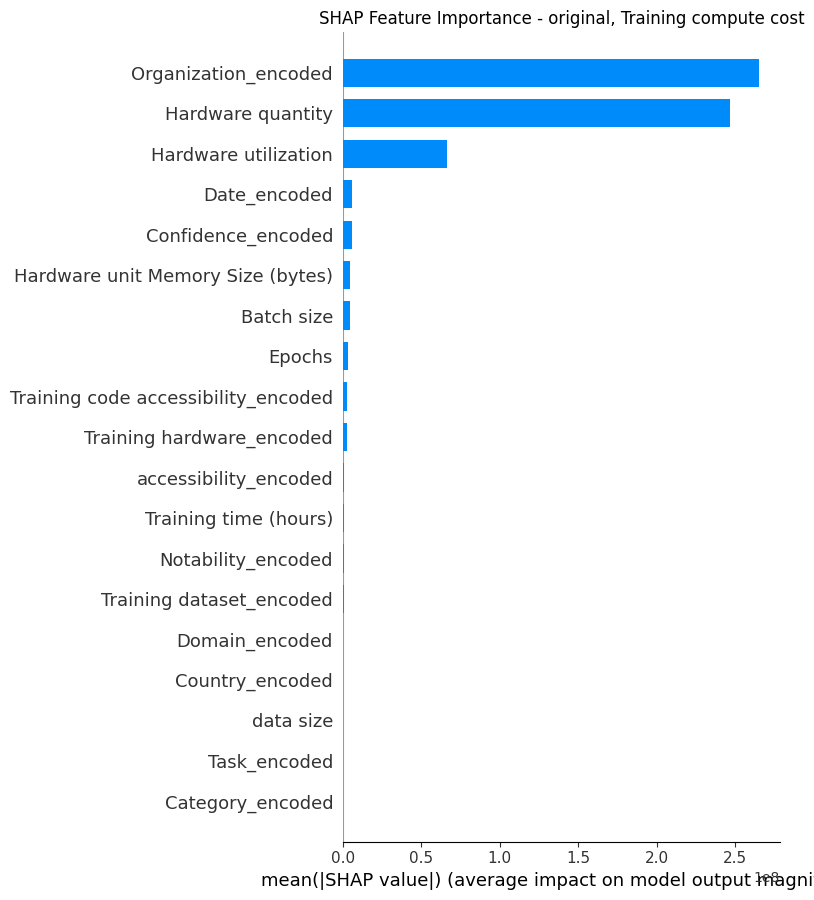

Computing LIME explanations for original, Training compute cost...
LIME failed for original, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: original, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



Training model for: original, Training compute (FLOP)

Training model for: original, Finetune compute (FLOP)

Training model for: original, Power draw (W)

Training model for: original, Training compute cost
Computing SHAP values for original, Training compute cost...


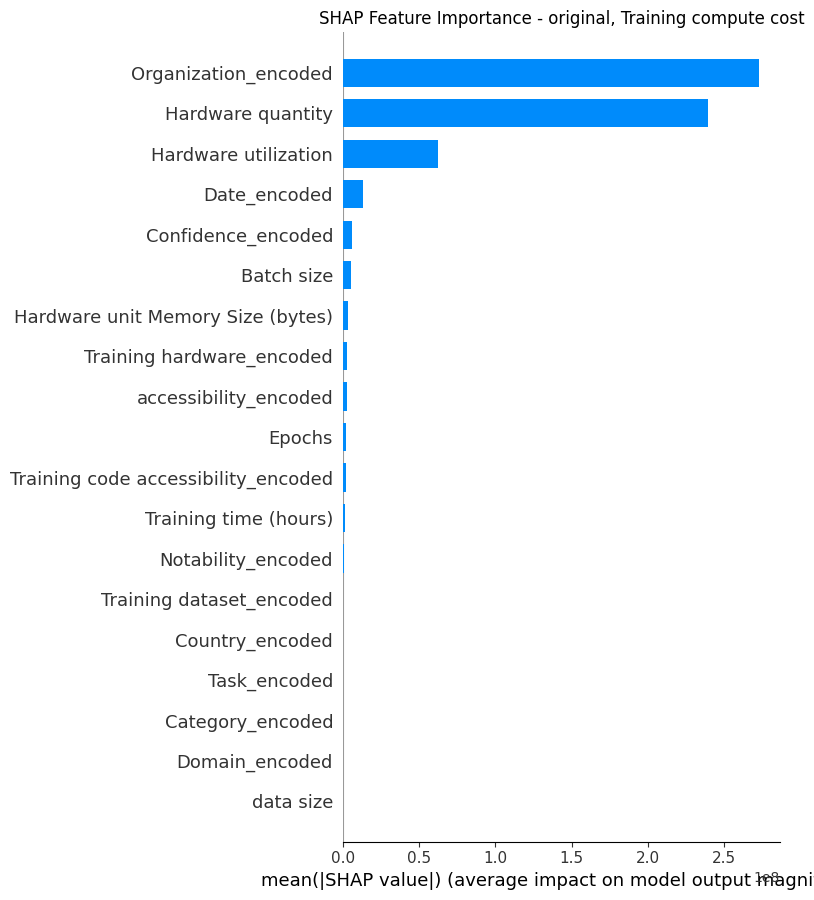

Computing LIME explanations for original, Training compute cost...
LIME failed for original, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Processing experiment-1...

Training model for: experiment-1, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-1, Training compute (FLOP)

Training model for: experiment-1, Finetune compute (FLOP)

Training model for: experiment-1, Power draw (W)

Training model for: experiment-1, Training compute cost
Computing SHAP values for experiment-1, Training compute cost...


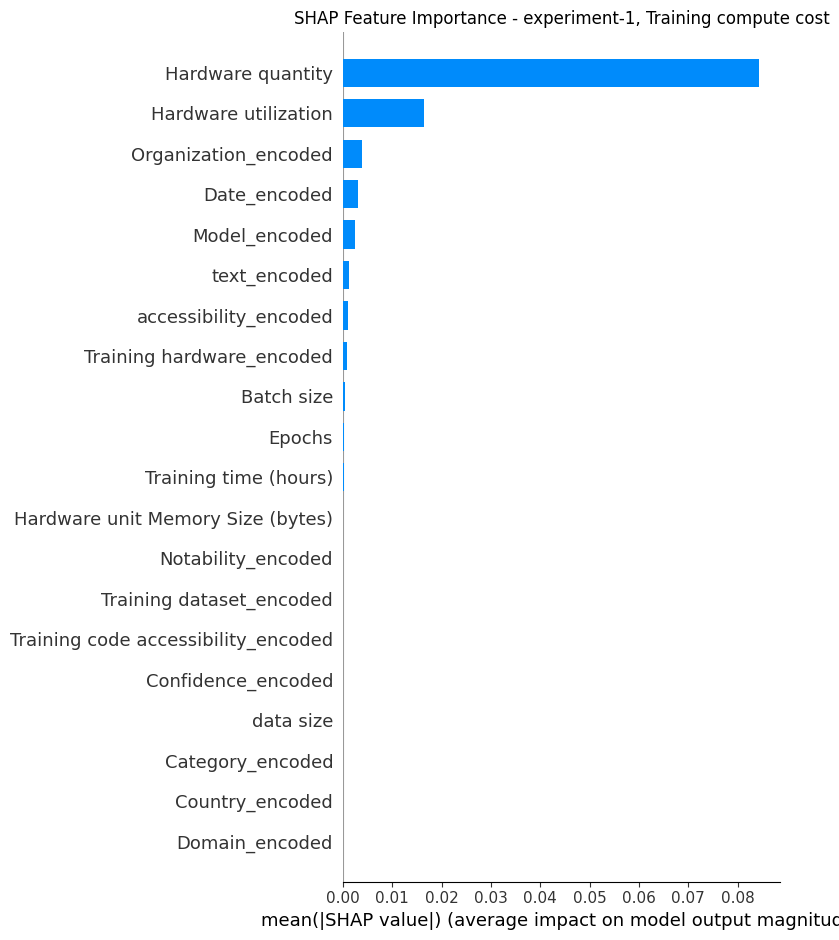

Computing LIME explanations for experiment-1, Training compute cost...
LIME failed for experiment-1, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-1, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-1, Training compute (FLOP)

Training model for: experiment-1, Finetune compute (FLOP)

Training model for: experiment-1, Power draw (W)

Training model for: experiment-1, Training compute cost
Computing SHAP values for experiment-1, Training compute cost...


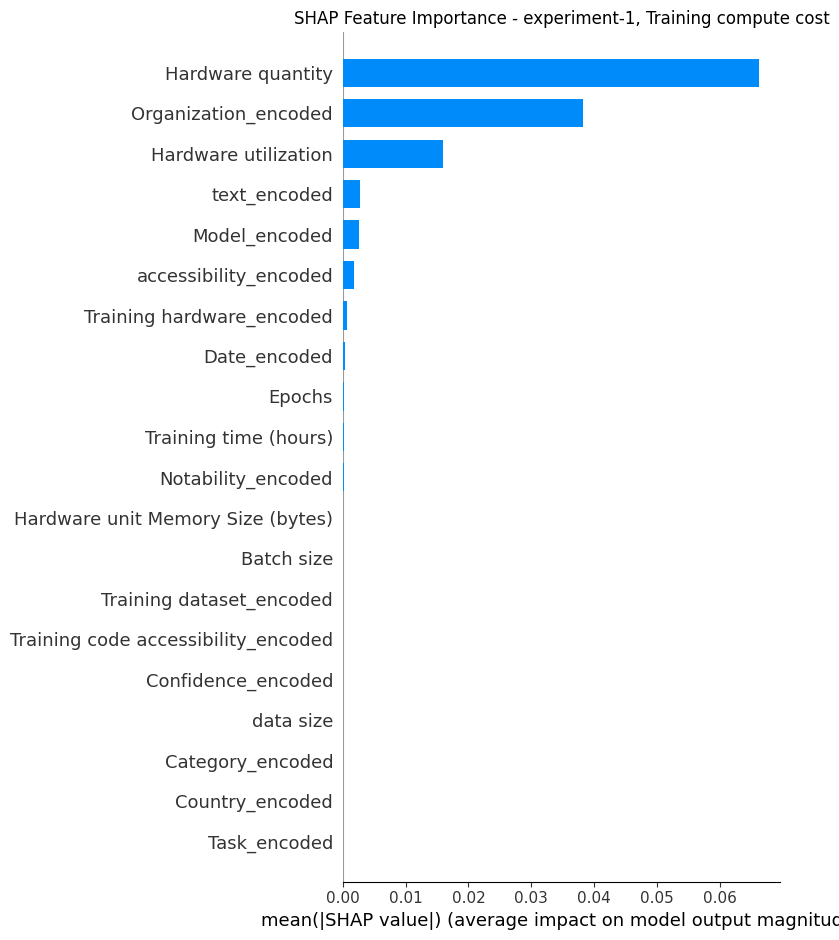

Computing LIME explanations for experiment-1, Training compute cost...
LIME failed for experiment-1, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-1, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-1, Training compute (FLOP)

Training model for: experiment-1, Finetune compute (FLOP)

Training model for: experiment-1, Power draw (W)

Training model for: experiment-1, Training compute cost
Computing SHAP values for experiment-1, Training compute cost...


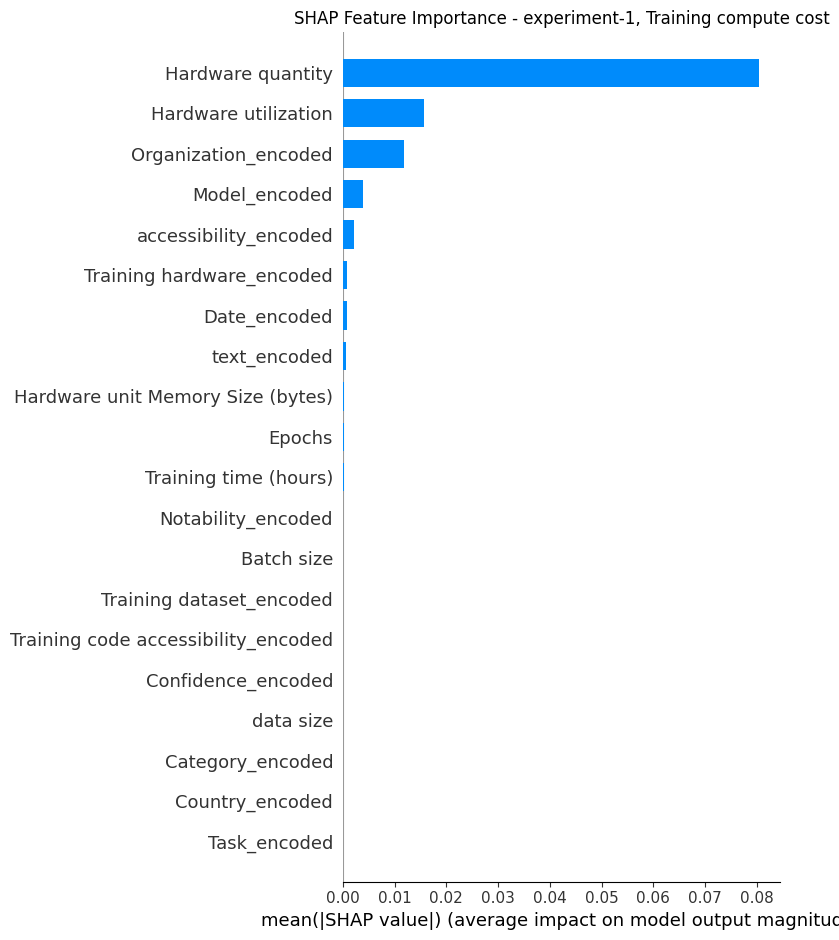

Computing LIME explanations for experiment-1, Training compute cost...
LIME failed for experiment-1, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-1, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-1, Training compute (FLOP)

Training model for: experiment-1, Finetune compute (FLOP)

Training model for: experiment-1, Power draw (W)

Training model for: experiment-1, Training compute cost
Computing SHAP values for experiment-1, Training compute cost...


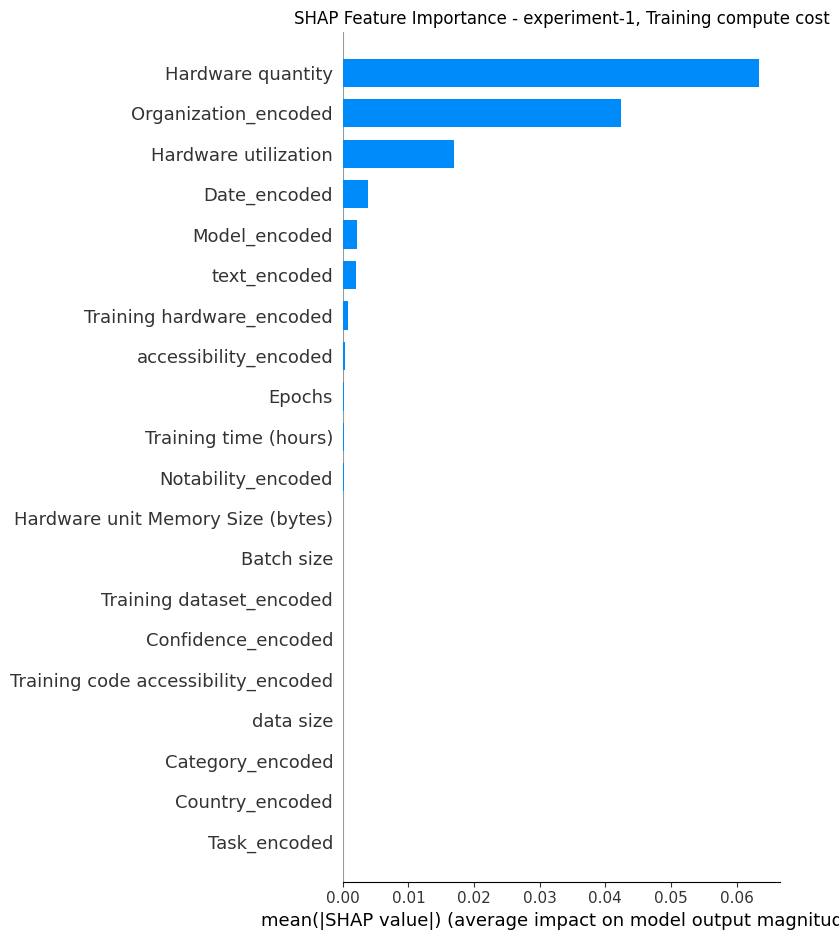

Computing LIME explanations for experiment-1, Training compute cost...
LIME failed for experiment-1, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-1, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-1, Training compute (FLOP)

Training model for: experiment-1, Finetune compute (FLOP)

Training model for: experiment-1, Power draw (W)

Training model for: experiment-1, Training compute cost
Computing SHAP values for experiment-1, Training compute cost...


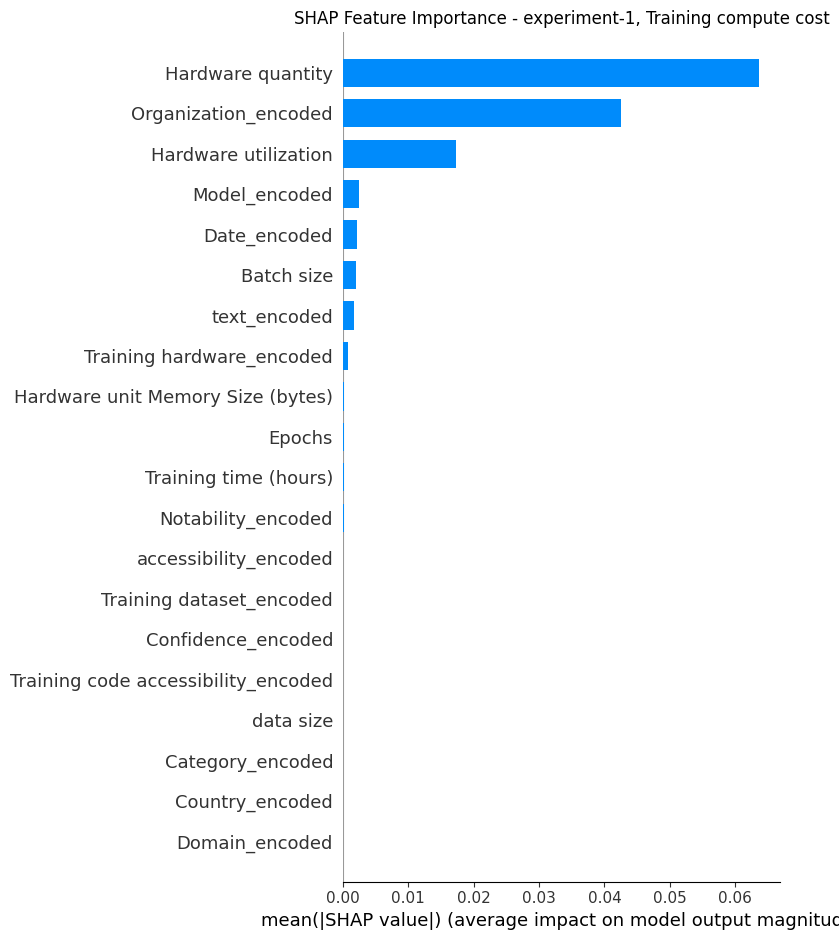

Computing LIME explanations for experiment-1, Training compute cost...
LIME failed for experiment-1, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Processing experiment-2...

Training model for: experiment-2, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-2, Training compute (FLOP)

Training model for: experiment-2, Finetune compute (FLOP)

Training model for: experiment-2, Power draw (W)

Training model for: experiment-2, Training compute cost
Computing SHAP values for experiment-2, Training compute cost...


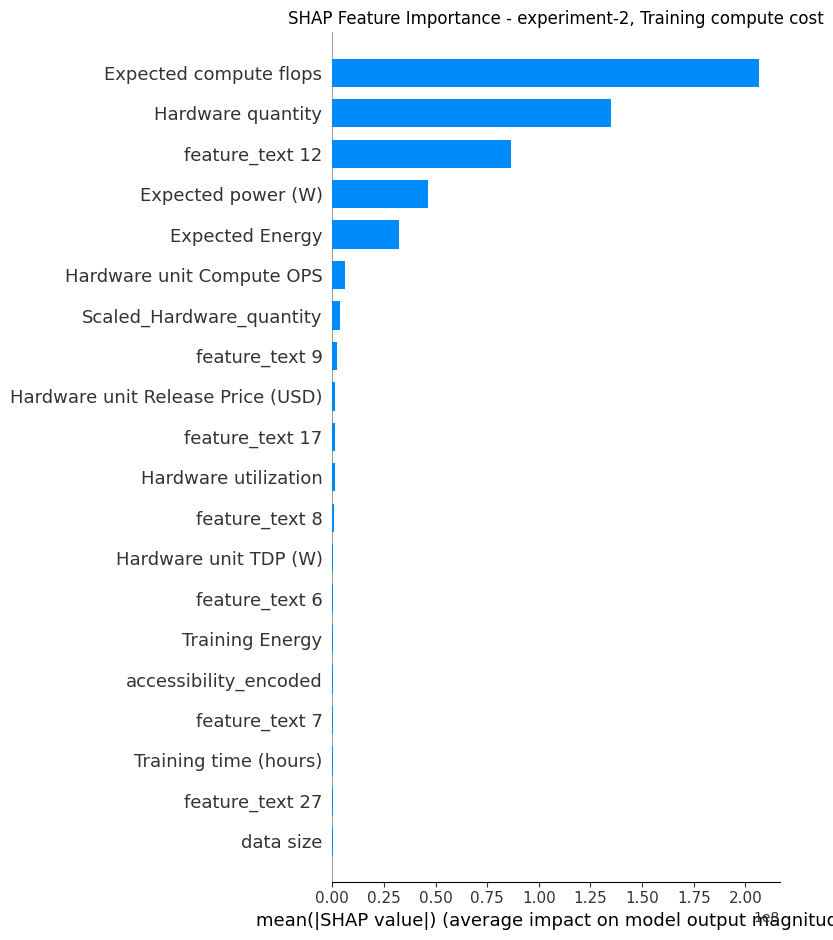

Computing LIME explanations for experiment-2, Training compute cost...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


LIME failed for experiment-2, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-2, Parameters

Training model for: experiment-2, Training compute (FLOP)

Training model for: experiment-2, Finetune compute (FLOP)

Training model for: experiment-2, Power draw (W)

Training model for: experiment-2, Training compute cost
Computing SHAP values for experiment-2, Training compute cost...


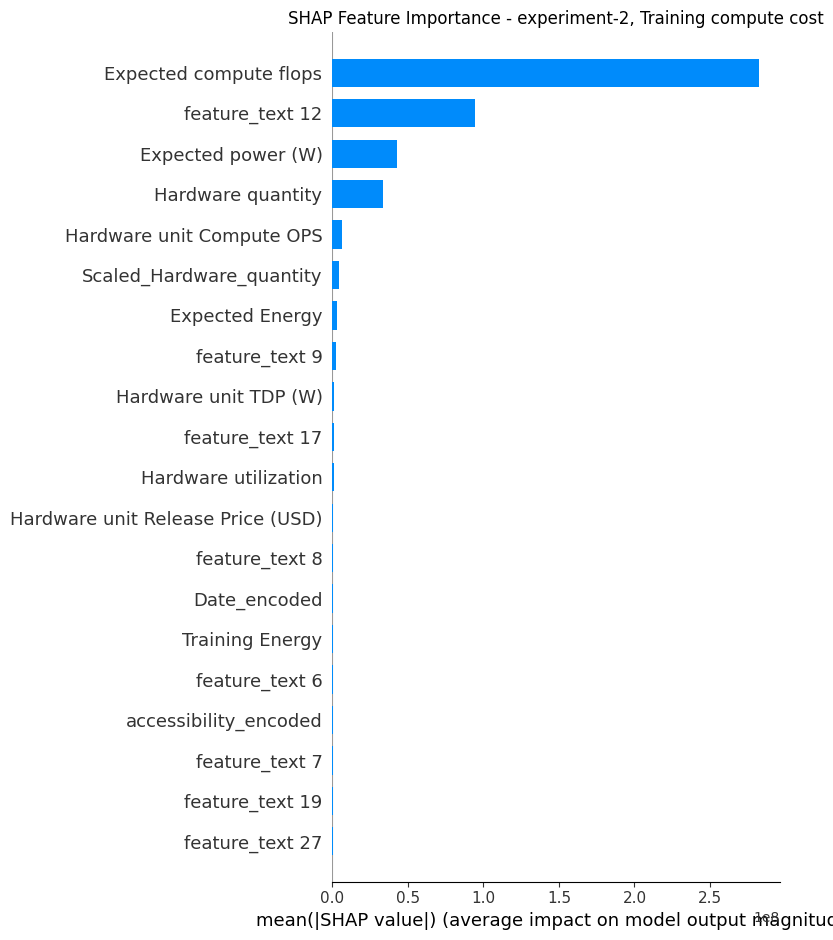

Computing LIME explanations for experiment-2, Training compute cost...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


LIME failed for experiment-2, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-2, Parameters

Training model for: experiment-2, Training compute (FLOP)

Training model for: experiment-2, Finetune compute (FLOP)

Training model for: experiment-2, Power draw (W)

Training model for: experiment-2, Training compute cost
Computing SHAP values for experiment-2, Training compute cost...


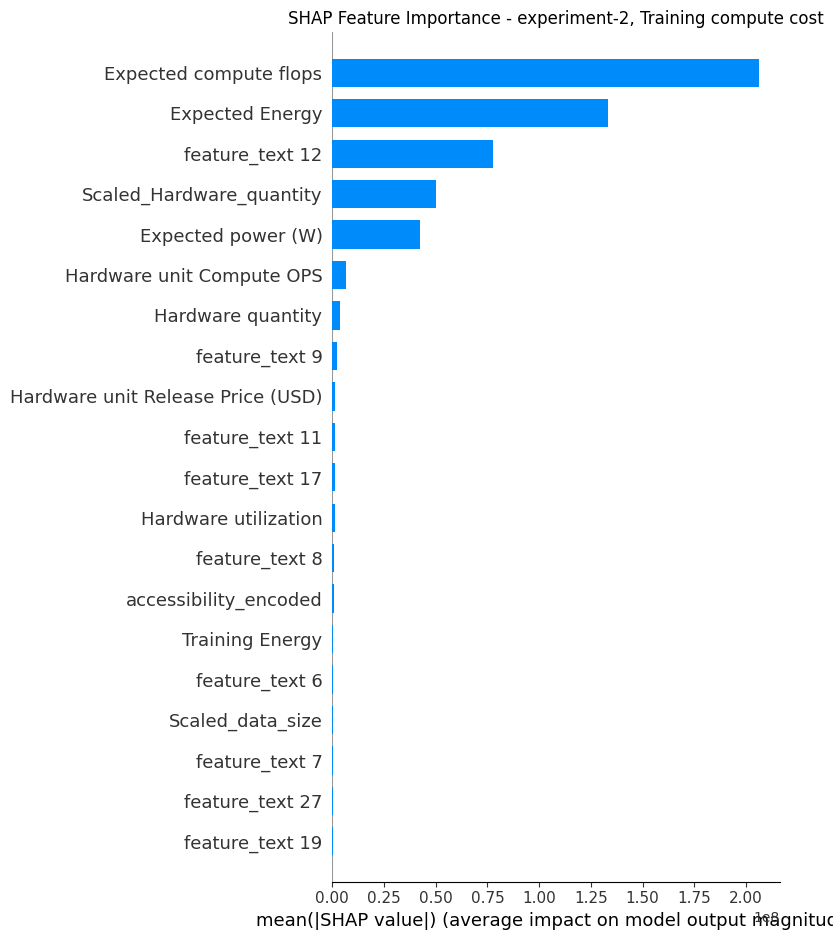

Computing LIME explanations for experiment-2, Training compute cost...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


LIME failed for experiment-2, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-2, Parameters

Training model for: experiment-2, Training compute (FLOP)

Training model for: experiment-2, Finetune compute (FLOP)

Training model for: experiment-2, Power draw (W)

Training model for: experiment-2, Training compute cost
Computing SHAP values for experiment-2, Training compute cost...


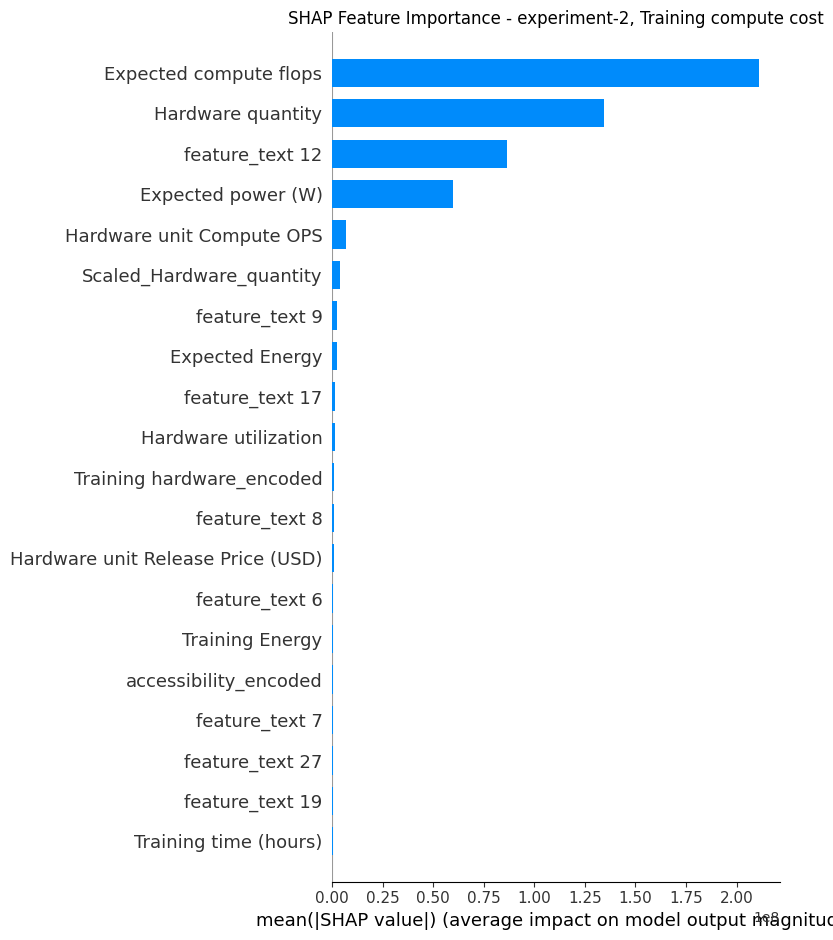

Computing LIME explanations for experiment-2, Training compute cost...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


LIME failed for experiment-2, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-2, Parameters

Training model for: experiment-2, Training compute (FLOP)

Training model for: experiment-2, Finetune compute (FLOP)

Training model for: experiment-2, Power draw (W)

Training model for: experiment-2, Training compute cost
Computing SHAP values for experiment-2, Training compute cost...


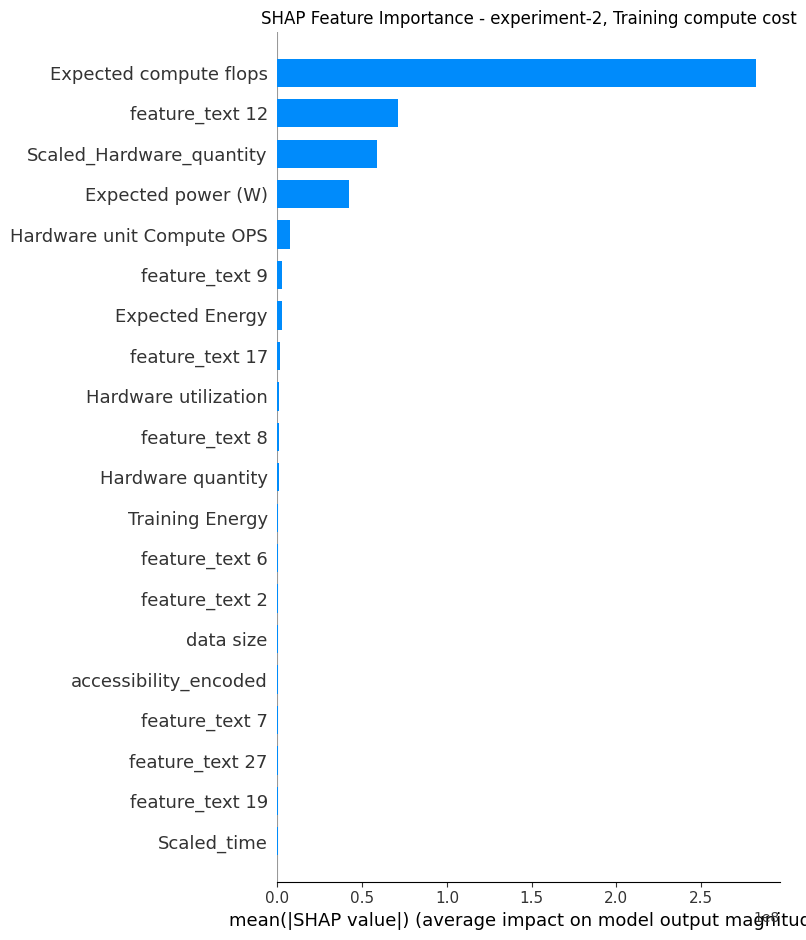

Computing LIME explanations for experiment-2, Training compute cost...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


LIME failed for experiment-2, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Processing experiment-3...

Training model for: experiment-3, Parameters

Training model for: experiment-3, Training compute (FLOP)

Training model for: experiment-3, Finetune compute (FLOP)

Training model for: experiment-3, Power draw (W)

Training model for: experiment-3, Training compute cost
Computing SHAP values for experiment-3, Training compute cost...


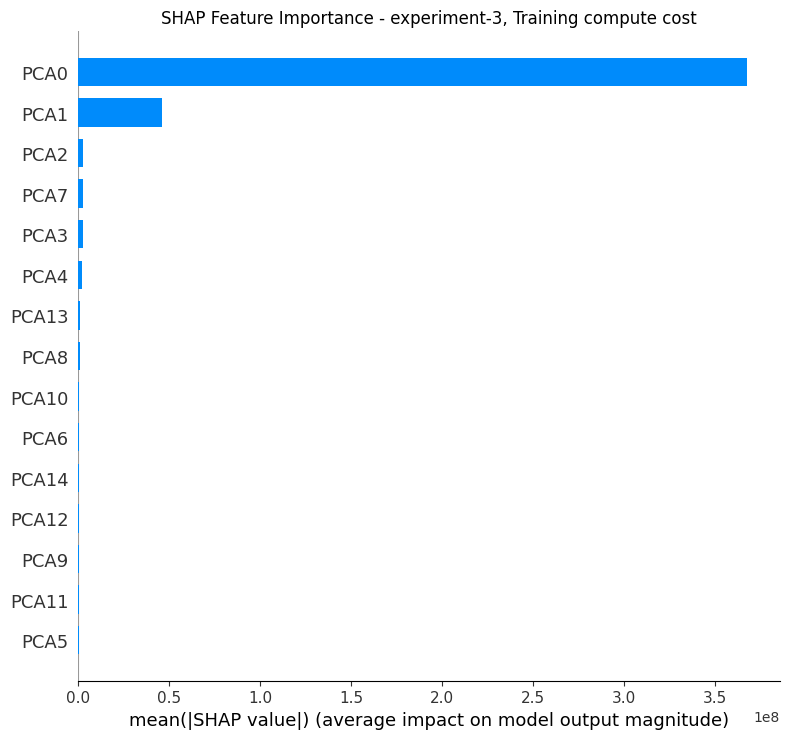

Computing LIME explanations for experiment-3, Training compute cost...
LIME failed for experiment-3, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-3, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-3, Training compute (FLOP)

Training model for: experiment-3, Finetune compute (FLOP)

Training model for: experiment-3, Power draw (W)

Training model for: experiment-3, Training compute cost
Computing SHAP values for experiment-3, Training compute cost...


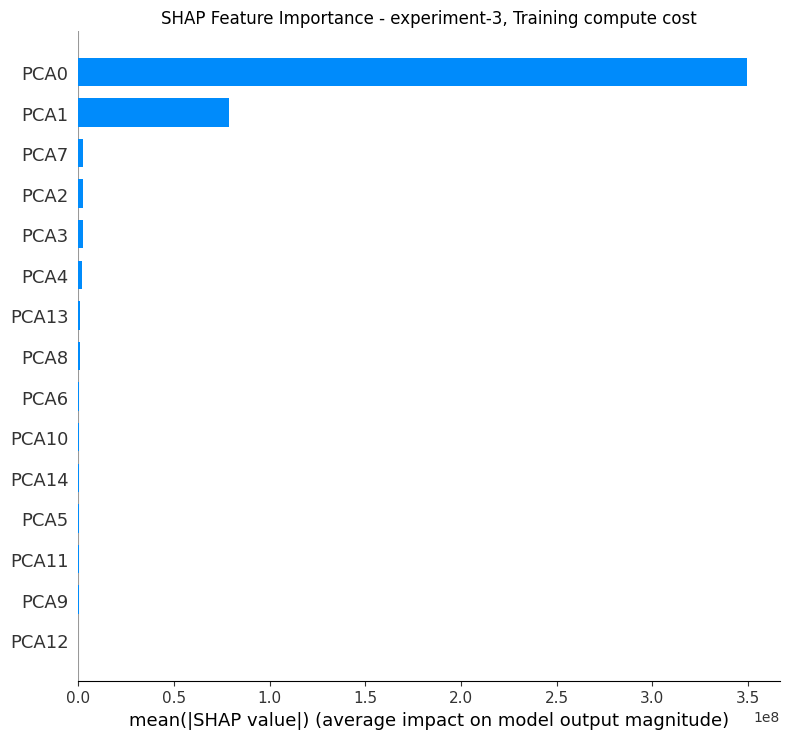

Computing LIME explanations for experiment-3, Training compute cost...
LIME failed for experiment-3, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-3, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-3, Training compute (FLOP)

Training model for: experiment-3, Finetune compute (FLOP)

Training model for: experiment-3, Power draw (W)

Training model for: experiment-3, Training compute cost
Computing SHAP values for experiment-3, Training compute cost...


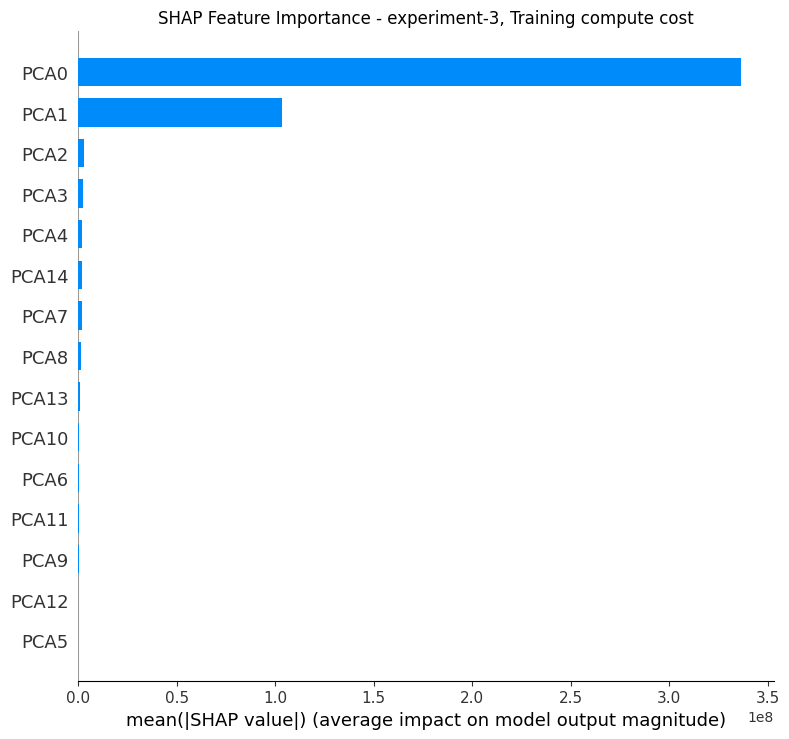

Computing LIME explanations for experiment-3, Training compute cost...
LIME failed for experiment-3, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-3, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-3, Training compute (FLOP)

Training model for: experiment-3, Finetune compute (FLOP)

Training model for: experiment-3, Power draw (W)

Training model for: experiment-3, Training compute cost
Computing SHAP values for experiment-3, Training compute cost...


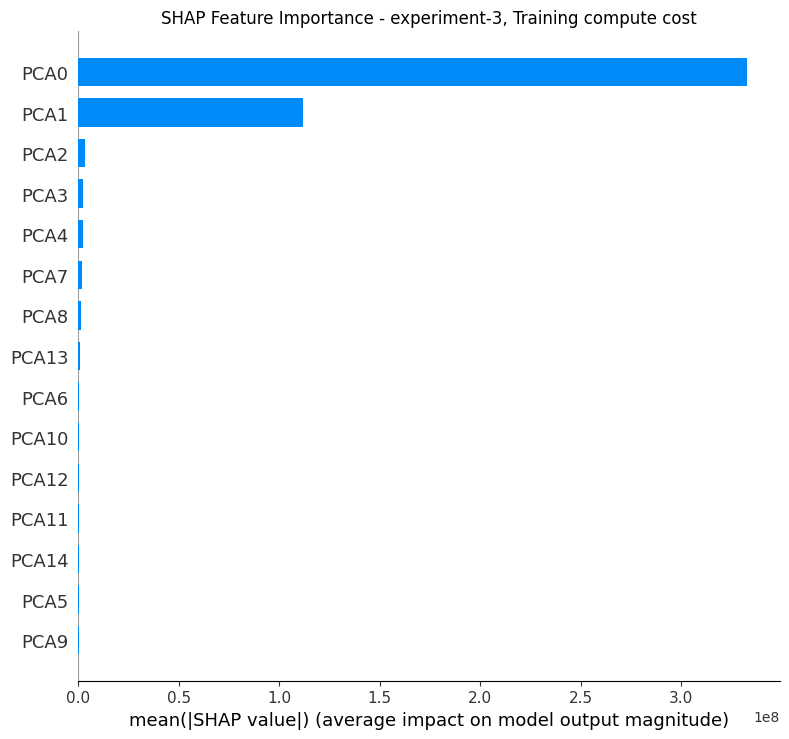

Computing LIME explanations for experiment-3, Training compute cost...
LIME failed for experiment-3, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-3, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-3, Training compute (FLOP)

Training model for: experiment-3, Finetune compute (FLOP)

Training model for: experiment-3, Power draw (W)

Training model for: experiment-3, Training compute cost
Computing SHAP values for experiment-3, Training compute cost...


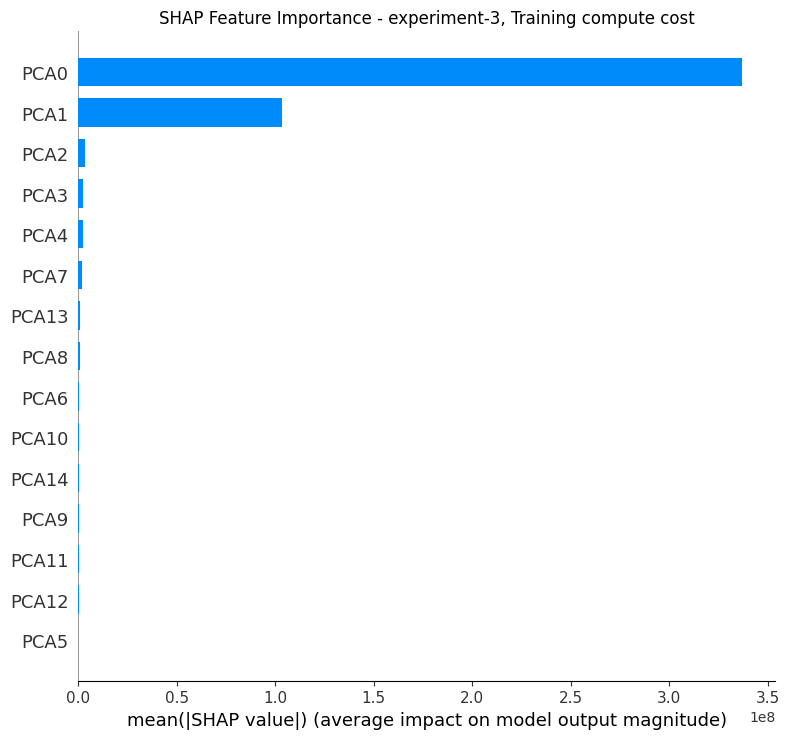

Computing LIME explanations for experiment-3, Training compute cost...
LIME failed for experiment-3, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Processing experiment-4...

Training model for: experiment-4, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-4, Training compute (FLOP)

Training model for: experiment-4, Finetune compute (FLOP)

Training model for: experiment-4, Power draw (W)

Training model for: experiment-4, Training compute cost
Computing SHAP values for experiment-4, Training compute cost...


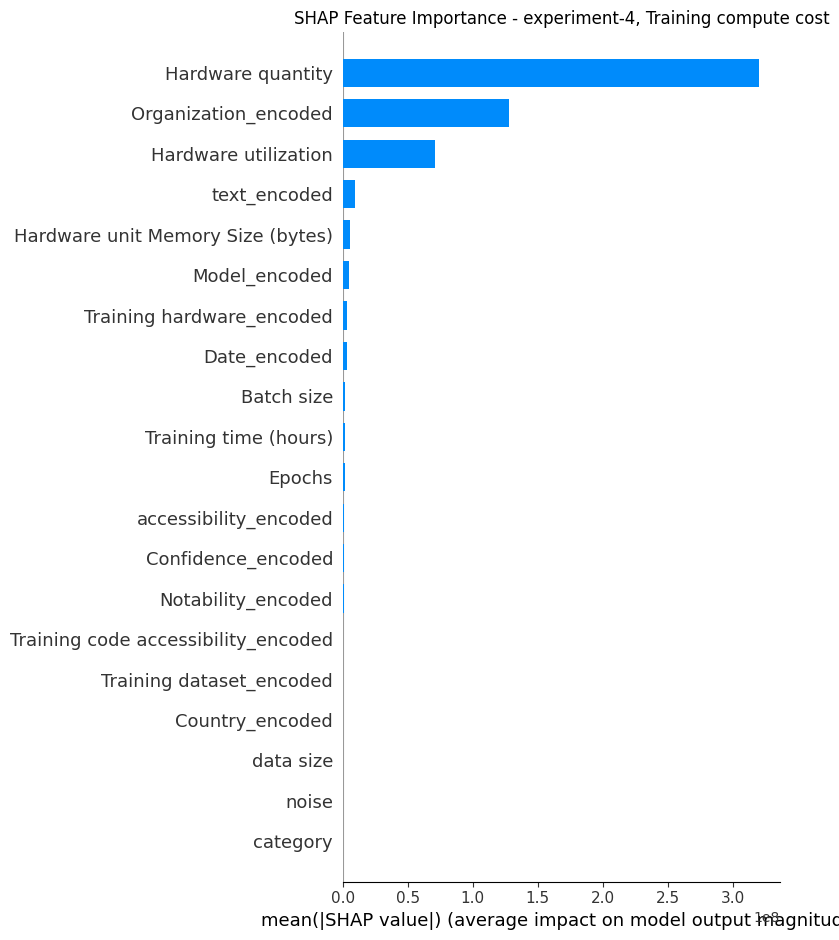

Computing LIME explanations for experiment-4, Training compute cost...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


LIME failed for experiment-4, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-4, Parameters

Training model for: experiment-4, Training compute (FLOP)

Training model for: experiment-4, Finetune compute (FLOP)

Training model for: experiment-4, Power draw (W)

Training model for: experiment-4, Training compute cost
Computing SHAP values for experiment-4, Training compute cost...


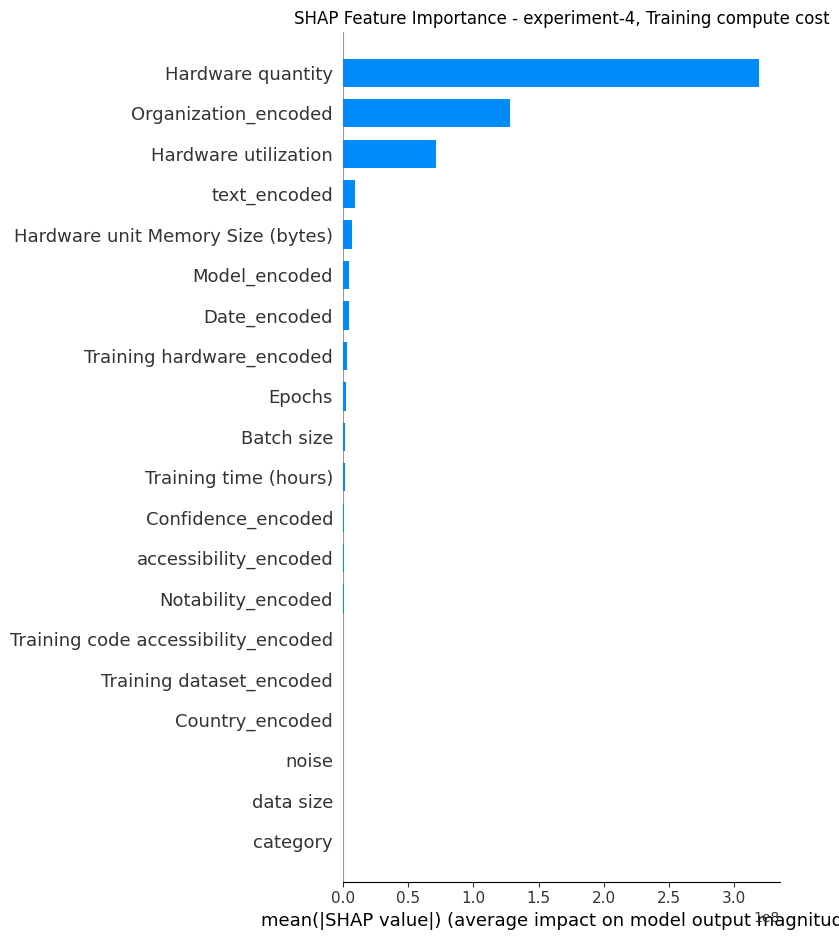

Computing LIME explanations for experiment-4, Training compute cost...
LIME failed for experiment-4, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-4, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-4, Training compute (FLOP)

Training model for: experiment-4, Finetune compute (FLOP)

Training model for: experiment-4, Power draw (W)

Training model for: experiment-4, Training compute cost
Computing SHAP values for experiment-4, Training compute cost...


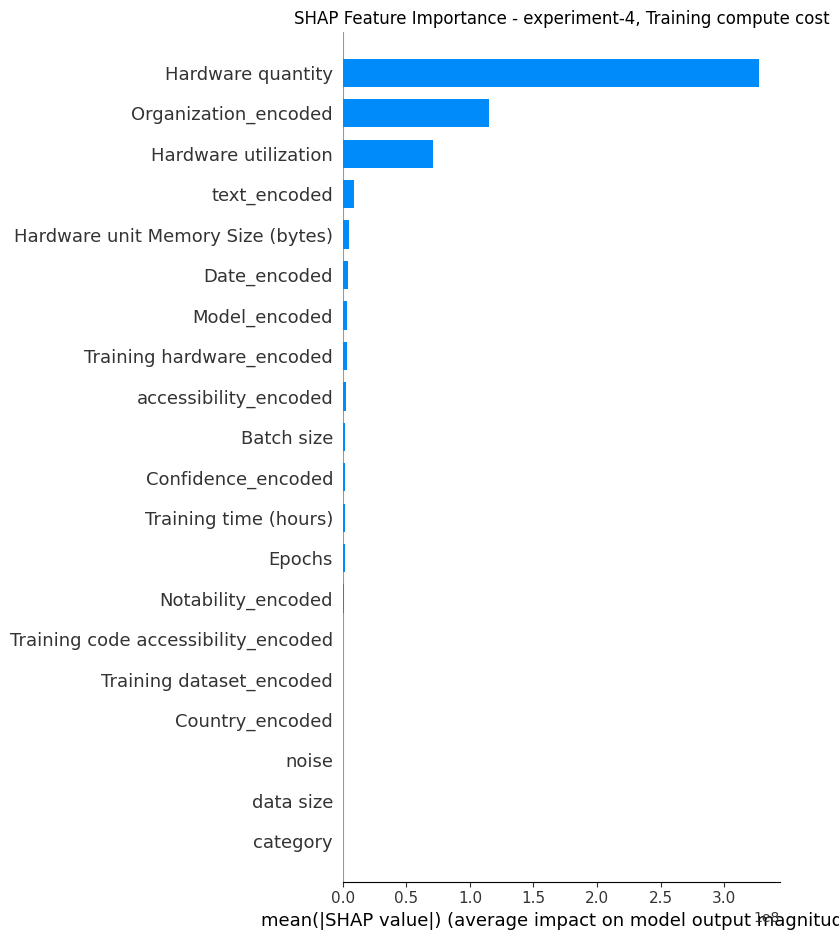

Computing LIME explanations for experiment-4, Training compute cost...
LIME failed for experiment-4, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-4, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-4, Training compute (FLOP)

Training model for: experiment-4, Finetune compute (FLOP)

Training model for: experiment-4, Power draw (W)

Training model for: experiment-4, Training compute cost
Computing SHAP values for experiment-4, Training compute cost...


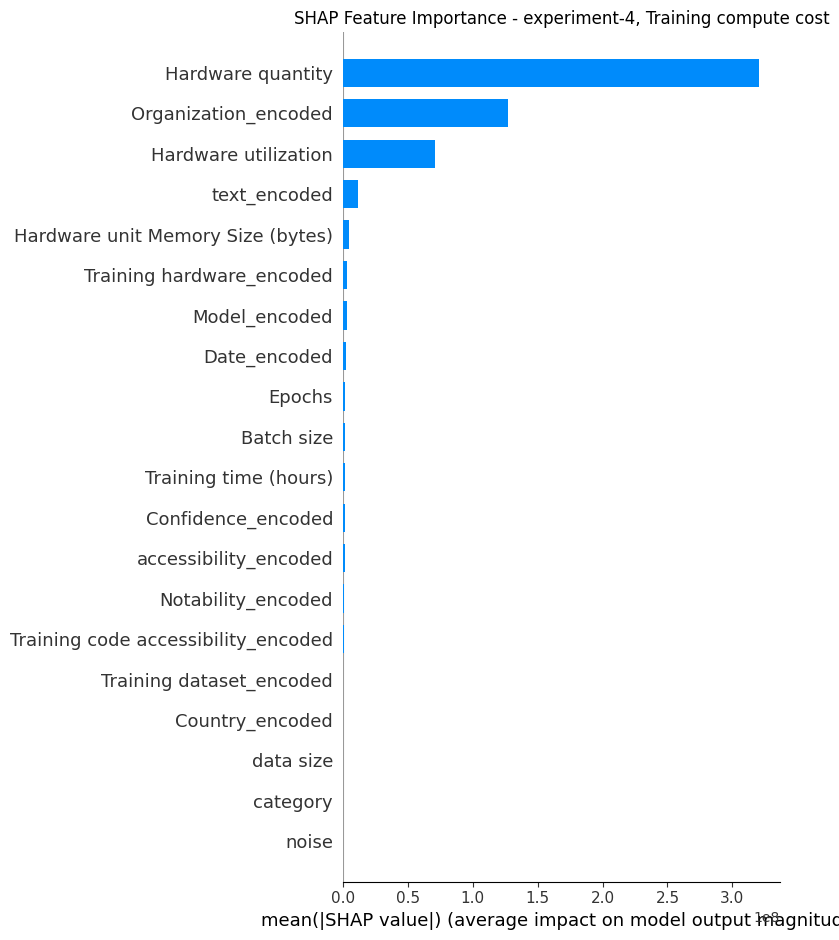

Computing LIME explanations for experiment-4, Training compute cost...
LIME failed for experiment-4, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Training model for: experiment-4, Parameters


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(



Training model for: experiment-4, Training compute (FLOP)

Training model for: experiment-4, Finetune compute (FLOP)

Training model for: experiment-4, Power draw (W)

Training model for: experiment-4, Training compute cost
Computing SHAP values for experiment-4, Training compute cost...


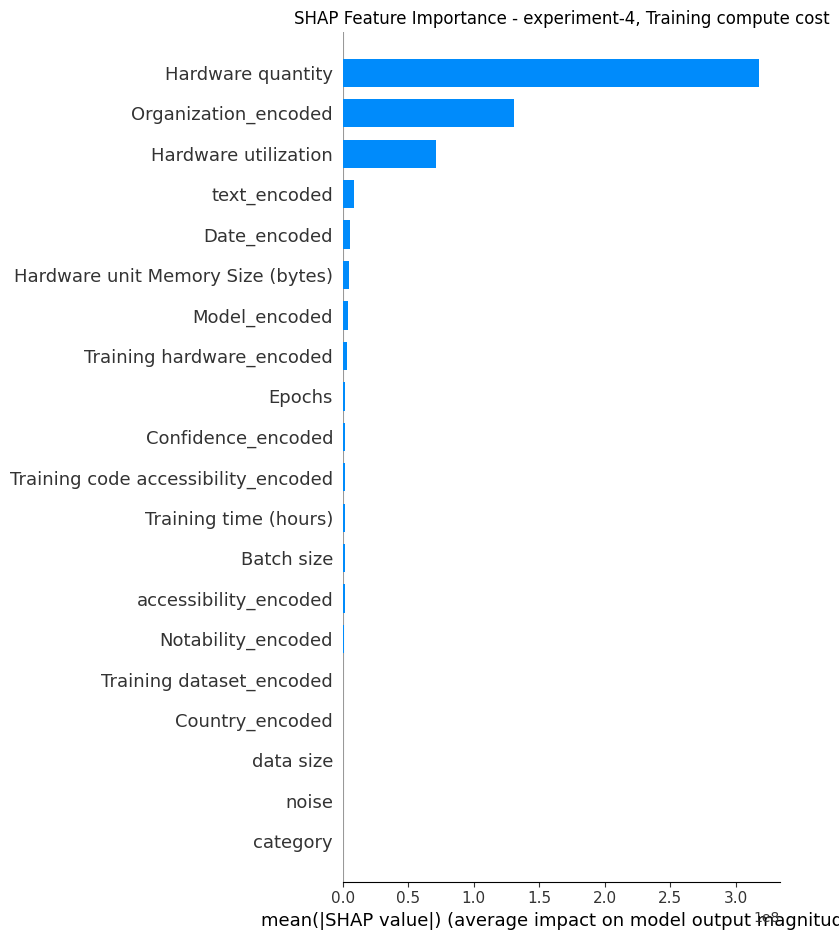

Computing LIME explanations for experiment-4, Training compute cost...
LIME failed for experiment-4, Training compute cost: TableDomainMapper.visualize_instance_html() got an unexpected keyword argument 'show'

Efficiency Results:
       Experiment            Output Column              Model  \
0        original               Parameters      Random Forest   
1        original  Training compute (FLOP)      Random Forest   
2        original  Finetune compute (FLOP)      Random Forest   
3        original           Power draw (W)      Random Forest   
4        original    Training compute cost      Random Forest   
..            ...                      ...                ...   
120  experiment-4               Parameters  Gradient Boosting   
121  experiment-4  Training compute (FLOP)  Gradient Boosting   
122  experiment-4  Finetune compute (FLOP)  Gradient Boosting   
123  experiment-4           Power draw (W)  Gradient Boosting   
124  experiment-4    Training compute cost  Gradient B

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


In [ ]:
import time
import json
import pandas as pd
import psutil
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
import shap
import lime
import lime.lime_tabular


# Your own data-loading logic for each experiment
def load_dataset_for_experiment(experiment_name):
    # Replace this with actual loading logic

    if experiment_name == "original":
        return df_org[org_num_cols], df[out_cols]
    elif experiment_name == "experiment-1":
        return df_exp1[exp1_cols], df_exp1[out_cols]
    elif experiment_name == "experiment-2":
        return df_exp2[exp2_cols], df_exp2[out_cols]
    elif experiment_name == "experiment-3":
        return df_exp3[exp3_cols], df_exp3[out_cols]
    elif experiment_name == "experiment-4":
        return df_exp4[exp4_cols], df_exp4[out_cols]
    else:
        raise ValueError(f"No dataset available for {experiment_name}")


# Load the best models from the JSON file
with open("hyperparameter_results.json", "r") as f:
    hyper_params = json.load(f)

# Define model mapping
model_map = {
    "SVR": SVR,
    "Gradient Boosting": GradientBoostingRegressor,
    "Random Forest": RandomForestRegressor,
    "Decision Tree": DecisionTreeRegressor,
    "Linear Regression": LinearRegression,
    "Ridge": Ridge,
    "Lasso": Lasso
}

# Lists to store results
efficiency_results = []
interpretability_results = []

for exp_name, models in hyper_params.items():
    print(f"\nProcessing {exp_name}...")

    # Load dataset for this experiment
    X, y = load_dataset_for_experiment(exp_name)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Iterate over each output column
    for output_col in y.columns:
        # Find best model for this output column based on R2
        best_model = None
        best_r2 = float('-inf')
        best_params = None
        model_name = None

        for m_name, m_data in models.items():
            r2_score = m_data.get("best_r2_score", float('-inf'))
            if r2_score > best_r2:
                best_r2 = r2_score
                model_name = m_name
                best_params = m_data.get("best_parameters", {})

        if model_name is None:
            print(f"No valid model found for {exp_name}")
            continue

        model_class = model_map[model_name]
        model = model_class(**best_params)

        # Train and evaluate for each output column individually
        for output_col in y.columns:
            print(f"\nTraining model for: {exp_name}, {output_col}")

            # Train/test split
            X_train, X_test, y_train, y_test = train_test_split(X, y[output_col], test_size=0.2, random_state=42)

            # Resource tracking
            process = psutil.Process()
            start_mem = process.memory_info().rss / (1024 ** 2)
            start_time = time.time()

            model.fit(X_train, y_train)

            training_time = time.time() - start_time
            end_mem = process.memory_info().rss / (1024 ** 2)

            # Inference
            start_pred = time.time()
            _ = model.predict(X_test)
            inference_time = time.time() - start_pred

            efficiency_results.append({
                "Experiment": exp_name,
                "Output Column": output_col,
                "Model": model_name,
                "Training Time (s)": round(training_time, 4),
                "Inference Time (s)": round(inference_time, 4),
                "Memory Used (MB)": round(end_mem - start_mem, 2)
            })

        # SHAP Analysis
        print(f"Computing SHAP values for {exp_name}, {output_col}...")
        try:
            # Use TreeExplainer for tree-based models, KernelExplainer for others
            if model_name in ["Random Forest", "Gradient Boosting", "Decision Tree"]:
                explainer = shap.TreeExplainer(model)
            else:
                explainer = shap.KernelExplainer(model.predict, X_train)

            shap_values = explainer.shap_values(X_test)

            # Compute global feature importance (mean absolute SHAP values)
            shap_importance = np.abs(shap_values).mean(axis=0)
            feature_importance = dict(zip(X.columns, shap_importance))
            top_features = sorted(feature_importance.items(), key=lambda x: x[1], reverse=True)[:3]

            # Store SHAP results
            interpretability_results.append({
                "Experiment": exp_name,
                "Output Column": output_col,
                "Method": "SHAP",
                "Top Features": top_features
            })

            # Visualize SHAP summary plot (optional)
            plt.figure()
            shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
            plt.title(f"SHAP Feature Importance - {exp_name}, {output_col}")
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"SHAP failed for {exp_name}, {output_col}: {str(e)}")

        # LIME Analysis
        print(f"Computing LIME explanations for {exp_name}, {output_col}...")
        try:
            # Create LIME explainer
            lime_explainer = lime.lime_tabular.LimeTabularExplainer(
                X_train.values,
                feature_names=X.columns,
                mode="regression"
            )

            # Pick a few test instances to explain
            instance_idx = 0  # First test instance
            lime_exp = lime_explainer.explain_instance(
                X_test.iloc[instance_idx].values,
                model.predict,
                num_features=3
            )

            # Extract top features from LIME
            lime_features = lime_exp.as_list()[:3]  # Top 3 features

            # Store LIME results
            interpretability_results.append({
                "Experiment": exp_name,
                "Output Column": output_col,
                "Method": "LIME",
                "Top Features (Instance 0)": lime_features
            })

            # Visualize LIME explanation (optional)
            lime_exp.show_in_notebook(show=False)  # Works in Jupyter; use lime_exp.as_pyplot_figure() for non-Jupyter

        except Exception as e:
            print(f"LIME failed for {exp_name}, {output_col}: {str(e)}")

# Efficiency table
df_efficiency = pd.DataFrame(efficiency_results)
print("\nEfficiency Results:")
print(df_efficiency)

# Interpretability table
df_interpretability = pd.DataFrame(interpretability_results)
print("\nInterpretability Results:")
print(df_interpretability)

In [ ]:
df_interpretability

,Experiment,Output Column,Method,Top Features,Top Features (Instance 0)
0,original,Training compute cost,SHAP,"[(Hardware quantity, 261283832.6732341), (Orga...",NaN
1,original,Training compute cost,LIME,NaN,"[(13760.00 < Hardware quantity <= 57000.00, 39..."
2,original,Training compute cost,SHAP,"[(Organization_encoded, 254927881.17643264), (...",NaN
3,original,Training compute cost,LIME,NaN,"[(13760.00 < Hardware quantity <= 57000.00, 40..."
4,original,Training compute cost,SHAP,"[(Organization_encoded, 265040161.4640259), (H...",NaN
5,original,Training compute cost,LIME,NaN,"[(13760.00 < Hardware quantity <= 57000.00, 42..."
6,original,Training compute cost,SHAP,"[(Organization_encoded, 265255365.84629935), (...",NaN
7,original,Training compute cost,LIME,NaN,"[(13760.00 < Hardware quantity <= 57000.00, 42..."
8,original,Training compute cost,SHAP,"[(Organization_encoded, 272824908.12410843), (...",NaN
9,original,Training compute cost,LIME,NaN,"[(13760.00 < Hardware quantity <= 57000.00, 40..."


Not much change is observed, original model is more interpretable compared to other
Hardware quantity is infuencing the output more, kind of unexpected

## Experiment 6

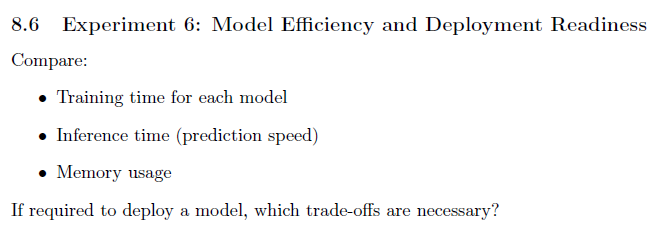

In [ ]:
import time
import json
import pandas as pd
import psutil
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor

# Your own data-loading logic for each experiment
def load_dataset_for_experiment(experiment_name):
    # Replace this with actual loading logic

    if experiment_name == "original":
        return df_org[org_num_cols],df[out_cols]
    elif experiment_name == "experiment-1":
        return df_exp1[exp1_cols],df_exp1[out_cols]
    elif experiment_name == "experiment-2":
        return df_exp2[exp2_cols],df_exp2[out_cols]
    elif experiment_name == "experiment-3":
        return df_exp3[exp3_cols],df_exp3[out_cols]
    elif experiment_name == "experiment-4":
        return df_exp4[exp4_cols],df_exp4[out_cols]
    else:
        raise ValueError(f"No dataset available for {experiment_name}")

# Load the best models from the JSON file
with open("hyperparameter_results.json", "r") as f:
    hyper_params = json.load(f)

# Define model mapping
model_map = {
    "SVR": SVR,
    "Gradient Boosting": GradientBoostingRegressor,
    "Random Forest": RandomForestRegressor,
    "Decision Tree": DecisionTreeRegressor,
    "Linear Regression": LinearRegression,
    "Ridge": Ridge,
    "Lasso": Lasso
}

results = []

for exp_name, models in hyper_params.items():
    # Load dataset for this experiment
    X, y = load_dataset_for_experiment(exp_name)
    X_train, X_test, y_train, y_test = train_test_split(X, y.iloc[:,0], test_size=0.2, random_state=42)

    # Find best model
    best_model = max(models.items(), key=lambda x: x[1]["best_r2_score"])
    model_name, model_data = best_model

    # Build model
    params = model_data["best_parameters"]
    model_class = model_map[model_name]
    model = model_class(**params)

    # Track memory before training
    process = psutil.Process()
    start_mem = process.memory_info().rss / (1024 ** 2)
    start_time = time.time()

    model.fit(X_train, y_train)

    training_time = time.time() - start_time
    end_mem = process.memory_info().rss / (1024 ** 2)

    # Inference time
    start_pred = time.time()
    _ = model.predict(X_test)
    inference_time = time.time() - start_pred

    results.append({
        "Experiment": exp_name,
        "Model": model_name,
        "Training Time (s)": round(training_time, 4),
        "Inference Time (s)": round(inference_time, 4),
        "Memory Used (MB)": round(end_mem - start_mem, 2)
    })

# Final table
df_efficiency = pd.DataFrame(results)
print(df_efficiency)


     Experiment              Model  Training Time (s)  Inference Time (s)  \
0      original      Random Forest             0.1162              0.0040   
1  experiment-1  Gradient Boosting             0.2501              0.0019   
2  experiment-2  Gradient Boosting             1.9353              0.0024   
3  experiment-3  Gradient Boosting             0.2863              0.0017   
4  experiment-4  Gradient Boosting             0.9618              0.0026   

   Memory Used (MB)  
0               0.0  
1               0.0  
2               0.0  
3               0.0  
4               0.0  


By reducing the features, we can improve the memory and time to deploy the model

## 9 Results and Observations

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import json
result_path = "hyperparameter_results.json"
with open(result_path, 'r') as f:
    json_data = json.load(f)

In [ ]:
def get_best_models_by_experiment(hyper_params_dict):
    best_models = {}

    for experiment, models in hyper_params_dict.items():
        best_model = None
        best_score = float('-inf')

        for model_name, model_info in models.items():
            r2_score = model_info.get("best_r2_score", float('-inf'))
            if r2_score > best_score:
                best_score = r2_score
                best_model = model_name

        best_models[experiment] = {
            "model": best_model,
            "best_r2_score": best_score
        }

    return best_models

In [ ]:
results = get_best_models_by_experiment(json_data)
print(results)

{'original': {'model': 'Random Forest', 'best_r2_score': 0.9482369026340054}, 'experiment-1': {'model': 'Gradient Boosting', 'best_r2_score': 0.9258474065837645}, 'experiment-2': {'model': 'Gradient Boosting', 'best_r2_score': 0.9225521444477781}, 'experiment-3': {'model': 'Gradient Boosting', 'best_r2_score': 0.8858296007891167}, 'experiment-4': {'model': 'Gradient Boosting', 'best_r2_score': 0.9476606282941604}}


In [ ]:
import pandas as pd
import json

def get_best_models_table(hyper_params_dict):
    records = []

    for experiment, models in hyper_params_dict.items():
        best_model = None
        best_score = float('-inf')

        for model_name, model_info in models.items():
            r2_score = model_info.get("best_r2_score", float('-inf'))
            if r2_score > best_score:
                best_model = model_name
                best_score = r2_score

        records.append({
            "Experiment": experiment,
            "Best Model": best_model,
            "R-squared Score": best_score
        })

    return pd.DataFrame(records)

# Load JSON file
with open("hyperparameter_results.json", "r") as f:
    hyper_params = json.load(f)

# Create and display the DataFrame
df_best_models = get_best_models_table(hyper_params)
print(df_best_models)


     Experiment         Best Model  R-squared Score
0      original      Random Forest         0.948237
1  experiment-1  Gradient Boosting         0.925847
2  experiment-2  Gradient Boosting         0.922552
3  experiment-3  Gradient Boosting         0.885830
4  experiment-4  Gradient Boosting         0.947661


## 10 Final Model Improvements

Based on the experimental results across five different setups, the Gradient Boosting Regressor emerges as the most consistently high-performing model. It was the best model in four out of five experiments, achieving R-squared scores above 0.88 in each case. The highest R² score of 0.9482 was observed with the Random Forest Regressor in the original experiment. However, considering consistency, performance across varied feature engineering strategies, and robustness, Gradient Boosting is the most reliable choice overall.

Gradient Boosting combines the strength of multiple weak learners to minimize errors iteratively, which allows it to capture complex nonlinear relationships in the data effectively. Its superior generalization capability and tunable nature make it well-suited for our multi-output regression task.

If more time were available, further improvements could include:

    Ensemble blending of Random Forest and Gradient Boosting for performance gains.

    Automated hyperparameter optimization using Bayesian or genetic algorithms.

    Dimensionality reduction or feature selection based on SHAP/LIME for interpretability and reduced overfitting.

    Cross-validation across multiple random splits to ensure stability of the results.

These refinements could help in enhancing both the accuracy and efficiency of the final deployed model.

## 11 Final Thoughts

This project has provided a comprehensive hands-on experience with multiple regression models, offering valuable insights into their relative performance, scalability, and interpretability. While metrics like R-squared scores were crucial for quantitative evaluation, the key learning extended beyond numerical results.

One major realization was the importance of model consistency across experiments. Although Random Forest achieved the highest R² in the original setup, Gradient Boosting stood out as the most dependable performer across diverse datasets. This highlighted how model robustness and adaptability often matter more than isolated peak performance.

Additionally, experimenting with model interpretability tools like SHAP and LIME deepened my understanding of feature influence and model decision-making. These tools helped bridge the gap between black-box predictions and human reasoning, especially when validating model trustworthiness.

Another important takeaway was how hyperparameter tuning and data preprocessing significantly affect outcomes. Small changes in learning rate or max depth led to noticeable shifts in performance, emphasizing the need for careful experimentation.

If I were to continue this work, I would explore ensemble stacking, advanced automated tuning (e.g., Optuna or Bayesian methods), and cross-validation across multiple seeds to further validate model stability. I’d also investigate dimensionality reduction techniques to simplify models without losing predictive power.

Overall, this project strengthened my practical understanding of machine learning, the trade-offs between model complexity and interpretability, and the iterative nature of building reliable AI systems.